In [2]:


import numpy as np
import pandas as pd
import os
from pathlib import Path
from dotenv import load_dotenv
import re
import platform
import pymssql  # вместо pyodbc
from datetime import datetime, timedelta

# Загружаем переменные из .env файла
load_dotenv('/home/jovyan/work/.env')

class DatabaseChecker:
    """Класс для изъятия цен на прошедшие продажи из БД"""

    def __init__(self, use_sa_login=True):
        """
        use_sa_login: если True, использует SQL-логин (sa)
                     если False, использует доменную аутентификацию (только для Windows)
        """
        # Определяем, где мы запущены
        self.is_windows = platform.system() == 'Windows'
        self.is_linux = platform.system() == 'Linux'

        # Берем настройки из .env или используем значения по умолчанию
        self.db_host = os.getenv("DB_HOST", "172.16.0.108")
        self.db_name = os.getenv("DB_NAME", "ВитринаДанных")

        if self.is_linux or use_sa_login:
            # В контейнере используем SQL-логин (sa)
            self.db_user = os.getenv("DB_USER", "sa")
            self.db_password = os.getenv("DB_PASSWORD", "sasa")
            self.auth_type = "SQL логин"
        else:
            # На Windows (локально) оставляем доменную аутентификацию
            self.db_user = None
            self.db_password = None
            self.auth_type = "Windows аутентификация"

        print(f" Подключение через {self.auth_type}")
        print(f"   Сервер: {self.db_host}/{self.db_name}")
        if self.db_user:
            print(f"   Пользователь: {self.db_user}")

        # Не создаём engine заранее, будем создавать подключение при каждом запросе
        self.connection = None

    def get_connection(self):
        """Создаёт подключение к БД"""
        if self.is_windows and not self.db_user:
            # Для Windows с доменной аутентификацией
            import pyodbc
            conn_str = (
                f"DRIVER={os.getenv('DB_DRIVER', 'SQL Server')};"
                f"SERVER={self.db_host};"
                f"DATABASE={self.db_name};"
                f"Trusted_Connection=yes;"
                f"Connection Timeout=120;"
            )
            return pyodbc.connect(conn_str)
        else:
            # Для Linux или SQL-логина
            return pymssql.connect(
                server=self.db_host,
                user=self.db_user,
                password=self.db_password,
                database=self.db_name,
                timeout=120,
                login_timeout=120,
                charset='UTF-8'
            )

    def get_sales_data(self, name=None, years_back=1, limit=50000) -> pd.DataFrame:
        """Получает детальные данные по продажам для указанной номенклатуры"""
        from datetime import datetime, timedelta
        timeout_seconds = 120
        cutoff_date = datetime.now() - timedelta(days=years_back*365)

        if name is None:
            name = input("Название номенклатуры: ")

        try:
            # ДЕТАЛЬНЫЙ ЗАПРОС (без GROUP BY, с городами)
            query = """
            SELECT nomenklatura._Description as [Номенклатура],
                DATEADD(year, -2000, [Дата]) as [Дата],
                [Количество],
                [Цена],
                [Сумма],
                [НДС],
                kontrag._Description as [Контрагент],
                organ._Description as [Организация],
                SSO._description as [город]
            FROM [ВитринаДанных].[dbo].[ПродажиПервичные] as vypuskProduktNakoplenie
            inner join [onec-9].upp_2012.dbo._Reference154 as nomenklatura
                on nomenklatura._Idrref = vypuskProduktNakoplenie.[НоменклатураИД]
            left join [onec-9].upp_2012.dbo._Reference124 as kontrag
                on kontrag._Idrref = vypuskProduktNakoplenie.[КонтрагентИД]
            left join [onec-9].upp_2012.dbo._Reference164 as organ
                on organ._Idrref = vypuskProduktNakoplenie.[ОрганизацияИД]
            left join [onec-9].upp_2012.dbo._InfoRg19780 as zna4svoy
                on zna4svoy._fld19781_RRRef = vypuskProduktNakoplenie.[ОрганизацияИД]
            left join [onec-9].upp_2012.dbo._InfoRg19780 as obect
                on obect._fld19781_rrref = kontrag._idrref
            left join [onec-9].upp_2012.dbo._Chrc1140 as svoystvoOB
                on svoystvoOB._idrref = obect._fld19782rref
            left join [onec-9].upp_2012.dbo._reference97 as SSO
                on SSO._idrref = obect._fld19783_rrref
            WHERE nomenklatura._Description = %s
                and DATEADD(year, -2000, [Дата]) > %s
                and svoystvoOB._description like '%Населенный пункт%'
            ORDER BY [Дата] DESC
            """

            conn = self.get_connection()
            df = pd.read_sql(query, conn, params=(name, cutoff_date))
            conn.close()

            if len(df) > 0:
                print(f"\n Найдено {len(df)} записей для '{name}'")
                print(f"   Период: с {df['Дата'].min()} по {df['Дата'].max()}")
                return df
            else:
                print(f" Нет данных для '{name}'")
                return pd.DataFrame()

        except Exception as e:
            print(f" Ошибка запроса: {e}")
            return pd.DataFrame()

    def save_to_csv(self, df: pd.DataFrame, filename: str = None) -> str:
        """Сохраняет DataFrame в CSV с безопасным именем"""
        if df.empty:
            print(" Нет данных для сохранения")
            return None

        if filename is None:
            # Очищаем название от недопустимых символов
            item_name = df['Номенклатура'].iloc[0] if not df.empty else "data"
            safe_name = re.sub(r'[<>:"/\\|?*%\'"]', '_', item_name)
            safe_name = safe_name[:50]
            # Сохраняем в папку data, которая примонтирована
            filename = f"/home/jovyan/work/data/raw/{safe_name}_sales_{pd.Timestamp.now().strftime('%Y%m%d_%H%M%S')}.csv"

        # Создаем папку, если её нет
        os.makedirs(os.path.dirname(filename), exist_ok=True)

        df.to_csv(filename, index=False, sep=';', encoding='utf-8-sig')
        abs_path = os.path.abspath(filename)
        print(f"\n Данные сохранены в файл: {filename}")
        print(f"   Путь: {abs_path}")
        return filename

    def get_products_with_min_records(self, min_records=300, years_back=1):
        """
        Получает список товаров с количеством записей не меньше min_records
        Возвращает DataFrame с колонками: Номенклатура, записей, сумма, первая_дата, последняя_дата
        """
        from datetime import datetime, timedelta

        cutoff_date = (datetime.now() - timedelta(days=years_back*365)).strftime('%Y-%m-%d')

        query = """
        SELECT 
            nomenklatura._Description as [Номенклатура],
            COUNT(*) as [Количество_записей],
            SUM([Сумма]) as [Общая_сумма],
            MIN(DATEADD(year, -2000, [Дата])) as [Первая_продажа],
            MAX(DATEADD(year, -2000, [Дата])) as [Последняя_продажа]
        FROM [ВитринаДанных].[dbo].[ПродажиПервичные] as vypuskProduktNakoplenie
        inner join [onec-9].upp_2012.dbo._Reference154 as nomenklatura
            on nomenklatura._Idrref = vypuskProduktNakoplenie.[НоменклатураИД]
        WHERE DATEADD(year, -2000, [Дата]) > %s
        GROUP BY nomenklatura._Description
        HAVING COUNT(*) >= %s
        ORDER BY COUNT(*) DESC
        """

        conn = self.get_connection()
        df = pd.read_sql(query, conn, params=(cutoff_date, min_records))
        conn.close()

        print(f" Найдено {len(df)} товаров с >= {min_records} записями")
        return df

    def get_detailed_sales_data(self, name=None, years_back=1, limit=50000) -> pd.DataFrame:
    """Получает ДЕТАЛЬНЫЕ данные по продажам для указанной номенклатуры"""
        from datetime import datetime, timedelta
        
        cutoff_date = datetime.now() - timedelta(days=years_back*365)
    
        if name is None:
            name = input("Название номенклатуры: ")
    
        try:
            query = """
            SELECT TOP %s nomenklatura._Description as [Номенклатура],
                DATEADD(year, -2000, [Дата]) as [Дата],
                [Количество],
                [Цена],
                [Сумма],
                [НДС],
                kontrag._Description as [Контрагент],
                organ._Description as [Организация],
                SSO._description as [город]
            FROM [ВитринаДанных].[dbo].[ПродажиПервичные] as vypuskProduktNakoplenie
            inner join [onec-9].upp_2012.dbo._Reference154 as nomenklatura
                on nomenklatura._Idrref = vypuskProduktNakoplenie.[НоменклатураИД]
            left join [onec-9].upp_2012.dbo._Reference124 as kontrag
                on kontrag._Idrref = vypuskProduktNakoplenie.[КонтрагентИД]
            left join [onec-9].upp_2012.dbo._Reference164 as organ
                on organ._Idrref = vypuskProduktNakoplenie.[ОрганизацияИД]
            left join [onec-9].upp_2012.dbo._InfoRg19780 as zna4svoy
                on zna4svoy._fld19781_RRRef = vypuskProduktNakoplenie.[ОрганизацияИД]
            left join [onec-9].upp_2012.dbo._InfoRg19780 as obect
                on obect._fld19781_rrref = kontrag._idrref
            left join [onec-9].upp_2012.dbo._Chrc1140 as svoystvoOB
                on svoystvoOB._idrref = obect._fld19782rref
            left join [onec-9].upp_2012.dbo._reference97 as SSO
                on SSO._idrref = obect._fld19783_rrref
            WHERE nomenklatura._Description = %s
                and DATEADD(year, -2000, [Дата]) > %s
                and svoystvoOB._description like '%Населенный пункт%'
            ORDER BY [Дата] DESC
            """
    
            conn = self.get_connection()
            df = pd.read_sql(query, conn, params=(limit, name, cutoff_date))
            conn.close()
    
            if len(df) > 0:
                print(f"\n Найдено {len(df)} детальных записей для '{name}'")
                return df
            else:
                print(f" Нет данных для '{name}'")
                return pd.DataFrame()
    
        except Exception as e:
            print(f" Ошибка запроса: {e}")
            return pd.DataFrame()

In [30]:
from clickhouse_driver import Client
ch_client = Client(host='my_clickhouse', port=9000, user='default', password='')

# Проверяем, какие базы данных есть
print(" БАЗЫ ДАННЫХ:")
dbs = ch_client.execute("SHOW DATABASES")
for db in dbs:
    print(f"   - {db[0]}")

# Проверяем, какие таблицы в external_data
print("\n ТАБЛИЦЫ В external_data:")
tables = ch_client.execute("SHOW TABLES FROM external_data")
for table in tables:
    print(f"   - {table[0]}")

# Если sales_raw нет, создадим её прямо сейчас
if ('sales_raw',) not in tables:
    print("\n Таблица sales_raw не найдена! Создаем...")
    
    # Убедимся, что база external_data существует
    ch_client.execute("CREATE DATABASE IF NOT EXISTS external_data")
    
    # Создаем таблицу
    ch_client.execute("""
    CREATE TABLE external_data.sales_raw
    (
        `Номенклатура` String,
        `Дата` DateTime,
        `Количество` Float64,
        `Цена` Float64,
        `Сумма` Float64,
        `НДС` Float64,
        `Контрагент` String,
        `Организация` String,
        `город` String
    ) ENGINE = MergeTree()
    ORDER BY (`Дата`)
    """)
    print(" Таблица sales_raw создана")
    
    # Проверим еще раз
    tables = ch_client.execute("SHOW TABLES FROM external_data")
    print("\n ТАБЛИЦЫ ПОСЛЕ СОЗДАНИЯ:")
    for table in tables:
        print(f"   - {table[0]}")
else:
    print("\n Таблица sales_raw уже существует")

 БАЗЫ ДАННЫХ:
   - INFORMATION_SCHEMA
   - default
   - external_data
   - information_schema
   - system

 ТАБЛИЦЫ В external_data:
   - demographic_data
   - inflation_monthly
   - inflation_yearly
   - macro_monthly
   - median_salaries_regional
   - municipal_salaries_detailed
   - regional_salary_ratio
   - salary_groups
   - salary_growth
   - sales_raw
   - weather_hourly

 Таблица sales_raw уже существует


In [29]:
# ЯЧЕЙКА 1: Перезагрузка класса (если нужно)
import importlib
import database_checker

importlib.reload(database_checker)
from database_checker import DatabaseChecker
checker = DatabaseChecker(use_sa_login=True)
print(" Класс перезагружен")

 Товаров с >=300 записями: 0
 Подключение через SQL логин
   Сервер: 172.16.0.108/ВитринаДанных
   Пользователь: sa
 Класс перезагружен


In [31]:
# ЯЧЕЙКА 2: Функция для выгрузки и загрузки
def load_all_sales_to_clickhouse(years_back=1):
    """Выгружает ВСЕ продажи за период и сохраняет в ClickHouse"""
    from datetime import datetime, timedelta
    from clickhouse_driver import Client
    import pandas as pd

    cutoff_date = datetime.now() - timedelta(days=years_back*365)

    query = """
    SELECT 
        nomenklatura._Description as [Номенклатура],
        DATEADD(year, -2000, [Дата]) as [Дата],
        [Количество],
        [Цена],
        [Сумма],
        [НДС],
        kontrag._Description as [Контрагент],
        organ._Description as [Организация],
        SSO._description as [город]
    FROM [ВитринаДанных].[dbo].[ПродажиПервичные] as vypuskProduktNakoplenie
    inner join [onec-9].upp_2012.dbo._Reference154 as nomenklatura
        on nomenklatura._Idrref = vypuskProduktNakoplenie.[НоменклатураИД]
    left join [onec-9].upp_2012.dbo._Reference124 as kontrag
        on kontrag._Idrref = vypuskProduktNakoplenie.[КонтрагентИД]
    left join [onec-9].upp_2012.dbo._Reference164 as organ
        on organ._Idrref = vypuskProduktNakoplenie.[ОрганизацияИД]
    left join [onec-9].upp_2012.dbo._InfoRg19780 as zna4svoy
        on zna4svoy._fld19781_RRRef = vypuskProduktNakoplenie.[ОрганизацияИД]
    left join [onec-9].upp_2012.dbo._InfoRg19780 as obect
        on obect._fld19781_rrref = kontrag._idrref
    left join [onec-9].upp_2012.dbo._Chrc1140 as svoystvoOB
        on svoystvoOB._idrref = obect._fld19782rref
    left join [onec-9].upp_2012.dbo._reference97 as SSO
        on SSO._idrref = obect._fld19783_rrref
    WHERE DATEADD(year, -2000, [Дата]) > %s
        and svoystvoOB._description like '%Населенный пункт%'
    ORDER BY [Дата] DESC
    """

    conn = checker.get_connection()
    print(" Выгружаем все данные из MSSQL...")

    # Загружаем порциями
    chunks = []
    for chunk in pd.read_sql(query, conn, params=(cutoff_date,), chunksize=50000):
        chunks.append(chunk)
        print(f"   Загружено {len(chunk)} записей...")

    df_all = pd.concat(chunks, ignore_index=True)
    conn.close()

    print(f"\n Всего выгружено: {len(df_all)} записей")

    # Подключаемся к ClickHouse
    client = Client(host='my_clickhouse', port=9000, user='default', password='')

    # Загружаем данные
    data_to_insert = [tuple(x) for x in df_all.to_numpy()]
    
    print(f" Загружаем {len(data_to_insert)} записей в ClickHouse...")
    client.execute("INSERT INTO external_data.sales_raw VALUES", data_to_insert)

    print(f" Данные сохранены в ClickHouse")
    return df_all

In [32]:
# ЯЧЕЙКА 3: ВЫПОЛНЯЕМ ВЫГРУЗКУ (это может занять время)
df_all = load_all_sales_to_clickhouse(years_back=1)
print(f" Загружено {len(df_all)} записей")

# ЯЧЕЙКА 4: Проверяем результат
from clickhouse_driver import Client
ch_client = Client(host='my_clickhouse', port=9000, user='default', password='')

# Проверяем количество записей
count = ch_client.execute("SELECT COUNT(*) FROM external_data.sales_raw")[0][0]
print(f" Всего записей в sales_raw: {count}")

# Проверяем первые несколько
sample = ch_client.execute("SELECT * FROM external_data.sales_raw LIMIT 5")
print("\n Пример данных:")
for row in sample:
    print(f"   {row[:2]}...")  # покажем только первые 2 колонки

 Выгружаем все данные из MSSQL...


/tmp/ipykernel_14348/2790480.py:46: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  for chunk in pd.read_sql(query, conn, params=(cutoff_date,), chunksize=50000):


   Загружено 50000 записей...
   Загружено 50000 записей...
   Загружено 50000 записей...
   Загружено 50000 записей...
   Загружено 50000 записей...
   Загружено 50000 записей...
   Загружено 50000 записей...
   Загружено 50000 записей...
   Загружено 50000 записей...
   Загружено 50000 записей...
   Загружено 50000 записей...
   Загружено 8716 записей...

 Всего выгружено: 558716 записей
 Загружаем 558716 записей в ClickHouse...
 Данные сохранены в ClickHouse
 Загружено 558716 записей
 Всего записей в sales_raw: 558716

 Пример данных:
   ('Сыр ломт.сол.Ашан.40%.Дружба.80г.фол.20шт', datetime.datetime(2025, 3, 16, 9, 41, 27))...
   ('Сыр ломт.сол.Ашан.40%.Дружба.80г.фол.20шт', datetime.datetime(2025, 3, 16, 9, 41, 27))...
   ('Сыр ломт.сол.Ашан.40%.Дружба.80г.фол.20шт', datetime.datetime(2025, 3, 16, 9, 41, 27))...
   ('Пр.пл.с сыром ломт.сол.КД.40%.Салат.80г.фол.20шт', datetime.datetime(2025, 3, 16, 9, 41, 27))...
   ('Пр.пл.с сыром ломт.сол.КД.40%.Салат.80г.фол.20шт', datetime.date

 Подключение через SQL логин
   Сервер: 172.16.0.108/ВитринаДанных
   Пользователь: sa

 Найдено 4 агрегированных записей для 'Мас.Тандер.72,5%.180г.фол.12шт'
Колонки: ['Номенклатура', 'Количество_записей', 'Общая_сумма', 'Среднее_количество', 'Первая_продажа', 'Последняя_продажа', 'Контрагент', 'Организация', 'город']
Города: ['Волгоград' 'Воронеж' 'Тула' 'Тамбов']


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import re
import io
import json
from scipy import stats
from minio import Minio
from io import BytesIO

# ============================================
# ФУНКЦИЯ СОХРАНЕНИЯ В MINIO (ИСПРАВЛЕННАЯ)
# ============================================

def save_to_minio(
    bucket_name="sales-analytics", 
    block_name="анализ_продаж", 
    data=None, 
    plot_name=None, 
    fig=None, 
    dpi=150, 
    formats=['png'],
    excel_data=None
):
    """
    Сохраняет данные в Minio
    """
    print(f"\n Сохраняем в Minio: {bucket_name}/{block_name}")
    
    # Подключение к Minio
    minio_endpoint = "host.docker.internal:9002"
    minio_access = "minioadmin"
    minio_secret = "minioadmin"
    
    try:
        client = Minio(
            endpoint=minio_endpoint,
            access_key=minio_access,
            secret_key=minio_secret,
            secure=False
        )
        
        # Проверяем/создаём бакет
        if not client.bucket_exists(bucket_name):
            client.make_bucket(bucket_name)
            print(f" Создан бакет: {bucket_name}")
        
        # Очищаем имя блока
        clean_block = re.sub(r'[<>:"/\\|?*%\'"]', '_', block_name)
        clean_block = clean_block[:50]
        
        # Формируем путь
        current_date = datetime.now().strftime('%Y-%m-%d')
        base_path = f"{current_date}/{clean_block}"
        
        saved_objects = []
        
        # 1. СОХРАНЯЕМ CSV
        if data is not None:
            csv_name = re.sub(r'[<>:"/\\|?*%\'"]', '_', plot_name) if plot_name else f"data_{datetime.now().strftime('%Y%m%d_%H%M')}"
            csv_name = csv_name[:100]
            
            csv_buffer = io.StringIO()
            data.to_csv(csv_buffer, index=False, sep=';', encoding='utf-8-sig')
            csv_bytes = csv_buffer.getvalue().encode('utf-8-sig')
            
            object_path = f"{base_path}/{csv_name}.csv"
            client.put_object(
                bucket_name,
                object_path,
                data=BytesIO(csv_bytes),
                length=len(csv_bytes),
                content_type='text/csv; charset=utf-8'
            )
            
            file_url = f"http://localhost:9003/{bucket_name}/{object_path}"
            print(f" CSV: {file_url}")
            saved_objects.append(file_url)
        
        # 2. СОХРАНЯЕМ EXCEL
        if excel_data is not None:
            excel_name = f"stats_{datetime.now().strftime('%Y%m%d_%H%M')}.xlsx"
            
            excel_buffer = io.BytesIO()
            with pd.ExcelWriter(excel_buffer, engine='openpyxl') as writer:
                for sheet_name, sheet_data in excel_data.items():
                    sheet_data.to_excel(writer, sheet_name=sheet_name)
            excel_buffer.seek(0)
            
            object_path = f"{base_path}/{excel_name}"
            client.put_object(
                bucket_name,
                object_path,
                data=excel_buffer,
                length=excel_buffer.getbuffer().nbytes,
                content_type='application/vnd.openxmlformats-officedocument.spreadsheetml.sheet'
            )
            
            file_url = f"http://localhost:9003/{bucket_name}/{object_path}"
            print(f" Excel: {file_url}")
            saved_objects.append(file_url)
        
        # 3. СОХРАНЯЕМ ГРАФИКИ (раздельная логика для разных форматов)
        if fig is not None:
            clean_plot = re.sub(r'[<>:"/\\|?*%\'"]', '_', plot_name) if plot_name else f"plot_{datetime.now().strftime('%Y%m%d_%H%M')}"
            clean_plot = clean_plot[:100]
            
            for fmt in formats:
                img_buffer = io.BytesIO()
                
                try:
                    if fmt == 'pdf':
                        # Для PDF не используем fonttype
                        fig.savefig(img_buffer, dpi=dpi, bbox_inches='tight', 
                                  facecolor='white', format=fmt)
                    elif fmt == 'svg':
                        # Для SVG тоже особые настройки не нужны
                        fig.savefig(img_buffer, dpi=dpi, bbox_inches='tight', 
                                  facecolor='white', format=fmt)
                    else:
                        # Для PNG и других растровых форматов
                        fig.savefig(img_buffer, dpi=dpi, bbox_inches='tight', 
                                  facecolor='white', format=fmt, 
                                  pil_kwargs={'optimize': True})
                    
                    img_buffer.seek(0)
                    
                    object_path = f"{base_path}/{clean_plot}.{fmt}"
                    client.put_object(
                        bucket_name,
                        object_path,
                        data=img_buffer,
                        length=img_buffer.getbuffer().nbytes,
                        content_type=f'image/{fmt}'
                    )
                    
                    file_url = f"http://localhost:9003/{bucket_name}/{object_path}"
                    print(f" {fmt.upper()}: {file_url}")
                    saved_objects.append(file_url)
                    
                except Exception as e:
                    print(f" Ошибка при сохранении {fmt}: {e}")
                    continue
        
        print(f"    Всего сохранено: {len(saved_objects)} объектов")
        return saved_objects
        
    except Exception as e:
        print(f" Ошибка при сохранении в Minio: {e}")
        import traceback
        traceback.print_exc()
        return []

In [33]:
import pandas as pd
import numpy as np
from clickhouse_driver import Client

# ============================================
# ПОДКЛЮЧАЕМСЯ К CLICKHOUSE (а не к MSSQL)
# ============================================
ch_client = Client(host='my_clickhouse', port=9000, user='default', password='')

# ============================================
# 1. ПОЛУЧАЕМ СПИСОК ТОВАРОВ ИЗ CLICKHOUSE (ОДИН РАЗ!)
# ============================================
products_df = ch_client.query_dataframe("""
    SELECT 
        `Номенклатура`,
        COUNT(*) as `Количество_записей`,
        SUM(`Сумма`) as `Общая_сумма`,
        MIN(`Дата`) as `Первая_продажа`,
        MAX(`Дата`) as `Последняя_продажа`
    FROM external_data.sales_raw
    GROUP BY `Номенклатура`
    HAVING `Количество_записей` >= 300
    ORDER BY `Количество_записей` DESC
""")

all_products = products_df['Номенклатура'].tolist()

print(f"\n Найдено товаров для анализа: {len(all_products)}")
print("Топ-10 по количеству записей:")
print(products_df.head(10))

# ============================================
# 2. РАЗБИВКА НА БАТЧИ ПО 10 ТОВАРОВ (БЕЗ ИЗМЕНЕНИЙ)
# ============================================
batch_size = 10
num_batches = (len(all_products) + batch_size - 1) // batch_size
print(f"\n Всего батчей: {num_batches}")

# Словари для хранения данных по батчам
all_batches_stats = {}

for batch_num in range(num_batches):
    start_idx = batch_num * batch_size
    end_idx = min(start_idx + batch_size, len(all_products))
    batch_products = all_products[start_idx:end_idx]
    
    print(f"\n{'='*70}")
    print(f" БАТЧ {batch_num + 1}/{num_batches}: товары {start_idx+1}-{end_idx}")
    print('='*70)
    
    # Фильтруем данные для текущего батча
    batch_df = products_df.iloc[start_idx:end_idx].copy()
    
    print("\n Данные батча (агрегированные):")
    print(batch_df[['Номенклатура', 'Количество_записей', 'Общая_сумма']].to_string(index=False))
    
    # Сохраняем статистику батча
    batch_stats = {
        'products': batch_products,
        'total_records': batch_df['Количество_записей'].sum(),
        'total_sum': batch_df['Общая_сумма'].sum(),
        'avg_records': batch_df['Количество_записей'].mean()
    }
    all_batches_stats[batch_num] = batch_stats
    
    print(f"\n Статистика батча:")
    print(f"   Всего записей: {batch_stats['total_records']}")
    print(f"   Общая сумма: {batch_stats['total_sum']:.2f}")
    print(f"   Среднее записей на товар: {batch_stats['avg_records']:.1f}")

# ============================================
# 3. ИТОГОВАЯ СТАТИСТИКА ПО ВСЕМ БАТЧАМ
# ============================================
print(f"\n{'='*70}")
print(" ИТОГОВАЯ СТАТИСТИКА")
print('='*70)

total_records_all = 0
total_sum_all = 0

for batch_num, stats in all_batches_stats.items():
    print(f"\n Батч {batch_num + 1}:")
    print(f"   Товаров: {len(stats['products'])}")
    print(f"   Записей: {stats['total_records']}")
    print(f"   Сумма: {stats['total_sum']:.2f}")
    
    total_records_all += stats['total_records']
    total_sum_all += stats['total_sum']

print(f"\n ИТОГО:")
print(f"   Всего товаров: {len(all_products)}")
print(f"   Всего записей: {total_records_all}")
print(f"   Общая сумма: {total_sum_all:.2f}")


 Найдено товаров для анализа: 236
Топ-10 по количеству записей:
                                        Номенклатура  Количество_записей  \
0                   Поддон стандартный (1,2м * 0,8м)               20488   
1        Масса твор.с изюмом.7Утра.5%.180г.ф/пак.8шт               12002   
2       Пр.из творога БЛ с изюмом 23%.180г.ф/пак.8шт               11161   
3                Пр.из творога БЛ 24%.500г.пакет.8шт               10576   
4       Масса твор.с курагой.7Утра.5%.180г.ф/пак.8шт               10199   
5     Масса твор.с ванилином.7Утра.5%.180г.ф/пак.8шт                9908   
6  Пр.из творога БЛ со вкус.ванилина 23%.180г.ф/п...                9907   
7     Десерт творожн.7Утра.3%.с малиной.350г.ст.12шт                8140   
8               Пр.со смет.БЛ.20%.400г.ст.12шт.с змж                8138   
9       Йогурт.7Утра.2,5%.с вишн.двухсл.350г.ст.12шт                8116   

    Общая_сумма      Первая_продажа   Последняя_продажа  
0  8.264500e+02 2025-03-16 11:38:50 2026

In [18]:
# ============================================
# БЕРЕМ ПЕРВЫЙ БАТЧ И ПРОГОНЯЕМ ЧЕРЕЗ ПАЙПЛАЙН
# ============================================

# 1. Получаем товары первого батча
first_batch = all_products[:10]  # первые 10 товаров
print(f"\n Первый батч: {len(first_batch)} товаров")

# 2. Для КАЖДОГО товара в батче выполняем ПОЛНЫЙ цикл:
for i, product in enumerate(first_batch, 1):
    print(f"\n{'='*70}")
    print(f" ОБРАБОТКА ТОВАРА {i}/10: {product[:70]}")
    print('='*70)
    
    # 2.1 Загружаем детальные данные (с городами!)
    df_product = checker.get_sales_data(product)
    
    if df_product.empty:
        print(f" Нет данных для {product[:50]}")
        continue
    
    print(f" Загружено записей: {len(df_product)}")
    print(f"   Городов: {df_product['город'].nunique()}")
    
    # 2.2 ДОБАВЛЯЕМ ПОГОДНЫЕ ПРИЗНАКИ (по городам!)
    # (функция, которая подтягивает погоду из ClickHouse)
    df_product = add_weather_features(df_product)
    
    # 2.3 ДОБАВЛЯЕМ ВРЕМЕННЫЕ ПРИЗНАКИ
    df_product = create_time_features(df_product)
    df_product = create_lag_features(df_product)
    df_product = create_org_features(df_product)
    
    # 2.4 ДОБАВЛЯЕМ ТИПЫ ПРОДАЖ
    df_product = create_type_features(df_product)
    
    # 2.5 ВИЗУАЛИЗАЦИЯ (опционально)
    # ... ваши графики ...
    
    # 2.6 СОХРАНЯЕМ В MINIO
    save_product_data_to_minio(df_product, product)
    
    print(f"\n Товар {i} обработан")

print(f"\n Первый батч из 10 товаров полностью обработан!")


 Первый батч: 10 товаров

 ОБРАБОТКА ТОВАРА 1/10: Поддон стандартный (1,2м * 0,8м)
 Ошибка запроса: Execution failed on sql: 
            SELECT 
                nomenklatura._Description as [Номенклатура],
                COUNT(*) as [Количество_записей],
                SUM([Сумма]) as [Общая_сумма],
                AVG([Количество]) as [Среднее_количество],
                MIN(DATEADD(year, -2000, [Дата])) as [Первая_продажа],
                MAX(DATEADD(year, -2000, [Дата])) as [Последняя_продажа],
                kontrag._Description as [Контрагент],
                organ._Description as [Организация],
                SSO._description as [город]
            FROM [ВитринаДанных].[dbo].[ПродажиПервичные] as vypuskProduktNakoplenie
            inner join [onec-9].upp_2012.dbo._Reference154 as nomenklatura
                on nomenklatura._Idrref = vypuskProduktNakoplenie.[НоменклатураИД]
            left join [onec-9].upp_2012.dbo._Reference124 as kontrag
                on kontrag._

/home/jovyan/work/scripts/database_checker.py:125: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql(query, conn, params=(name, cutoff_date))


 Ошибка запроса: Execution failed on sql: 
            SELECT 
                nomenklatura._Description as [Номенклатура],
                COUNT(*) as [Количество_записей],
                SUM([Сумма]) as [Общая_сумма],
                AVG([Количество]) as [Среднее_количество],
                MIN(DATEADD(year, -2000, [Дата])) as [Первая_продажа],
                MAX(DATEADD(year, -2000, [Дата])) as [Последняя_продажа],
                kontrag._Description as [Контрагент],
                organ._Description as [Организация],
                SSO._description as [город]
            FROM [ВитринаДанных].[dbo].[ПродажиПервичные] as vypuskProduktNakoplenie
            inner join [onec-9].upp_2012.dbo._Reference154 as nomenklatura
                on nomenklatura._Idrref = vypuskProduktNakoplenie.[НоменклатураИД]
            left join [onec-9].upp_2012.dbo._Reference124 as kontrag
                on kontrag._Idrref = vypuskProduktNakoplenie.[КонтрагентИД]
            left join [onec-9].upp_2

/home/jovyan/work/scripts/database_checker.py:125: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql(query, conn, params=(name, cutoff_date))


KeyboardInterrupt: 

In [ ]:
#перед визуальным анализом нужно добавить все важные внешние признаки

In [ ]:
import urllib.request as req
import json
import urllib.error
import urllib.parse
import pandas as pd
from datetime import datetime
import time
from clickhouse_driver import Client

# --- Конфигурация ---
WEATHERAPI_KEY = "83976e6bce8d4fe8980142043251509" # наш ключ
CLICKHOUSE_HOST = 'my_clickhouse'
CLICKHOUSE_PORT = 9000
CLICKHOUSE_DB = 'external_data'
CLICKHOUSE_TABLE = 'weather_hourly'
# -------------------

def get_cities_from_clickhouse():
    """
    Получает список уникальных городов из таблицы sales_raw в ClickHouse.
    Колонка называется 'город' (с маленькой буквы, кириллица)
    """
    client = Client(
        host=CLICKHOUSE_HOST,
        port=CLICKHOUSE_PORT,
        user='default',
        password='',
        database=CLICKHOUSE_DB
    )
    
    try:
        # Используем правильное название колонки - 'город' (с маленькой буквы)
        query = """
        SELECT DISTINCT `город` as city
        FROM external_data.sales_raw
        WHERE `город` IS NOT NULL AND `город` != ''
        ORDER BY `город`
        """
        
        df_cities = client.query_dataframe(query)
        cities_list = df_cities['city'].tolist() if not df_cities.empty else []
        
        print(f" Найдено городов в ClickHouse: {len(cities_list)}")
        
        # Покажем статистику по городам (сколько записей на город)
        if cities_list:
            print("\n Статистика по городам:")
            stats_query = """
            SELECT 
                `город` as city,
                COUNT(*) as records_count,
                COUNT(DISTINCT `Номенклатура`) as products_count,
                SUM(`Сумма`) as total_sum
            FROM external_data.sales_raw
            WHERE `город` IS NOT NULL AND `город` != ''
            GROUP BY `город`
            ORDER BY records_count DESC
            LIMIT 10
            """
            
            stats_df = client.query_dataframe(stats_query)
            print(" Топ-10 городов по количеству записей:")
            for idx, row in stats_df.iterrows():
                print(f"   {row['city']}: {row['records_count']} записей, {row['products_count']} товаров, сумма: {row['total_sum']:,.0f}")
            
            print(f"\n Всего уникальных городов: {len(cities_list)}")
            print(" Первые 10 городов по алфавиту:")
            for city in sorted(cities_list)[:10]:
                print(f"   - {city}")
        
        return cities_list
    
    except Exception as e:
        print(f" Ошибка при получении городов из ClickHouse: {e}")
        # Покажем структуру таблицы для отладки
        try:
            columns_query = "DESCRIBE TABLE external_data.sales_raw"
            columns_df = client.query_dataframe(columns_query)
            print("\n Доступные колонки в таблице:")
            for idx, row in columns_df.iterrows():
                print(f"   {row['name']} ({row['type']})")
        except:
            pass
        return []

def fetch_city_weather_weatherapi(city_name):
    """
    Получает текущую погоду для города через WeatherAPI.com.
    """
    city_encoded = urllib.parse.quote(city_name)
    url = f"http://api.weatherapi.com/v1/forecast.json?key={WEATHERAPI_KEY}&q={city_encoded}&days=1&lang=ru"

    try:
        print(f"   Запрос для {city_name}...")
        session = req.urlopen(url)
        response = session.read().decode()
        session.close()
        data = json.loads(response)

        if 'error' in data:
            print(f"    Ошибка API для {city_name}: {data['error']['message']}")
            return None

        current = data['current']
        
        weather_data = {
            'city': city_name,
            'timestamp': datetime.now(),
            'temperature': current['temp_c'],
            'humidity': current['humidity'],
            'pressure': current['pressure_mb'],
            'wind_speed': current['wind_kph'] / 3.6,  # км/ч в м/с
            'precipitation': current.get('precip_mm', 0),
            'weather_condition': current['condition']['text']
        }
        print(f"    {city_name}: {weather_data['temperature']}°C, {weather_data['weather_condition']}")
        return weather_data

    except urllib.error.HTTPError as e:
        print(f"    HTTP ошибка для {city_name}: {e.code}")
        if e.code == 400:
            print(f"      Попробуйте английское название: {city_name}")
        return None
    except Exception as e:
        print(f"    Ошибка для {city_name}: {e}")
        return None

def collect_weather_for_cities(cities_list):
    """Собирает погоду для списка городов с паузами."""
    if not cities_list:
        print(" Список городов пуст!")
        return []
    
    print(f"\n{'='*60}")
    print(f" НАЧИНАЕМ СБОР ПОГОДЫ ДЛЯ {len(cities_list)} ГОРОДОВ")
    print('='*60)
    
    all_weather = []
    failed_cities = []
    
    for i, city in enumerate(cities_list, 1):
        print(f"\n {i}/{len(cities_list)}: {city}...")
        
        weather = fetch_city_weather_weatherapi(city)
        
        if weather:
            all_weather.append(weather)
        else:
            failed_cities.append(city)
        
        # Пауза между запросами (3 секунды)
        if i < len(cities_list):  # Не делаем паузу после последнего
            print(f"   Пауза 3 сек...")
            time.sleep(3)
    
    print(f"\n{'='*60}")
    print(f" СБОР ЗАВЕРШЕН:")
    print(f"   Успешно: {len(all_weather)}/{len(cities_list)}")
    if failed_cities:
        print(f"   Не удалось получить данные для: {failed_cities}")
    
    return all_weather

def collect_weather_in_batches(cities_list, batch_size=5):
    """Собирает погоду небольшими порциями, чтобы не перегружать API."""
    if not cities_list:
        return []
    
    all_weather = []
    
    for i in range(0, len(cities_list), batch_size):
        batch = cities_list[i:i+batch_size]
        print(f"\n{'='*40}")
        print(f" ПАКЕТ {i//batch_size + 1}/{(len(cities_list) + batch_size - 1)//batch_size}")
        print(f" Города: {batch}")
        print('='*40)
        
        for city in batch:
            weather = fetch_city_weather_weatherapi(city)
            if weather:
                all_weather.append(weather)
            time.sleep(3)  # пауза между городами
        
        # Пауза между пакетами
        if i + batch_size < len(cities_list):
            print(f"\n Пауза 10 секунд перед следующим пакетом...")
            time.sleep(10)
    
    return all_weather

def save_weather_to_clickhouse(weather_records):
    """Сохраняет список записей о погоде в ClickHouse."""
    if not weather_records:
        print(" Нет данных для сохранения в ClickHouse.")
        return

    client = Client(
        host=CLICKHOUSE_HOST,
        port=CLICKHOUSE_PORT,
        user='default',
        password='',
        database=CLICKHOUSE_DB
    )

    # Сначала проверим, существует ли таблица
    try:
        check_table = client.execute(f"EXISTS TABLE {CLICKHOUSE_TABLE}")
        if not check_table[0][0]:
            print(f" Таблица {CLICKHOUSE_TABLE} не существует. Создаем...")
            
            create_table_query = f"""
            CREATE TABLE IF NOT EXISTS {CLICKHOUSE_TABLE} (
                city String,
                timestamp DateTime,
                temperature Float32,
                humidity UInt8,
                pressure UInt16,
                wind_speed Float32,
                precipitation Float32,
                weather_condition String
            ) ENGINE = MergeTree()
            ORDER BY (city, timestamp)
            """
            client.execute(create_table_query)
            print(" Таблица создана успешно.")
    except Exception as e:
        print(f" Ошибка при проверке/создании таблицы: {e}")

    # Преобразуем список словарей в список кортежей для вставки
    data_to_insert = [
        (
            w['city'], 
            w['timestamp'], 
            w['temperature'], 
            w['humidity'],
            int(w['pressure']), 
            w['wind_speed'], 
            w['precipitation'],
            w['weather_condition']
        ) for w in weather_records
    ]

    try:
        client.execute(
            f"INSERT INTO {CLICKHOUSE_TABLE} (city, timestamp, temperature, humidity, pressure, wind_speed, precipitation, weather_condition) VALUES",
            data_to_insert
        )
        print(f"\n{'='*60}")
        print(f" ДАННЫЕ УСПЕШНО СОХРАНЕНЫ В CLICKHOUSE:")
        print(f"   Таблица: {CLICKHOUSE_DB}.{CLICKHOUSE_TABLE}")
        print(f"   Записей: {len(data_to_insert)}")
        print(f"{'='*60}")
        
        # Покажем несколько примеров сохраненных данных
        print("\n Примеры сохраненных данных:")
        for w in weather_records[:3]:
            print(f"   {w['city']}: {w['temperature']}°C, {w['weather_condition']}")
        
    except Exception as e:
        print(f" Ошибка при сохранении в ClickHouse: {e}")

# --- ОСНОВНОЙ БЛОК ВЫПОЛНЕНИЯ ---
print(f"\n{'='*60}")
print(" СБОР ПОГОДНЫХ ДАННЫХ ИЗ CLICKHOUSE")
print('='*60)

# 1. Получаем список уникальных городов из ClickHouse
cities_list = get_cities_from_clickhouse()

if cities_list:
    # 2. Выбираем метод сбора
    print(f"\n Выберите метод сбора данных:")
    print("   1 - последовательный сбор (с паузами)")
    print("   2 - пакетный сбор (рекомендуется для большого числа городов)")
    
    # По умолчанию используем пакетный сбор для большого числа городов
    if len(cities_list) > 10:
        print(f"\n Городов больше 10, рекомендую пакетный сбор.")
        use_batches = True
    else:
        use_batches = False
    
    # 3. Собираем данные о погоде
    if use_batches:
        weather_data = collect_weather_in_batches(cities_list, batch_size=5)
    else:
        weather_data = collect_weather_for_cities(cities_list)
    
    # 4. Сохраняем в ClickHouse
    if weather_data:
        save_weather_to_clickhouse(weather_data)
        
        # 5. Дополнительно: проверим, что данные сохранились
        print(f"\n Проверка сохраненных данных:")
        client = Client(host=CLICKHOUSE_HOST, port=CLICKHOUSE_PORT, user='default', password='', database=CLICKHOUSE_DB)
        check_query = f"SELECT COUNT(*) as count FROM {CLICKHOUSE_TABLE}"
        result = client.execute(check_query)
        print(f"   Всего записей в таблице: {result[0][0]}")
    else:
        print(" Не удалось собрать данные о погоде.")
else:
    print(" Не удалось получить список городов из ClickHouse.")


 СБОР ПОГОДНЫХ ДАННЫХ ИЗ CLICKHOUSE
 Найдено городов в ClickHouse: 126

 Статистика по городам:
 Топ-10 городов по количеству записей:
   Воронеж: 160285 записей, 245 товаров, сумма: 1,443,069,436
   Москва: 33588 записей, 186 товаров, сумма: 1,896,301,983
   Ростов-на-Дону: 17742 записей, 204 товаров, сумма: 444,208,969
   Волгоград: 17512 записей, 193 товаров, сумма: 1,126,481,429
   Самара: 16821 записей, 209 товаров, сумма: 852,415,457
   Брянск: 13762 записей, 156 товаров, сумма: 296,199,049
   Тула: 12328 записей, 135 товаров, сумма: 439,625,144
   Санкт-Петербург: 11400 записей, 88 товаров, сумма: 430,310,212
   Краснодар: 11316 записей, 153 товаров, сумма: 418,985,502
   Орел: 10719 записей, 129 товаров, сумма: 187,405,713

 Всего уникальных городов: 126
 Первые 10 городов по алфавиту:
   - Адыге-Хабль аул.
   - Актау
   - Алматы
   - Армавир
   - Астрахань
   - Атырау
   - Ашхабад
   - Баку
   - Батайск
   - Бейлаган

 Выберите метод сбора данных:
   1 - последовательный сбор

In [29]:
#fail города повторно запрашиваем и собираем в базу
failed_cities = ['Вологда', 'Лермонтов', 'Петрозаводск']
weather_retry = collect_weather_for_cities(failed_cities)
if weather_retry:
    save_weather_to_clickhouse(weather_retry)
    print(f" Добавлено {len(weather_retry)} записей")
else:
    print(" Не удалось собрать повторно")


 Начинаем сбор погоды для 3 городов...

   1/3: Вологда...
   Запрос: http://api.weatherapi.com/v1/forecast.json?key=83976e6bce8d4fe8980142043251509&q=%D0%92%D0%BE%D0%BB%...
    Вологда: 2.3°C
      Пауза 3 сек...

   2/3: Лермонтов...
   Запрос: http://api.weatherapi.com/v1/forecast.json?key=83976e6bce8d4fe8980142043251509&q=%D0%9B%D0%B5%D1%80%...
    Лермонтов: 5.0°C
      Пауза 3 сек...

   3/3: Петрозаводск...
   Запрос: http://api.weatherapi.com/v1/forecast.json?key=83976e6bce8d4fe8980142043251509&q=%D0%9F%D0%B5%D1%82%...
    Петрозаводск: 2.5°C
      Пауза 3 сек...

 Собрано: 3/3
 Данные о погоде (3 записей) сохранены в ClickHouse.
 Добавлено 3 записей


In [8]:

import requests
from datetime import datetime, timedelta
import time
from clickhouse_driver import Client


# Словарь с координатами городов
city_coordinates = {
    'Астрахань': {'lat': 46.3477, 'lon': 48.0320},
    'Ашхабад': {'lat': 37.9601, 'lon': 58.3261},
    'Баку': {'lat': 40.4093, 'lon': 49.8671},
    'Владимир': {'lat': 56.1366, 'lon': 40.3966},
    'Волгоград': {'lat': 48.7080, 'lon': 44.5133},
    'Вологда': {'lat': 59.2205, 'lon': 39.8915},
    'Воронеж': {'lat': 51.6615, 'lon': 39.2003},
    'Дзержинск': {'lat': 56.2387, 'lon': 43.4567},
    'Дмитров': {'lat': 56.3467, 'lon': 37.5167},
    'Иваново': {'lat': 57.0003, 'lon': 40.9739},
    'Курск': {'lat': 51.7304, 'lon': 36.1926},
    'Лермонтов': {'lat': 44.1067, 'lon': 42.9733},
    'Луганск': {'lat': 48.5740, 'lon': 39.3078},
    'Махачкала': {'lat': 42.9849, 'lon': 47.5047},
    'Мурманск': {'lat': 68.9696, 'lon': 33.0745},
    'Ногинск': {'lat': 55.8667, 'lon': 38.4833},
    'Орел': {'lat': 52.9651, 'lon': 36.0785},
    'Петрозаводск': {'lat': 61.7891, 'lon': 34.3597},
    'Симферополь': {'lat': 44.9572, 'lon': 34.1108},
    'Смоленск': {'lat': 54.7826, 'lon': 32.0474},
    'Тамбов': {'lat': 52.7317, 'lon': 41.4439},
    'Тула': {'lat': 54.1961, 'lon': 37.6182},
    'Ярославль': {'lat': 57.6261, 'lon': 39.8845}
}

print(f" Загружено координат для {len(city_coordinates)} городов")

def fetch_openmeteo_historical(city, lat, lon, start_date, end_date):
    """
    Собирает исторические данные через Open-Meteo API (бесплатно)
    Возвращает список записей по дням
    """
    url = "https://archive-api.open-meteo.com/v1/archive"
    
    params = {
        'latitude': lat,
        'longitude': lon,
        'start_date': start_date.strftime('%Y-%m-%d'),
        'end_date': end_date.strftime('%Y-%m-%d'),
        'daily': ['temperature_2m_mean', 'relative_humidity_2m_mean', 
                  'precipitation_sum', 'pressure_msl_mean', 'wind_speed_10m_mean'],
        'timezone': 'Europe/Moscow'
    }
    
    try:
        response = requests.get(url, params=params)
        data = response.json()
        
        if 'error' in data:
            print(f"    Ошибка API для {city}: {data['reason']}")
            return []
        
        records = []
        dates = data['daily']['time']
        
        for i in range(len(dates)):
            weather_record = {
                'city': city,
                'timestamp': datetime.strptime(dates[i], '%Y-%m-%d'),
                'temperature': data['daily']['temperature_2m_mean'][i],
                'humidity': data['daily']['relative_humidity_2m_mean'][i],
                'pressure': data['daily']['pressure_msl_mean'][i] if 'pressure_msl_mean' in data['daily'] else 1013,
                'wind_speed': data['daily']['wind_speed_10m_mean'][i] / 3.6 if data['daily']['wind_speed_10m_mean'][i] else 0,
                'precipitation': data['daily']['precipitation_sum'][i],
                'weather_condition': 'historical'
            }
            records.append(weather_record)
        
        print(f"    {city}: {len(records)} дней ({start_date.date()} - {end_date.date()})")
        return records
        
    except Exception as e:
        print(f"    Ошибка для {city}: {e}")
        return []

def collect_all_openmeteo(cities_coords, start_year=2025, end_year=2025):
    """
    Собирает исторические данные для всех городов через Open-Meteo
    """
    print(f"\n НАЧАЛО СБОРА ИСТОРИЧЕСКИХ ДАННЫХ (Open-Meteo)")
    print(f"   Городов: {len(cities_coords)}")
    print(f"   Период: {start_year} - {end_year}")
    print("="*60)
    
    client = Client(
        host='my_clickhouse',
        port=9000,
        user='default',
        password='',
        database='external_data'
    )
    
    all_records = []
    
    for city_idx, (city, coords) in enumerate(cities_coords.items(), 1):
        print(f"\n Город {city_idx}/{len(cities_coords)}: {city}")
        
        start_date = datetime(start_year, 1, 1)
        end_date = datetime(end_year, 12, 31)
        
        records = fetch_openmeteo_historical(
            city, 
            coords['lat'], 
            coords['lon'], 
            start_date, 
            end_date
        )
        
        if records:
            all_records.extend(records)
            print(f"    Добавлено {len(records)} записей")
            
            if len(all_records) >= 5000:
                save_to_clickhouse_batch(client, all_records)
                all_records = []
        
        time.sleep(2)
    
    if all_records:
        save_to_clickhouse_batch(client, all_records)
    


# Запускаем
collect_all_openmeteo(city_coordinates, start_year=2025, end_year=2025)
    
print(f"\n СБОР ЗАВЕРШЕН!")

def save_to_clickhouse_batch(client, records):
    """Сохраняет пачку записей в ClickHouse"""
    if not records:
        return
    
    data_to_insert = [
        (
            r['city'], 
            r['timestamp'], 
            r['temperature'], 
            r['humidity'],
            int(r['pressure']), 
            r['wind_speed'], 
            r['precipitation'],
            r['weather_condition']
        ) for r in records
    ]
    
    try:
        client.execute(
            "INSERT INTO external_data.weather_hourly (city, timestamp, temperature, humidity, pressure, wind_speed, precipitation, weather_condition) VALUES",
            data_to_insert
        )
        print(f" Сохранено {len(data_to_insert)} записей в ClickHouse")
    except Exception as e:
        print(f" Ошибка сохранения: {e}")
    

 Загружено координат для 23 городов

 НАЧАЛО СБОРА ИСТОРИЧЕСКИХ ДАННЫХ (Open-Meteo)
   Городов: 23
   Период: 2025 - 2025

 Город 1/23: Астрахань
    Астрахань: 365 дней (2025-01-01 - 2025-12-31)
    Добавлено 365 записей

 Город 2/23: Ашхабад
    Ашхабад: 365 дней (2025-01-01 - 2025-12-31)
    Добавлено 365 записей

 Город 3/23: Баку
    Баку: 365 дней (2025-01-01 - 2025-12-31)
    Добавлено 365 записей

 Город 4/23: Владимир
    Владимир: 365 дней (2025-01-01 - 2025-12-31)
    Добавлено 365 записей

 Город 5/23: Волгоград
    Волгоград: 365 дней (2025-01-01 - 2025-12-31)
    Добавлено 365 записей

 Город 6/23: Вологда
    Вологда: 365 дней (2025-01-01 - 2025-12-31)
    Добавлено 365 записей

 Город 7/23: Воронеж
    Воронеж: 365 дней (2025-01-01 - 2025-12-31)
    Добавлено 365 записей

 Город 8/23: Дзержинск
    Дзержинск: 365 дней (2025-01-01 - 2025-12-31)
    Добавлено 365 записей

 Город 9/23: Дмитров
    Дмитров: 365 дней (2025-01-01 - 2025-12-31)
    Добавлено 365 записей

 Горо

In [5]:
from clickhouse_driver import Client

# Создаем подключение заново
client = Client(
    host='my_clickhouse',
    port=9000,
    user='default',
    password='',
    database='external_data'
)

# Теперь проверяем
result = client.execute("SELECT COUNT(*) FROM external_data.weather_hourly")
print(f" Всего записей в таблице: {result[0][0]}")

# Посмотрим первые несколько записей
sample = client.execute("SELECT city, timestamp, temperature FROM external_data.weather_hourly LIMIT 5")
print("\nПример данных:")
for row in sample:
    print(f"   {row}")


 Всего записей в таблице: 8418

Пример данных:
   ('Астрахань', datetime.datetime(2025, 1, 1, 0, 0, tzinfo=<DstTzInfo 'Europe/Moscow' MSK+3:00:00 STD>), 1.899999976158142)
   ('Астрахань', datetime.datetime(2025, 1, 2, 0, 0, tzinfo=<DstTzInfo 'Europe/Moscow' MSK+3:00:00 STD>), 4.0)
   ('Астрахань', datetime.datetime(2025, 1, 3, 0, 0, tzinfo=<DstTzInfo 'Europe/Moscow' MSK+3:00:00 STD>), 4.5)
   ('Астрахань', datetime.datetime(2025, 1, 4, 0, 0, tzinfo=<DstTzInfo 'Europe/Moscow' MSK+3:00:00 STD>), 4.400000095367432)
   ('Астрахань', datetime.datetime(2025, 1, 5, 0, 0, tzinfo=<DstTzInfo 'Europe/Moscow' MSK+3:00:00 STD>), 0.699999988079071)


In [7]:
# Получаем данные о продажах для примера
from database_checker import DatabaseChecker
checker = DatabaseChecker(use_sa_login=True)

# Возьмем один товар для теста
product = 'Спр.БЛ.82%.1000г.фол.6шт'
df_sales = checker.get_sales_data(product)

print(f" Исходные данные о продажах:")
print(f"   Форма: {df_sales.shape}")
print(f"   Колонки: {df_sales.columns.tolist()}")
print(f"\nПервые 3 строки:")
print(df_sales.head(3))

 Подключение через SQL логин
   Сервер: 172.16.0.108/ВитринаДанных
   Пользователь: sa


/home/jovyan/work/scripts/database_checker.py:120: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql(query, conn, params=(name, cutoff_date))



 Найдено 10 записей для 'Спр.БЛ.82%.1000г.фол.6шт'
   Период: с 2025-03-28 18:49:24 по 2026-03-11 23:11:50
 Исходные данные о продажах:
   Форма: (10, 9)
   Колонки: ['Номенклатура', 'Дата', 'Количество', 'Цена', 'Сумма', 'НДС', 'Контрагент', 'Организация', 'город']

Первые 3 строки:
               Номенклатура                Дата  Количество   Цена      Сумма  \
0  Спр.БЛ.82%.1000г.фол.6шт 2026-03-11 23:11:50      2040.0  155.0   316200.0   
1  Спр.БЛ.82%.1000г.фол.6шт 2026-01-12 00:00:00     18720.0  155.0  2901600.0   
2  Спр.БЛ.82%.1000г.фол.6шт 2025-12-24 00:00:00     18714.0  155.0  2900670.0   

   НДС                          Контрагент   Организация    город  
0  0.0        Бяшимов Д. ЧП (Туркменистан)  ООО "7 Утра"  Ашхабад  
1  0.0  ARAZ SUPERMARKET ООО (Азербайджан)  ООО "7 Утра"     Баку  
2  0.0  ARAZ SUPERMARKET ООО (Азербайджан)  ООО "7 Утра"     Баку  


In [24]:
import pandas as pd
import numpy as np
from database_checker import DatabaseChecker

checker = DatabaseChecker(use_sa_login=True)

# СПИСОК ВСЕХ ТОВАРОВ
products = [
    'Мас.Тандер.72,5%.180г.фол.12шт',
    'Мас.КУ.82,5%.20кг.полиэт.(заморозка)',
    'Мас.КУ.82,5%.20кг.полиэт.',
    'Мас.82,5%.5кг.полиэт.',
    'Мас.КУ.82,5%.20кг.перг.',
    'Мас.82,5%.5кг.полиэт.',
    'Мас.КУ.82,5%.20кг.полиэт.(61,5)',
    'Мас.72,5%.10кг.полиэт.$',
    'Мас.82,5%.20 кг.полиэт(01030)',
    'Спр.72%.20кг.полиэт.(40%)(БЭ)',
    'Спр.72%.20кг.перг.(30%)(БЭ)',
    'Спр.БЛ.82%.1000г.фол.6шт'
]

# ЗАГРУЖАЕМ ВСЕ ТОВАРЫ В ОДИН БОЛЬШОЙ ДАТАСЕТ
all_dfs = []
for product in products:
    print(f" Загрузка: {product[:50]}...")
    df = checker.get_sales_data(product)
    if not df.empty:
        all_dfs.append(df)
        print(f"   {len(df)} записей")

# ОБЪЕДИНЯЕМ ВСЁ В ОДИН ДАТАСЕТ
full_df = pd.concat(all_dfs, ignore_index=True)
print(f"\n ИТОГОВЫЙ ДАТАСЕТ:")
print(f"   Записей: {len(full_df)}")
print(f"   Колонок: {full_df.shape[1]}")
print(f"   Уникальных товаров: {full_df['Номенклатура'].nunique()}")
print(f"   Уникальных городов: {full_df['город'].nunique()}")

# СОХРАНЯЕМ КОПИЮ (на всякий случай)
full_df.to_parquet('/home/jovyan/work/data/processed/full_sales_data.parquet')
print(f" Полный датасет сохранен в /home/jovyan/work/data/processed/full_sales_data.parquet")

 Подключение через SQL логин
   Сервер: 172.16.0.108/ВитринаДанных
   Пользователь: sa
 Загрузка: Мас.Тандер.72,5%.180г.фол.12шт...


/home/jovyan/work/scripts/database_checker.py:120: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql(query, conn, params=(name, cutoff_date))



 Найдено 927 записей для 'Мас.Тандер.72,5%.180г.фол.12шт'
   Период: с 2025-03-13 09:39:20 по 2026-03-12 19:05:05
   927 записей
 Загрузка: Мас.КУ.82,5%.20кг.полиэт.(заморозка)...
 Нет данных для 'Мас.КУ.82,5%.20кг.полиэт.(заморозка)'
 Загрузка: Мас.КУ.82,5%.20кг.полиэт....


/home/jovyan/work/scripts/database_checker.py:120: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql(query, conn, params=(name, cutoff_date))



 Найдено 11 записей для 'Мас.КУ.82,5%.20кг.полиэт.'
   Период: с 2025-04-02 16:35:25 по 2025-10-09 12:30:51
   11 записей
 Загрузка: Мас.82,5%.5кг.полиэт....

 Найдено 11 записей для 'Мас.82,5%.5кг.полиэт.'
   Период: с 2025-03-21 17:08:28 по 2025-07-27 18:07:24
   11 записей
 Загрузка: Мас.КУ.82,5%.20кг.перг....

 Найдено 2 записей для 'Мас.КУ.82,5%.20кг.перг.'
   Период: с 2025-03-25 13:48:46 по 2025-06-19 12:17:43
   2 записей
 Загрузка: Мас.82,5%.5кг.полиэт....

 Найдено 11 записей для 'Мас.82,5%.5кг.полиэт.'
   Период: с 2025-03-21 17:08:28 по 2025-07-27 18:07:24
   11 записей
 Загрузка: Мас.КУ.82,5%.20кг.полиэт.(61,5)...

 Найдено 9 записей для 'Мас.КУ.82,5%.20кг.полиэт.(61,5)'
   Период: с 2025-03-17 15:47:42 по 2025-07-03 21:06:26
   9 записей
 Загрузка: Мас.72,5%.10кг.полиэт.$...

 Найдено 18 записей для 'Мас.72,5%.10кг.полиэт.$'
   Период: с 2025-06-07 11:40:01 по 2026-03-12 21:09:55
   18 записей
 Загрузка: Мас.82,5%.20 кг.полиэт(01030)...

 Найдено 1 записей для 'Мас.82,5%

In [27]:
# Загружаем функции обогащения
from clickhouse_driver import Client

def enrich_full_dataset(df):
    """
    Обогащает полный датасет всеми внешними признаками
    """
    client = Client(
        host='my_clickhouse',
        port=9000,
        user='default',
        password='',
        database='external_data'
    )
    
    df_enriched = df.copy()
    df_enriched['year'] = df_enriched['Дата'].dt.year
    df_enriched['month'] = df_enriched['Дата'].dt.month
    
    print(" Начинаем обогащение полного датасета...")
    
    # 1. Погода
    print("\n1. Добавляем погоду...")
    cities = df_enriched['город'].unique()
    weather_data = []
    for city in cities:
        query = f"""
        SELECT 
            city,
            toYear(timestamp) as year,
            toMonth(timestamp) as month,
            avg(temperature) as avg_temperature,
            avg(humidity) as avg_humidity
        FROM weather_hourly
        WHERE city = '{city}'
        GROUP BY city, year, month
        """
        weather = client.query_dataframe(query)
        weather_data.append(weather)
    
    if weather_data:
        weather_df = pd.concat(weather_data, ignore_index=True)
        df_enriched = df_enriched.merge(
            weather_df,
            left_on=['город', 'year', 'month'],
            right_on=['city', 'year', 'month'],
            how='left'
        )
        df_enriched = df_enriched.drop('city', axis=1)
        print(f"    Погода добавлена")
    
    # 2. Инфляция
    print("\n2. Добавляем инфляцию...")
    infl_df = client.query_dataframe("SELECT year, month, inflation_rate FROM inflation_monthly")
    df_enriched = df_enriched.merge(infl_df, on=['year', 'month'], how='left')
    print(f"    Инфляция добавлена")
    
    # 3. Демография
    print("\n3. Добавляем демографию...")
    demo_df = client.query_dataframe("SELECT year, sum(total_population) as total_population FROM demographic_data GROUP BY year")
    df_enriched = df_enriched.merge(demo_df, on='year', how='left')
    print(f"    Демография добавлена")
    
    # 4. Рост зарплат
    print("\n4. Добавляем рост зарплат...")
    growth_df = client.query_dataframe("SELECT year, indicator, value FROM salary_growth")
    growth_pivot = growth_df.pivot_table(index='year', columns='indicator', values='value').reset_index()
    df_enriched = df_enriched.merge(growth_pivot, on='year', how='left')
    print(f"    Рост зарплат добавлен")
    
    print(f"\n Итоговый обогащенный датасет: {df_enriched.shape}")
    return df_enriched

# ОБОГАЩАЕМ
full_df_enriched = enrich_full_dataset(full_df)

print("\n КОЛОНКИ В ИТОГОВОМ ДАТАСЕТЕ:")
for i, col in enumerate(sorted(full_df_enriched.columns), 1):
    non_null = full_df_enriched[col].notna().sum()
    print(f"{i:3d}. {col:30} (заполнено: {non_null}/{len(full_df_enriched)})")

# СОХРАНЯЕМ ОБОГАЩЕННЫЙ ДАТАСЕТ
full_df_enriched.to_parquet('/home/jovyan/work/data/processed/full_sales_data_enriched.parquet')
print(f"\n Обогащенный датасет сохранен")

 Начинаем обогащение полного датасета...

1. Добавляем погоду...
    Погода добавлена

2. Добавляем инфляцию...
    Инфляция добавлена

3. Добавляем демографию...
    Демография добавлена

4. Добавляем рост зарплат...
    Рост зарплат добавлен

 Итоговый обогащенный датасет: (1006, 19)

 КОЛОНКИ В ИТОГОВОМ ДАТАСЕТЕ:
  1. actual_salary                  (заполнено: 1006/1006)
  2. avg_humidity                   (заполнено: 836/1006)
  3. avg_temperature                (заполнено: 836/1006)
  4. inflation                      (заполнено: 1006/1006)
  5. inflation_rate                 (заполнено: 883/1006)
  6. month                          (заполнено: 1006/1006)
  7. salary_2018_prices             (заполнено: 1006/1006)
  8. salary_growth                  (заполнено: 1006/1006)
  9. total_population               (заполнено: 1006/1006)
 10. year                           (заполнено: 1006/1006)
 11. Дата                           (заполнено: 1006/1006)
 12. Количество                     

In [29]:
full_df_enriched.head(10)

,Номенклатура,Дата,Количество,Цена,Сумма,НДС,Контрагент,Организация,город,year,month,avg_temperature,avg_humidity,inflation_rate,total_population,actual_salary,inflation,salary_2018_prices,salary_growth
0,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-12 19:05:05,3996.0,677.78,487512.0,44319.27,Тандер ЗАО (Иваново РЦ),"ООО ""ВоронежАгро-М""",Иваново,2026,3,1.2,100.0,NaN,290318692,92547.0,0.06,58065.0,0.08
1,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-12 11:20:54,6168.0,677.78,752496.0,68408.73,Тандер ЗАО (Лермонтов РЦ),"ООО ""ВоронежАгро-М""",Лермонтов,2026,3,5.0,75.0,NaN,290318692,92547.0,0.06,58065.0,0.08
2,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-12 07:57:11,4284.0,677.78,522648.0,47513.45,Тандер ЗАО (Воронеж РЦ),"ООО ""ВоронежАгро-М""",Воронеж,2026,3,9.0,50.0,NaN,290318692,92547.0,0.06,58065.0,0.08
3,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-12 04:58:09,7548.0,677.78,920856.0,83714.18,Тандер ЗАО (Дзержинск РЦ),"ООО ""ВоронежАгро-М""",Дзержинск,2026,3,6.1,61.0,NaN,290318692,92547.0,0.06,58065.0,0.08
4,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-12 00:44:58,2652.0,677.78,323544.0,29413.09,Тандер ЗАО (Тамбов РЦ),"ООО ""ВоронежАгро-М""",Тамбов,2026,3,3.3,85.0,NaN,290318692,92547.0,0.06,58065.0,0.08
5,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-11 18:08:11,12852.0,677.78,1567944.0,142540.36,Тандер ЗАО (Ерзовка РЦ),"ООО ""ВоронежАгро-М""",Волгоград,2026,3,11.2,58.0,NaN,290318692,92547.0,0.06,58065.0,0.08
6,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-11 12:07:22,12648.0,677.78,1543056.0,140277.82,Тандер ЗАО (Ярославль РЦ),"ООО ""ВоронежАгро-М""",Ярославль,2026,3,1.5,100.0,NaN,290318692,92547.0,0.06,58065.0,0.08
7,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-11 05:16:11,1632.0,677.78,199104.0,18100.36,Тандер ЗАО (Орел РЦ),"ООО ""ВоронежАгро-М""",Орел,2026,3,3.4,91.0,NaN,290318692,92547.0,0.06,58065.0,0.08
8,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-11 01:33:28,9996.0,677.78,1219512.0,110864.73,Тандер ЗАО (Тула РЦ),"ООО ""ВоронежАгро-М""",Тула,2026,3,4.0,93.0,NaN,290318692,92547.0,0.06,58065.0,0.08
9,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-10 16:55:48,1560.0,677.78,190320.0,17301.82,Тандер ЗАО (Иваново РЦ),"ООО ""ВоронежАгро-М""",Иваново,2026,3,1.2,100.0,NaN,290318692,92547.0,0.06,58065.0,0.08


In [33]:
from clickhouse_driver import Client
import numpy as np
import pandas as pd

# Подключаемся к ClickHouse для получения исторических данных
client = Client(
    host='my_clickhouse',
    port=9000,
    user='default',
    password='',
    database='external_data'
)

def create_trend_features_from_clickhouse():
    """
    Создает признаки на основе исторических трендов из ClickHouse
    """
    print(" Загрузка исторических данных о зарплатах...")
    
    # Загружаем все данные по зарплатам
    salary_query = """
    SELECT 
        region_name,
        year,
        salary_value
    FROM median_salaries_regional
    WHERE year >= 2018  -- последние 5 лет
    ORDER BY region_name, year
    """
    salary_df = client.query_dataframe(salary_query)
    
    print(f"   Загружено {len(salary_df)} записей")
    print(f"   Регионов: {salary_df['region_name'].nunique()}")
    print(f"   Годы: {salary_df['year'].min()}-{salary_df['year'].max()}")
    
    # Словарь для хранения трендов по регионам
    trend_features = []
    
    for region in salary_df['region_name'].unique():
        region_data = salary_df[salary_df['region_name'] == region].sort_values('year')
        
        if len(region_data) > 2:  # нужно минимум 3 точки для тренда
            years = region_data['year'].values
            salaries = region_data['salary_value'].values
            
            # 1. Линейный тренд (скорость роста)
            x = np.arange(len(years))
            coeffs = np.polyfit(x, salaries, 1)
            slope = coeffs[0]  # наклон тренда
            
            # 2. Средний темп роста за 3 года
            recent = region_data.tail(3)
            growth_rates = recent['salary_value'].pct_change().dropna()
            avg_growth = growth_rates.mean() if len(growth_rates) > 0 else 0
            
            # 3. Волатильность
            volatility = salaries.std()
            
            # 4. Последнее известное значение (2023)
            last_value = salaries[-1]
            last_year = years[-1]
            
            # 5. Рост за весь период
            total_growth = (salaries[-1] / salaries[0] - 1) if salaries[0] > 0 else 0
            
            trend_features.append({
                'region_name': region,
                'salary_trend_slope': slope,
                'salary_avg_growth_3y': avg_growth,
                'salary_volatility': volatility,
                'salary_last_known': last_value,
                'salary_last_year': last_year,
                'salary_total_growth': total_growth,
                'salary_min': salaries.min(),
                'salary_max': salaries.max()
            })
    
    trend_df = pd.DataFrame(trend_features)
    print(f"\n Рассчитаны тренды для {len(trend_df)} регионов")
    
    return trend_df

# Словарь сопоставления город-регион (дополните под свои города!)
city_to_region = {
    'Астрахань': 'Астраханская область',
    'Владимир': 'Владимирская область',
    'Волгоград': 'Волгоградская область',
    'Вологда': 'Вологодская область',
    'Воронеж': 'Воронежская область',
    'Дзержинск': 'Нижегородская область',
    'Дмитров': 'Московская область',
    'Иваново': 'Ивановская область',
    'Курск': 'Курская область',
    'Лермонтов': 'Ставропольский край',
    'Махачкала': 'Дагестан Республика',
    'Мурманск': 'Мурманская область',
    'Ногинск': 'Московская область',
    'Орел': 'Орловская область',
    'Петрозаводск': 'Карелия Республика',
    'Симферополь': 'Крым Республика',
    'Смоленск': 'Смоленская область',
    'Тамбов': 'Тамбовская область',
    'Тула': 'Тульская область',
    'Ярославль': 'Ярославская область',
    'Лермонтов': 'Ставропольский край',
    'Иваново': 'Ивановская область'
}

def add_trend_features_to_df(df, trend_df):
    """
    Добавляет трендовые признаки в датасет
    """
    df_with_trends = df.copy()
    
    # Добавляем колонку с регионом
    df_with_trends['region'] = df_with_trends['город'].map(city_to_region)
    
    # Проверяем, какие города не сопоставились
    missing_cities = df_with_trends[df_with_trends['region'].isna()]['город'].unique()
    if len(missing_cities) > 0:
        print(f"\n Города без сопоставления с регионом:")
        for city in missing_cities:
            print(f"   - {city}")
    
    # Добавляем тренды
    df_with_trends = df_with_trends.merge(
        trend_df, 
        left_on='region', 
        right_on='region_name', 
        how='left'
    )
    
    # Удаляем лишние колонки
    if 'region_name' in df_with_trends.columns:
        df_with_trends = df_with_trends.drop('region_name', axis=1)
    
    return df_with_trends

# 1. Рассчитываем тренды
trend_features = create_trend_features_from_clickhouse()

print("\n Пример рассчитанных трендов:")
print(trend_features[['region_name', 'salary_trend_slope', 'salary_last_known']].head(10))

# 2. Добавляем тренды в ваш датасет
full_df_final = add_trend_features_to_df(full_df_enriched, trend_features)

print("\n ИТОГОВЫЙ ДАТАСЕТ С ТРЕНДАМИ:")
print(f"   Размер: {full_df_final.shape}")
print(f"   Колонок: {len(full_df_final.columns)}")

# Покажем новые колонки
trend_cols = ['salary_trend_slope', 'salary_avg_growth_3y', 'salary_volatility', 
              'salary_last_known', 'salary_total_growth', 'region']
print("\n Статистика по новым колонкам:")
for col in trend_cols:
    if col in full_df_final.columns:
        filled = full_df_final[col].notna().sum()
        print(f"   {col}: заполнено {filled}/{len(full_df_final)} ({filled/len(full_df_final)*100:.1f}%)")
        if filled > 0:
            print(f"      Пример: {full_df_final[col].dropna().iloc[0] if filled > 0 else 'нет'}")

# Посмотрим на результат для одного города
print("\n Пример для города с регионом:")
sample_city = full_df_final[full_df_final['region'].notna()]['город'].iloc[0] if any(full_df_final['region'].notna()) else None
if sample_city:
    sample = full_df_final[full_df_final['город'] == sample_city].iloc[0]
    print(f"Город: {sample_city}")
    print(f"Регион: {sample['region']}")
    for col in ['salary_last_known', 'salary_trend_slope', 'salary_avg_growth_3y']:
        if col in sample:
            print(f"{col}: {sample[col]}")

# Сохраняем финальный датасет
full_df_final.to_parquet('/home/jovyan/work/data/processed/full_sales_data_final.parquet')
print(f"\n Финальный датасет сохранен")

 Загрузка исторических данных о зарплатах...
   Загружено 527 записей
   Регионов: 88
   Годы: 2018-2023

 Рассчитаны тренды для 88 регионов

 Пример рассчитанных трендов:
                                         region_name  salary_trend_slope  \
0                                     Алтайский край        33566.548571   
1                                   Амурская область        34696.820000   
2                              Архангельская область        26606.828571   
3  Архангельская область (кроме Ненецкого автоном...        23260.502857   
4                               Астраханская область        11568.614286   
5                               Белгородская область        25477.328571   
6                                   Брянская область        14204.945714   
7                               Владимирская область        22997.780000   
8                              Волгоградская область        27005.640000   
9                                Вологодская область        23001.24

In [34]:
full_df_final.head(10)

,Номенклатура,Дата,Количество,Цена,Сумма,НДС,Контрагент,Организация,город,year,...,salary_growth,region,salary_trend_slope,salary_avg_growth_3y,salary_volatility,salary_last_known,salary_last_year,salary_total_growth,salary_min,salary_max
0,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-12 19:05:05,3996.0,677.78,487512.0,44319.27,Тандер ЗАО (Иваново РЦ),"ООО ""ВоронежАгро-М""",Иваново,2026,...,0.08,Ивановская область,11879.017143,0.122767,20809.639274,163256.1,2023.0,0.577762,103473.2,163256.1
1,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-12 11:20:54,6168.0,677.78,752496.0,68408.73,Тандер ЗАО (Лермонтов РЦ),"ООО ""ВоронежАгро-М""",Лермонтов,2026,...,0.08,Ставропольский край,30702.834286,0.125417,53815.251515,447383.6,2023.0,0.536094,291247.6,447383.6
2,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-12 07:57:11,4284.0,677.78,522648.0,47513.45,Тандер ЗАО (Воронеж РЦ),"ООО ""ВоронежАгро-М""",Воронеж,2026,...,0.08,Воронежская область,33084.462857,0.129803,61089.669629,566698.3,2023.0,0.456982,388953.6,566698.3
3,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-12 04:58:09,7548.0,677.78,920856.0,83714.18,Тандер ЗАО (Дзержинск РЦ),"ООО ""ВоронежАгро-М""",Дзержинск,2026,...,0.08,Нижегородская область,74175.280000,0.144745,134441.306208,1034457.3,2023.0,0.611991,641726.3,1034457.3
4,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-12 00:44:58,2652.0,677.78,323544.0,29413.09,Тандер ЗАО (Тамбов РЦ),"ООО ""ВоронежАгро-М""",Тамбов,2026,...,0.08,Тамбовская область,14534.217143,0.139504,25768.926797,193439.3,2023.0,0.633223,118440.2,193439.3
5,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-11 18:08:11,12852.0,677.78,1567944.0,142540.36,Тандер ЗАО (Ерзовка РЦ),"ООО ""ВоронежАгро-М""",Волгоград,2026,...,0.08,Волгоградская область,27005.640000,0.115634,49122.855491,464800.0,2023.0,0.428528,325370.0,464800.0
6,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-11 12:07:22,12648.0,677.78,1543056.0,140277.82,Тандер ЗАО (Ярославль РЦ),"ООО ""ВоронежАгро-М""",Ярославль,2026,...,0.08,Ярославская область,22399.314286,0.110867,40327.598650,375160.0,2023.0,0.474040,254511.4,375160.0
7,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-11 05:16:11,1632.0,677.78,199104.0,18100.36,Тандер ЗАО (Орел РЦ),"ООО ""ВоронежАгро-М""",Орел,2026,...,0.08,Орловская область,10965.757143,0.118822,19202.245830,155584.8,2023.0,0.555179,100043.0,155584.8
8,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-11 01:33:28,9996.0,677.78,1219512.0,110864.73,Тандер ЗАО (Тула РЦ),"ООО ""ВоронежАгро-М""",Тула,2026,...,0.08,Тульская область,31232.674286,0.138960,55421.362761,402429.5,2023.0,0.697632,237053.4,402429.5
9,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-10 16:55:48,1560.0,677.78,190320.0,17301.82,Тандер ЗАО (Иваново РЦ),"ООО ""ВоронежАгро-М""",Иваново,2026,...,0.08,Ивановская область,11879.017143,0.122767,20809.639274,163256.1,2023.0,0.577762,103473.2,163256.1


In [35]:
from clickhouse_driver import Client
import numpy as np
import pandas as pd

# Подключаемся к ClickHouse
client = Client(
    host='my_clickhouse',
    port=9000,
    user='default',
    password='',
    database='external_data'
)

def create_trend_features_from_clickhouse():
    """
    Создает признаки на основе исторических трендов из ClickHouse
    """
    print(" Загрузка исторических данных о зарплатах...")
    
    salary_query = """
    SELECT 
        region_name,
        year,
        salary_value
    FROM median_salaries_regional
    WHERE year >= 2018
    ORDER BY region_name, year
    """
    salary_df = client.query_dataframe(salary_query)
    
    print(f"   Загружено {len(salary_df)} записей")
    print(f"   Регионов: {salary_df['region_name'].nunique()}")
    
    trend_features = []
    
    for region in salary_df['region_name'].unique():
        region_data = salary_df[salary_df['region_name'] == region].sort_values('year')
        
        if len(region_data) > 2:
            years = region_data['year'].values
            salaries = region_data['salary_value'].values
            
            # Линейный тренд
            x = np.arange(len(years))
            coeffs = np.polyfit(x, salaries, 1)
            slope = coeffs[0]
            
            # Средний рост за 3 года
            recent = region_data.tail(3)
            growth_rates = recent['salary_value'].pct_change().dropna()
            avg_growth = growth_rates.mean() if len(growth_rates) > 0 else 0
            
            trend_features.append({
                'region_name': region,
                'salary_trend_slope': slope,
                'salary_avg_growth_3y': avg_growth,
                'salary_volatility': salaries.std(),
                'salary_last_known': salaries[-1],
                'salary_last_year': years[-1],
                'salary_total_growth': (salaries[-1] / salaries[0] - 1) if salaries[0] > 0 else 0,
                'salary_min': salaries.min(),
                'salary_max': salaries.max()
            })
    
    return pd.DataFrame(trend_features)

# Словарь сопоставления город-регион
city_to_region = {
    'Астрахань': 'Астраханская область',
    'Владимир': 'Владимирская область',
    'Волгоград': 'Волгоградская область',
    'Вологда': 'Вологодская область',
    'Воронеж': 'Воронежская область',
    'Дзержинск': 'Нижегородская область',
    'Дмитров': 'Московская область',
    'Иваново': 'Ивановская область',
    'Курск': 'Курская область',
    'Лермонтов': 'Ставропольский край',
    'Махачкала': 'Дагестан Республика',
    'Мурманск': 'Мурманская область',
    'Ногинск': 'Московская область',
    'Орел': 'Орловская область',
    'Петрозаводск': 'Карелия Республика',
    'Симферополь': 'Крым Республика',
    'Смоленск': 'Смоленская область',
    'Тамбов': 'Тамбовская область',
    'Тула': 'Тульская область',
    'Ярославль': 'Ярославская область'
}

# 1. Рассчитываем тренды
trend_df = create_trend_features_from_clickhouse()
print("\n Трендовые признаки рассчитаны:")
print(trend_df.head())

# 2. Добавляем регион в датасет
full_df_final = full_df_enriched.copy()
full_df_final['region'] = full_df_final['город'].map(city_to_region)

# Проверяем, какие города сопоставились
print("\n Сопоставление городов с регионами:")
for city in full_df_final['город'].unique():
    region = city_to_region.get(city)
    print(f"   {city} → {region}")

# 3. Добавляем трендовые признаки
full_df_final = full_df_final.merge(
    trend_df,
    left_on='region',
    right_on='region_name',
    how='left'
)

# 4. Проверяем результат
print("\n НОВЫЕ КОЛОНКИ В ДАТАСЕТЕ:")
new_cols = ['region', 'salary_trend_slope', 'salary_avg_growth_3y', 
            'salary_volatility', 'salary_last_known', 'salary_total_growth']

for col in new_cols:
    if col in full_df_final.columns:
        filled = full_df_final[col].notna().sum()
        print(f"{col:25}: заполнено {filled:5}/{len(full_df_final)} ({filled/len(full_df_final)*100:5.1f}%)")

# 5. Покажем пример
print("\n Пример обогащенной записи:")
sample = full_df_final[full_df_final['region'].notna()].iloc[0]
for col in ['город', 'region', 'salary_last_known', 'salary_trend_slope']:
    if col in sample:
        print(f"{col}: {sample[col]}")

# 6. Сохраняем финальный датасет
full_df_final.to_parquet('/home/jovyan/work/data/processed/full_sales_data_final.parquet')
print(f"\n Финальный датасет сохранен! Размер: {full_df_final.shape}")

 Загрузка исторических данных о зарплатах...
   Загружено 527 записей
   Регионов: 88

 Трендовые признаки рассчитаны:
                                         region_name  salary_trend_slope  \
0                                     Алтайский край        33566.548571   
1                                   Амурская область        34696.820000   
2                              Архангельская область        26606.828571   
3  Архангельская область (кроме Ненецкого автоном...        23260.502857   
4                               Астраханская область        11568.614286   

   salary_avg_growth_3y  salary_volatility  salary_last_known  \
0              0.142059       58870.114960           405256.8   
1              0.112143       59417.915507           336319.4   
2              0.101015       46912.936592           419666.7   
3              0.094381       40804.523443           364099.4   
4              0.083187       19831.441902           188630.5   

   salary_last_year  salary_total

In [36]:
full_df_final.head(10)

,Номенклатура,Дата,Количество,Цена,Сумма,НДС,Контрагент,Организация,город,year,...,region,region_name,salary_trend_slope,salary_avg_growth_3y,salary_volatility,salary_last_known,salary_last_year,salary_total_growth,salary_min,salary_max
0,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-12 19:05:05,3996.0,677.78,487512.0,44319.27,Тандер ЗАО (Иваново РЦ),"ООО ""ВоронежАгро-М""",Иваново,2026,...,Ивановская область,Ивановская область,11879.017143,0.122767,20809.639274,163256.1,2023.0,0.577762,103473.2,163256.1
1,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-12 11:20:54,6168.0,677.78,752496.0,68408.73,Тандер ЗАО (Лермонтов РЦ),"ООО ""ВоронежАгро-М""",Лермонтов,2026,...,Ставропольский край,Ставропольский край,30702.834286,0.125417,53815.251515,447383.6,2023.0,0.536094,291247.6,447383.6
2,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-12 07:57:11,4284.0,677.78,522648.0,47513.45,Тандер ЗАО (Воронеж РЦ),"ООО ""ВоронежАгро-М""",Воронеж,2026,...,Воронежская область,Воронежская область,33084.462857,0.129803,61089.669629,566698.3,2023.0,0.456982,388953.6,566698.3
3,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-12 04:58:09,7548.0,677.78,920856.0,83714.18,Тандер ЗАО (Дзержинск РЦ),"ООО ""ВоронежАгро-М""",Дзержинск,2026,...,Нижегородская область,Нижегородская область,74175.280000,0.144745,134441.306208,1034457.3,2023.0,0.611991,641726.3,1034457.3
4,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-12 00:44:58,2652.0,677.78,323544.0,29413.09,Тандер ЗАО (Тамбов РЦ),"ООО ""ВоронежАгро-М""",Тамбов,2026,...,Тамбовская область,Тамбовская область,14534.217143,0.139504,25768.926797,193439.3,2023.0,0.633223,118440.2,193439.3
5,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-11 18:08:11,12852.0,677.78,1567944.0,142540.36,Тандер ЗАО (Ерзовка РЦ),"ООО ""ВоронежАгро-М""",Волгоград,2026,...,Волгоградская область,Волгоградская область,27005.640000,0.115634,49122.855491,464800.0,2023.0,0.428528,325370.0,464800.0
6,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-11 12:07:22,12648.0,677.78,1543056.0,140277.82,Тандер ЗАО (Ярославль РЦ),"ООО ""ВоронежАгро-М""",Ярославль,2026,...,Ярославская область,Ярославская область,22399.314286,0.110867,40327.598650,375160.0,2023.0,0.474040,254511.4,375160.0
7,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-11 05:16:11,1632.0,677.78,199104.0,18100.36,Тандер ЗАО (Орел РЦ),"ООО ""ВоронежАгро-М""",Орел,2026,...,Орловская область,Орловская область,10965.757143,0.118822,19202.245830,155584.8,2023.0,0.555179,100043.0,155584.8
8,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-11 01:33:28,9996.0,677.78,1219512.0,110864.73,Тандер ЗАО (Тула РЦ),"ООО ""ВоронежАгро-М""",Тула,2026,...,Тульская область,Тульская область,31232.674286,0.138960,55421.362761,402429.5,2023.0,0.697632,237053.4,402429.5
9,"Мас.Тандер.72,5%.180г.фол.12шт",2026-03-10 16:55:48,1560.0,677.78,190320.0,17301.82,Тандер ЗАО (Иваново РЦ),"ООО ""ВоронежАгро-М""",Иваново,2026,...,Ивановская область,Ивановская область,11879.017143,0.122767,20809.639274,163256.1,2023.0,0.577762,103473.2,163256.1


 Загружен обогащенный датасет:
   Записей: 1006
   Колонок: 29
   Уникальных товаров: 10
   Уникальных городов: 23

 Товары в датасете (10 шт.):
   1. Мас.Тандер.72,5%.180г.фол.12шт...
   2. Мас.КУ.82,5%.20кг.полиэт....
   3. Мас.82,5%.5кг.полиэт....
   4. Мас.КУ.82,5%.20кг.перг....
   5. Мас.КУ.82,5%.20кг.полиэт.(61,5)...
   ... и еще 5

 АНАЛИЗ НОМЕНКЛАТУРЫ: Мас.Тандер.72,5%.180г.фол.12шт
 Данные загружены из обогащенного датасета
   Записей: 927
   Период: 2025-03-13 09:39:20 - 2026-03-12 19:05:05
   Городов: 14

 АНАЛИЗ ВНЕШНИХ ПРИЗНАКОВ для Мас.Тандер.72,5%.180г.фол.12шт

 Доступные признаки: ['avg_temperature', 'inflation_rate', 'salary_last_known', 'salary_trend_slope', 'salary_avg_growth_3y', 'total_population']

 КОРРЕЛЯЦИЯ С ПРОДАЖАМИ:
   avg_temperature: -0.075
   inflation_rate: -0.329
   salary_last_known: -0.117
   salary_trend_slope: -0.140
   salary_avg_growth_3y: -0.334
   total_population: -0.196

 ТОП-3 ВЛИЯЮЩИХ ПРИЗНАКА:
   salary_avg_growth_3y: -0.334
   inflation_

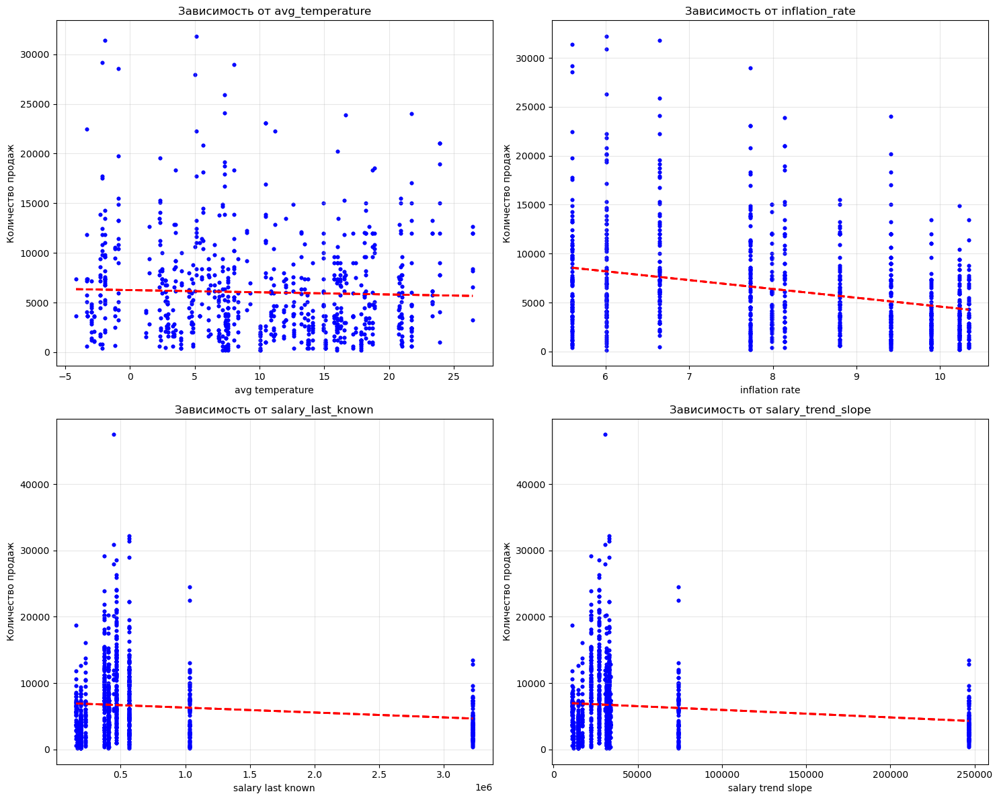


СТАТИСТИКА ПО КОНТРАГЕНТАМ
                          Количество                                  Сумма  \
                                 sum      mean      std count           sum   
Контрагент                                                                    
Тандер ЗАО (Ерзовка РЦ)    1331304.0  10736.32  6351.85   124  1.746722e+08   
Тандер ЗАО (Воронеж РЦ)    1197072.0   8255.67  6114.01   145  1.562077e+08   
Тандер ЗАО (Ярославль РЦ)   873312.0   9924.00  5885.90    88  1.149633e+08   
Тандер ЗАО (Тула РЦ)        730824.0   6467.47  4298.40   113  9.590255e+07   
Тандер ЗАО (Дзержинск РЦ)   428760.0   5641.58  4471.19    76  5.533794e+07   
Тандер ЗАО (Тамбов РЦ)      399000.0   2790.21  2054.89   143  5.212915e+07   
Тандер ЗАО (Дмитров РЦ)     212676.0   4726.13  2864.13    45  3.146625e+07   
Тандер ЗАО (Орел РЦ)        243432.0   6241.85  3153.09    39  2.969870e+07   
Тандер ЗАО (Смоленск РЦ)    220848.0   5662.77  3790.71    39  2.694346e+07   
Тандер ЗАО (Мурманск РЦ)

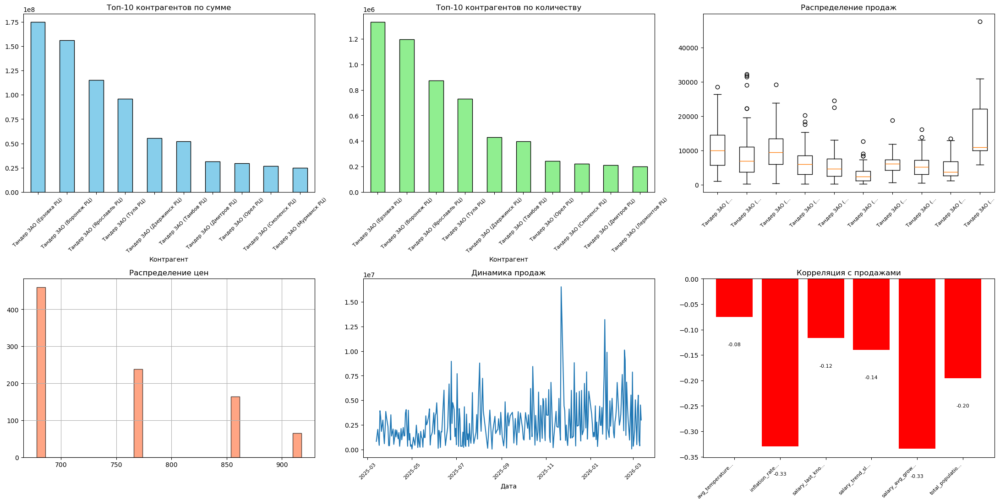


 Сохраняем в Minio: sales-analytics/Мас.Тандер.72,5%.180г.фол.12шт_анализ
 CSV: http://localhost:9003/sales-analytics/2026-03-13/Мас.Тандер.72,5_.180г.фол.12шт_анализ/анализ_20260313.csv
 Excel: http://localhost:9003/sales-analytics/2026-03-13/Мас.Тандер.72,5_.180г.фол.12шт_анализ/stats_20260313_0925.xlsx
 PNG: http://localhost:9003/sales-analytics/2026-03-13/Мас.Тандер.72,5_.180г.фол.12шт_анализ/анализ_20260313.png
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.Тандер.72,5_.180г.фол.12шт_анализ/анализ_20260313.pdf
    Всего сохранено: 4 объектов
 Результаты сохранены в Minio
 Память очищена

 АНАЛИЗ НОМЕНКЛАТУРЫ: Мас.КУ.82,5%.20кг.полиэт.
 Данные загружены из обогащенного датасета
   Записей: 11
   Период: 2025-04-02 16:35:25 - 2025-10-09 12:30:51
   Городов: 6

 АНАЛИЗ ВНЕШНИХ ПРИЗНАКОВ для Мас.КУ.82,5%.20кг.полиэт.

 Доступные признаки: ['avg_temperature', 'inflation_rate', 'salary_last_known', 'salary_trend_slope', 'salary_avg_growth_3y', 'total_population']

 КОРРЕЛЯЦ

/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


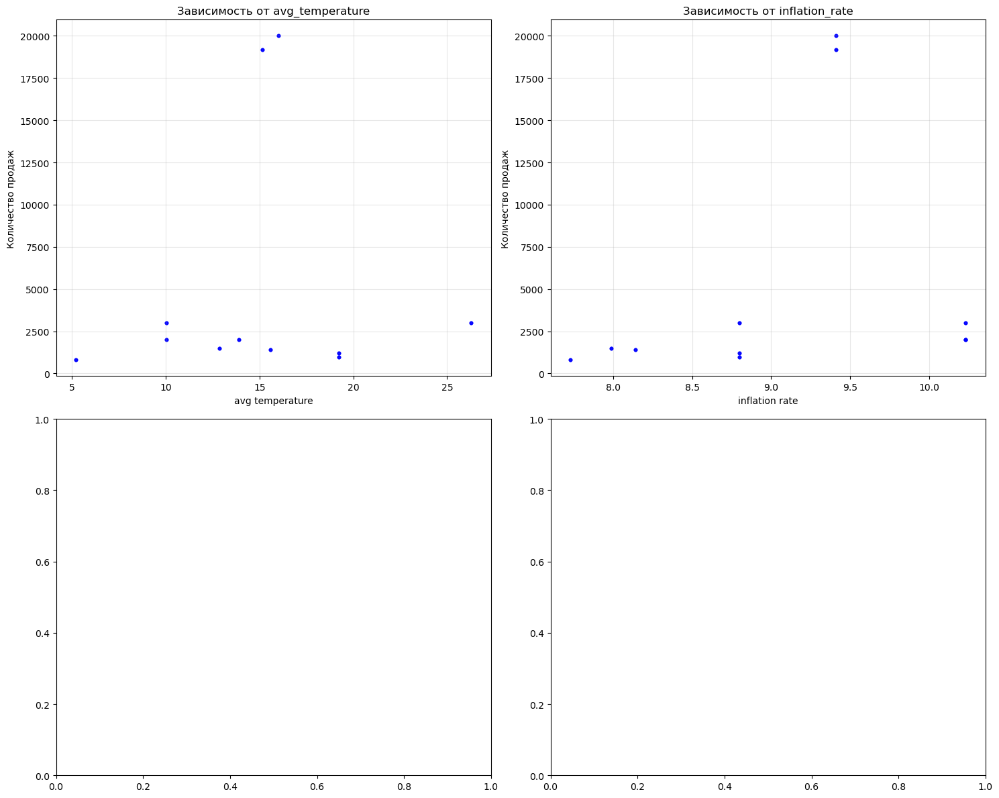


СТАТИСТИКА ПО КОНТРАГЕНТАМ
                                          Количество                         \
                                                 sum     mean     std count   
Контрагент                                                                    
АЙСБЕРРИ-ФМ  ООО                             20000.0  20000.0     NaN     1   
ВОЛОГОДСКОЕ МОРОЖЕНОЕ ООО                    19200.0  19200.0     NaN     1   
Стояновская Е.А. ИП                           5860.0   1172.0  293.12     5   
КУРСКИЙ СЫРОДЕЛЬНЫЙ ЗАВОД ООО (самовывоз)     5000.0   2500.0  707.11     2   
ЛУГАНСКИЙ ХЛАДОКОМБИНАТ ООО (самовывоз)       3000.0   3000.0     NaN     1   
Нуртазаев Е.Б. ИП Астсырпром                  2000.0   2000.0     NaN     1   

                                                Сумма              
                                                  sum        mean  
Контрагент                                                         
АЙСБЕРРИ-ФМ  ООО                           15640000.0  1

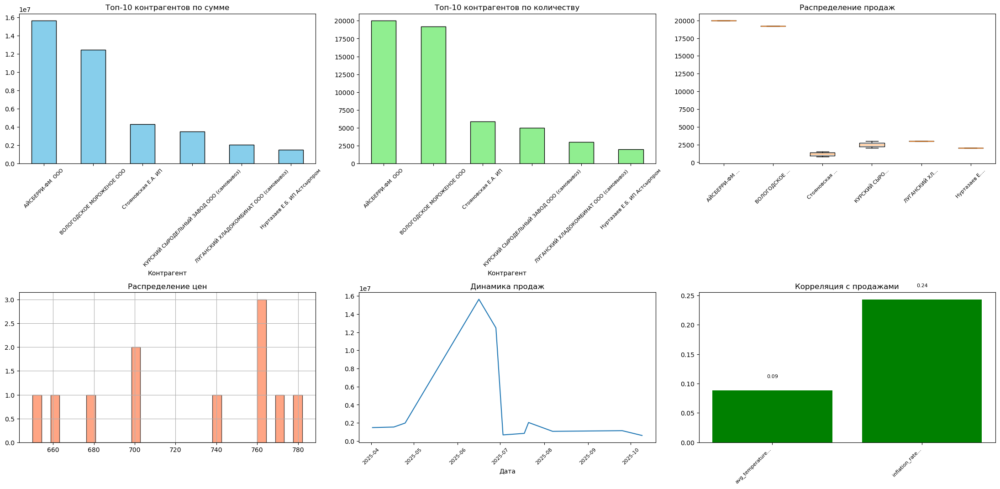


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5%.20кг.полиэт._анализ
 CSV: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт._анализ/анализ_20260313.csv
 Excel: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт._анализ/stats_20260313_0926.xlsx
 PNG: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт._анализ/анализ_20260313.png
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт._анализ/анализ_20260313.pdf
    Всего сохранено: 4 объектов
 Результаты сохранены в Minio
 Память очищена

 АНАЛИЗ НОМЕНКЛАТУРЫ: Мас.82,5%.5кг.полиэт.
 Данные загружены из обогащенного датасета
   Записей: 22
   Период: 2025-03-21 17:08:28 - 2025-07-27 18:07:24
   Городов: 2

 АНАЛИЗ ВНЕШНИХ ПРИЗНАКОВ для Мас.82,5%.5кг.полиэт.

 Доступные признаки: ['avg_temperature', 'inflation_rate', 'salary_last_known', 'salary_trend_slope', 'salary_avg_growth_3y', 'total_population']

 КОРРЕЛЯЦИЯ С ПРОДАЖАМИ:
   avg_temperatur

/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/tmp/ipykernel_78318/2730908516.py:151: RankWarning: Polyfit may be poorly conditioned
  fig_corr, correlations = analyze_external_features(df, product)
/tmp/ipykernel_78318/2730908516.py:151: RankWarning: Polyfit may be poorly conditioned
  fig_corr, correlations = analyze_external_features(df, product)
/tmp/ipykernel_78318/2730908516.py:151: RankWarning: Polyfit may be poorly conditioned
  fig_corr, cor

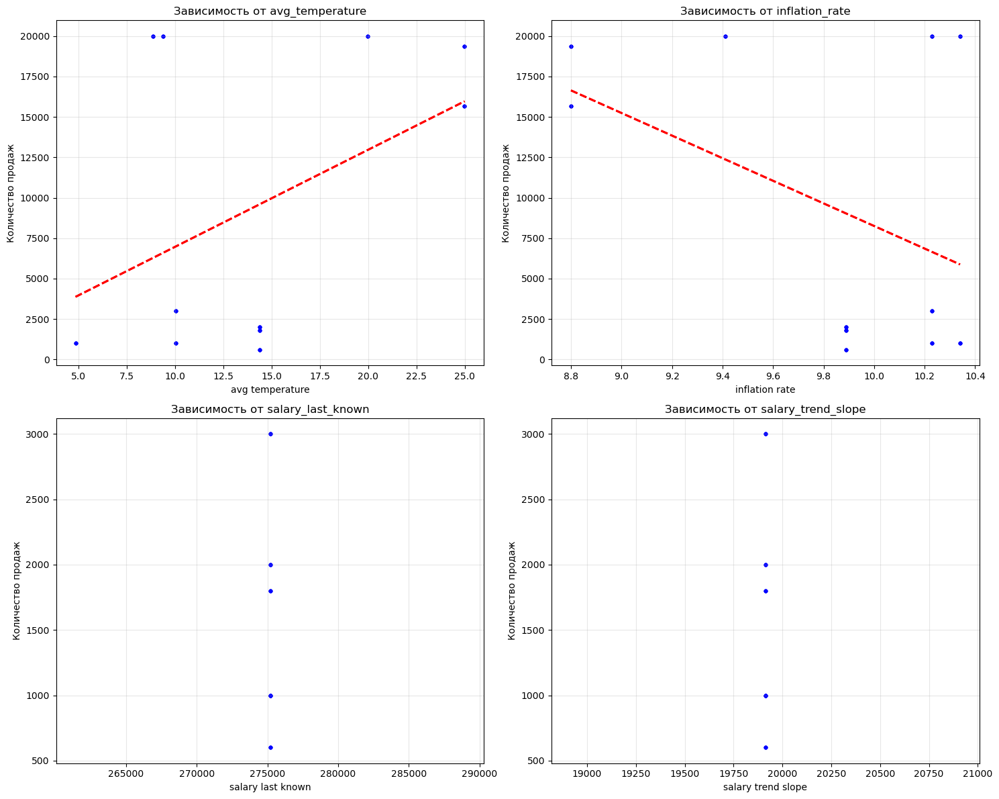


СТАТИСТИКА ПО КОНТРАГЕНТАМ
                                          Количество                          \
                                                 sum     mean      std count   
Контрагент                                                                     
Продсервис ООО (Крым) САМОВЫВОЗ             190000.0  19000.0  1785.43    10   
КУРСКИЙ СЫРОДЕЛЬНЫЙ ЗАВОД ООО (самовывоз)    15200.0   1520.0   919.90    10   
МАСЛОЗАВОД ООО (самовывоз)                    3600.0   1800.0     0.00     2   

                                                 Сумма              
                                                   sum        mean  
Контрагент                                                          
Продсервис ООО (Крым) САМОВЫВОЗ            131640000.0  13164000.0  
КУРСКИЙ СЫРОДЕЛЬНЫЙ ЗАВОД ООО (самовывоз)   10502000.0   1050200.0  
МАСЛОЗАВОД ООО (самовывоз)                   2376000.0   1188000.0  

СТАТИСТИКА ПО ГОРОДАМ
            Количество                        Сумма   

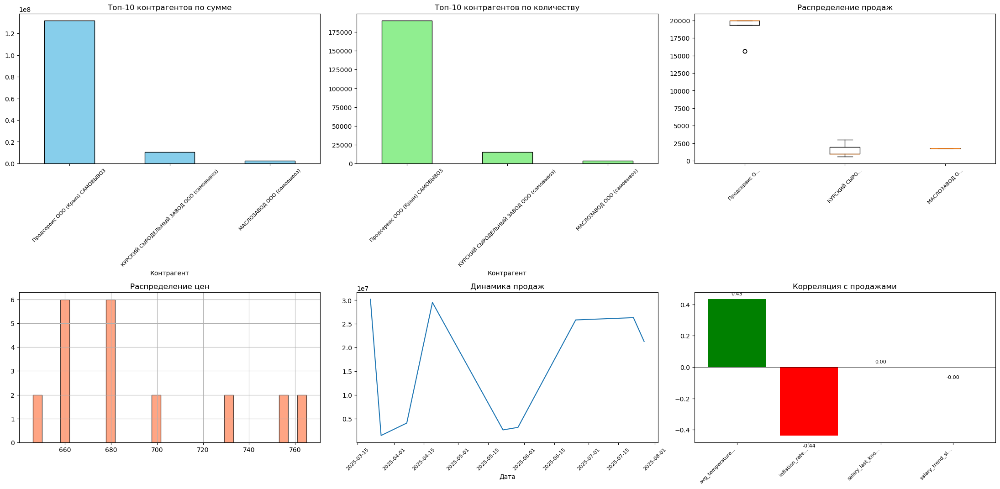


 Сохраняем в Minio: sales-analytics/Мас.82,5%.5кг.полиэт._анализ
 CSV: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.5кг.полиэт._анализ/анализ_20260313.csv
 Excel: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.5кг.полиэт._анализ/stats_20260313_0926.xlsx
 PNG: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.5кг.полиэт._анализ/анализ_20260313.png
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.5кг.полиэт._анализ/анализ_20260313.pdf
    Всего сохранено: 4 объектов
 Результаты сохранены в Minio
 Память очищена

 АНАЛИЗ НОМЕНКЛАТУРЫ: Мас.КУ.82,5%.20кг.перг.
 Данные загружены из обогащенного датасета
   Записей: 2
   Период: 2025-03-25 13:48:46 - 2025-06-19 12:17:43
   Городов: 1

 АНАЛИЗ ВНЕШНИХ ПРИЗНАКОВ для Мас.КУ.82,5%.20кг.перг.

 Доступные признаки: ['avg_temperature', 'inflation_rate', 'salary_last_known', 'salary_trend_slope', 'salary_avg_growth_3y', 'total_population']

 КОРРЕЛЯЦИЯ С ПРОДАЖАМИ:


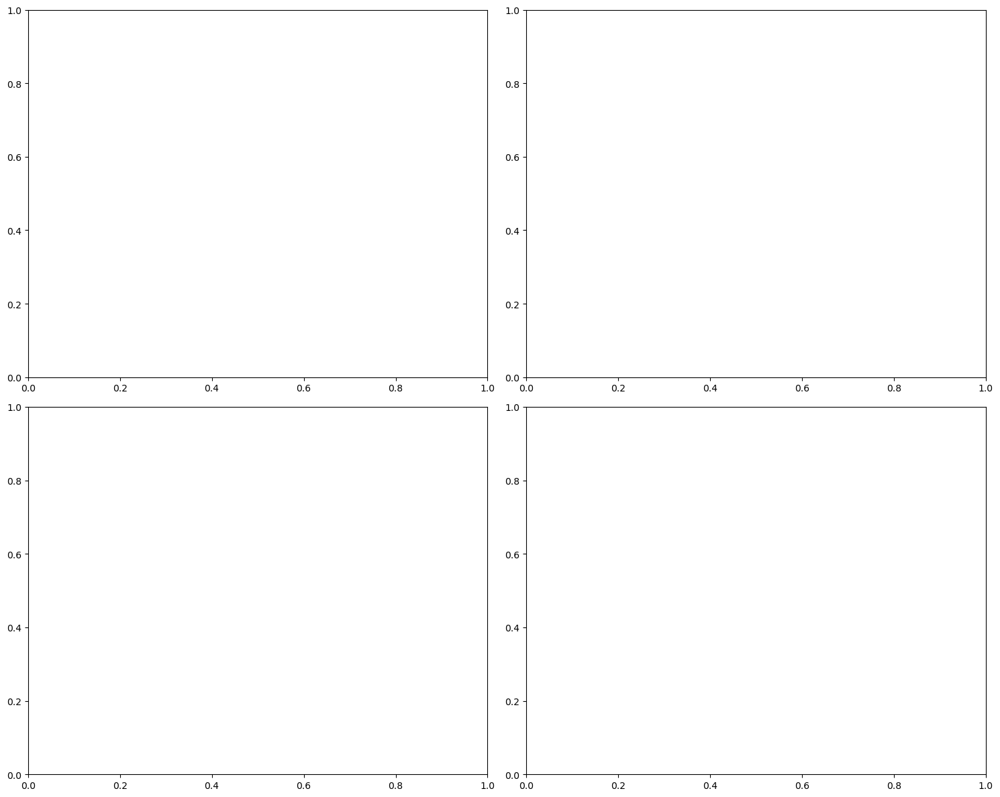


СТАТИСТИКА ПО КОНТРАГЕНТАМ
                         Количество                           Сумма  \
                                sum     mean  std count         sum   
Контрагент                                                            
ВЛАДПРОМСЫР ООО Вашутино    40000.0  20000.0  0.0     2  27800000.0   

                                      
                                mean  
Контрагент                            
ВЛАДПРОМСЫР ООО Вашутино  13900000.0  

СТАТИСТИКА ПО ГОРОДАМ
         Количество                      Сумма            
                sum     mean count         sum        mean
город                                                     
Владимир    40000.0  20000.0     2  27800000.0  13900000.0


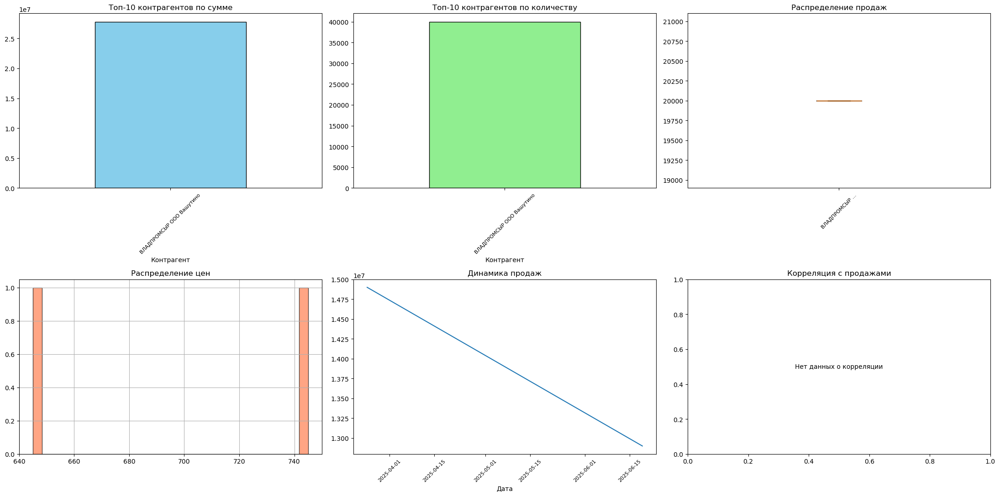


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5%.20кг.перг._анализ
 CSV: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.перг._анализ/анализ_20260313.csv
 Excel: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.перг._анализ/stats_20260313_0926.xlsx
 PNG: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.перг._анализ/анализ_20260313.png
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.перг._анализ/анализ_20260313.pdf
    Всего сохранено: 4 объектов
 Результаты сохранены в Minio
 Память очищена

 АНАЛИЗ НОМЕНКЛАТУРЫ: Мас.КУ.82,5%.20кг.полиэт.(61,5)
 Данные загружены из обогащенного датасета
   Записей: 9
   Период: 2025-03-17 15:47:42 - 2025-07-03 21:06:26
   Городов: 1

 АНАЛИЗ ВНЕШНИХ ПРИЗНАКОВ для Мас.КУ.82,5%.20кг.полиэт.(61,5)

 Доступные признаки: ['avg_temperature', 'inflation_rate', 'salary_last_known', 'salary_trend_slope', 'salary_avg_growth_3y', 'total_population']

 КОРРЕЛЯЦИЯ С ПРОДАЖАМИ:
   avg_t

/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encounter

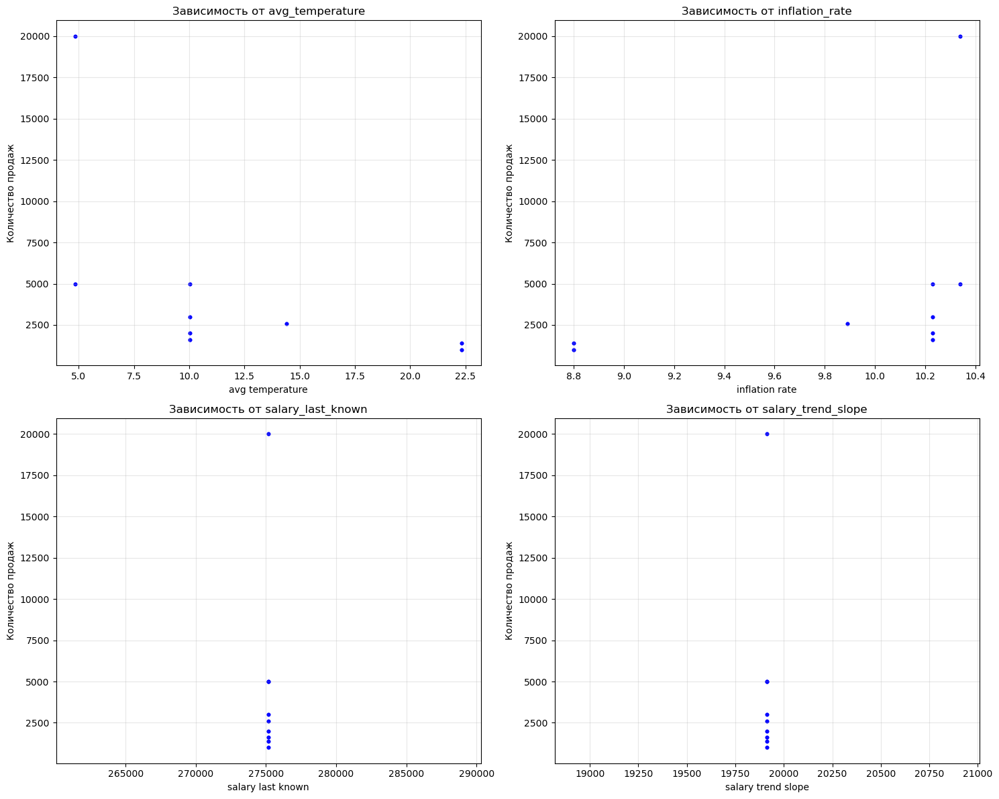


СТАТИСТИКА ПО КОНТРАГЕНТАМ
                                Количество                          \
                                       sum     mean      std count   
Контрагент                                                           
МИЛКО ООО (самовывоз)              20000.0  20000.0      NaN     1   
МОЛОЧНЫЕ БЕРЕГА ООО (самовывоз)    21620.0   2702.5  1554.55     8   

                                      Сумма              
                                        sum        mean  
Контрагент                                               
МИЛКО ООО (самовывоз)            12300000.0  12300000.0  
МОЛОЧНЫЕ БЕРЕГА ООО (самовывоз)  11666560.0   1458320.0  

СТАТИСТИКА ПО ГОРОДАМ
      Количество                      Сумма            
             sum     mean count         sum        mean
город                                                  
Курск    41620.0  4624.44     9  23966560.0  2662951.11


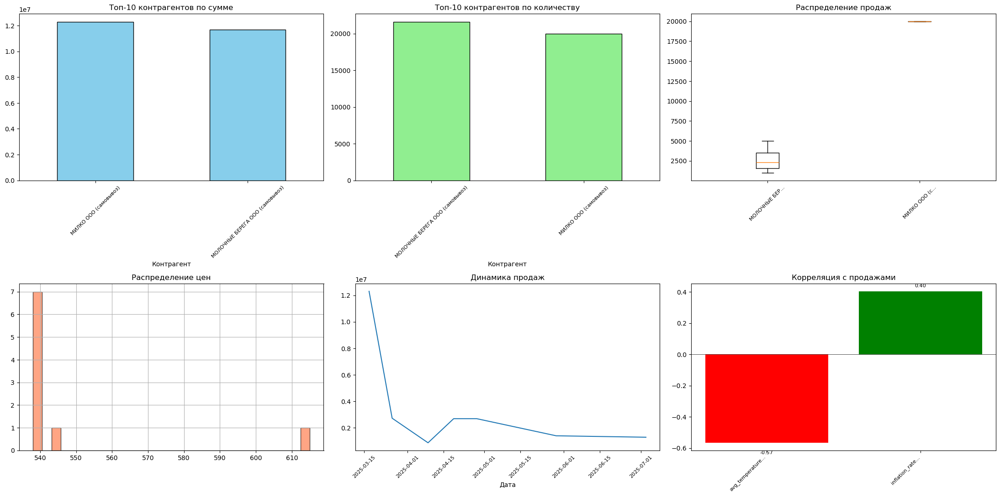


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5%.20кг.полиэт.(61,5)_анализ
 CSV: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт.(61,5)_анализ/анализ_20260313.csv
 Excel: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт.(61,5)_анализ/stats_20260313_0926.xlsx
 PNG: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт.(61,5)_анализ/анализ_20260313.png
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт.(61,5)_анализ/анализ_20260313.pdf
    Всего сохранено: 4 объектов
 Результаты сохранены в Minio
 Память очищена

 АНАЛИЗ НОМЕНКЛАТУРЫ: Мас.72,5%.10кг.полиэт.$
 Данные загружены из обогащенного датасета
   Записей: 18
   Период: 2025-06-07 11:40:01 - 2026-03-12 21:09:55
   Городов: 1

 АНАЛИЗ ВНЕШНИХ ПРИЗНАКОВ для Мас.72,5%.10кг.полиэт.$

 Доступные признаки: ['avg_temperature', 'inflation_rate', 'salary_last_known', 'salary_trend_slope', 'salary_avg_growth_3y', 'total_population']

 КОРРЕЛЯ

/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/tmp/ipykernel_78318/2730908516.py:151: RankWarning: Polyfit may be poorly conditioned
  fig_corr, correlations 

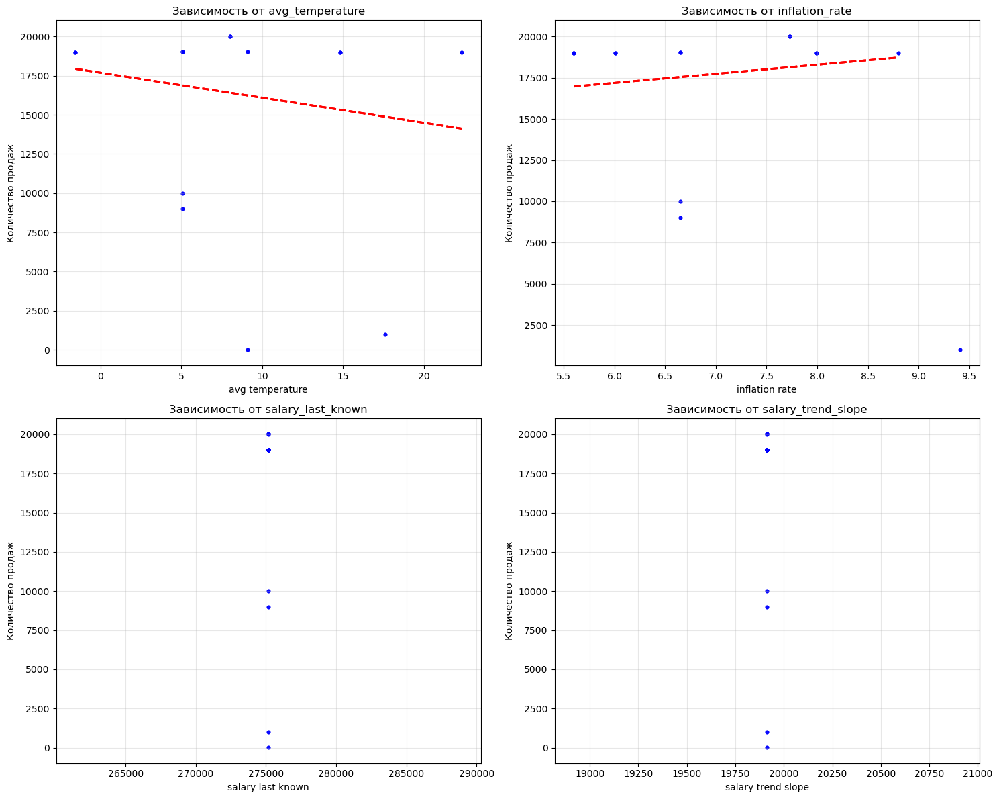


СТАТИСТИКА ПО КОНТРАГЕНТАМ
                           Количество                                Сумма  \
                                  sum      mean      std count         sum   
Контрагент                                                                   
Кисиль А.В. ИП (самовывоз)   289150.0  16063.89  6477.98    18  77292600.0   

                                        
                                  mean  
Контрагент                              
Кисиль А.В. ИП (самовывоз)  4294033.33  

СТАТИСТИКА ПО ГОРОДАМ
      Количество                       Сумма            
             sum      mean count         sum        mean
город                                                   
Курск   289150.0  16063.89    18  77292600.0  4294033.33


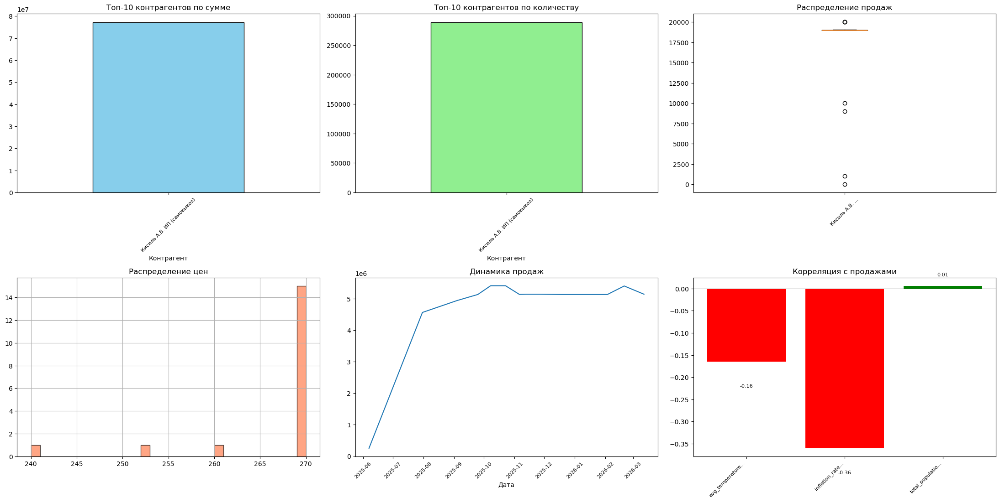


 Сохраняем в Minio: sales-analytics/Мас.72,5%.10кг.полиэт.$_анализ
 CSV: http://localhost:9003/sales-analytics/2026-03-13/Мас.72,5_.10кг.полиэт.$_анализ/анализ_20260313.csv
 Excel: http://localhost:9003/sales-analytics/2026-03-13/Мас.72,5_.10кг.полиэт.$_анализ/stats_20260313_0926.xlsx
 PNG: http://localhost:9003/sales-analytics/2026-03-13/Мас.72,5_.10кг.полиэт.$_анализ/анализ_20260313.png
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.72,5_.10кг.полиэт.$_анализ/анализ_20260313.pdf
    Всего сохранено: 4 объектов
 Результаты сохранены в Minio
 Память очищена

 АНАЛИЗ НОМЕНКЛАТУРЫ: Мас.82,5%.20 кг.полиэт(01030)
 Данные загружены из обогащенного датасета
   Записей: 1
   Период: 2025-03-20 23:08:53 - 2025-03-20 23:08:53
   Городов: 1

 АНАЛИЗ ВНЕШНИХ ПРИЗНАКОВ для Мас.82,5%.20 кг.полиэт(01030)

 Доступные признаки: ['avg_temperature', 'inflation_rate', 'salary_last_known', 'salary_trend_slope', 'salary_avg_growth_3y', 'total_population']

 КОРРЕЛЯЦИЯ С ПРОДАЖАМИ:


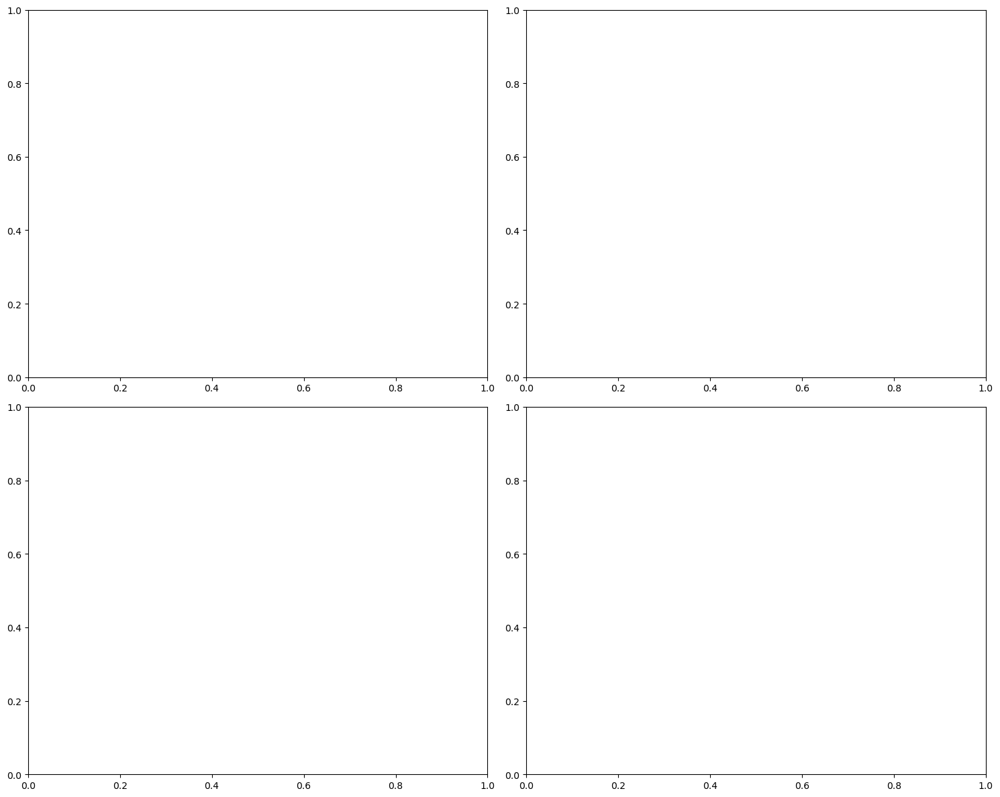


СТАТИСТИКА ПО КОНТРАГЕНТАМ
                      Количество                         Сумма           
                             sum     mean std count        sum       mean
Контрагент                                                               
МИЛКО ООО (самовывоз)    20000.0  20000.0 NaN     1  5600000.0  5600000.0

СТАТИСТИКА ПО ГОРОДАМ
      Количество                     Сумма           
             sum     mean count        sum       mean
город                                                
Курск    20000.0  20000.0     1  5600000.0  5600000.0


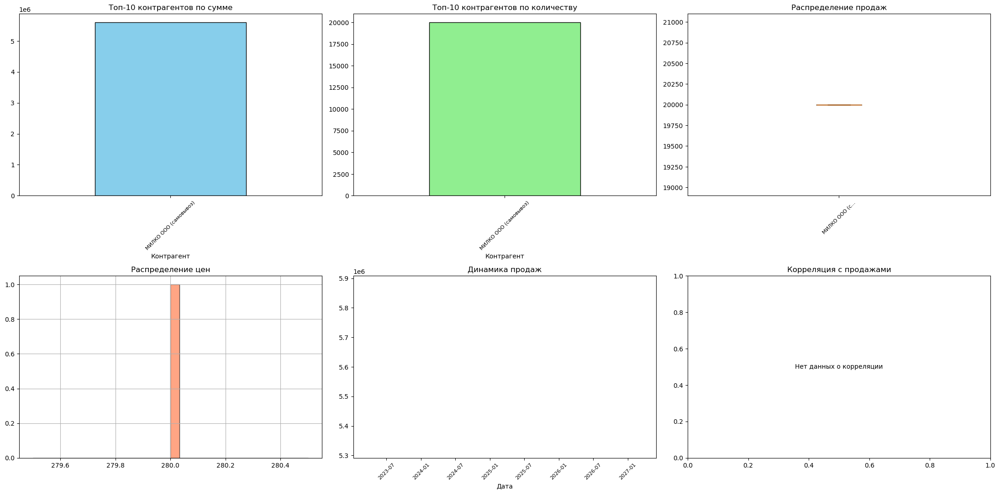


 Сохраняем в Minio: sales-analytics/Мас.82,5%.20 кг.полиэт(01030)_анализ
 CSV: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.20 кг.полиэт(01030)_анализ/анализ_20260313.csv
 Excel: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.20 кг.полиэт(01030)_анализ/stats_20260313_0926.xlsx
 PNG: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.20 кг.полиэт(01030)_анализ/анализ_20260313.png
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.20 кг.полиэт(01030)_анализ/анализ_20260313.pdf
    Всего сохранено: 4 объектов
 Результаты сохранены в Minio
 Память очищена

 АНАЛИЗ НОМЕНКЛАТУРЫ: Спр.72%.20кг.полиэт.(40%)(БЭ)
 Данные загружены из обогащенного датасета
   Записей: 3
   Период: 2025-06-11 00:03:18 - 2025-09-02 01:24:47
   Городов: 1

 АНАЛИЗ ВНЕШНИХ ПРИЗНАКОВ для Спр.72%.20кг.полиэт.(40%)(БЭ)

 Доступные признаки: ['avg_temperature', 'inflation_rate', 'salary_last_known', 'salary_trend_slope', 'salary_avg_growth_3y', 'total_population']

 КОРРЕЛ

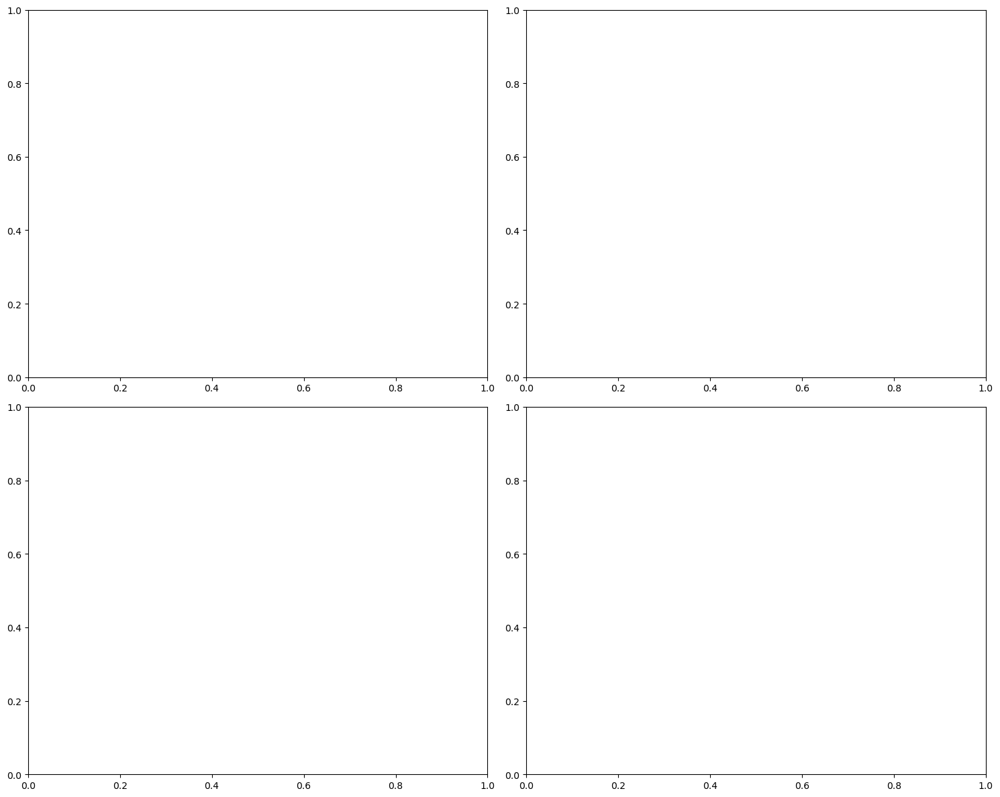


СТАТИСТИКА ПО КОНТРАГЕНТАМ
                      Количество                               Сумма  \
                             sum      mean     std count         sum   
Контрагент                                                             
ДАРАМ ООО (самовывоз)    43000.0  14333.33  577.35     3  15222000.0   

                                  
                            mean  
Контрагент                        
ДАРАМ ООО (самовывоз)  5074000.0  

СТАТИСТИКА ПО ГОРОДАМ
          Количество                       Сумма           
                 sum      mean count         sum       mean
город                                                      
Махачкала    43000.0  14333.33     3  15222000.0  5074000.0


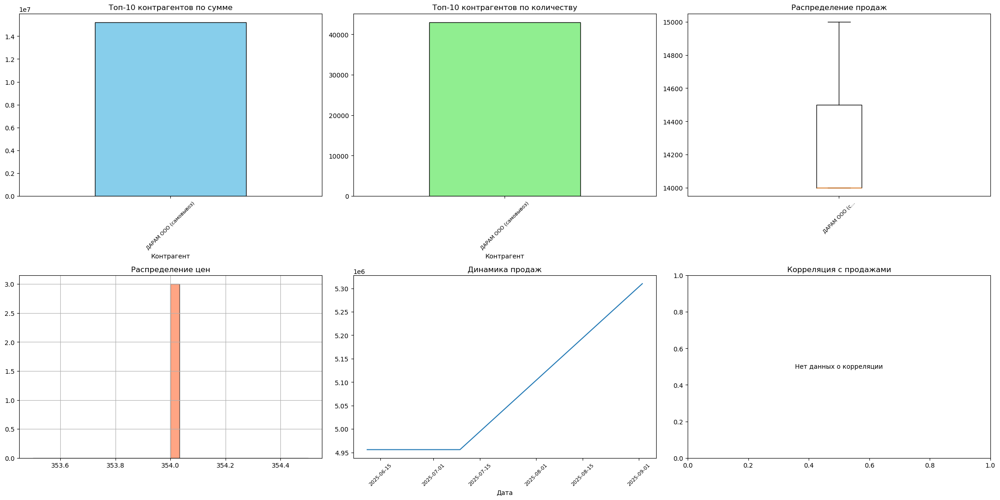


 Сохраняем в Minio: sales-analytics/Спр.72%.20кг.полиэт.(40%)(БЭ)_анализ
 CSV: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.полиэт.(40_)(БЭ)_анализ/анализ_20260313.csv
 Excel: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.полиэт.(40_)(БЭ)_анализ/stats_20260313_0926.xlsx
 PNG: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.полиэт.(40_)(БЭ)_анализ/анализ_20260313.png
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.полиэт.(40_)(БЭ)_анализ/анализ_20260313.pdf
    Всего сохранено: 4 объектов
 Результаты сохранены в Minio
 Память очищена

 АНАЛИЗ НОМЕНКЛАТУРЫ: Спр.72%.20кг.перг.(30%)(БЭ)
 Данные загружены из обогащенного датасета
   Записей: 3
   Период: 2025-10-11 06:23:39 - 2025-12-10 23:10:53
   Городов: 1

 АНАЛИЗ ВНЕШНИХ ПРИЗНАКОВ для Спр.72%.20кг.перг.(30%)(БЭ)

 Доступные признаки: ['avg_temperature', 'inflation_rate', 'salary_last_known', 'salary_trend_slope', 'salary_avg_growth_3y', 'total_population']

 КОРРЕЛЯЦИЯ

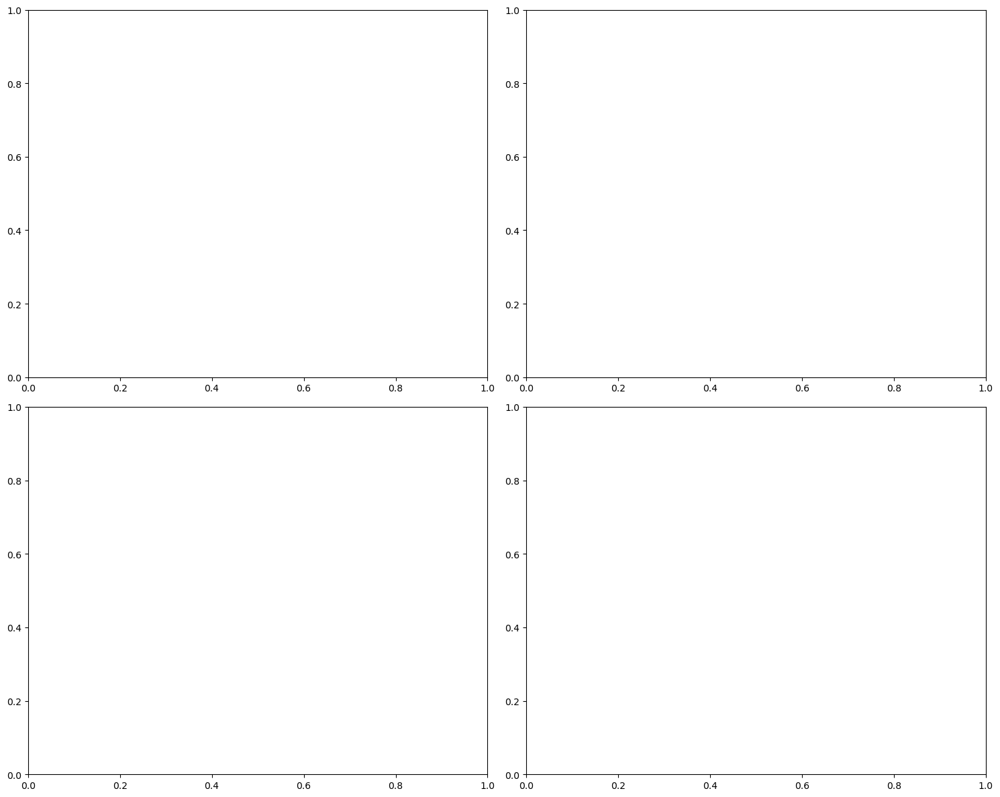


СТАТИСТИКА ПО КОНТРАГЕНТАМ
                      Количество                                Сумма  \
                             sum      mean      std count         sum   
Контрагент                                                              
ДАРАМ ООО (самовывоз)    44600.0  14866.67  1298.82     3  13764200.0   

                                   
                             mean  
Контрагент                         
ДАРАМ ООО (самовывоз)  4588066.67  

СТАТИСТИКА ПО ГОРОДАМ
          Количество                       Сумма            
                 sum      mean count         sum        mean
город                                                       
Махачкала    44600.0  14866.67     3  13764200.0  4588066.67


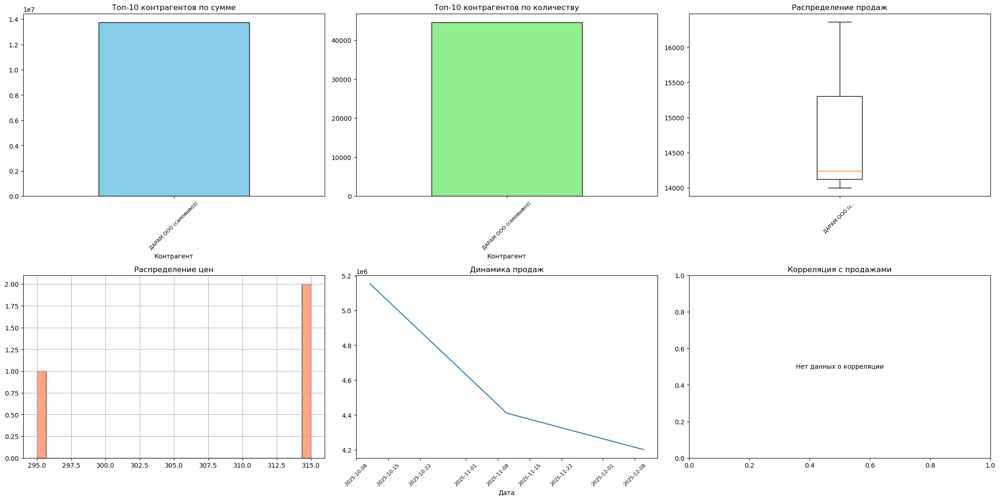


 Сохраняем в Minio: sales-analytics/Спр.72%.20кг.перг.(30%)(БЭ)_анализ
 CSV: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.перг.(30_)(БЭ)_анализ/анализ_20260313.csv
 Excel: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.перг.(30_)(БЭ)_анализ/stats_20260313_0926.xlsx
 PNG: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.перг.(30_)(БЭ)_анализ/анализ_20260313.png
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.перг.(30_)(БЭ)_анализ/анализ_20260313.pdf
    Всего сохранено: 4 объектов
 Результаты сохранены в Minio
 Память очищена

 АНАЛИЗ НОМЕНКЛАТУРЫ: Спр.БЛ.82%.1000г.фол.6шт
 Данные загружены из обогащенного датасета
   Записей: 10
   Период: 2025-03-28 18:49:24 - 2026-03-11 23:11:50
   Городов: 2

 АНАЛИЗ ВНЕШНИХ ПРИЗНАКОВ для Спр.БЛ.82%.1000г.фол.6шт

 Доступные признаки: ['avg_temperature', 'inflation_rate', 'salary_last_known', 'salary_trend_slope', 'salary_avg_growth_3y', 'total_population']

 КОРРЕЛЯЦИЯ С ПРОДАЖАМИ:
 

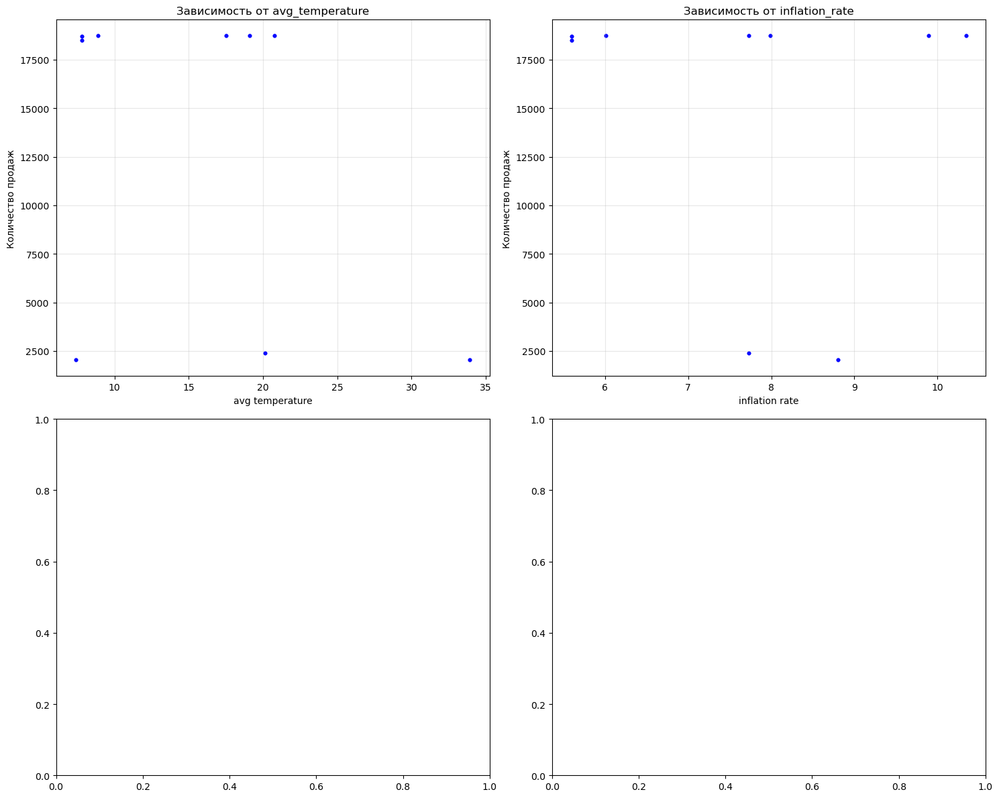


СТАТИСТИКА ПО КОНТРАГЕНТАМ
                                   Количество                          \
                                          sum      mean     std count   
Контрагент                                                              
ARAZ SUPERMARKET ООО (Азербайджан)   130824.0  18689.14   79.03     7   
Бяшимов Д. ЧП (Туркменистан)           6480.0   2160.00  207.85     3   

                                         Сумма              
                                           sum        mean  
Контрагент                                                  
ARAZ SUPERMARKET ООО (Азербайджан)  21794040.0  3113434.29  
Бяшимов Д. ЧП (Туркменистан)         1020720.0   340240.00  

СТАТИСТИКА ПО ГОРОДАМ
        Количество                       Сумма            
               sum      mean count         sum        mean
город                                                     
Баку      130824.0  18689.14     7  21794040.0  3113434.29
Ашхабад     6480.0   2160.00     3   10207

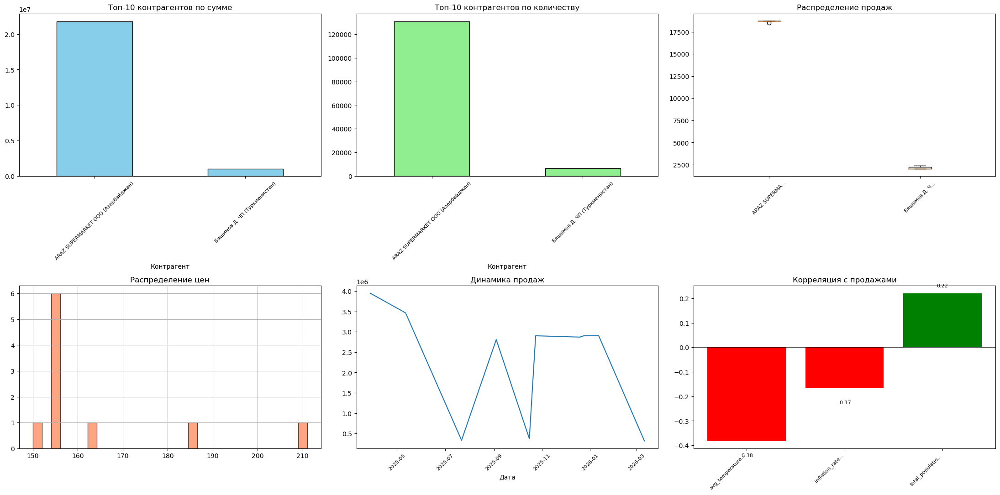


 Сохраняем в Minio: sales-analytics/Спр.БЛ.82%.1000г.фол.6шт_анализ
 CSV: http://localhost:9003/sales-analytics/2026-03-13/Спр.БЛ.82_.1000г.фол.6шт_анализ/анализ_20260313.csv
 Excel: http://localhost:9003/sales-analytics/2026-03-13/Спр.БЛ.82_.1000г.фол.6шт_анализ/stats_20260313_0926.xlsx
 PNG: http://localhost:9003/sales-analytics/2026-03-13/Спр.БЛ.82_.1000г.фол.6шт_анализ/анализ_20260313.png
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.БЛ.82_.1000г.фол.6шт_анализ/анализ_20260313.pdf
    Всего сохранено: 4 объектов
 Результаты сохранены в Minio
 Память очищена


In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import re
import io
import json
from scipy import stats
from minio import Minio
from io import BytesIO
import gc

# Подключаем Minio
from minio import Minio

# ============================================
# ЗАГРУЖАЕМ УЖЕ ОБОГАЩЕННЫЙ ДАТАСЕТ
# ============================================

# Загружаем сохраненный обогащенный датасет
full_df_enriched = pd.read_parquet('/home/jovyan/work/data/processed/full_sales_data_final.parquet')

print(f" Загружен обогащенный датасет:")
print(f"   Записей: {len(full_df_enriched)}")
print(f"   Колонок: {len(full_df_enriched.columns)}")
print(f"   Уникальных товаров: {full_df_enriched['Номенклатура'].nunique()}")
print(f"   Уникальных городов: {full_df_enriched['город'].nunique()}")

# Получаем список товаров из датасета (не из жестко заданного списка!)
products = full_df_enriched['Номенклатура'].unique().tolist()
print(f"\n Товары в датасете ({len(products)} шт.):")
for i, p in enumerate(products[:5]):
    print(f"   {i+1}. {p[:70]}...")
if len(products) > 5:
    print(f"   ... и еще {len(products)-5}")

# ============================================
# ФУНКЦИЯ ДЛЯ АНАЛИЗА НОВЫХ ПРИЗНАКОВ
# ============================================
def analyze_external_features(df, product_name):
    """Анализирует влияние внешних признаков на продажи"""
    
    print("\n" + "="*60)
    print(f" АНАЛИЗ ВНЕШНИХ ПРИЗНАКОВ для {product_name[:50]}")
    print("="*60)
    
    # Список внешних признаков для анализа
    external_features = [
        'avg_temperature', 'inflation_rate', 'salary_last_known',
        'salary_trend_slope', 'salary_avg_growth_3y', 'total_population'
    ]
    
    # Проверяем, какие признаки есть в данных
    available_features = [f for f in external_features if f in df.columns]
    
    if not available_features:
        print(" Внешние признаки не найдены в датасете")
        return None, {}
    
    print(f"\n Доступные признаки: {available_features}")
    
    # 1. Корреляция с продажами
    print("\n КОРРЕЛЯЦИЯ С ПРОДАЖАМИ:")
    correlations = {}
    for feature in available_features:
        if df[feature].notna().any():
            # Убираем NaN для корреляции
            temp_df = df[['Количество', feature]].dropna()
            if len(temp_df) > 5:
                corr = temp_df['Количество'].corr(temp_df[feature])
                correlations[feature] = corr
                print(f"   {feature}: {corr:.3f}")
    
    # 2. Топ-3 самых влияющих признаков
    if correlations:
        print("\n ТОП-3 ВЛИЯЮЩИХ ПРИЗНАКА:")
        top_features = sorted(correlations.items(), key=lambda x: abs(x[1]), reverse=True)[:3]
        for feat, corr in top_features:
            print(f"   {feat}: {corr:.3f}")
    
    # 3. Визуализация зависимости
    fig_corr = None
    if available_features:
        n_features = min(len(available_features), 4)
        fig_corr, axes = plt.subplots(2, 2, figsize=(15, 12))
        axes = axes.flatten()
        
        for i, feature in enumerate(available_features[:4]):
            if i < len(axes):
                ax = axes[i]
                temp_df = df[['Количество', feature]].dropna()
                # Линия тренда (с проверкой)
                for i, feature in enumerate(available_features[:4]):
                    if i < len(axes):
                        ax = axes[i]
                        temp_df = df[['Количество', feature]].dropna()
                        
                        # 1. СНАЧАЛА рисуем точки (scatter)
                        if len(temp_df) > 5:
                            ax.scatter(temp_df[feature], temp_df['Количество'], alpha=0.5, s=10, color='blue')
                            ax.set_xlabel(feature.replace('_', ' '))
                            ax.set_ylabel('Количество продаж')
                            ax.set_title(f'Зависимость от {feature}')
                            ax.grid(True, alpha=0.3)
                        
                        # 2. ПОТОМ линию тренда (если достаточно точек)
                        if len(temp_df) > 10:
                            try:
                                # Убираем экстремальные выбросы
                                q_low = temp_df['Количество'].quantile(0.01)
                                q_high = temp_df['Количество'].quantile(0.99)
                                temp_df_clean = temp_df[(temp_df['Количество'] >= q_low) & (temp_df['Количество'] <= q_high)]
                                
                                if len(temp_df_clean) > 10:
                                    z = np.polyfit(temp_df_clean[feature], temp_df_clean['Количество'], 1)
                                    p = np.poly1d(z)
                                    x_sorted = np.sort(temp_df_clean[feature])
                                    ax.plot(x_sorted, p(x_sorted), "r--", alpha=0.8, linewidth=2)
                            except Exception as e:
                                pass
                                

        
        plt.tight_layout()
        plt.show()
    
    return fig_corr, correlations

# ============================================
# ОСНОВНОЙ АНАЛИЗ ПО ТОВАРАМ
# ============================================

for product in products:
    print(f"\n{'='*70}")
    print(f" АНАЛИЗ НОМЕНКЛАТУРЫ: {product[:70]}")
    print('='*70)
    
    # Берем данные для текущего товара из обогащенного датасета
    df = full_df_enriched[full_df_enriched['Номенклатура'] == product].copy()
    
    if df.empty:
        print(f" Нет данных для {product[:50]}")
        continue
    
    print(f" Данные загружены из обогащенного датасета")
    print(f"   Записей: {len(df)}")
    print(f"   Период: {df['Дата'].min()} - {df['Дата'].max()}")
    print(f"   Городов: {df['город'].nunique()}")
    
    # Анализ внешних признаков
    fig_corr, correlations = analyze_external_features(df, product)
    
    # 1. АНАЛИЗ ПО КОНТРАГЕНТАМ
    print("\n" + "="*60)
    print("СТАТИСТИКА ПО КОНТРАГЕНТАМ")
    print("="*60)
    
    kontragent_stats = df.groupby('Контрагент').agg({
        'Количество': ['sum', 'mean', 'std', 'count'],
        'Сумма': ['sum', 'mean']
    }).round(2)
    kontragent_stats = kontragent_stats.sort_values(('Сумма', 'sum'), ascending=False)
    print(kontragent_stats.head(10))
    
    # 2. АНАЛИЗ ПО ГОРОДАМ
    print("\n" + "="*60)
    print("СТАТИСТИКА ПО ГОРОДАМ")
    print("="*60)
    
    city_stats = pd.DataFrame()
    if 'город' in df.columns:
        city_stats = df.groupby('город').agg({
            'Количество': ['sum', 'mean', 'count'],
            'Сумма': ['sum', 'mean']
        }).round(2)
        city_stats = city_stats.sort_values(('Сумма', 'sum'), ascending=False)
        print(city_stats.head(10))
    
    # 3. ВИЗУАЛИЗАЦИЯ
    fig = plt.figure(figsize=(22, 16))
    
    # 3.1 Топ-10 контрагентов по сумме
    ax1 = plt.subplot(3, 3, 1)
    df.groupby('Контрагент')['Сумма'].sum().nlargest(10).plot(
        kind='bar', color='skyblue', edgecolor='black', ax=ax1)
    ax1.set_title('Топ-10 контрагентов по сумме')
    ax1.tick_params(axis='x', rotation=45, labelsize=8)
    
    # 3.2 Топ-10 контрагентов по количеству
    ax2 = plt.subplot(3, 3, 2)
    df.groupby('Контрагент')['Количество'].sum().nlargest(10).plot(
        kind='bar', color='lightgreen', edgecolor='black', ax=ax2)
    ax2.set_title('Топ-10 контрагентов по количеству')
    ax2.tick_params(axis='x', rotation=45, labelsize=8)
    
    # 3.3 Boxplot контрагентов
    ax3 = plt.subplot(3, 3, 3)
    top_kontragents_list = df.groupby('Контрагент')['Количество'].sum().nlargest(10).index
    df_top_kontr = df[df['Контрагент'].isin(top_kontragents_list)]
    box_data = [df_top_kontr[df_top_kontr['Контрагент'] == k]['Количество'].values for k in top_kontragents_list]
    if box_data:
        ax3.boxplot(box_data, labels=[k[:12] + '...' for k in top_kontragents_list])
        ax3.set_title('Распределение продаж')
        ax3.tick_params(axis='x', rotation=45, labelsize=8)
    
    # 3.4 Распределение цен
    ax4 = plt.subplot(3, 3, 4)
    df['Цена'].hist(bins=30, color='coral', edgecolor='black', alpha=0.7, ax=ax4)
    ax4.set_title('Распределение цен')
    
    # 3.5 Динамика продаж
    ax5 = plt.subplot(3, 3, 5)
    df['Дата'] = pd.to_datetime(df['Дата'])
    daily_sales = df.groupby(df['Дата'].dt.date)['Сумма'].sum()
    daily_sales.plot(ax=ax5)
    ax5.set_title('Динамика продаж')
    ax5.tick_params(axis='x', rotation=45, labelsize=8)
    
  
    # 3.6 Корреляция с внешними признаками
    ax6 = plt.subplot(3, 3, 6)
    if correlations:
        # Фильтруем только признаки с конечными значениями
        valid_features = []
        valid_values = []
        for feat, val in correlations.items():
            if np.isfinite(val):  # проверяем, что значение конечно
                valid_features.append(feat)
                valid_values.append(val)
        
        if valid_features:
            bars = ax6.bar(range(len(valid_features)), valid_values, 
                           color=['green' if v > 0 else 'red' for v in valid_values])
            ax6.set_xticks(range(len(valid_features)))
            ax6.set_xticklabels([f[:15] + '...' for f in valid_features], rotation=45, ha='right', fontsize=8)
            ax6.set_title('Корреляция с продажами')
            ax6.axhline(y=0, color='black', linewidth=0.5)
            
            # Добавляем подписи значений только для конечных значений
            for i, v in enumerate(valid_values):
                if np.isfinite(v):
                    offset = 0.02 if v > 0 else -0.05
                    va = 'bottom' if v > 0 else 'top'
                    ax6.text(i, v + offset, f'{v:.2f}', ha='center', va=va, fontsize=8)
        else:
            ax6.text(0.5, 0.5, 'Нет данных о корреляции', ha='center', va='center', transform=ax6.transAxes)
            ax6.set_title('Корреляция с продажами')
    else:
        ax6.text(0.5, 0.5, 'Нет данных о корреляции', ha='center', va='center', transform=ax6.transAxes)
        ax6.set_title('Корреляция с продажами')
    
    plt.tight_layout()
    plt.show()
    
    # ============================================
    # СОХРАНЕНИЕ В MINIO
    # ============================================
    
    # Подготавливаем данные для Excel
    excel_data = {
        'Контрагенты': kontragent_stats,
        'Города': city_stats if not city_stats.empty else pd.DataFrame(),
        'Корреляции': pd.DataFrame(
            list(correlations.items()), 
            columns=['Признак', 'Корреляция']
        ) if correlations else pd.DataFrame({'Признак': ['Нет данных'], 'Корреляция': [0]})
    }
    
    # Сохраняем в Minio
    try:
        save_to_minio(
            bucket_name="sales-analytics",
            block_name=f"{product[:50]}_анализ",
            data=df,
            plot_name=f"анализ_{datetime.now().strftime('%Y%m%d')}",
            fig=fig,
            formats=['png', 'pdf'],
            excel_data=excel_data
        )
        print(f" Результаты сохранены в Minio")
    except Exception as e:
        print(f" Ошибка сохранения в Minio: {e}")
    
    plt.close('all')
    gc.collect()
    print(" Память очищена")

In [10]:

#функция версионирвоаиня, добавим после наполнениявсех признаков
import json
import pickle
from datetime import datetime, timedelta
import pandas as pd
import numpy as np
from minio import Minio
from io import BytesIO
import re

def save_datasets_to_minio(
    train_df, 
    test_df=None, 
    product_name=None,
    bucket_name="ml-datasets",
    version=None,
    split_info=None
):
    """
    Сохраняет train/test датасеты в Minio с правильной структурой
    
    Parameters:
    train_df, test_df: DataFrame
    product_name: название продукта
    bucket_name: бакет в Minio
    version: версия датасета (если None, создается автоматически)
    split_info: дополнительная информация о разделении
    """
    
    # Подключение к Minio
    client = Minio(
        endpoint="host.docker.internal:9002",
        access_key="minioadmin",
        secret_key="minioadmin",
        secure=False
    )
    
    # Создаем бакет если нет
    if not client.bucket_exists(bucket_name):
        client.make_bucket(bucket_name)
        print(f" Создан бакет: {bucket_name}")
    
    # Очищаем имя продукта для пути
    clean_name = re.sub(r'[<>:"/\\|?*%\'"]', '_', product_name)
    clean_name = clean_name[:50]
    
    # Формируем версию
    if version is None:
        version = datetime.now().strftime('%Y%m%d_%H%M%S')
    
    # Базовый путь
    base_path = f"datasets/{clean_name}/train_test_split"
    
    saved_files = []
    
    # 1. Сохраняем train как parquet (эффективнее csv)
    train_buffer = BytesIO()
    train_df.to_parquet(train_buffer, index=False)
    train_buffer.seek(0)
    
    train_path = f"{base_path}/train_{version}.parquet"
    client.put_object(
        bucket_name,
        train_path,
        data=train_buffer,
        length=train_buffer.getbuffer().nbytes,
        content_type='application/parquet'
    )
    saved_files.append(f"{bucket_name}/{train_path}")
    print(f" Train сохранен: {train_path}")
    
    # 2. Сохраняем test
    if test_df is not None:
        test_buffer = BytesIO()
        test_df.to_parquet(test_buffer, index=False)
        test_buffer.seek(0)
        
        test_path = f"{base_path}/test_{version}.parquet"
        client.put_object(
            bucket_name,
            test_path,
            data=test_buffer,
            length=test_buffer.getbuffer().nbytes,
            content_type='application/parquet'
        )
        saved_files.append(f"{bucket_name}/{test_path}")
        print(f" Test сохранен: {test_path}")
    
    # 3. Сохраняем метаданные о разделении
    if split_info is None:
        split_info = {
            'product': product_name,
            'version': version,
            'train_size': len(train_df),
            'test_size': len(test_df),
            'train_period': {
                'start': str(train_df['Дата'].min()),
                'end': str(train_df['Дата'].max())
            },
            'test_period': {
                'start': str(test_df['Дата'].min()),
                'end': str(test_df['Дата'].max())
            },
            'features': list(train_df.columns),
            'created_at': datetime.now().isoformat()
        }
    
    meta_buffer = BytesIO()
    meta_buffer.write(json.dumps(split_info, indent=2, ensure_ascii=False).encode())
    meta_buffer.seek(0)
    
    meta_path = f"{base_path}/split_info_{version}.json"
    client.put_object(
        bucket_name,
        meta_path,
        data=meta_buffer,
        length=meta_buffer.getbuffer().nbytes,
        content_type='application/json'
    )
    print(f" Метаданные сохранены: {meta_path}")
    
    return {
        'train_path': train_path,
        'test_path': test_path,
        'meta_path': meta_path,
        'version': version,
        'bucket': bucket_name,
        'files': saved_files
    }


def load_datasets_from_minio(
    bucket_name="ml-datasets",
    product_name=None,
    version=None,
    latest=True
):
    """
    Загружает датасеты из Minio
    
    Если latest=True, берет последнюю версию
    Иначе нужно указать version
    """
    
    client = Minio(
        endpoint="host.docker.internal:9002",
        access_key="minioadmin",
        secret_key="minioadmin",
        secure=False
    )
    
    clean_name = re.sub(r'[<>:"/\\|?*%\'"]', '_', product_name)
    clean_name = clean_name[:50]
    
    base_path = f"datasets/{clean_name}/train_test_split"
    
    if latest:
        # Находим последнюю версию
        objects = list(client.list_objects(bucket_name, prefix=base_path, recursive=True))
        versions = set()
        for obj in objects:
            if 'train_' in obj.object_name:
                ver = obj.object_name.split('train_')[-1].split('.parquet')[0]
                versions.add(ver)
        
        if not versions:
            raise ValueError(f"Нет датасетов для продукта {product_name}")
        
        version = sorted(versions)[-1]
        print(f"Загружаем последнюю версию: {version}")
    
    # Загружаем train
    train_path = f"{base_path}/train_{version}.parquet"
    train_response = client.get_object(bucket_name, train_path)
    train_df = pd.read_parquet(BytesIO(train_response.read()))
    
    # Загружаем test
    test_path = f"{base_path}/test_{version}.parquet"
    test_response = client.get_object(bucket_name, test_path)
    test_df = pd.read_parquet(BytesIO(test_response.read()))
    
    # Загружаем метаданные
    meta_path = f"{base_path}/split_info_{version}.json"
    try:
        meta_response = client.get_object(bucket_name, meta_path)
        meta_info = json.loads(meta_response.read().decode())
    except:
        meta_info = None
    
    print(f" Загружено: train={len(train_df)}, test={len(test_df)}")
    return train_df, test_df, meta_info


def save_features_to_minio(
    X_train, X_test, y_train, y_test,
    feature_names,
    product_name,
    version=None
):
    """
    Сохраняет признаки и целевые переменные для модели
    """
    
    client = Minio(
        endpoint="host.docker.internal:9002",
        access_key="minioadmin",
        secret_key="minioadmin",
        secure=False
    )
    
    bucket_name = "ml-datasets"
    clean_name = re.sub(r'[<>:"/\\|?*%\'"]', '_', product_name)
    clean_name = clean_name[:50]
    
    if version is None:
        version = datetime.now().strftime('%Y%m%d_%H%M%S')
    
    base_path = f"features/{clean_name}/{version}"
    
    # Сохраняем признаки
    features_dict = {
        'X_train': X_train,
        'X_test': X_test,
        'y_train': y_train,
        'y_test': y_test,
        'feature_names': feature_names
    }
    
    for name, data in features_dict.items():
        buffer = BytesIO()
        
        if isinstance(data, pd.DataFrame) or isinstance(data, pd.Series):
            data.to_parquet(buffer)
        elif isinstance(data, np.ndarray):
            pd.DataFrame(data).to_parquet(buffer)
        else:
            # для списков и простых типов
            buffer.write(json.dumps(data).encode())
            buffer.seek(0)
            client.put_object(
                bucket_name,
                f"{base_path}/{name}.json",
                data=buffer,
                length=buffer.getbuffer().nbytes,
                content_type='application/json'
            )
            continue
        
        buffer.seek(0)
        client.put_object(
            bucket_name,
            f"{base_path}/{name}.parquet",
            data=buffer,
            length=buffer.getbuffer().nbytes,
            content_type='application/parquet'
        )
    
    print(f" Признаки сохранены: {base_path}")

In [11]:
#разделение на трейн и вал с отсечкой, посмотреть после всех признаков!!!
checker = DatabaseChecker()
df = checker.get_sales_data('Пр.из творога "365 дней" 24%.500г.пакет.8шт')

# Исправляем даты
df['Дата'] = pd.to_datetime(df['Дата'].astype(str).str.replace('402', '202'))

# Разделяем на train/test
today = datetime.now().date()
cutoff_date = today - timedelta(days=30)
print(f"Дата отсечки: {cutoff_date}")

train_df = df[df['Дата'].dt.date < cutoff_date].copy()
test_df = df[df['Дата'].dt.date >= cutoff_date].copy()

# СОХРАНЯЕМ В MINIO!
result = save_datasets_to_minio(
    train_df=train_df,
    test_df=test_df,
    product_name='творог_365_дней',
    split_info={
        'cutoff_date': str(cutoff_date),
        'split_method': 'last_30_days',
        'description': 'Train/test split для прогнозирования продаж'
    }
)

print(f"\n Датасеты сохранены:")
print(f"   Версия: {result['version']}")
print(f"   Путь: {result['train_path']}")

# Позже, когда понадобится загрузить:
# train_df, test_df, meta = load_datasets_from_minio(
#     product_name='творог_365_дней',
#     latest=True
# )

 Подключение через SQL логин
   Сервер: 172.16.0.108/ВитринаДанных
   Пользователь: sa


/home/jovyan/work/scripts/database_checker.py:104: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql(query, conn, params=(name,))



 Найдено 1429 записей для 'Пр.из творога "365 дней" 24%.500г.пакет.8шт'
   Период: с 2022-11-11 15:04:18 по 2026-03-06 00:05:28
Дата отсечки: 2026-02-08
 Train сохранен: datasets/творог_365_дней/train_test_split/train_20260310_133818.parquet
 Test сохранен: datasets/творог_365_дней/train_test_split/test_20260310_133818.parquet
 Метаданные сохранены: datasets/творог_365_дней/train_test_split/split_info_20260310_133818.json

 Датасеты сохранены:
   Версия: 20260310_133818
   Путь: datasets/творог_365_дней/train_test_split/train_20260310_133818.parquet


 Всего товаров для анализа: 10

 АНАЛИЗ НОМЕНКЛАТУРЫ: Мас.Тандер.72,5%.180г.фол.12шт
 Данных: 927 записей


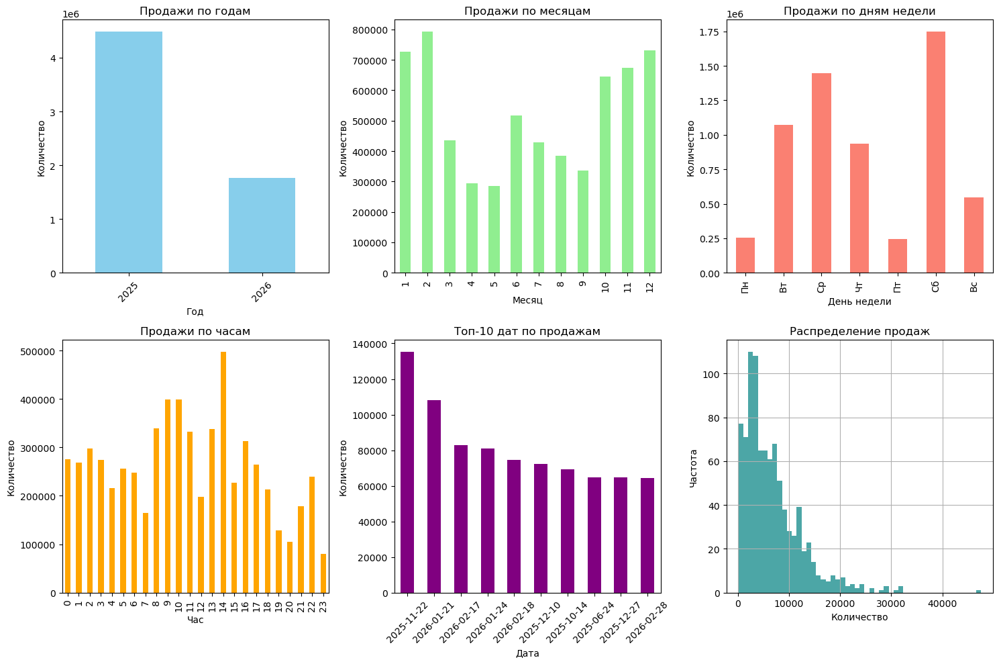


 Сохраняем в Minio: sales-analytics/Мас.Тандер.72,5_.180г.фол.12шт
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.Тандер.72,5_.180г.фол.12шт/временной_анализ_20260313.pdf
    Всего сохранено: 1 объектов

 АНАЛИЗ ПО ОРГАНИЗАЦИЯМ И КОНТРАГЕНТАМ

Статистика по организациям:
                    Количество                       Сумма
                           sum     mean count          sum
Организация                                               
ООО "ВоронежАгро-М"  6249120.0  6741.23   927  818480653.8

Статистика по контрагентам (топ-10):
                          Количество                         Сумма
                                 sum      mean count           sum
Контрагент                                                        
Тандер ЗАО (Ерзовка РЦ)    1331304.0  10736.32   124  1.746722e+08
Тандер ЗАО (Воронеж РЦ)    1197072.0   8255.67   145  1.562077e+08
Тандер ЗАО (Ярославль РЦ)   873312.0   9924.00    88  1.149633e+08
Тандер ЗАО (Тула РЦ)        730824.0   

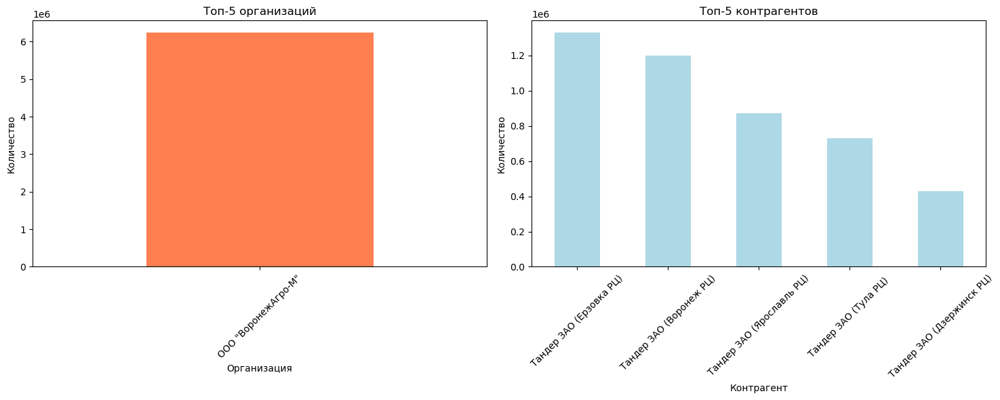


 Сохраняем в Minio: sales-analytics/Мас.Тандер.72,5_.180г.фол.12шт
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.Тандер.72,5_.180г.фол.12шт/организации_контрагенты_20260313.pdf
    Всего сохранено: 1 объектов

 Статистика продаж:
count      927.000000
mean      6741.229773
std       5595.063047
min        132.000000
25%       2652.000000
50%       5304.000000
75%       9372.000000
max      47496.000000
Name: Количество, dtype: float64

 Топ-10 самых больших продаж:
                   Дата  Количество    Цена      Сумма
74  2026-02-17 02:36:38     47496.0  677.78  5794512.0
147 2026-01-22 10:26:34     32232.0  677.78  3932304.0
307 2025-11-25 08:46:46     31824.0  677.78  3882528.0
200 2025-12-30 13:26:26     31416.0  677.78  3832752.0
139 2026-01-24 18:25:18     30888.0  677.78  3768336.0
265 2025-12-10 15:03:57     29172.0  677.78  3558984.0
419 2025-10-14 09:15:24     28968.0  677.78  3534096.0
209 2025-12-27 15:00:36     28560.0  677.78  3484320.0
14  2026-03-08 08:52:

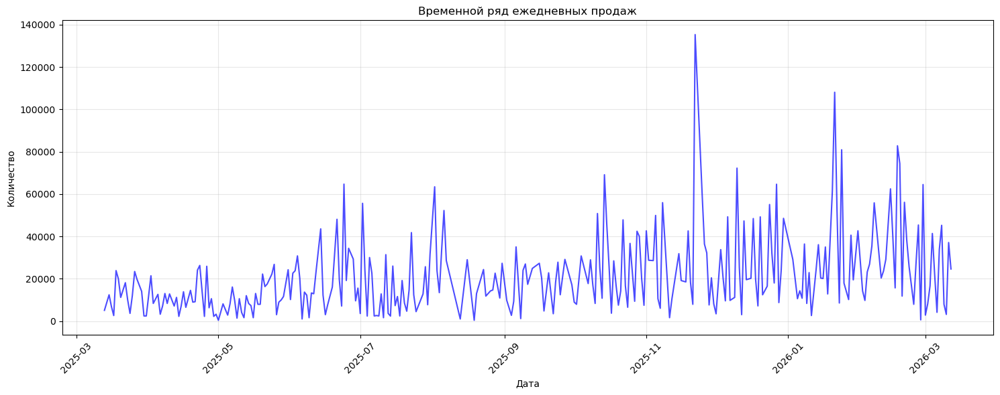


 Сохраняем в Minio: sales-analytics/Мас.Тандер.72,5_.180г.фол.12шт
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.Тандер.72,5_.180г.фол.12шт/временной_ряд_со_средними_20260313.pdf
    Всего сохранено: 1 объектов


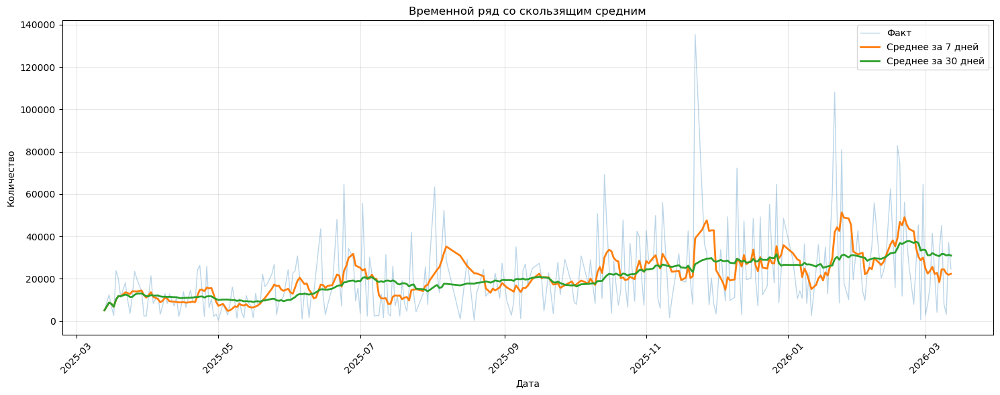


 Сохраняем в Minio: sales-analytics/Мас.Тандер.72,5_.180г.фол.12шт
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.Тандер.72,5_.180г.фол.12шт/сезонность_и_корреляции_20260313.pdf
    Всего сохранено: 1 объектов


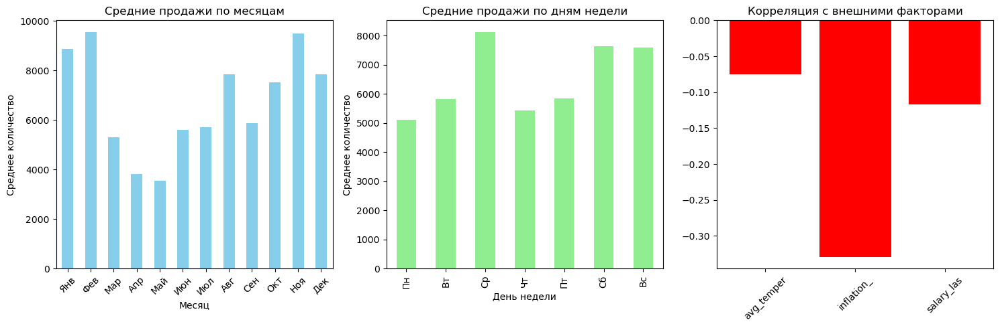


 Анализ временных рядов для Мас.Тандер.72,5%.180г.фол.12шт завершен

 АНАЛИЗ ПО ГОРОДАМ
          Количество                         Сумма
                 sum      mean count           sum
город                                             
Волгоград  1331304.0  10736.32   124  1.746722e+08
Воронеж    1197072.0   8255.67   145  1.562077e+08
Ярославль   873312.0   9924.00    88  1.149633e+08
Тула        730824.0   6467.47   113  9.590255e+07
Дзержинск   428760.0   5641.58    76  5.533794e+07
Тамбов      399000.0   2790.21   143  5.212915e+07
Дмитров     212676.0   4726.13    45  3.146625e+07
Орел        243432.0   6241.85    39  2.969870e+07
Смоленск    220848.0   5662.77    39  2.694346e+07
Мурманск    175092.0   5305.82    33  2.484000e+07

 АНАЛИЗ ВНЕШНИХ ПРИЗНАКОВ для Мас.Тандер.72,5%.180г.фол.12шт

 Доступные признаки: ['avg_temperature', 'inflation_rate', 'salary_last_known', 'salary_trend_slope', 'salary_avg_growth_3y', 'total_population']

 КОРРЕЛЯЦИЯ С ПРОДАЖАМИ:
   avg_temper

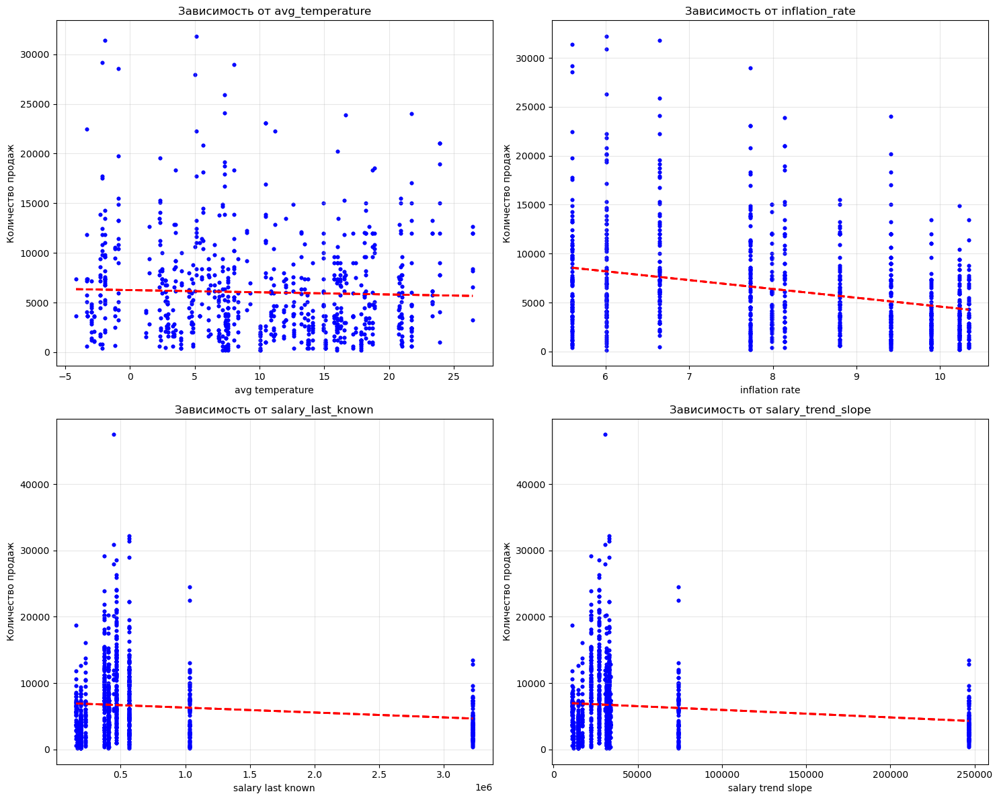


 Анализ для Мас.Тандер.72,5%.180г.фол.12шт завершен

 АНАЛИЗ НОМЕНКЛАТУРЫ: Мас.КУ.82,5%.20кг.полиэт.
 Данных: 11 записей


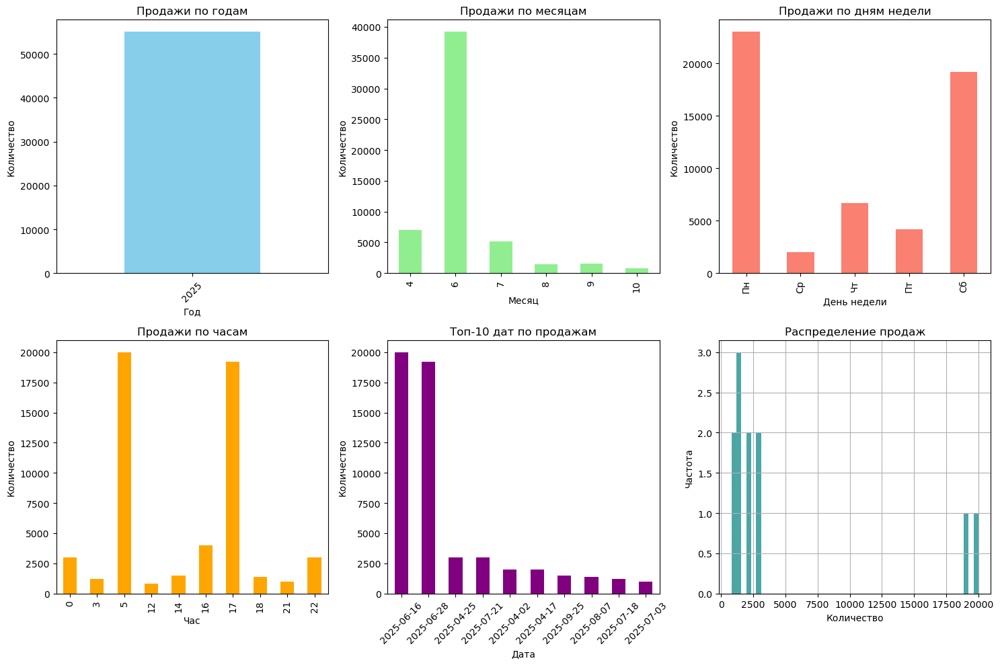


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.полиэт.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт./временной_анализ_20260313.pdf
    Всего сохранено: 1 объектов

 АНАЛИЗ ПО ОРГАНИЗАЦИЯМ И КОНТРАГЕНТАМ

Статистика по организациям:
             Количество                      Сумма
                    sum     mean count         sum
Организация                                       
ООО "7 Утра"    55060.0  5005.45    11  39484000.0

Статистика по контрагентам (топ-10):
                                          Количество                 \
                                                 sum     mean count   
Контрагент                                                            
АЙСБЕРРИ-ФМ  ООО                             20000.0  20000.0     1   
ВОЛОГОДСКОЕ МОРОЖЕНОЕ ООО                    19200.0  19200.0     1   
Стояновская Е.А. ИП                           5860.0   1172.0     5   
КУРСКИЙ СЫРОДЕЛЬНЫЙ ЗАВОД ООО (самовывоз)     5000.0   25

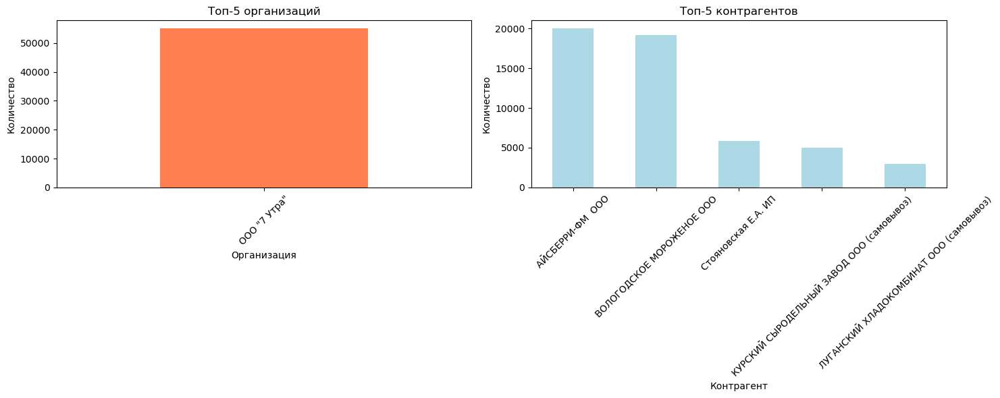


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.полиэт.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт./организации_контрагенты_20260313.pdf
    Всего сохранено: 1 объектов

 Статистика продаж:
count       11.000000
mean      5005.454545
std       7254.317836
min        800.000000
25%       1300.000000
50%       2000.000000
75%       3000.000000
max      20000.000000
Name: Количество, dtype: float64

 Топ-10 самых больших продаж:
                   Дата  Количество   Цена       Сумма
934 2025-06-16 05:26:28     20000.0  782.0  15640000.0
933 2025-06-28 17:28:03     19200.0  650.0  12480000.0
930 2025-07-21 22:17:17      3000.0  680.0   2040000.0
935 2025-04-25 00:00:26      3000.0  660.0   1980000.0
936 2025-04-17 16:43:35      2000.0  770.0   1540000.0
937 2025-04-02 16:35:25      2000.0  740.0   1480000.0
928 2025-09-25 14:41:15      1500.0  760.0   1140000.0
929 2025-08-07 18:02:18      1400.0  760.0   1064000.0
931 2025-07-18 03:16:46      12

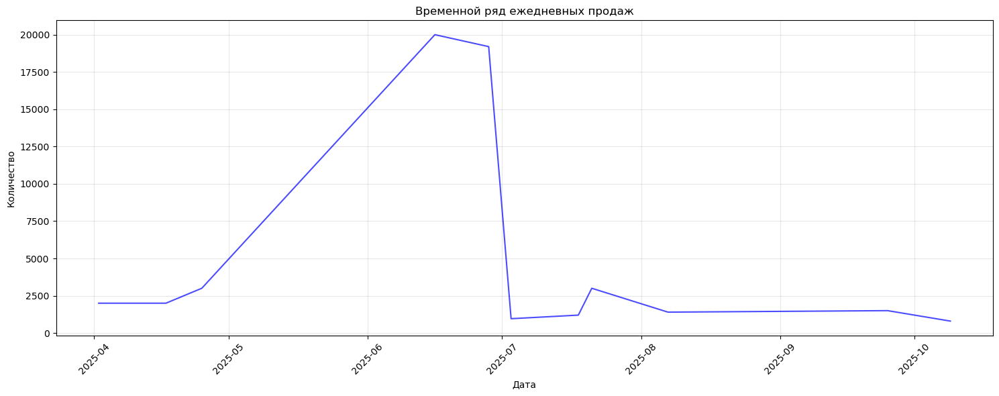


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.полиэт.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт./временной_ряд_со_средними_20260313.pdf
    Всего сохранено: 1 объектов


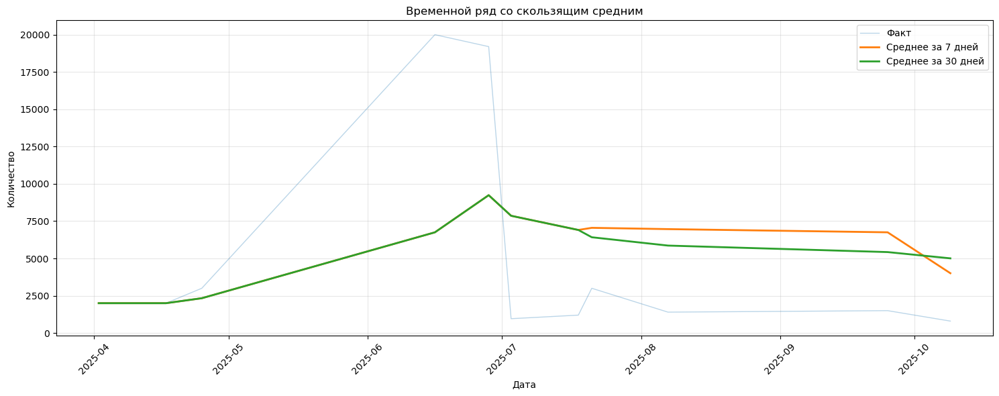


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.полиэт.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт./сезонность_и_корреляции_20260313.pdf
    Всего сохранено: 1 объектов


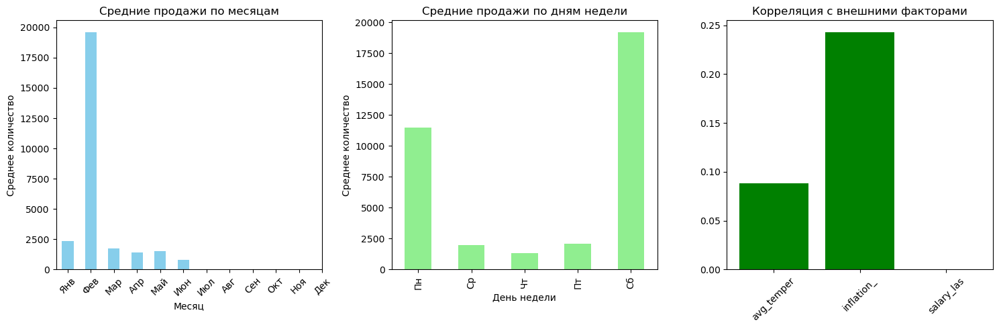


 Анализ временных рядов для Мас.КУ.82,5%.20кг.полиэт. завершен

 АНАЛИЗ ПО ГОРОДАМ
             Количество                      Сумма
                    sum     mean count         sum
город                                             
Ярославль       20000.0  20000.0     1  15640000.0
Вологда         19200.0  19200.0     1  12480000.0
Петрозаводск     5860.0   1172.0     5   4324000.0
Курск            5000.0   2500.0     2   3520000.0
Луганск          3000.0   3000.0     1   2040000.0
Астрахань        2000.0   2000.0     1   1480000.0

 АНАЛИЗ ВНЕШНИХ ПРИЗНАКОВ для Мас.КУ.82,5%.20кг.полиэт.

 Доступные признаки: ['avg_temperature', 'inflation_rate', 'salary_last_known', 'salary_trend_slope', 'salary_avg_growth_3y', 'total_population']

 КОРРЕЛЯЦИЯ С ПРОДАЖАМИ:
   avg_temperature: 0.088
   inflation_rate: 0.243
   total_population: nan

 ТОП-3 ВЛИЯЮЩИХ ПРИЗНАКА:
   inflation_rate: 0.243
   avg_temperature: 0.088
   total_population: nan


/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


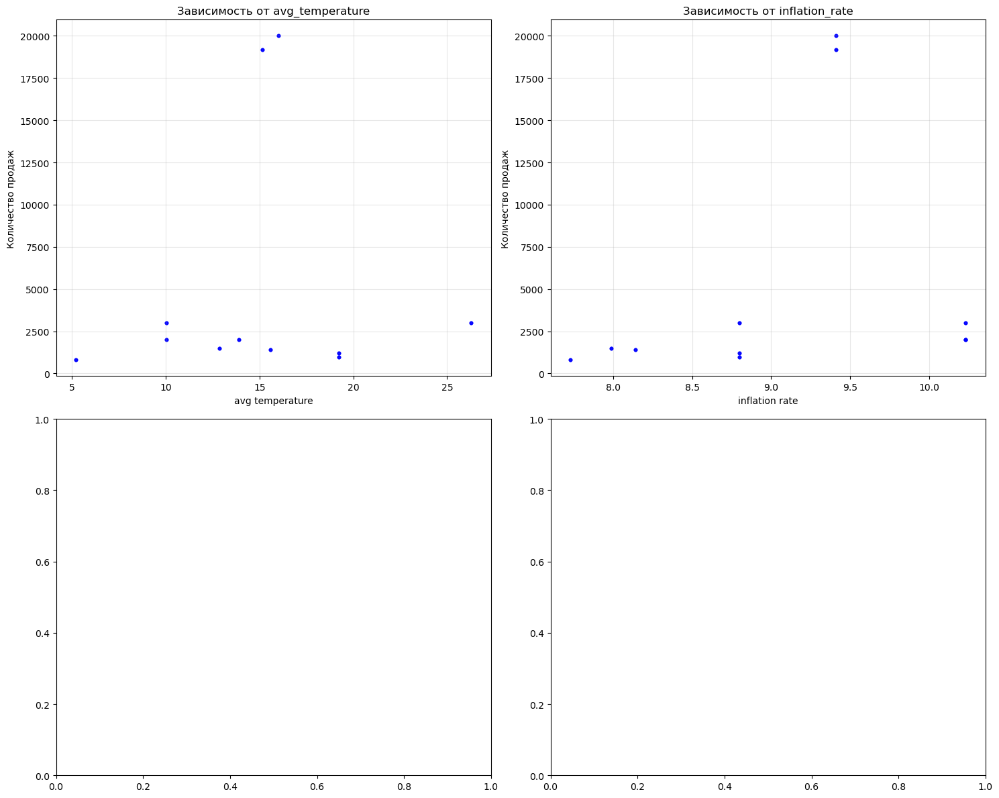


 Анализ для Мас.КУ.82,5%.20кг.полиэт. завершен

 АНАЛИЗ НОМЕНКЛАТУРЫ: Мас.82,5%.5кг.полиэт.
 Данных: 22 записей


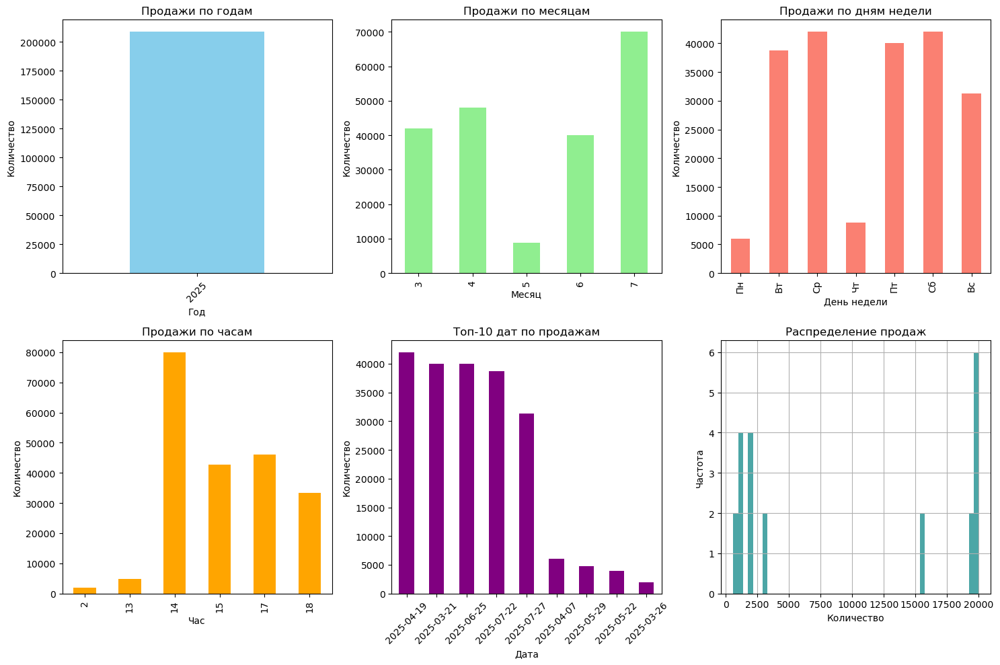


 Сохраняем в Minio: sales-analytics/Мас.82,5_.5кг.полиэт.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.5кг.полиэт./временной_анализ_20260313.pdf
    Всего сохранено: 1 объектов

 АНАЛИЗ ПО ОРГАНИЗАЦИЯМ И КОНТРАГЕНТАМ

Статистика по организациям:
             Количество                       Сумма
                    sum     mean count          sum
Организация                                        
ООО "7 Утра"   208800.0  9490.91    22  144518000.0

Статистика по контрагентам (топ-10):
                                          Количество                 \
                                                 sum     mean count   
Контрагент                                                            
Продсервис ООО (Крым) САМОВЫВОЗ             190000.0  19000.0    10   
КУРСКИЙ СЫРОДЕЛЬНЫЙ ЗАВОД ООО (самовывоз)    15200.0   1520.0    10   
МАСЛОЗАВОД ООО (самовывоз)                    3600.0   1800.0     2   

                                                 Сумма  
   

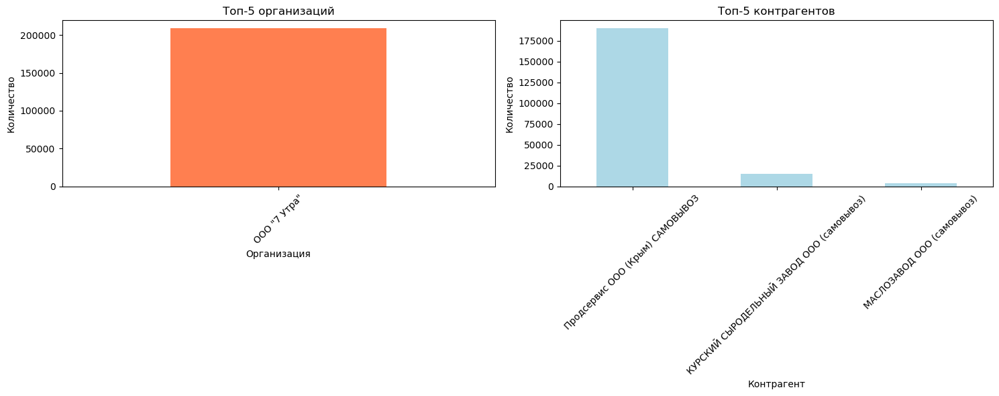


 Сохраняем в Minio: sales-analytics/Мас.82,5_.5кг.полиэт.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.5кг.полиэт./организации_контрагенты_20260313.pdf
    Всего сохранено: 1 объектов

 Статистика продаж:
count       22.000000
mean      9490.909091
std       8981.961239
min        600.000000
25%       1200.000000
50%       3000.000000
75%      19837.500000
max      20000.000000
Name: Количество, dtype: float64

 Топ-10 самых больших продаж:
                   Дата  Количество   Цена       Сумма
940 2025-06-25 14:58:10     20000.0  646.0  12920000.0
944 2025-04-19 14:03:49     20000.0  700.0  14000000.0
948 2025-03-21 17:08:28     20000.0  755.0  15100000.0
953 2025-06-25 14:58:10     20000.0  646.0  12920000.0
957 2025-04-19 14:03:49     20000.0  700.0  14000000.0
961 2025-03-21 17:08:28     20000.0  755.0  15100000.0
939 2025-07-22 15:12:15     19350.0  680.0  13158000.0
952 2025-07-22 15:12:15     19350.0  680.0  13158000.0
938 2025-07-27 18:07:24     15650.0  68

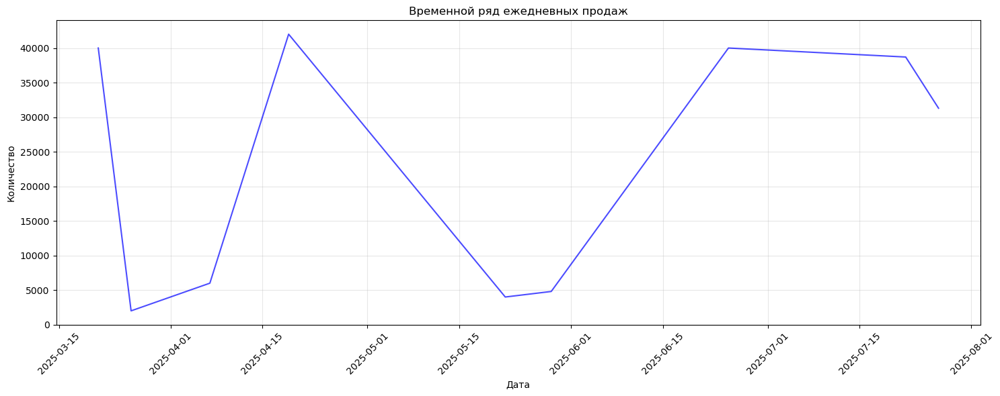


 Сохраняем в Minio: sales-analytics/Мас.82,5_.5кг.полиэт.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.5кг.полиэт./временной_ряд_со_средними_20260313.pdf
    Всего сохранено: 1 объектов


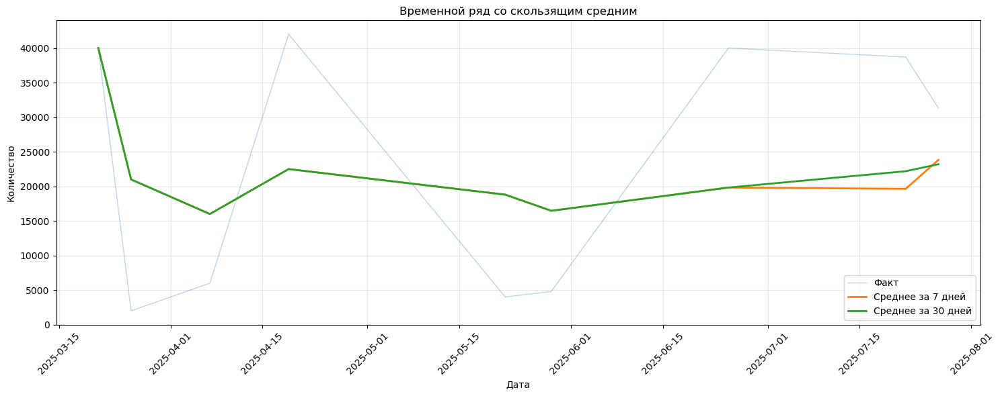


 Сохраняем в Minio: sales-analytics/Мас.82,5_.5кг.полиэт.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.5кг.полиэт./сезонность_и_корреляции_20260313.pdf
    Всего сохранено: 1 объектов


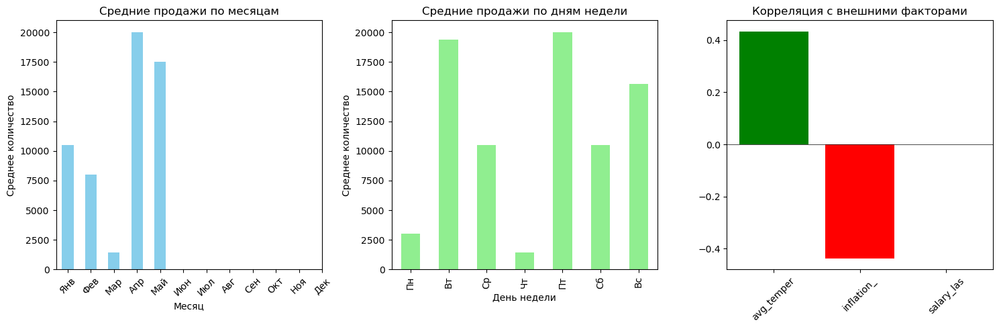


 Анализ временных рядов для Мас.82,5%.5кг.полиэт. завершен

 АНАЛИЗ ПО ГОРОДАМ
            Количество                        Сумма
                   sum      mean count          sum
город                                              
Симферополь   190000.0  19000.00    10  131640000.0
Курск          18800.0   1566.67    12   12878000.0

 АНАЛИЗ ВНЕШНИХ ПРИЗНАКОВ для Мас.82,5%.5кг.полиэт.

 Доступные признаки: ['avg_temperature', 'inflation_rate', 'salary_last_known', 'salary_trend_slope', 'salary_avg_growth_3y', 'total_population']

 КОРРЕЛЯЦИЯ С ПРОДАЖАМИ:
   avg_temperature: 0.433
   inflation_rate: -0.437
   salary_last_known: 0.000
   salary_trend_slope: -0.000
   salary_avg_growth_3y: nan
   total_population: nan

 ТОП-3 ВЛИЯЮЩИХ ПРИЗНАКА:
   inflation_rate: -0.437
   avg_temperature: 0.433
   salary_last_known: 0.000


/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/tmp/ipykernel_78318/3584384596.py:309: RankWarning: Polyfit may be poorly conditioned
  analyze_external_features(df, product_name)
/tmp/ipykernel_78318/3584384596.py:309: RankWarning: Polyfit may be poorly conditioned
  analyze_external_features(df, product_name)
/tmp/ipykernel_78318/3584384596.py:309: RankWarning: Polyfit may be poorly conditioned
  analyze_external_features(df, product_name)
/tmp/ipyk

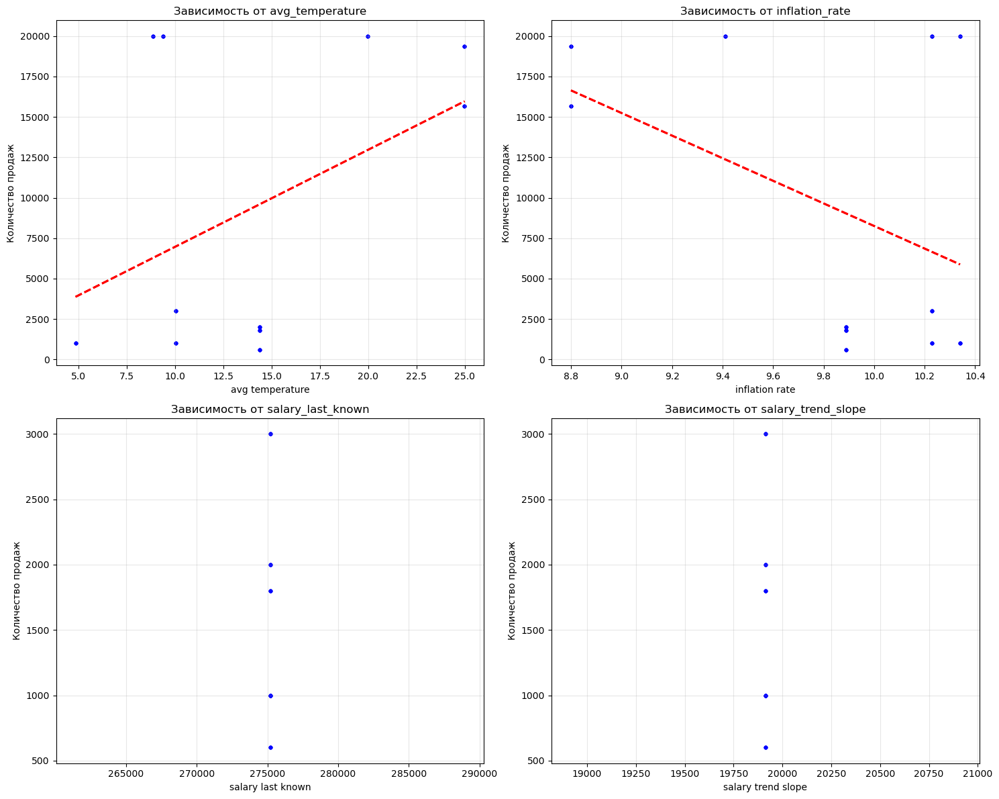


 Анализ для Мас.82,5%.5кг.полиэт. завершен

 АНАЛИЗ НОМЕНКЛАТУРЫ: Мас.КУ.82,5%.20кг.перг.
 Данных: 2 записей


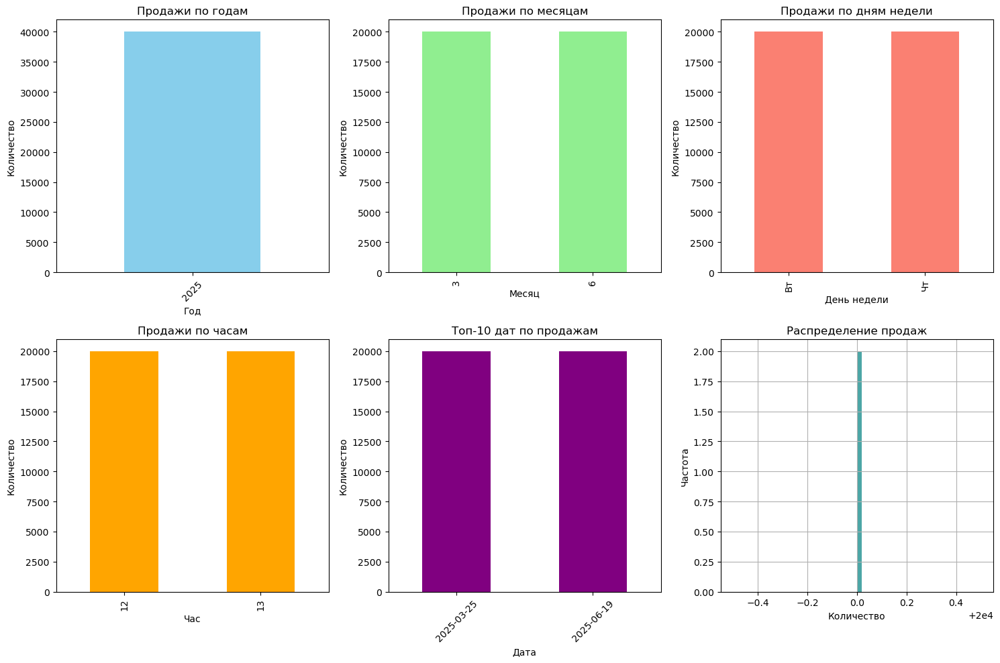


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.перг.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.перг./временной_анализ_20260313.pdf
    Всего сохранено: 1 объектов

 АНАЛИЗ ПО ОРГАНИЗАЦИЯМ И КОНТРАГЕНТАМ

Статистика по организациям:
             Количество                      Сумма
                    sum     mean count         sum
Организация                                       
ООО "7 Утра"    40000.0  20000.0     2  27800000.0

Статистика по контрагентам (топ-10):
                         Количество                      Сумма
                                sum     mean count         sum
Контрагент                                                    
ВЛАДПРОМСЫР ООО Вашутино    40000.0  20000.0     2  27800000.0


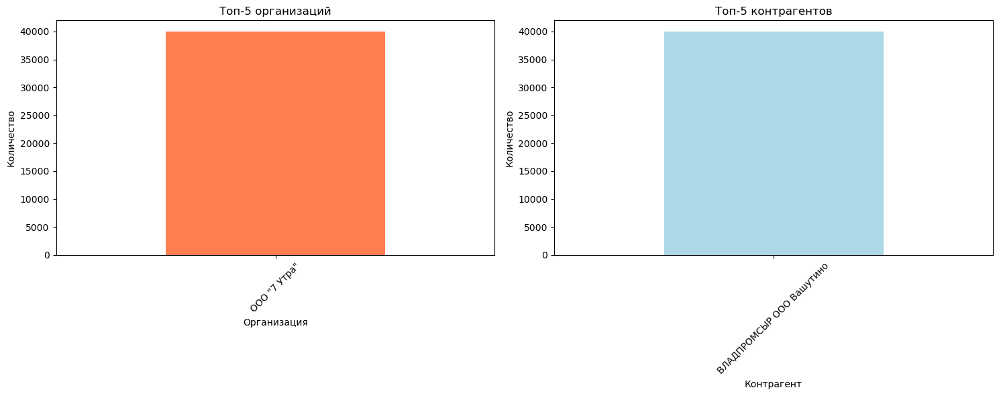


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.перг.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.перг./организации_контрагенты_20260313.pdf
    Всего сохранено: 1 объектов

 Статистика продаж:
count        2.0
mean     20000.0
std          0.0
min      20000.0
25%      20000.0
50%      20000.0
75%      20000.0
max      20000.0
Name: Количество, dtype: float64

 Топ-10 самых больших продаж:
                   Дата  Количество   Цена       Сумма
949 2025-06-19 12:17:43     20000.0  645.0  12900000.0
950 2025-03-25 13:48:46     20000.0  745.0  14900000.0

⬇ Топ-10 самых маленьких продаж (не считая 0):
                   Дата  Количество   Цена       Сумма
949 2025-06-19 12:17:43     20000.0  645.0  12900000.0
950 2025-03-25 13:48:46     20000.0  745.0  14900000.0

 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.перг.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.перг./временной_ряд_20260313.pdf
    Всего сохранено: 1 об

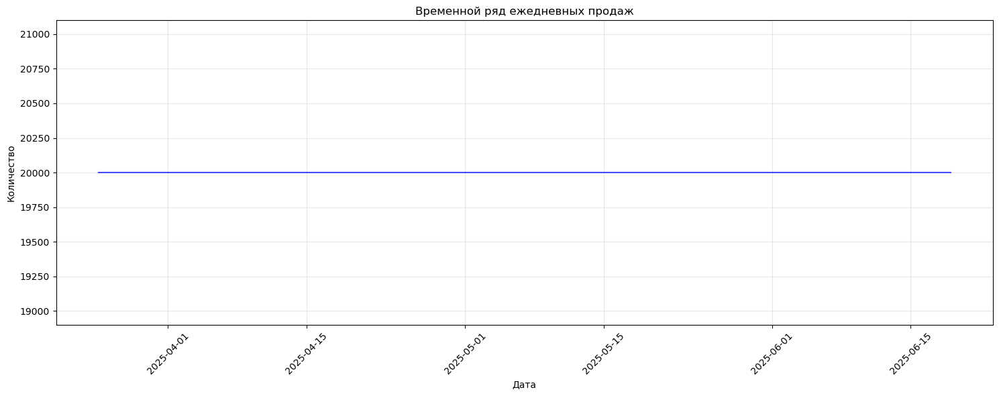


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.перг.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.перг./временной_ряд_со_средними_20260313.pdf
    Всего сохранено: 1 объектов


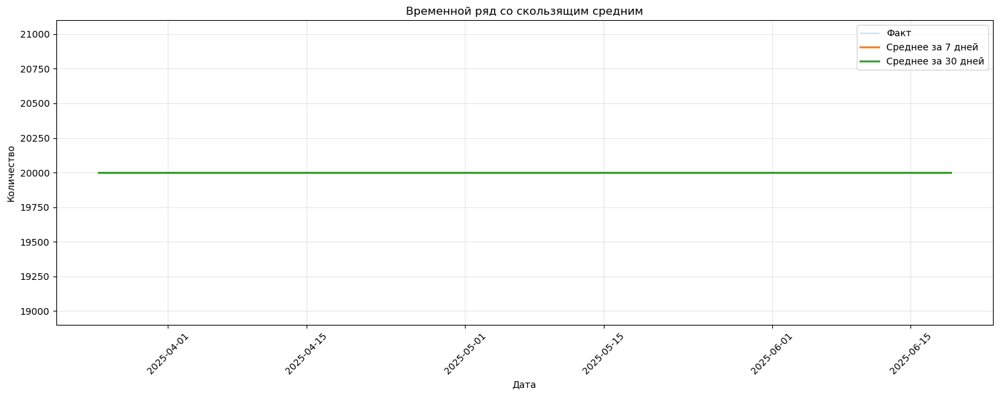


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.перг.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.перг./сезонность_и_корреляции_20260313.pdf
    Всего сохранено: 1 объектов


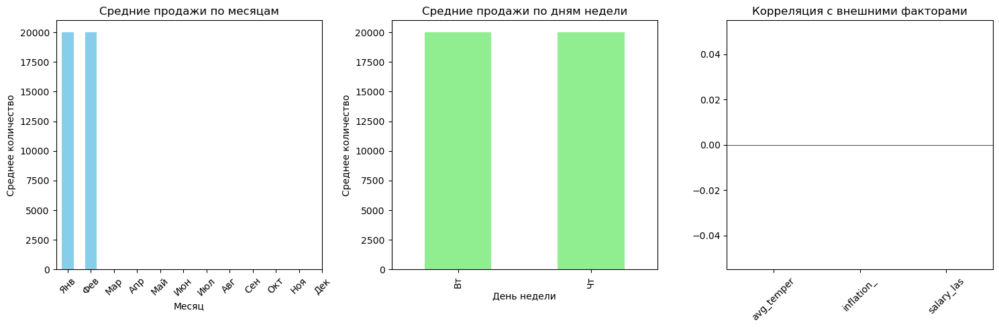


 Анализ временных рядов для Мас.КУ.82,5%.20кг.перг. завершен

 АНАЛИЗ ВНЕШНИХ ПРИЗНАКОВ для Мас.КУ.82,5%.20кг.перг.

 Доступные признаки: ['avg_temperature', 'inflation_rate', 'salary_last_known', 'salary_trend_slope', 'salary_avg_growth_3y', 'total_population']

 КОРРЕЛЯЦИЯ С ПРОДАЖАМИ:


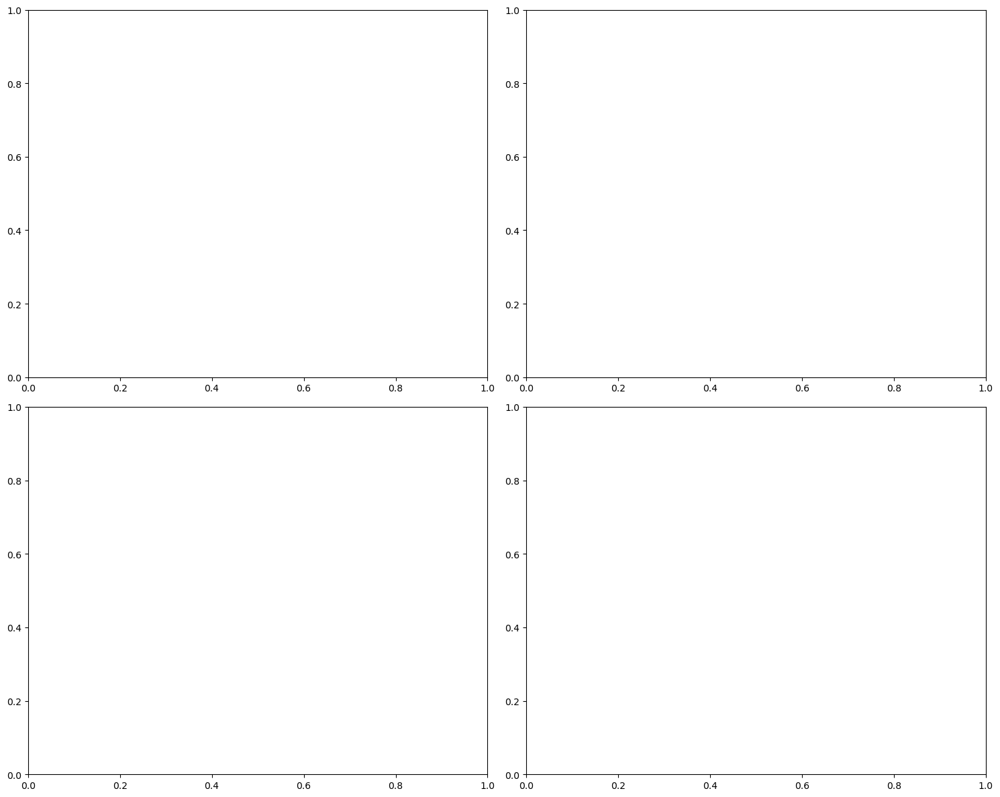


 Анализ для Мас.КУ.82,5%.20кг.перг. завершен

 АНАЛИЗ НОМЕНКЛАТУРЫ: Мас.КУ.82,5%.20кг.полиэт.(61,5)
 Данных: 9 записей


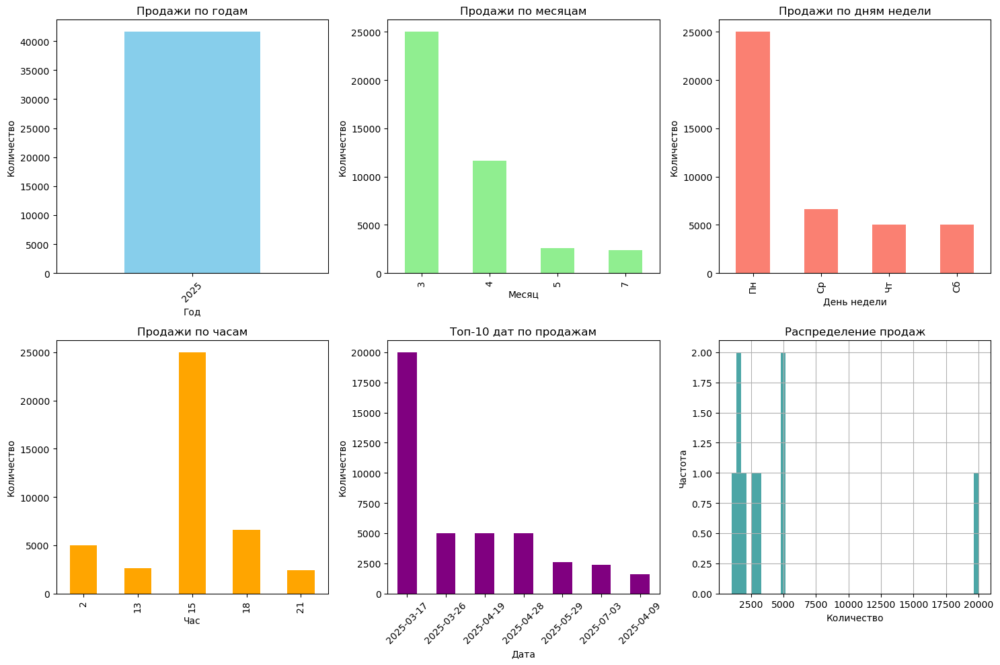


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.полиэт.(61,5)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт.(61,5)/временной_анализ_20260313.pdf
    Всего сохранено: 1 объектов

 АНАЛИЗ ПО ОРГАНИЗАЦИЯМ И КОНТРАГЕНТАМ

Статистика по организациям:
             Количество                      Сумма
                    sum     mean count         sum
Организация                                       
ООО "7 Утра"    41620.0  4624.44     9  23966560.0

Статистика по контрагентам (топ-10):
                                Количество                      Сумма
                                       sum     mean count         sum
Контрагент                                                           
МИЛКО ООО (самовывоз)              20000.0  20000.0     1  12300000.0
МОЛОЧНЫЕ БЕРЕГА ООО (самовывоз)    21620.0   2702.5     8  11666560.0


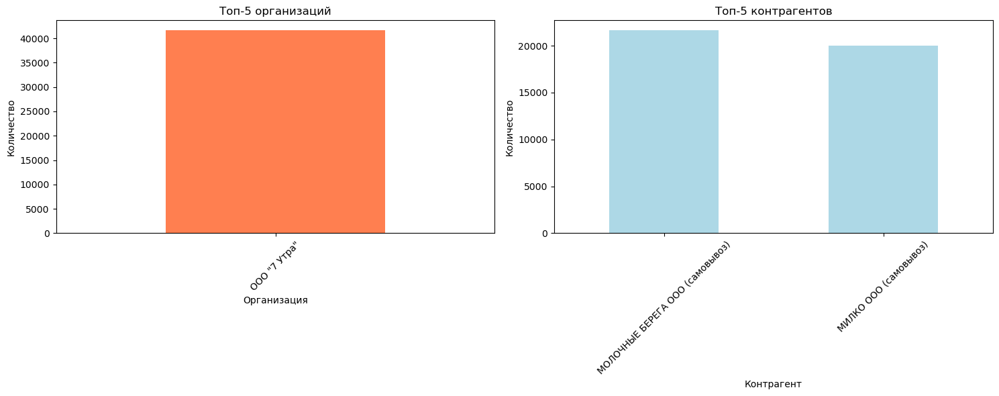


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.полиэт.(61,5)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт.(61,5)/организации_контрагенты_20260313.pdf
    Всего сохранено: 1 объектов

 Статистика продаж:
count        9.000000
mean      4624.444444
std       5946.375180
min       1000.000000
25%       1620.000000
50%       2600.000000
75%       5000.000000
max      20000.000000
Name: Количество, dtype: float64

 Топ-10 самых больших продаж:
                   Дата  Количество   Цена       Сумма
970 2025-03-17 15:47:42     20000.0  615.0  12300000.0
965 2025-04-28 15:05:47      5000.0  538.0   2690000.0
969 2025-03-26 18:11:28      5000.0  545.0   2725000.0
966 2025-04-19 02:18:22      3000.0  538.0   1614000.0
964 2025-05-29 13:51:11      2600.0  538.0   1398800.0
967 2025-04-19 02:18:08      2000.0  538.0   1076000.0
968 2025-04-09 18:33:33      1620.0  538.0    871560.0
962 2025-07-03 21:06:26      1400.0  538.0    753200.0
963 2025-07-03 21:0

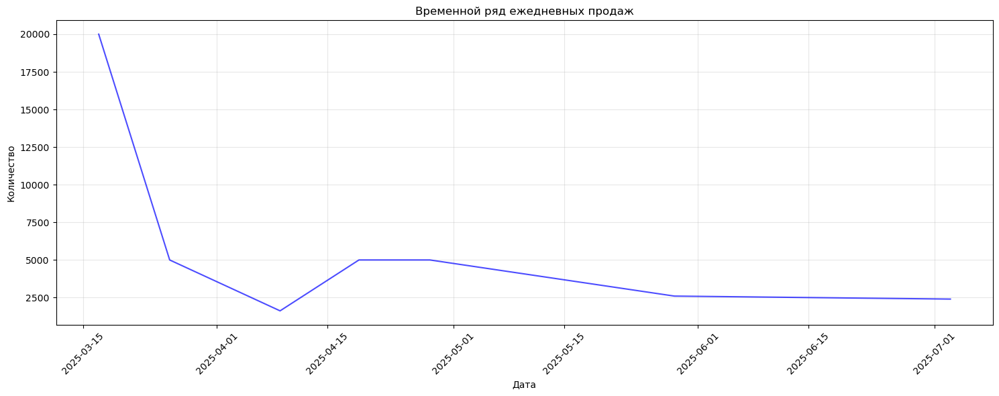


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.полиэт.(61,5)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт.(61,5)/временной_ряд_со_средними_20260313.pdf
    Всего сохранено: 1 объектов


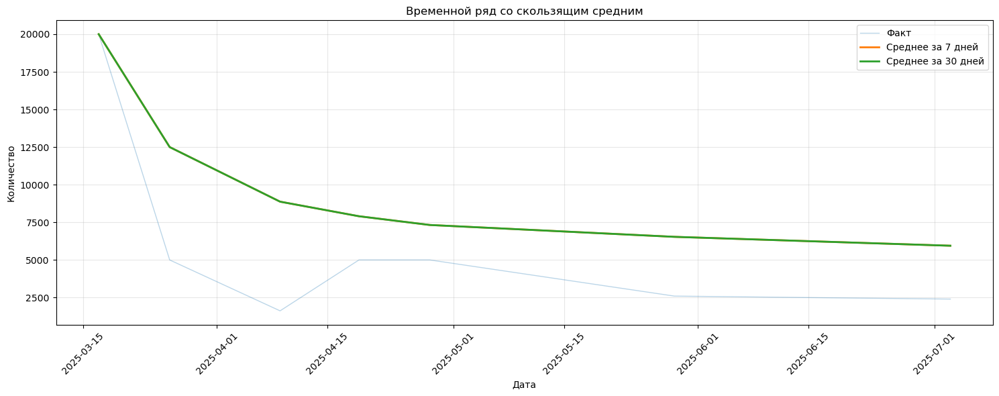

/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]



 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.полиэт.(61,5)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт.(61,5)/сезонность_и_корреляции_20260313.pdf
    Всего сохранено: 1 объектов


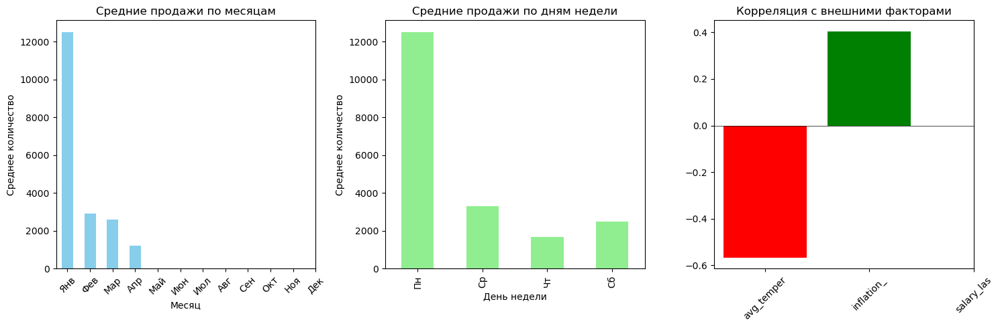


 Анализ временных рядов для Мас.КУ.82,5%.20кг.полиэт.(61,5) завершен

 АНАЛИЗ ВНЕШНИХ ПРИЗНАКОВ для Мас.КУ.82,5%.20кг.полиэт.(61,5)

 Доступные признаки: ['avg_temperature', 'inflation_rate', 'salary_last_known', 'salary_trend_slope', 'salary_avg_growth_3y', 'total_population']

 КОРРЕЛЯЦИЯ С ПРОДАЖАМИ:
   avg_temperature: -0.566
   inflation_rate: 0.403
   salary_last_known: nan
   salary_trend_slope: nan
   salary_avg_growth_3y: nan
   total_population: nan

 ТОП-3 ВЛИЯЮЩИХ ПРИЗНАКА:
   avg_temperature: -0.566
   inflation_rate: 0.403
   salary_last_known: nan


/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encounter

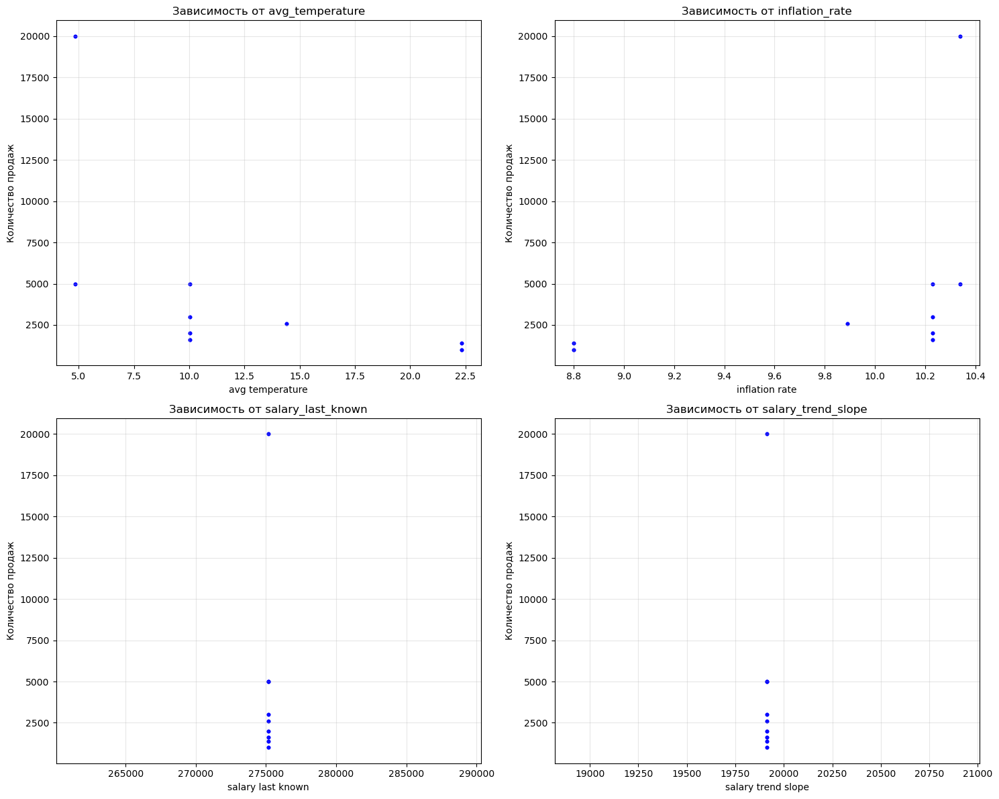


 Анализ для Мас.КУ.82,5%.20кг.полиэт.(61,5) завершен

 АНАЛИЗ НОМЕНКЛАТУРЫ: Мас.72,5%.10кг.полиэт.$
 Данных: 18 записей


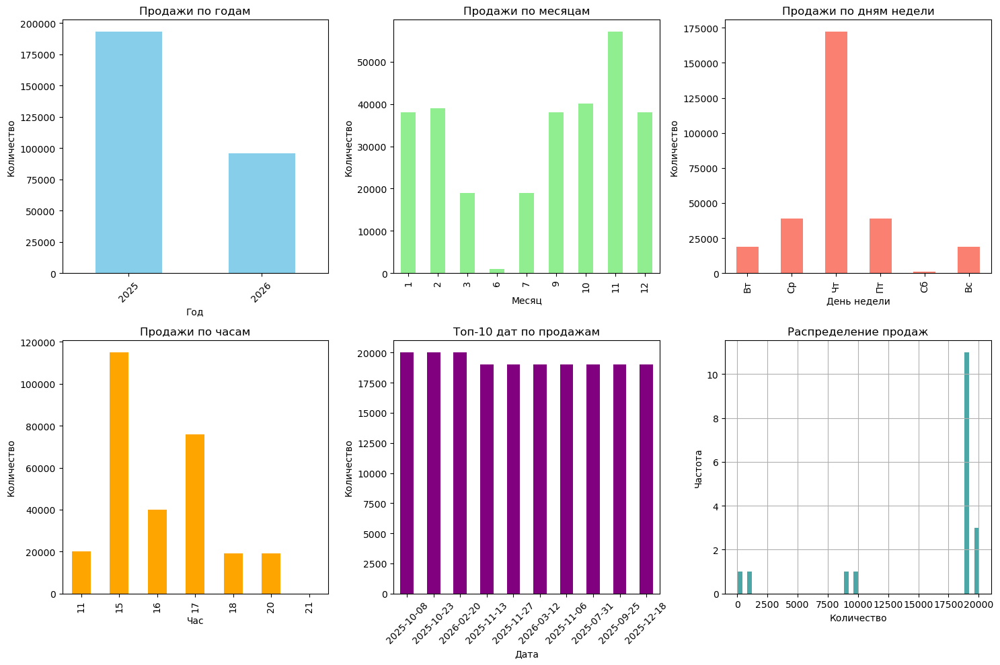


 Сохраняем в Minio: sales-analytics/Мас.72,5_.10кг.полиэт.$
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.72,5_.10кг.полиэт.$/временной_анализ_20260313.pdf
    Всего сохранено: 1 объектов

 АНАЛИЗ ПО ОРГАНИЗАЦИЯМ И КОНТРАГЕНТАМ

Статистика по организациям:
             Количество                       Сумма
                    sum      mean count         sum
Организация                                        
ООО "7 Утра"   289150.0  16063.89    18  77292600.0

Статистика по контрагентам (топ-10):
                           Количество                       Сумма
                                  sum      mean count         sum
Контрагент                                                       
Кисиль А.В. ИП (самовывоз)   289150.0  16063.89    18  77292600.0


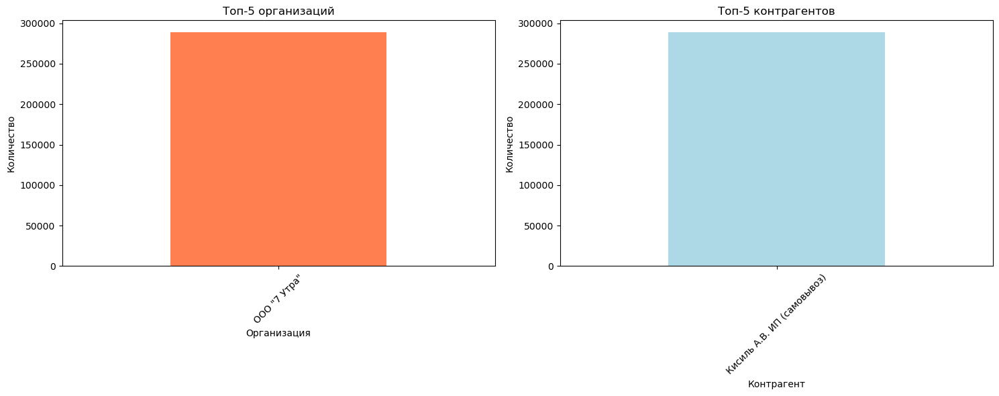


 Сохраняем в Minio: sales-analytics/Мас.72,5_.10кг.полиэт.$
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.72,5_.10кг.полиэт.$/организации_контрагенты_20260313.pdf
    Всего сохранено: 1 объектов

 Статистика продаж:
count       18.000000
mean     16063.888889
std       6477.975482
min         10.000000
25%      18992.500000
50%      19000.000000
75%      19027.500000
max      20030.000000
Name: Количество, dtype: float64

 Топ-10 самых больших продаж:
                   Дата  Количество   Цена      Сумма
983 2025-10-23 16:53:14     20030.0  270.0  5408100.0
984 2025-10-08 16:47:03     20030.0  270.0  5408100.0
973 2026-02-20 15:31:04     20000.0  270.0  5400000.0
979 2025-11-27 15:01:16     19030.0  270.0  5138100.0
980 2025-11-13 18:57:01     19030.0  270.0  5138100.0
972 2026-03-12 17:22:02     19020.0  270.0  5135400.0
974 2026-02-03 15:59:36     19000.0  270.0  5130000.0
975 2026-01-28 15:56:39     19000.0  270.0  5130000.0
976 2026-01-23 15:44:29     19000.0  270.0  

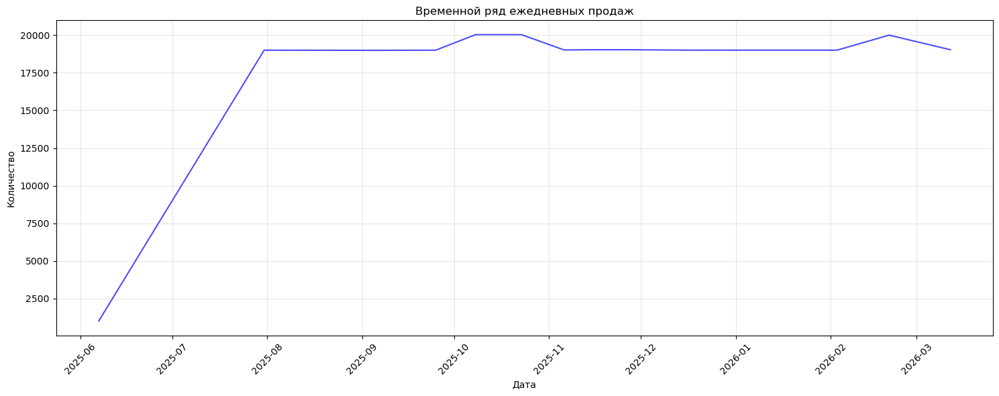


 Сохраняем в Minio: sales-analytics/Мас.72,5_.10кг.полиэт.$
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.72,5_.10кг.полиэт.$/временной_ряд_со_средними_20260313.pdf
    Всего сохранено: 1 объектов


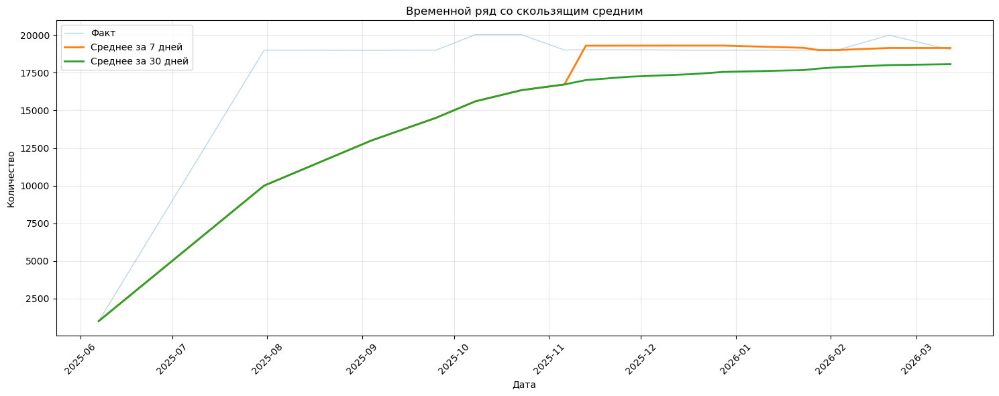

/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]



 Сохраняем в Minio: sales-analytics/Мас.72,5_.10кг.полиэт.$
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.72,5_.10кг.полиэт.$/сезонность_и_корреляции_20260313.pdf
    Всего сохранено: 1 объектов


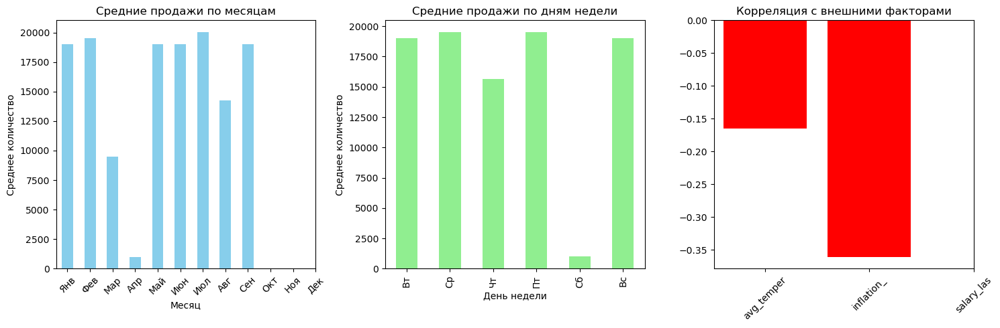


 Анализ временных рядов для Мас.72,5%.10кг.полиэт.$ завершен

 АНАЛИЗ ВНЕШНИХ ПРИЗНАКОВ для Мас.72,5%.10кг.полиэт.$

 Доступные признаки: ['avg_temperature', 'inflation_rate', 'salary_last_known', 'salary_trend_slope', 'salary_avg_growth_3y', 'total_population']

 КОРРЕЛЯЦИЯ С ПРОДАЖАМИ:
   avg_temperature: -0.165
   inflation_rate: -0.361
   salary_last_known: nan
   salary_trend_slope: nan
   salary_avg_growth_3y: nan
   total_population: 0.007

 ТОП-3 ВЛИЯЮЩИХ ПРИЗНАКА:
   inflation_rate: -0.361
   avg_temperature: -0.165
   salary_last_known: nan


/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.11/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/tmp/ipykernel_78318/3584384596.py:309: RankWarning: Polyfit may be poorly conditioned
  analyze_external_featur

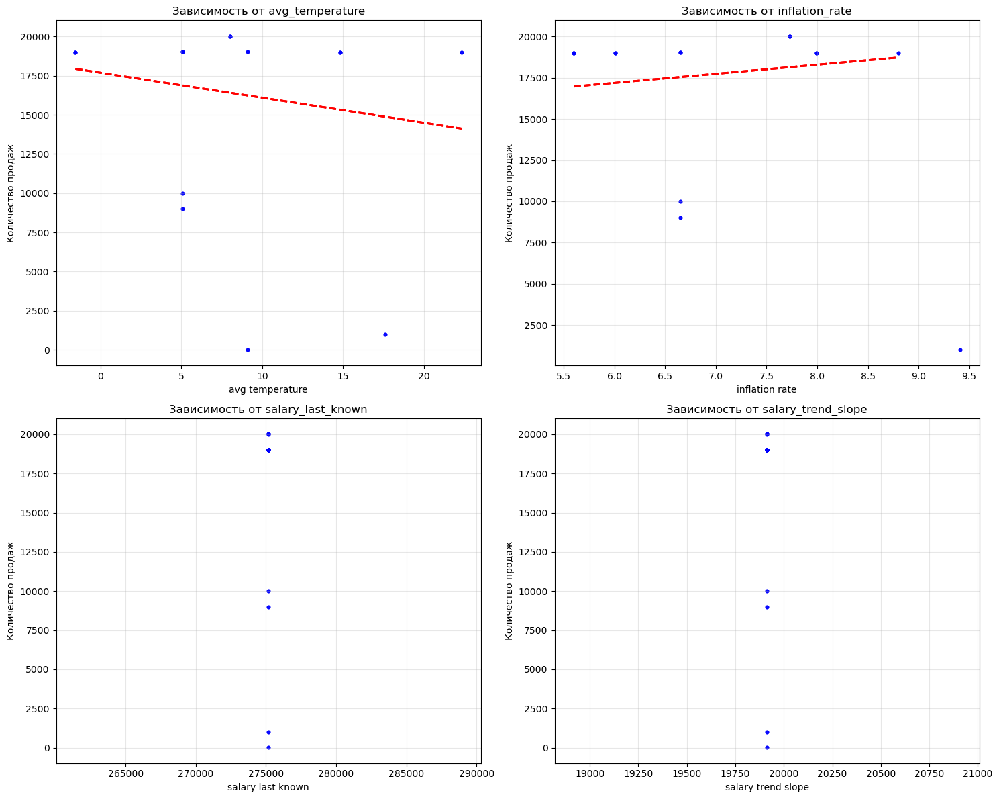


 Анализ для Мас.72,5%.10кг.полиэт.$ завершен

 АНАЛИЗ НОМЕНКЛАТУРЫ: Мас.82,5%.20 кг.полиэт(01030)
 Данных: 1 записей


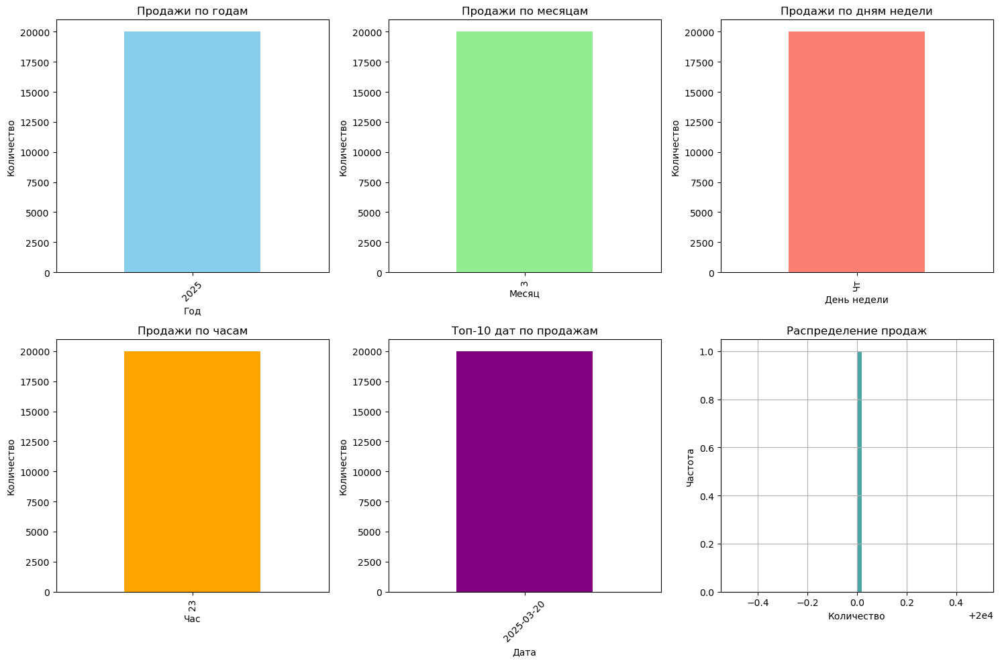


 Сохраняем в Minio: sales-analytics/Мас.82,5_.20 кг.полиэт(01030)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.20 кг.полиэт(01030)/временной_анализ_20260313.pdf
    Всего сохранено: 1 объектов

 АНАЛИЗ ПО ОРГАНИЗАЦИЯМ И КОНТРАГЕНТАМ

Статистика по организациям:
             Количество                     Сумма
                    sum     mean count        sum
Организация                                      
ООО "7 Утра"    20000.0  20000.0     1  5600000.0

Статистика по контрагентам (топ-10):
                      Количество                     Сумма
                             sum     mean count        sum
Контрагент                                                
МИЛКО ООО (самовывоз)    20000.0  20000.0     1  5600000.0


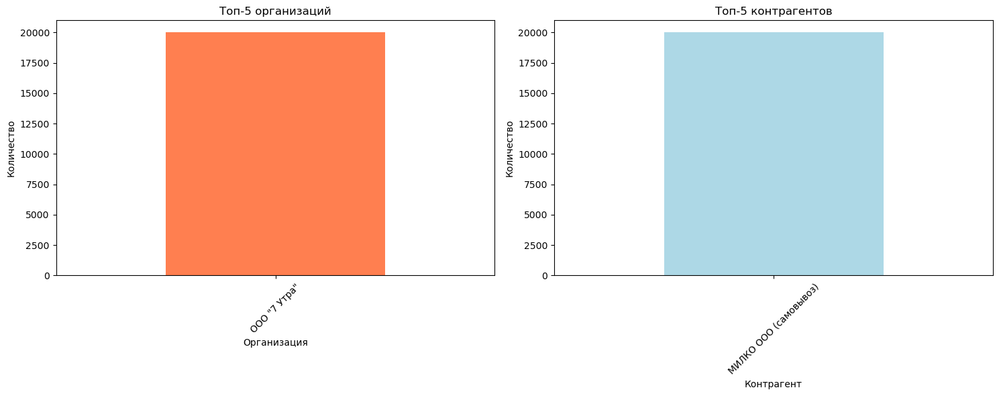


 Сохраняем в Minio: sales-analytics/Мас.82,5_.20 кг.полиэт(01030)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.20 кг.полиэт(01030)/организации_контрагенты_20260313.pdf
    Всего сохранено: 1 объектов

 Статистика продаж:
count        1.0
mean     20000.0
std          NaN
min      20000.0
25%      20000.0
50%      20000.0
75%      20000.0
max      20000.0
Name: Количество, dtype: float64

 Топ-10 самых больших продаж:
                   Дата  Количество   Цена      Сумма
989 2025-03-20 23:08:53     20000.0  280.0  5600000.0

⬇ Топ-10 самых маленьких продаж (не считая 0):
                   Дата  Количество   Цена      Сумма
989 2025-03-20 23:08:53     20000.0  280.0  5600000.0

 Сохраняем в Minio: sales-analytics/Мас.82,5_.20 кг.полиэт(01030)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.20 кг.полиэт(01030)/временной_ряд_20260313.pdf
    Всего сохранено: 1 объектов


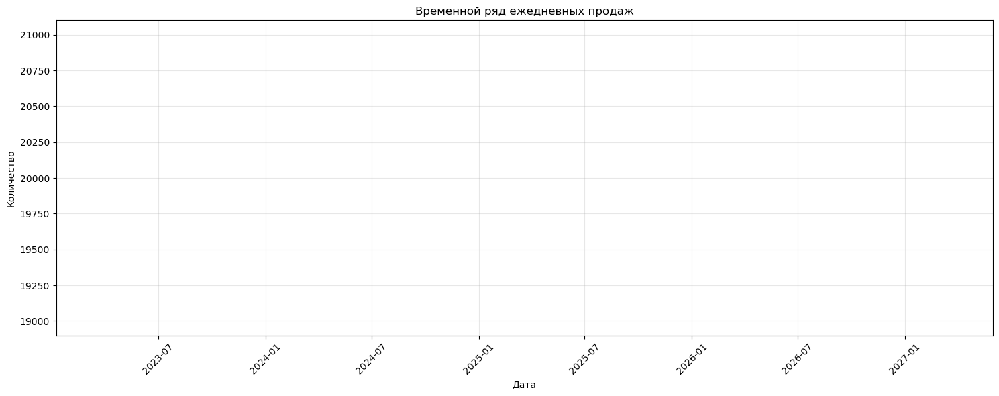


 Сохраняем в Minio: sales-analytics/Мас.82,5_.20 кг.полиэт(01030)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.20 кг.полиэт(01030)/временной_ряд_со_средними_20260313.pdf
    Всего сохранено: 1 объектов


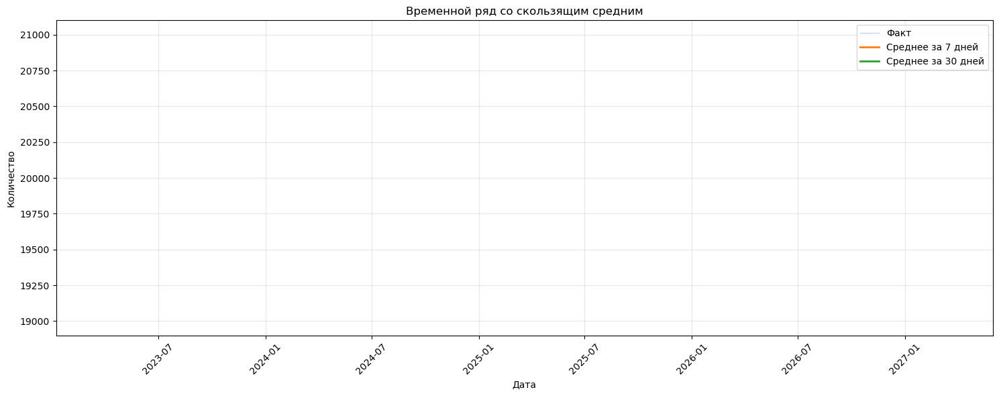


 Сохраняем в Minio: sales-analytics/Мас.82,5_.20 кг.полиэт(01030)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.20 кг.полиэт(01030)/сезонность_и_корреляции_20260313.pdf
    Всего сохранено: 1 объектов


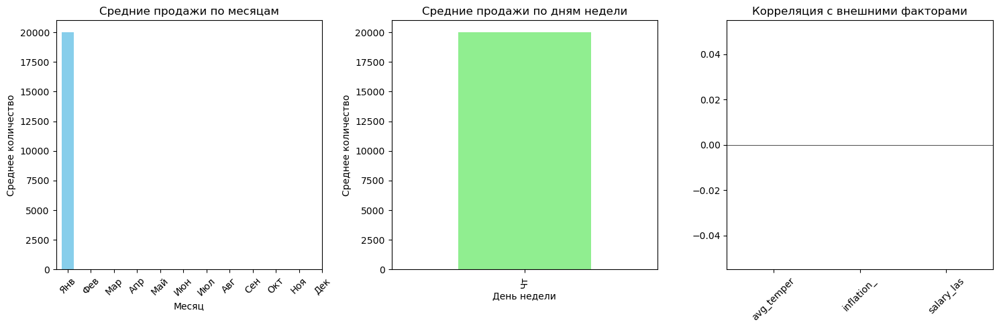


 Анализ временных рядов для Мас.82,5%.20 кг.полиэт(01030) завершен

 АНАЛИЗ ВНЕШНИХ ПРИЗНАКОВ для Мас.82,5%.20 кг.полиэт(01030)

 Доступные признаки: ['avg_temperature', 'inflation_rate', 'salary_last_known', 'salary_trend_slope', 'salary_avg_growth_3y', 'total_population']

 КОРРЕЛЯЦИЯ С ПРОДАЖАМИ:


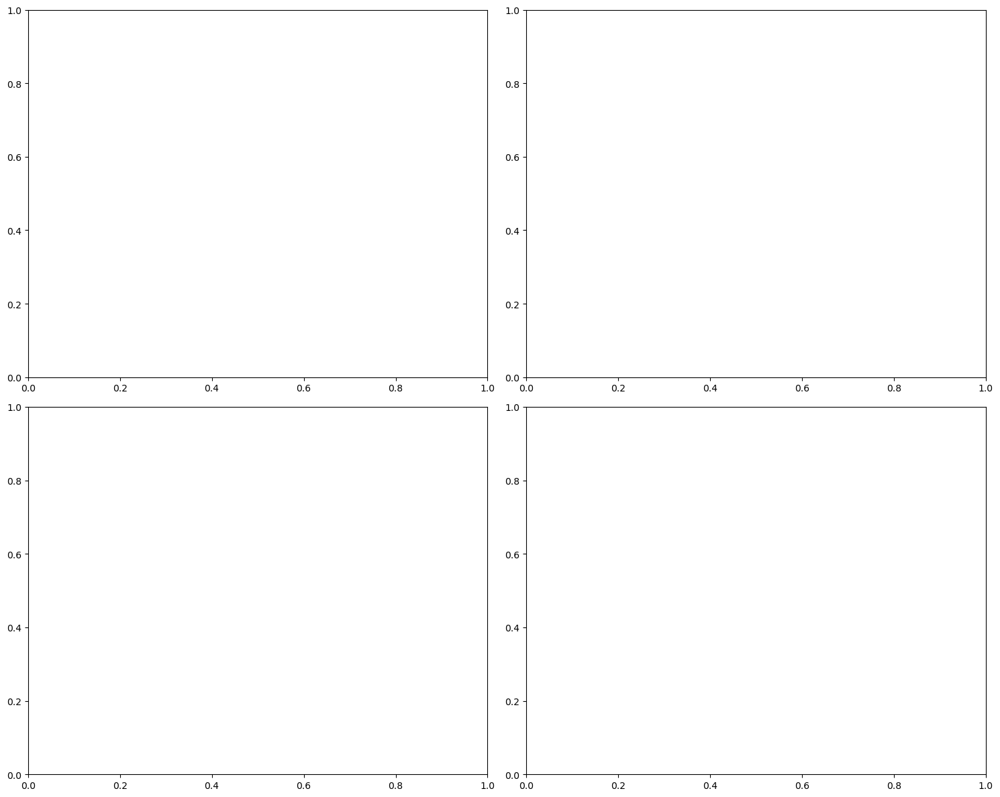


 Анализ для Мас.82,5%.20 кг.полиэт(01030) завершен

 АНАЛИЗ НОМЕНКЛАТУРЫ: Спр.72%.20кг.полиэт.(40%)(БЭ)
 Данных: 3 записей


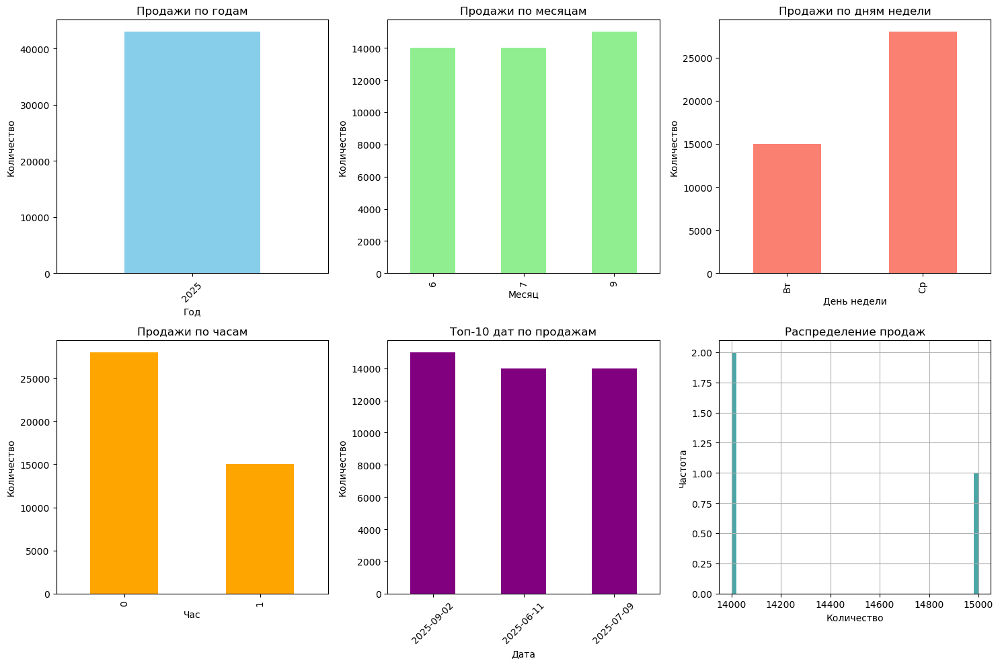


 Сохраняем в Minio: sales-analytics/Спр.72_.20кг.полиэт.(40_)(БЭ)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.полиэт.(40_)(БЭ)/временной_анализ_20260313.pdf
    Всего сохранено: 1 объектов

 АНАЛИЗ ПО ОРГАНИЗАЦИЯМ И КОНТРАГЕНТАМ

Статистика по организациям:
             Количество                       Сумма
                    sum      mean count         sum
Организация                                        
ООО "7 Утра"    43000.0  14333.33     3  15222000.0

Статистика по контрагентам (топ-10):
                      Количество                       Сумма
                             sum      mean count         sum
Контрагент                                                  
ДАРАМ ООО (самовывоз)    43000.0  14333.33     3  15222000.0


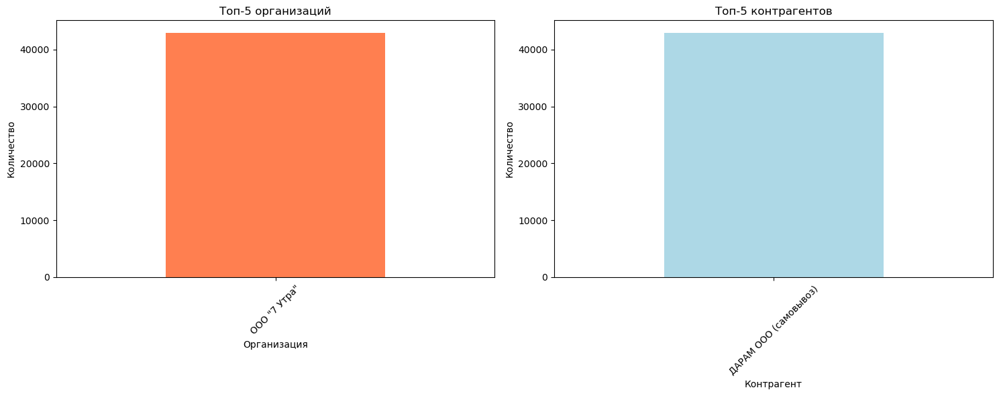


 Сохраняем в Minio: sales-analytics/Спр.72_.20кг.полиэт.(40_)(БЭ)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.полиэт.(40_)(БЭ)/организации_контрагенты_20260313.pdf
    Всего сохранено: 1 объектов

 Статистика продаж:
count        3.000000
mean     14333.333333
std        577.350269
min      14000.000000
25%      14000.000000
50%      14000.000000
75%      14500.000000
max      15000.000000
Name: Количество, dtype: float64

 Топ-10 самых больших продаж:
                   Дата  Количество   Цена      Сумма
990 2025-09-02 01:24:47     15000.0  354.0  5310000.0
991 2025-07-09 00:22:33     14000.0  354.0  4956000.0
992 2025-06-11 00:03:18     14000.0  354.0  4956000.0

⬇ Топ-10 самых маленьких продаж (не считая 0):
                   Дата  Количество   Цена      Сумма
991 2025-07-09 00:22:33     14000.0  354.0  4956000.0
992 2025-06-11 00:03:18     14000.0  354.0  4956000.0
990 2025-09-02 01:24:47     15000.0  354.0  5310000.0

 Сохраняем в Minio: sales-analytics/С

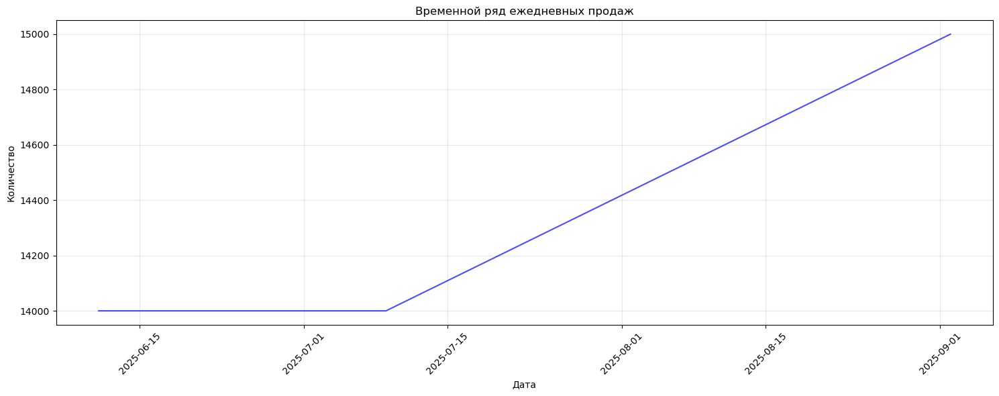


 Сохраняем в Minio: sales-analytics/Спр.72_.20кг.полиэт.(40_)(БЭ)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.полиэт.(40_)(БЭ)/временной_ряд_со_средними_20260313.pdf
    Всего сохранено: 1 объектов


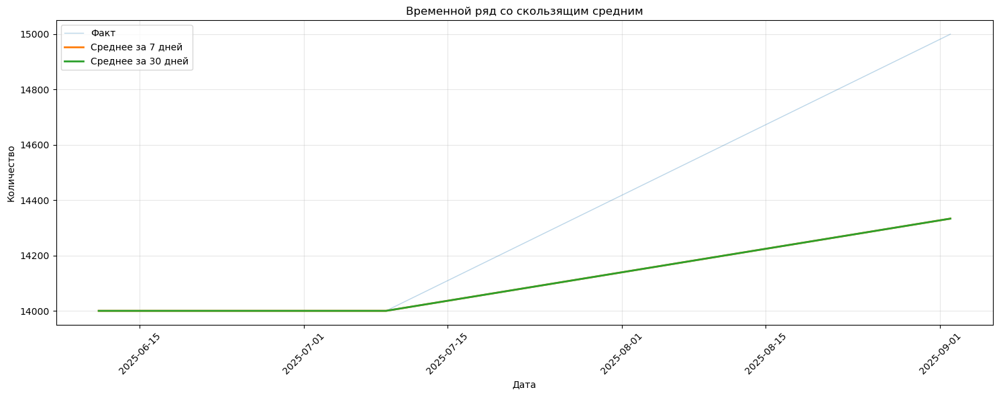


 Сохраняем в Minio: sales-analytics/Спр.72_.20кг.полиэт.(40_)(БЭ)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.полиэт.(40_)(БЭ)/сезонность_и_корреляции_20260313.pdf
    Всего сохранено: 1 объектов


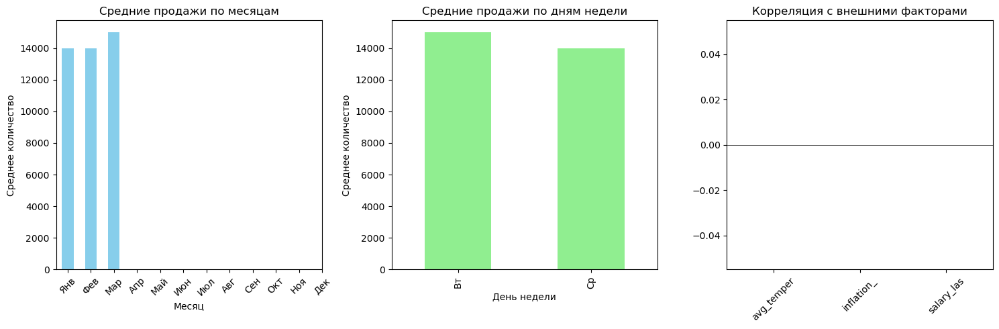


 Анализ временных рядов для Спр.72%.20кг.полиэт.(40%)(БЭ) завершен

 АНАЛИЗ ВНЕШНИХ ПРИЗНАКОВ для Спр.72%.20кг.полиэт.(40%)(БЭ)

 Доступные признаки: ['avg_temperature', 'inflation_rate', 'salary_last_known', 'salary_trend_slope', 'salary_avg_growth_3y', 'total_population']

 КОРРЕЛЯЦИЯ С ПРОДАЖАМИ:


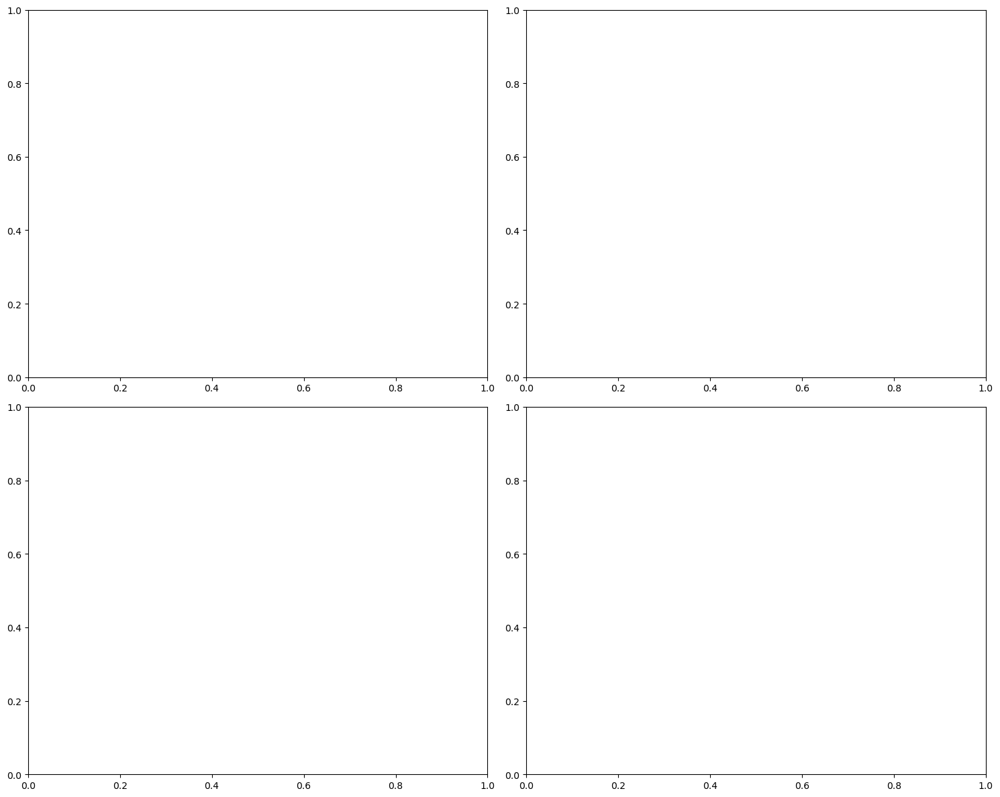


 Анализ для Спр.72%.20кг.полиэт.(40%)(БЭ) завершен

 АНАЛИЗ НОМЕНКЛАТУРЫ: Спр.72%.20кг.перг.(30%)(БЭ)
 Данных: 3 записей


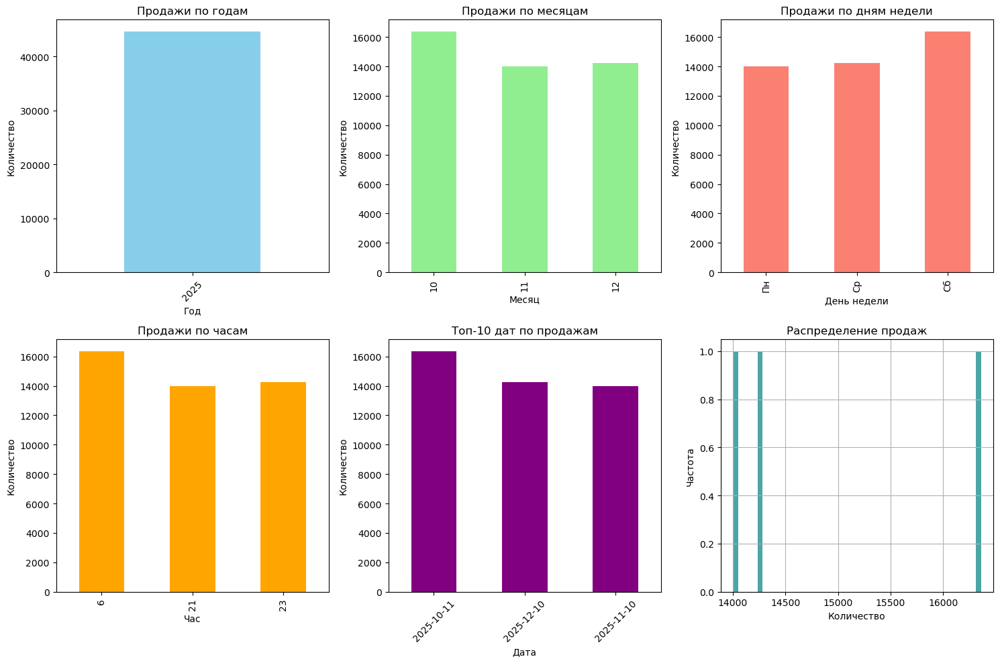


 Сохраняем в Minio: sales-analytics/Спр.72_.20кг.перг.(30_)(БЭ)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.перг.(30_)(БЭ)/временной_анализ_20260313.pdf
    Всего сохранено: 1 объектов

 АНАЛИЗ ПО ОРГАНИЗАЦИЯМ И КОНТРАГЕНТАМ

Статистика по организациям:
             Количество                       Сумма
                    sum      mean count         sum
Организация                                        
ООО "7 Утра"    44600.0  14866.67     3  13764200.0

Статистика по контрагентам (топ-10):
                      Количество                       Сумма
                             sum      mean count         sum
Контрагент                                                  
ДАРАМ ООО (самовывоз)    44600.0  14866.67     3  13764200.0


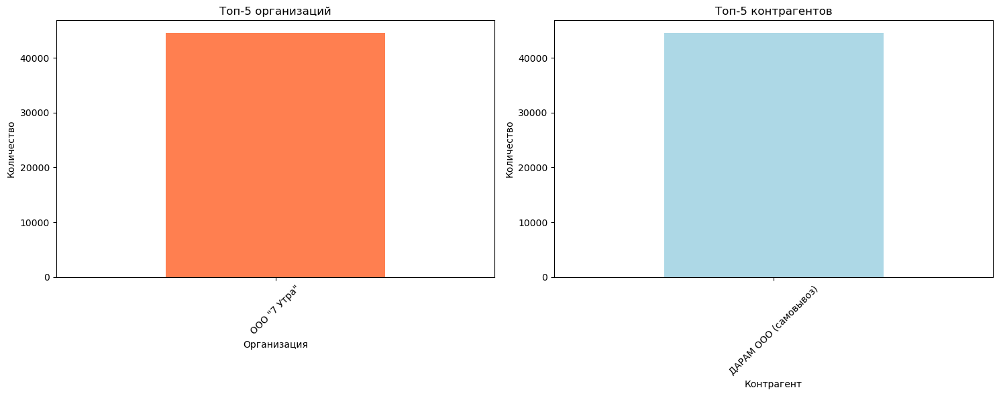


 Сохраняем в Minio: sales-analytics/Спр.72_.20кг.перг.(30_)(БЭ)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.перг.(30_)(БЭ)/организации_контрагенты_20260313.pdf
    Всего сохранено: 1 объектов

 Статистика продаж:
count        3.000000
mean     14866.666667
std       1298.819977
min      14000.000000
25%      14120.000000
50%      14240.000000
75%      15300.000000
max      16360.000000
Name: Количество, dtype: float64

 Топ-10 самых больших продаж:
                   Дата  Количество   Цена      Сумма
995 2025-10-11 06:23:39     16360.0  315.0  5153400.0
993 2025-12-10 23:10:53     14240.0  295.0  4200800.0
994 2025-11-10 21:06:05     14000.0  315.0  4410000.0

⬇ Топ-10 самых маленьких продаж (не считая 0):
                   Дата  Количество   Цена      Сумма
994 2025-11-10 21:06:05     14000.0  315.0  4410000.0
993 2025-12-10 23:10:53     14240.0  295.0  4200800.0
995 2025-10-11 06:23:39     16360.0  315.0  5153400.0

 Сохраняем в Minio: sales-analytics/Спр.7

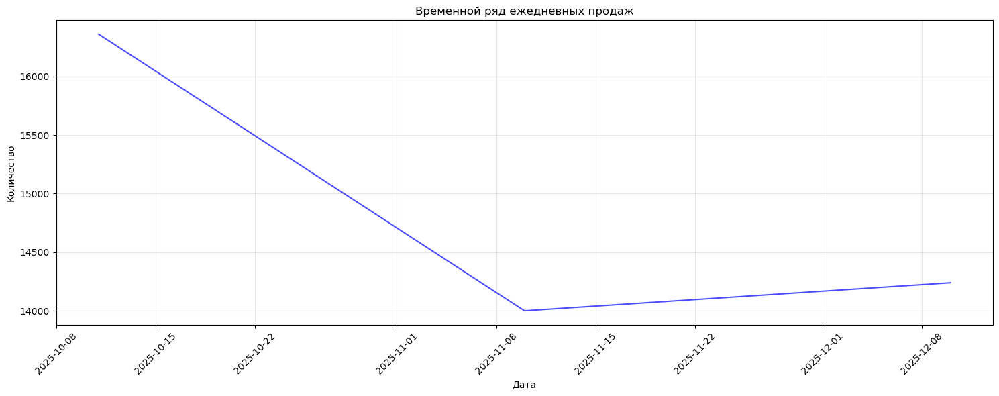


 Сохраняем в Minio: sales-analytics/Спр.72_.20кг.перг.(30_)(БЭ)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.перг.(30_)(БЭ)/временной_ряд_со_средними_20260313.pdf
    Всего сохранено: 1 объектов


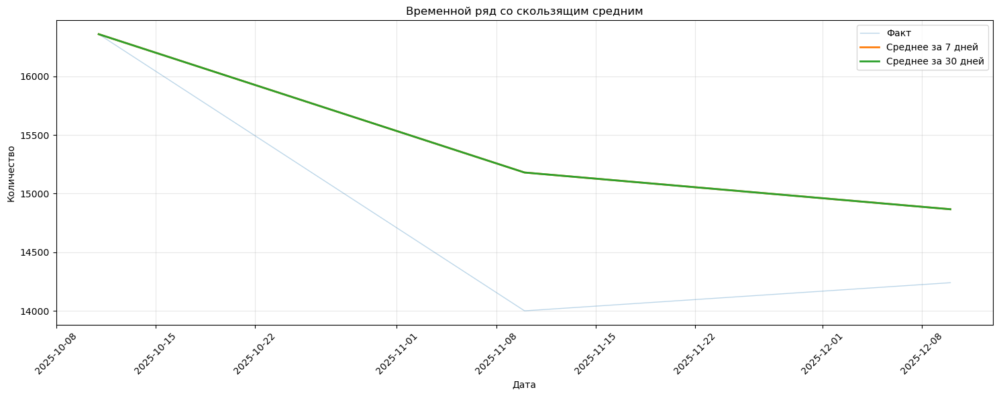


 Сохраняем в Minio: sales-analytics/Спр.72_.20кг.перг.(30_)(БЭ)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.перг.(30_)(БЭ)/сезонность_и_корреляции_20260313.pdf
    Всего сохранено: 1 объектов


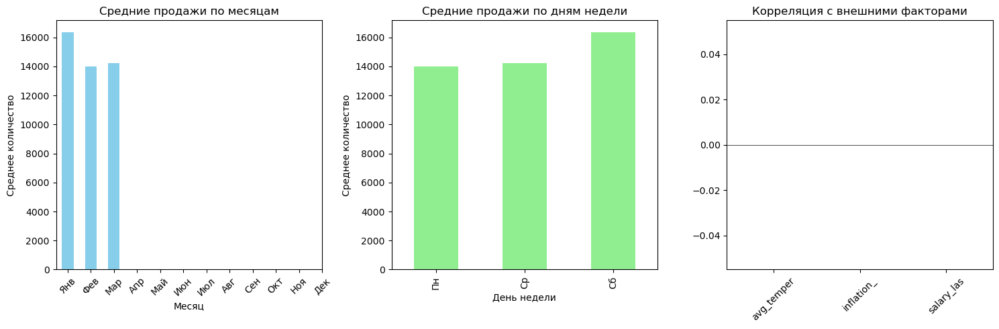


 Анализ временных рядов для Спр.72%.20кг.перг.(30%)(БЭ) завершен

 АНАЛИЗ ВНЕШНИХ ПРИЗНАКОВ для Спр.72%.20кг.перг.(30%)(БЭ)

 Доступные признаки: ['avg_temperature', 'inflation_rate', 'salary_last_known', 'salary_trend_slope', 'salary_avg_growth_3y', 'total_population']

 КОРРЕЛЯЦИЯ С ПРОДАЖАМИ:


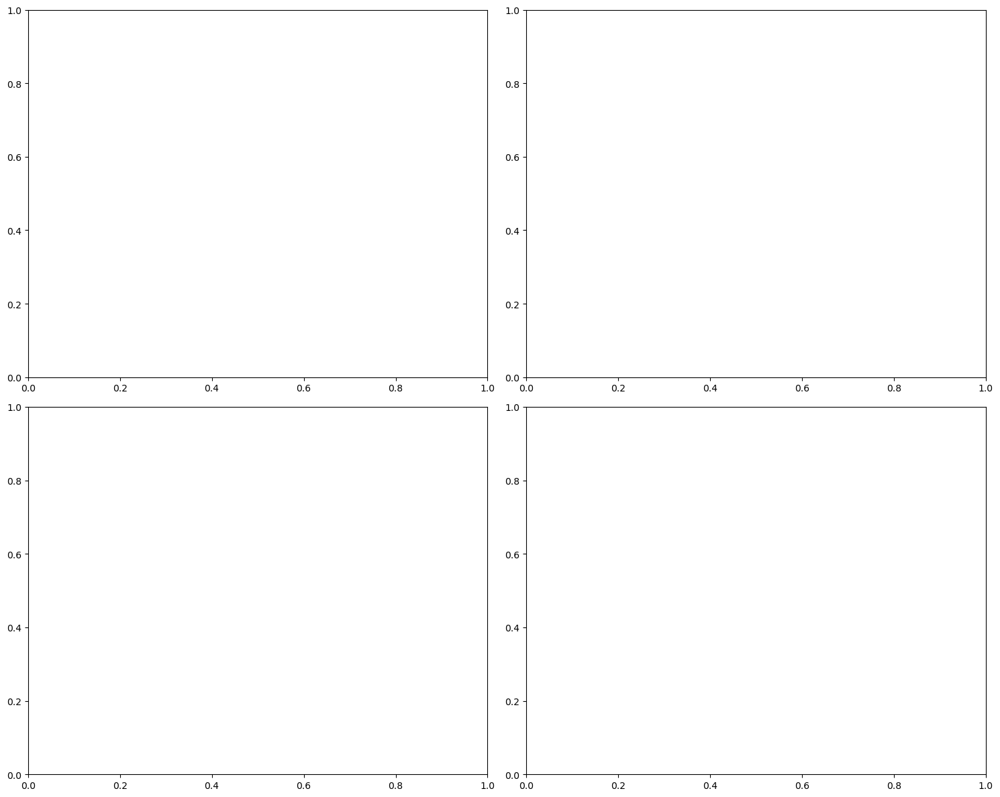


 Анализ для Спр.72%.20кг.перг.(30%)(БЭ) завершен

 АНАЛИЗ НОМЕНКЛАТУРЫ: Спр.БЛ.82%.1000г.фол.6шт
 Данных: 10 записей


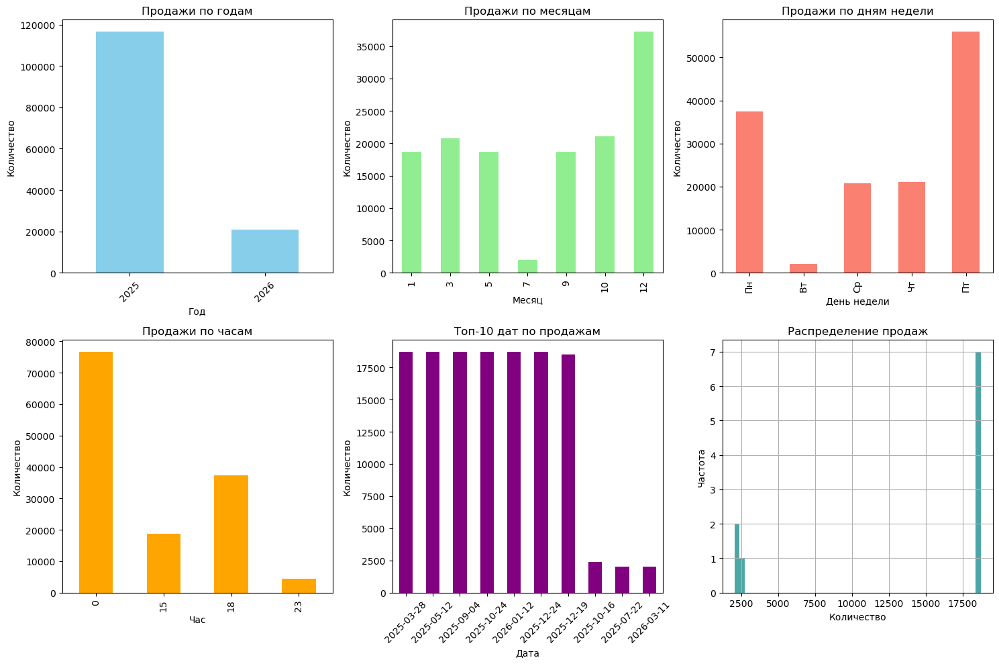


 Сохраняем в Minio: sales-analytics/Спр.БЛ.82_.1000г.фол.6шт
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.БЛ.82_.1000г.фол.6шт/временной_анализ_20260313.pdf
    Всего сохранено: 1 объектов

 АНАЛИЗ ПО ОРГАНИЗАЦИЯМ И КОНТРАГЕНТАМ

Статистика по организациям:
             Количество                      Сумма
                    sum     mean count         sum
Организация                                       
ООО "7 Утра"   137304.0  13730.4    10  22814760.0

Статистика по контрагентам (топ-10):
                                   Количество                       Сумма
                                          sum      mean count         sum
Контрагент                                                               
ARAZ SUPERMARKET ООО (Азербайджан)   130824.0  18689.14     7  21794040.0
Бяшимов Д. ЧП (Туркменистан)           6480.0   2160.00     3   1020720.0


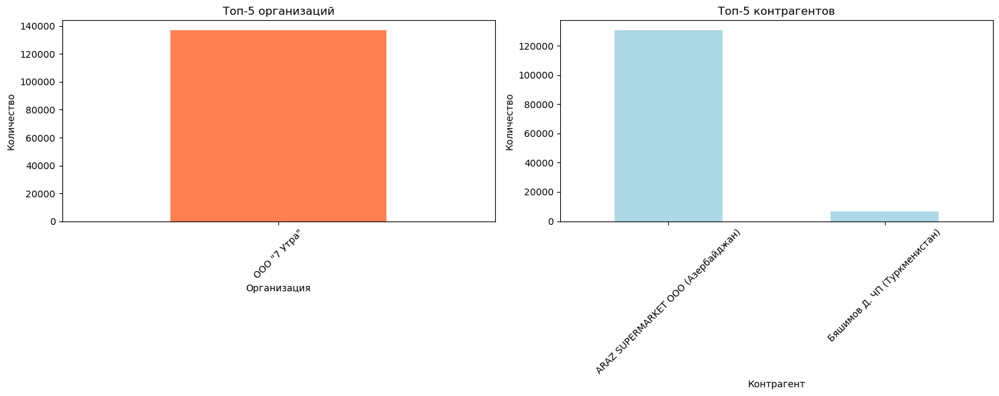


 Сохраняем в Minio: sales-analytics/Спр.БЛ.82_.1000г.фол.6шт
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.БЛ.82_.1000г.фол.6шт/организации_контрагенты_20260313.pdf
    Всего сохранено: 1 объектов

 Статистика продаж:
count       10.000000
mean     13730.400000
std       7985.196403
min       2040.000000
25%       6427.500000
50%      18717.000000
75%      18720.000000
max      18720.000000
Name: Количество, dtype: float64

 Топ-10 самых больших продаж:
                    Дата  Количество   Цена      Сумма
997  2026-01-12 00:00:00     18720.0  155.0  2901600.0
1000 2025-10-24 00:00:00     18720.0  155.0  2901600.0
1002 2025-09-04 18:31:17     18720.0  150.0  2808000.0
1004 2025-05-12 15:30:19     18720.0  185.0  3463200.0
1005 2025-03-28 18:49:24     18720.0  211.0  3949920.0
998  2025-12-24 00:00:00     18714.0  155.0  2900670.0
999  2025-12-19 00:00:00     18510.0  155.0  2869050.0
1001 2025-10-16 23:00:00      2400.0  155.0   372000.0
996  2026-03-11 23:11:50      204

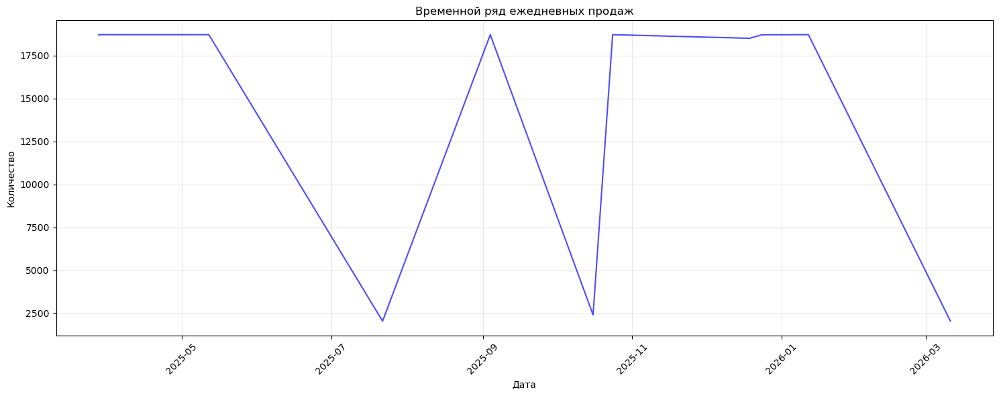


 Сохраняем в Minio: sales-analytics/Спр.БЛ.82_.1000г.фол.6шт
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.БЛ.82_.1000г.фол.6шт/временной_ряд_со_средними_20260313.pdf
    Всего сохранено: 1 объектов


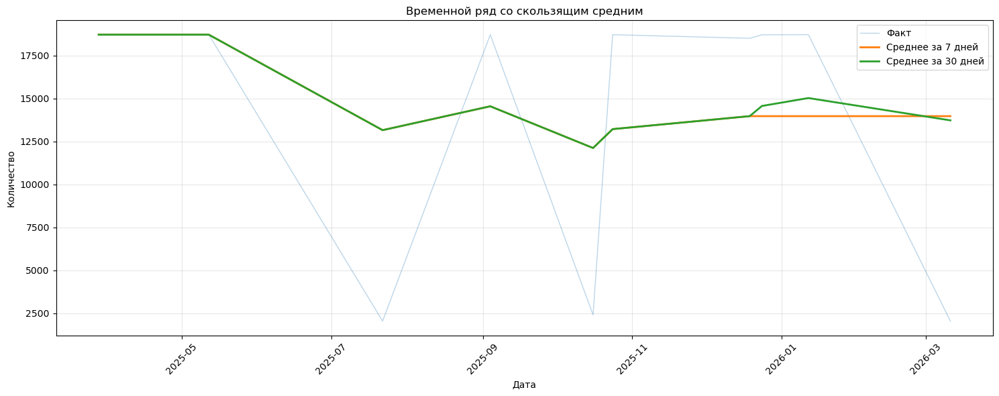


 Сохраняем в Minio: sales-analytics/Спр.БЛ.82_.1000г.фол.6шт
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.БЛ.82_.1000г.фол.6шт/сезонность_и_корреляции_20260313.pdf
    Всего сохранено: 1 объектов


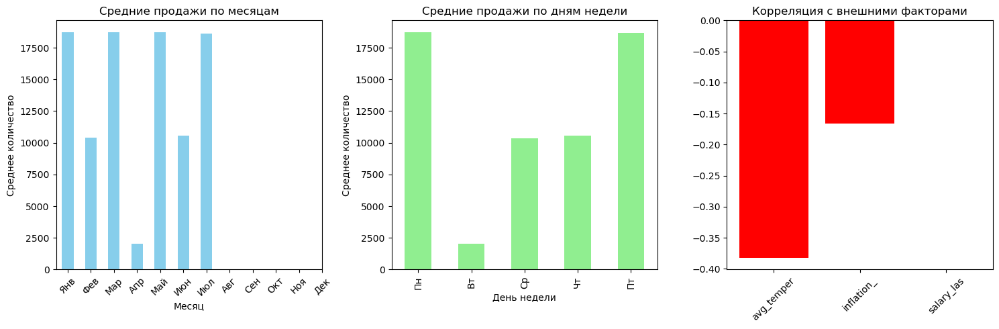


 Анализ временных рядов для Спр.БЛ.82%.1000г.фол.6шт завершен

 АНАЛИЗ ПО ГОРОДАМ
        Количество                       Сумма
               sum      mean count         sum
город                                         
Баку      130824.0  18689.14     7  21794040.0
Ашхабад     6480.0   2160.00     3   1020720.0

 АНАЛИЗ ВНЕШНИХ ПРИЗНАКОВ для Спр.БЛ.82%.1000г.фол.6шт

 Доступные признаки: ['avg_temperature', 'inflation_rate', 'salary_last_known', 'salary_trend_slope', 'salary_avg_growth_3y', 'total_population']

 КОРРЕЛЯЦИЯ С ПРОДАЖАМИ:
   avg_temperature: -0.382
   inflation_rate: -0.166
   total_population: 0.221

 ТОП-3 ВЛИЯЮЩИХ ПРИЗНАКА:
   avg_temperature: -0.382
   total_population: 0.221
   inflation_rate: -0.166


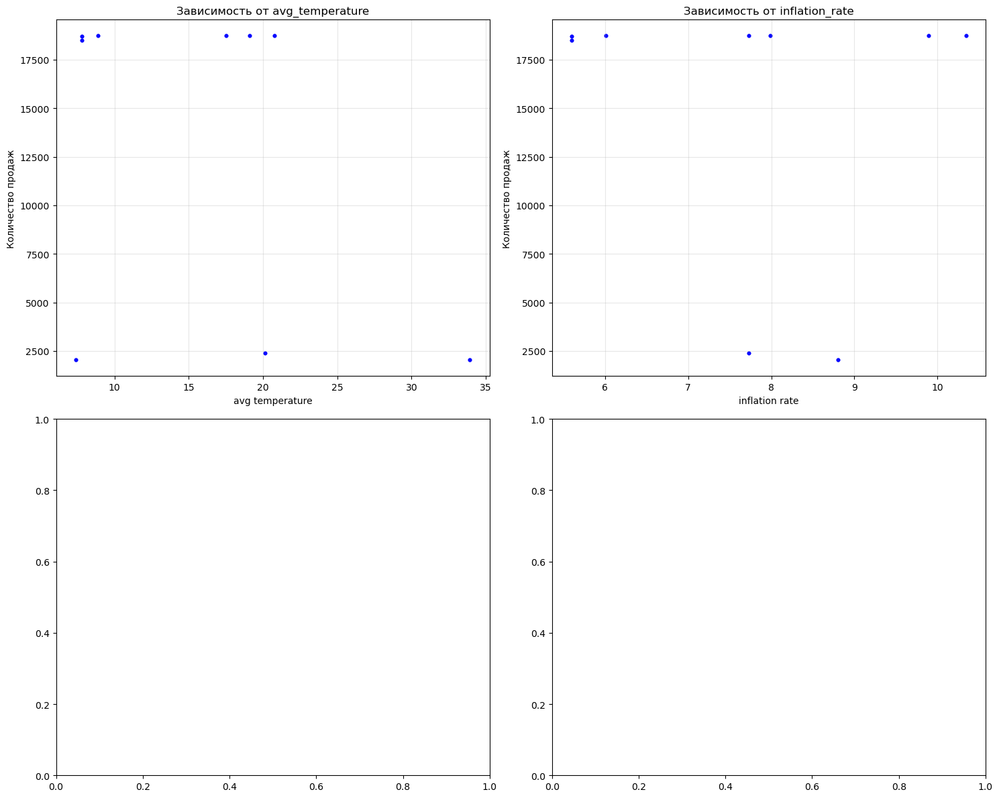


 Анализ для Спр.БЛ.82%.1000г.фол.6шт завершен


In [48]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta

# Получаем список уникальных товаров из обогащенного датасета
products_list = full_df_enriched['Номенклатура'].unique().tolist()
print(f" Всего товаров для анализа: {len(products_list)}")

for product_name in products_list:
    print(f"\n{'='*70}")
    print(f" АНАЛИЗ НОМЕНКЛАТУРЫ: {product_name[:70]}")
    print('='*70)
    
    # Фильтруем данные для текущего товара
    df = full_df_enriched[full_df_enriched['Номенклатура'] == product_name].copy()
    
    if df.empty:
        print(f" Нет данных для {product_name[:50]}")
        continue
    
    print(f" Данных: {len(df)} записей")
    
    # Исправляем даты перед анализом (4026 -> 2026) - если нужно
    df['Дата'] = pd.to_datetime(df['Дата'])
    # если есть проблема с 4026 годом:
    # df['Дата'] = pd.to_datetime(df['Дата'].astype(str).str.replace('402', '202'))
    
    # Создаем временные признаки
    df['Год'] = df['Дата'].dt.year
    df['Месяц'] = df['Дата'].dt.month
    df['День_недели'] = df['Дата'].dt.dayofweek
    df['Час'] = df['Дата'].dt.hour
    df['Дата_без_времени'] = df['Дата'].dt.date
    
    # Очищаем имя для сохранения
    clean_name = re.sub(r'[<>:"/\\|?*%\'"]', '_', product_name)
    clean_name = clean_name[:50]
    
    # 1. Анализ продаж по времени
    fig1 = plt.figure(figsize=(15, 10))
    
    # 1.1 Продажи по годам
    plt.subplot(2, 3, 1)
    sales_by_year = df.groupby('Год')['Количество'].sum()
    sales_by_year.plot(kind='bar', color='skyblue')
    plt.title('Продажи по годам')
    plt.xlabel('Год')
    plt.ylabel('Количество')
    plt.xticks(rotation=45)
    
    # 1.2 Продажи по месяцам
    plt.subplot(2, 3, 2)
    sales_by_month = df.groupby('Месяц')['Количество'].sum()
    sales_by_month.plot(kind='bar', color='lightgreen')
    plt.title('Продажи по месяцам')
    plt.xlabel('Месяц')
    plt.ylabel('Количество')
    
    # 1.3 Продажи по дням недели
    plt.subplot(2, 3, 3)
    days = ['Пн', 'Вт', 'Ср', 'Чт', 'Пт', 'Сб', 'Вс']
    sales_by_day = df.groupby('День_недели')['Количество'].sum()
    sales_by_day.index = [days[i] for i in sales_by_day.index]
    sales_by_day.plot(kind='bar', color='salmon')
    plt.title('Продажи по дням недели')
    plt.xlabel('День недели')
    plt.ylabel('Количество')
    
    # 1.4 Продажи по часам
    plt.subplot(2, 3, 4)
    sales_by_hour = df.groupby('Час')['Количество'].sum()
    sales_by_hour.plot(kind='bar', color='orange')
    plt.title('Продажи по часам')
    plt.xlabel('Час')
    plt.ylabel('Количество')
    
    # 1.5 Топ-10 дат по продажам
    plt.subplot(2, 3, 5)
    top_dates = df.groupby('Дата_без_времени')['Количество'].sum().nlargest(10)
    top_dates.plot(kind='bar', color='purple')
    plt.title('Топ-10 дат по продажам')
    plt.xlabel('Дата')
    plt.ylabel('Количество')
    plt.xticks(rotation=45)
    
    # 1.6 Распределение продаж
    plt.subplot(2, 3, 6)
    df['Количество'].hist(bins=50, color='teal', alpha=0.7)
    plt.title('Распределение продаж')
    plt.xlabel('Количество')
    plt.ylabel('Частота')
    
    plt.tight_layout()
    plt.show()
    
    # Сохраняем первый график
    save_to_minio(
        bucket_name="sales-analytics",
        block_name=clean_name,
        plot_name=f"временной_анализ_{datetime.now().strftime('%Y%m%d')}",
        data=None,
        fig=fig1,
        formats=['pdf']
    )
    
    # 2. Анализ по организациям и контрагентам
    print("\n" + "="*60)
    print(" АНАЛИЗ ПО ОРГАНИЗАЦИЯМ И КОНТРАГЕНТАМ")
    print("="*60)
    
    # Статистика по организациям
    if 'Организация' in df.columns:
        org_stats = df.groupby('Организация').agg({
            'Количество': ['sum', 'mean', 'count'],
            'Сумма': 'sum'
        }).round(2)
        print("\nСтатистика по организациям:")
        print(org_stats.sort_values(('Сумма', 'sum'), ascending=False))
    
    # Статистика по контрагентам
    if 'Контрагент' in df.columns:
        kontr_stats = df.groupby('Контрагент').agg({
            'Количество': ['sum', 'mean', 'count'],
            'Сумма': 'sum'
        }).round(2)
        print("\nСтатистика по контрагентам (топ-10):")
        print(kontr_stats.sort_values(('Сумма', 'sum'), ascending=False).head(10))
    
    # Визуализация организаций и контрагентов
    fig2 = plt.figure(figsize=(15, 6))
    
    if 'Организация' in df.columns:
        plt.subplot(1, 2, 1)
        top_orgs = df.groupby('Организация')['Количество'].sum().nlargest(5)
        top_orgs.plot(kind='bar', color='coral')
        plt.title('Топ-5 организаций')
        plt.xlabel('Организация')
        plt.ylabel('Количество')
        plt.xticks(rotation=45)
    
    if 'Контрагент' in df.columns:
        plt.subplot(1, 2, 2)
        top_kontr = df.groupby('Контрагент')['Количество'].sum().nlargest(5)
        top_kontr.plot(kind='bar', color='lightblue')
        plt.title('Топ-5 контрагентов')
        plt.xlabel('Контрагент')
        plt.ylabel('Количество')
        plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.show()
    
    # Сохраняем второй график
    save_to_minio(
        bucket_name="sales-analytics",
        block_name=clean_name,
        plot_name=f"организации_контрагенты_{datetime.now().strftime('%Y%m%d')}",
        data=None,
        fig=fig2,
        formats=['pdf']
    )
    # ============================================
    # СТАТИСТИКА ПРОДАЖ И ВРЕМЕННЫЕ РЯДЫ
    # ============================================
    
    # Статистика по продажам
    print("\n Статистика продаж:")
    print(df['Количество'].describe())
    
    # Анализ выбросов
    print("\n Топ-10 самых больших продаж:")
    print(df.nlargest(10, 'Количество')[['Дата', 'Количество', 'Цена', 'Сумма']])
    
    print("\n⬇ Топ-10 самых маленьких продаж (не считая 0):")
    print(df[df['Количество'] > 0].nsmallest(10, 'Количество')[['Дата', 'Количество', 'Цена', 'Сумма']])
    
    # Временной ряд продаж (ежедневная агрегация)
    daily_sales = df.groupby('Дата_без_времени')['Количество'].sum().reset_index()
    daily_sales.columns = ['date', 'quantity']
    daily_sales['date'] = pd.to_datetime(daily_sales['date'])
    daily_sales = daily_sales.sort_values('date')
    
    # График 1: Временной ряд
    plt.figure(figsize=(15, 6))
    plt.plot(daily_sales['date'], daily_sales['quantity'], linewidth=1.5, color='blue', alpha=0.7)
    plt.title('Временной ряд ежедневных продаж')
    plt.xlabel('Дата')
    plt.ylabel('Количество')
    plt.grid(True, alpha=0.3)
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    # Сохраняем
    save_to_minio(
        bucket_name="sales-analytics",
        block_name=clean_name,
        plot_name=f"временной_ряд_{datetime.now().strftime('%Y%m%d')}",
        data=None,
        fig=plt.gcf(),
        formats=['pdf']
    )
    plt.show()
    
    # График 2: Со скользящим средним
    plt.figure(figsize=(15, 6))
    daily_sales['rolling_mean_7'] = daily_sales['quantity'].rolling(window=7, min_periods=1).mean()
    daily_sales['rolling_mean_30'] = daily_sales['quantity'].rolling(window=30, min_periods=1).mean()
    
    plt.plot(daily_sales['date'], daily_sales['quantity'], alpha=0.3, label='Факт', linewidth=1)
    plt.plot(daily_sales['date'], daily_sales['rolling_mean_7'], label='Среднее за 7 дней', linewidth=2)
    plt.plot(daily_sales['date'], daily_sales['rolling_mean_30'], label='Среднее за 30 дней', linewidth=2)
    plt.title('Временной ряд со скользящим средним')
    plt.xlabel('Дата')
    plt.ylabel('Количество')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    save_to_minio(
        bucket_name="sales-analytics",
        block_name=clean_name,
        plot_name=f"временной_ряд_со_средними_{datetime.now().strftime('%Y%m%d')}",
        data=None,
        fig=plt.gcf(),
        formats=['pdf']
    )
    plt.show()
    
    # График 3: Сезонность по месяцам (новый!)
    plt.figure(figsize=(15, 5))
    
    # Группировка по месяцам
    monthly_avg = df.groupby('Месяц')['Количество'].mean()
    months = ['Янв', 'Фев', 'Мар', 'Апр', 'Май', 'Июн', 
              'Июл', 'Авг', 'Сен', 'Окт', 'Ноя', 'Дек']
    
    plt.subplot(1, 3, 1)
    monthly_avg.plot(kind='bar', color='skyblue')
    plt.title('Средние продажи по месяцам')
    plt.xlabel('Месяц')
    plt.ylabel('Среднее количество')
    plt.xticks(ticks=range(12), labels=months, rotation=45)
    
    # График 4: Сезонность по дням недели
    plt.subplot(1, 3, 2)
    weekly_avg = df.groupby('День_недели')['Количество'].mean()
    days = ['Пн', 'Вт', 'Ср', 'Чт', 'Пт', 'Сб', 'Вс']
    weekly_avg.index = [days[i] for i in weekly_avg.index]
    weekly_avg.plot(kind='bar', color='lightgreen')
    plt.title('Средние продажи по дням недели')
    plt.xlabel('День недели')
    plt.ylabel('Среднее количество')
    
    # График 5: Корреляция с внешними признаками (если есть)
    plt.subplot(1, 3, 3)
    external_features = ['avg_temperature', 'inflation_rate', 'salary_last_known']
    available = [f for f in external_features if f in df.columns]
    
    if available:
        corr_data = []
        for feat in available:
            temp_df = df[['Количество', feat]].dropna()
            if len(temp_df) > 5:
                corr = temp_df['Количество'].corr(temp_df[feat])
                corr_data.append(corr)
            else:
                corr_data.append(0)
        
        plt.bar(range(len(available)), corr_data, color=['red' if c < 0 else 'green' for c in corr_data])
        plt.xticks(range(len(available)), [f[:10] for f in available], rotation=45)
        plt.title('Корреляция с внешними факторами')
        plt.axhline(y=0, color='black', linewidth=0.5)
    else:
        plt.text(0.5, 0.5, 'Нет внешних данных', ha='center', va='center')
        plt.title('Корреляция')
    
    plt.tight_layout()
    save_to_minio(
        bucket_name="sales-analytics",
        block_name=clean_name,
        plot_name=f"сезонность_и_корреляции_{datetime.now().strftime('%Y%m%d')}",
        data=None,
        fig=plt.gcf(),
        formats=['pdf']
    )
    plt.show()
    
    print(f"\n Анализ временных рядов для {product_name[:50]} завершен")



    
    # 3. Дополнительный анализ по городам (если есть)
    if 'город' in df.columns and df['город'].nunique() > 1:
        print("\n" + "="*60)
        print(" АНАЛИЗ ПО ГОРОДАМ")
        print("="*60)
        
        city_stats = df.groupby('город').agg({
            'Количество': ['sum', 'mean', 'count'],
            'Сумма': 'sum'
        }).round(2)
        print(city_stats.sort_values(('Сумма', 'sum'), ascending=False).head(10))
    
    # 4. Анализ внешних признаков
    analyze_external_features(df, product_name)
    
    print(f"\n Анализ для {product_name[:50]} завершен")
    print('='*70)


 Статистика продаж:
count       10.000000
mean     13730.400000
std       7985.196403
min       2040.000000
25%       6427.500000
50%      18717.000000
75%      18720.000000
max      18720.000000
Name: Количество, dtype: float64

 Топ-10 самых больших продаж:
                    Дата  Количество   Цена      Сумма
997  2026-01-12 00:00:00     18720.0  155.0  2901600.0
1000 2025-10-24 00:00:00     18720.0  155.0  2901600.0
1002 2025-09-04 18:31:17     18720.0  150.0  2808000.0
1004 2025-05-12 15:30:19     18720.0  185.0  3463200.0
1005 2025-03-28 18:49:24     18720.0  211.0  3949920.0
998  2025-12-24 00:00:00     18714.0  155.0  2900670.0
999  2025-12-19 00:00:00     18510.0  155.0  2869050.0
1001 2025-10-16 23:00:00      2400.0  155.0   372000.0
996  2026-03-11 23:11:50      2040.0  155.0   316200.0
1003 2025-07-22 00:00:00      2040.0  163.0   332520.0

⬇ Топ-10 самых маленьких продаж (не считая 0):
                    Дата  Количество   Цена      Сумма
996  2026-03-11 23:11:50      2

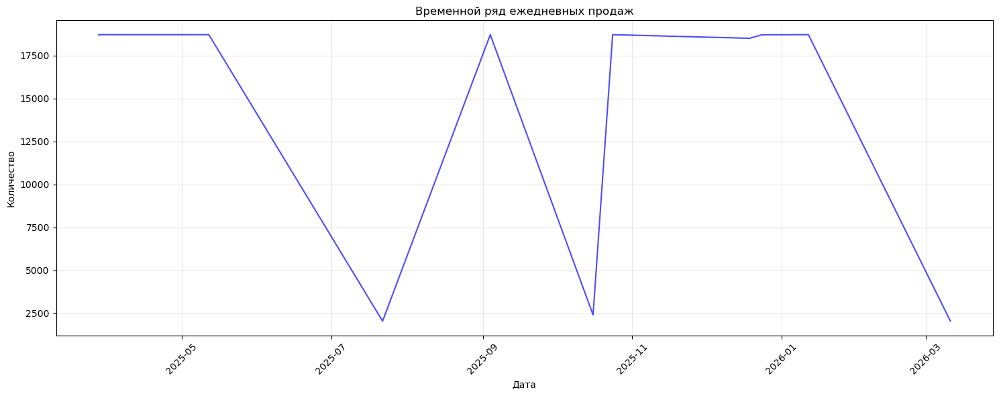


 Сохраняем в Minio: sales-analytics/Спр.БЛ.82_.1000г.фол.6шт
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.БЛ.82_.1000г.фол.6шт/временной_ряд_со_средними_20260313.pdf
    Всего сохранено: 1 объектов


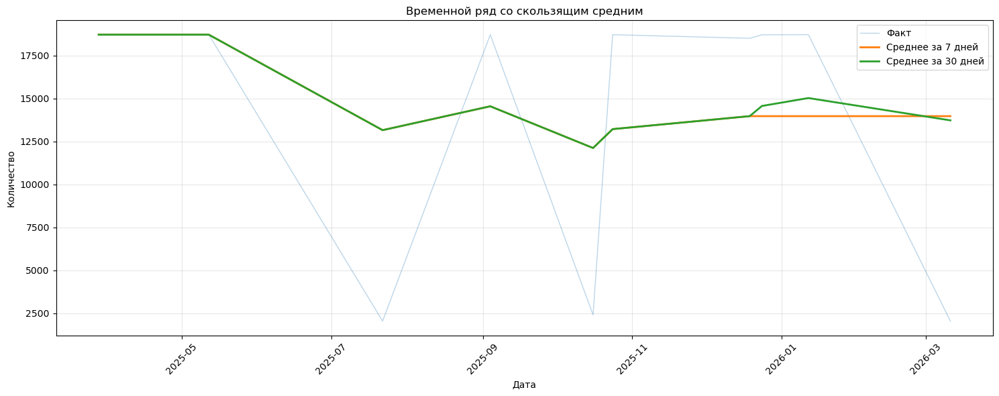


 Сохраняем в Minio: sales-analytics/Спр.БЛ.82_.1000г.фол.6шт
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.БЛ.82_.1000г.фол.6шт/сезонность_и_корреляции_20260313.pdf
    Всего сохранено: 1 объектов


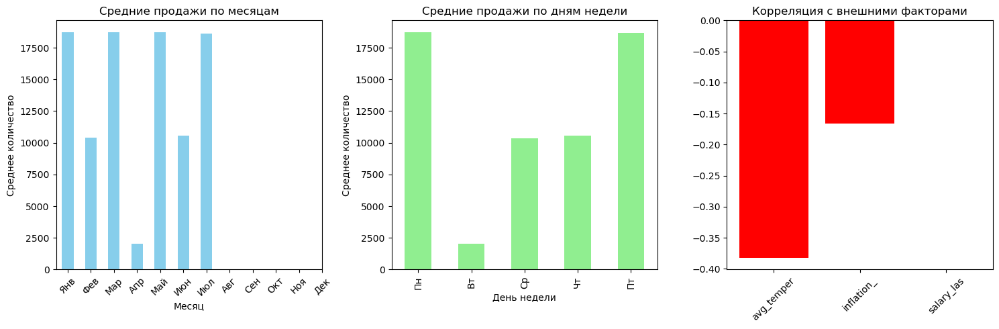


 Анализ временных рядов для Спр.БЛ.82%.1000г.фол.6шт завершен


In [47]:
#статистику временных продаж переместил в блок выше


🔍 АНАЛИЗ ТОВАРА: Мас.Тандер.72,5%.180г.фол.12шт


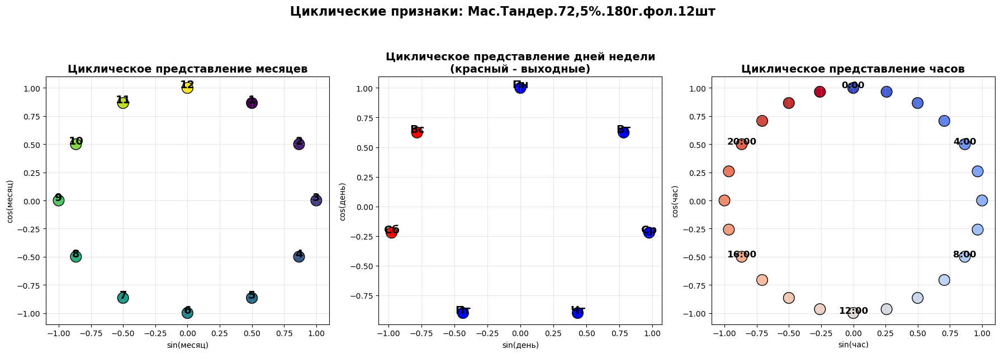


 Сохраняем в Minio: sales-analytics/Мас.Тандер.72,5_.180г.фол.12шт
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.Тандер.72,5_.180г.фол.12шт/циклические_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Первые 10 строк лаговых признаков:
                 Дата  Количество  Количество_лаг_1час  Количество_лаг_3час  Количество_лаг_6час  Количество_лаг_12час  Количество_лаг_24час  Количество_лаг_168час  Количество_среднее_3ч  Количество_среднее_6ч  Количество_среднее_12ч  Количество_среднее_24ч
0 2025-03-13 09:00:00       816.0                  NaN                  NaN                  NaN                   NaN                   NaN                    NaN                    NaN                    NaN                     NaN                     NaN
1 2025-03-13 10:00:00      1632.0                816.0                  NaN                  NaN                   NaN                   NaN                    NaN                  816.0                  816.0              816.

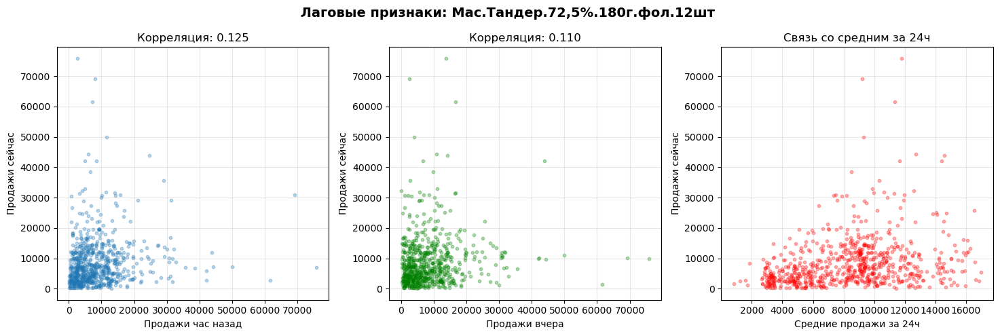


 Сохраняем в Minio: sales-analytics/Мас.Тандер.72,5_.180г.фол.12шт
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.Тандер.72,5_.180г.фол.12шт/лаговые_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Пропуски в лаговых признаках (%):
   Количество_лаг_1час: 0.14% пропусков
   Количество_лаг_3час: 0.41% пропусков
   Количество_лаг_6час: 0.82% пропусков
   Количество_лаг_12час: 1.63% пропусков
   Количество_лаг_24час: 3.26% пропусков
   Количество_лаг_168час: 22.83% пропусков

 Статистика признаков по организациям:
       org_mean_sales  org_std_sales
count    7.360000e+02   7.360000e+02
mean     8.490652e+03   8.161032e+03
std      3.458430e-11   8.282030e-11
min      8.490652e+03   8.161032e+03
25%      8.490652e+03   8.161032e+03
50%      8.490652e+03   8.161032e+03
75%      8.490652e+03   8.161032e+03
max      8.490652e+03   8.161032e+03

 Статистика признаков по контрагентам:
       kontr_mean_sales  kontr_std_sales
count        736.000000       736.000000
mean    

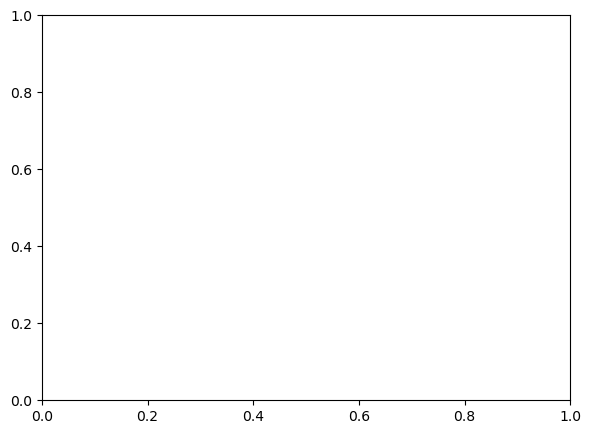

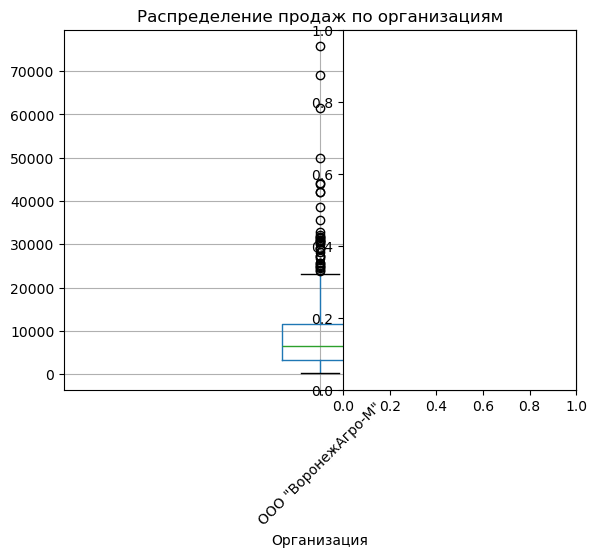

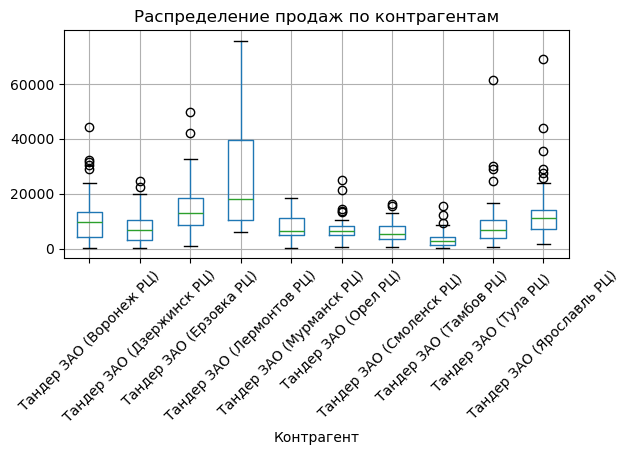


 Сохраняем в Minio: sales-analytics/Мас.Тандер.72,5_.180г.фол.12шт
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.Тандер.72,5_.180г.фол.12шт/организации_контрагенты_распределение_20260313.pdf
    Всего сохранено: 1 объектов

 ИТОГОВАЯ СТАТИСТИКА ДЛЯ Мас.Тандер.72,5%.180г.фол.12шт:
   Всего записей (часов): 736
   Всего признаков: 45
   Период: с 2025-03-13 09:00:00 по 2026-03-12 19:00:00
   Организаций: 1
   Контрагентов: 14

🔍 АНАЛИЗ ТОВАРА: Мас.КУ.82,5%.20кг.полиэт.


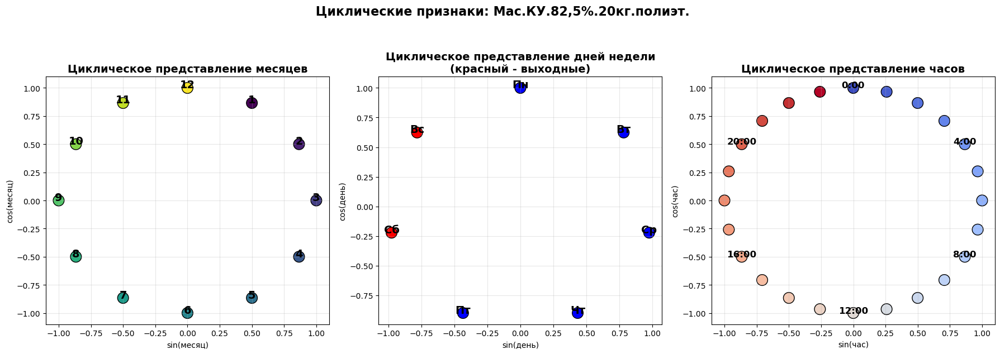


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.полиэт.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт./циклические_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Первые 10 строк лаговых признаков:
                 Дата  Количество  Количество_лаг_1час  Количество_лаг_3час  Количество_лаг_6час  Количество_лаг_12час  Количество_лаг_24час  Количество_лаг_168час  Количество_среднее_3ч  Количество_среднее_6ч  Количество_среднее_12ч  Количество_среднее_24ч
0 2025-03-13 09:00:00       816.0                  NaN                  NaN                  NaN                   NaN                   NaN                    NaN                    NaN                    NaN                     NaN                     NaN
1 2025-03-13 10:00:00      1632.0                816.0                  NaN                  NaN                   NaN                   NaN                    NaN                  816.0                  816.0              816.000000    

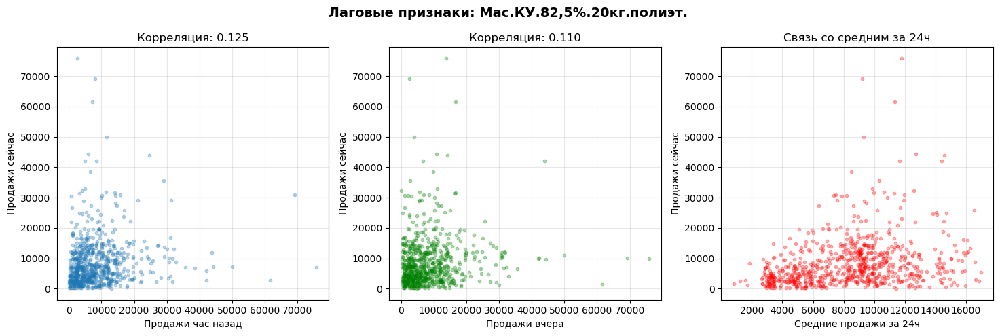


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.полиэт.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт./лаговые_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Пропуски в лаговых признаках (%):
   Количество_лаг_1час: 0.14% пропусков
   Количество_лаг_3час: 0.41% пропусков
   Количество_лаг_6час: 0.82% пропусков
   Количество_лаг_12час: 1.63% пропусков
   Количество_лаг_24час: 3.26% пропусков
   Количество_лаг_168час: 22.83% пропусков

 Статистика признаков по организациям:
       org_mean_sales  org_std_sales
count    7.360000e+02   7.360000e+02
mean     8.490652e+03   8.161032e+03
std      3.458430e-11   8.282030e-11
min      8.490652e+03   8.161032e+03
25%      8.490652e+03   8.161032e+03
50%      8.490652e+03   8.161032e+03
75%      8.490652e+03   8.161032e+03
max      8.490652e+03   8.161032e+03

 Статистика признаков по контрагентам:
       kontr_mean_sales  kontr_std_sales
count        736.000000       736.000000
mean        8490.6

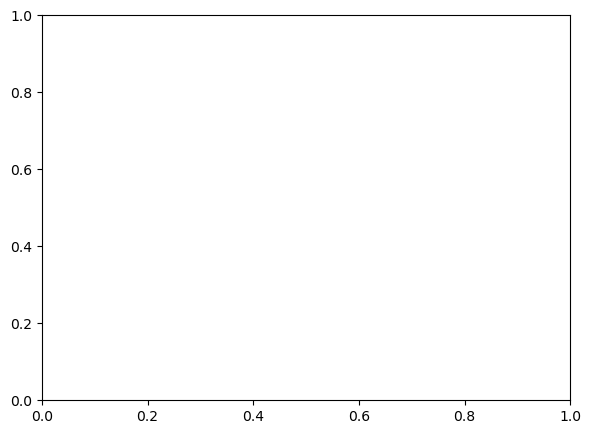

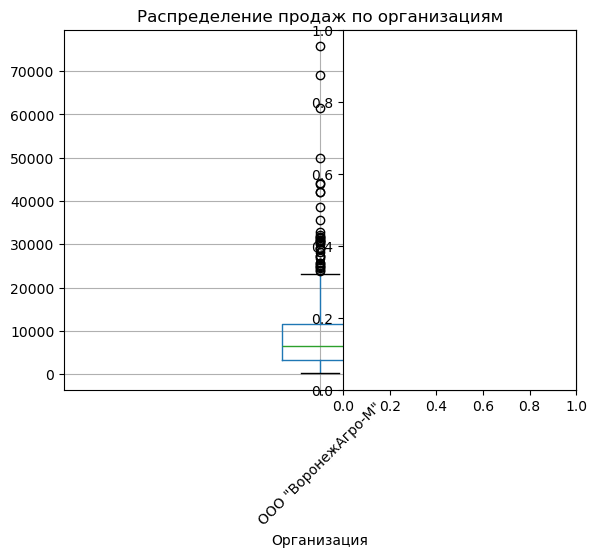

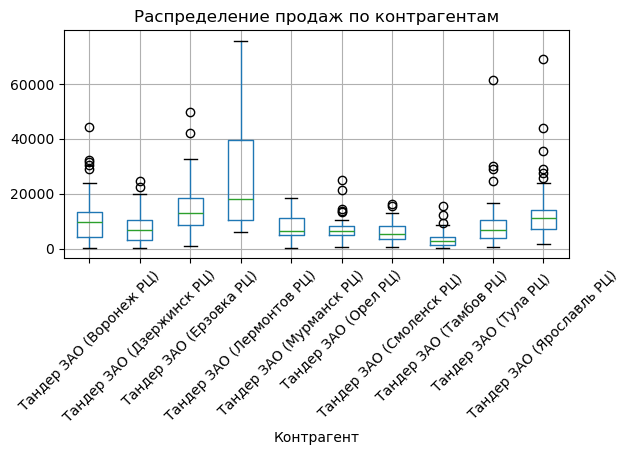


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.полиэт.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт./организации_контрагенты_распределение_20260313.pdf
    Всего сохранено: 1 объектов

 ИТОГОВАЯ СТАТИСТИКА ДЛЯ Мас.КУ.82,5%.20кг.полиэт.:
   Всего записей (часов): 736
   Всего признаков: 45
   Период: с 2025-03-13 09:00:00 по 2026-03-12 19:00:00
   Организаций: 1
   Контрагентов: 14

🔍 АНАЛИЗ ТОВАРА: Мас.82,5%.5кг.полиэт.


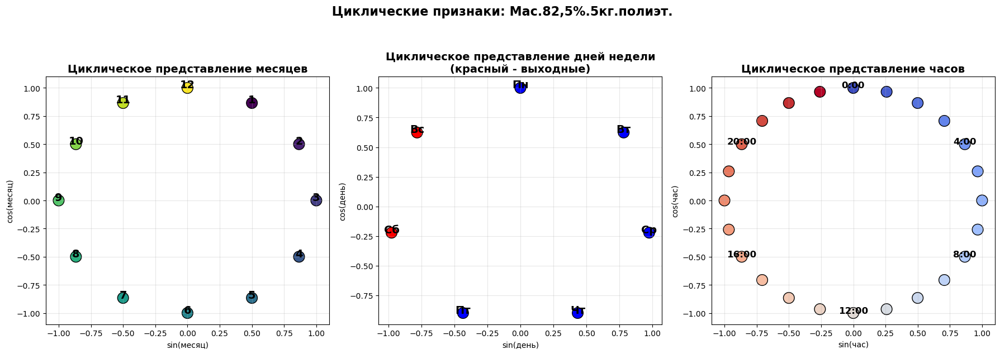


 Сохраняем в Minio: sales-analytics/Мас.82,5_.5кг.полиэт.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.5кг.полиэт./циклические_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Первые 10 строк лаговых признаков:
                 Дата  Количество  Количество_лаг_1час  Количество_лаг_3час  Количество_лаг_6час  Количество_лаг_12час  Количество_лаг_24час  Количество_лаг_168час  Количество_среднее_3ч  Количество_среднее_6ч  Количество_среднее_12ч  Количество_среднее_24ч
0 2025-03-13 09:00:00       816.0                  NaN                  NaN                  NaN                   NaN                   NaN                    NaN                    NaN                    NaN                     NaN                     NaN
1 2025-03-13 10:00:00      1632.0                816.0                  NaN                  NaN                   NaN                   NaN                    NaN                  816.0                  816.0              816.000000            

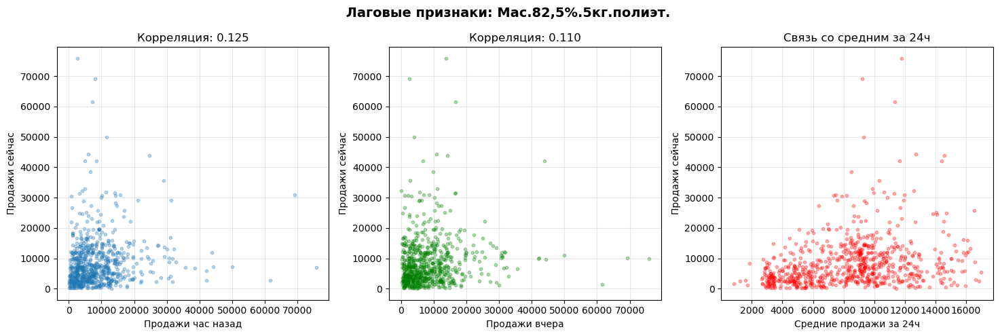


 Сохраняем в Minio: sales-analytics/Мас.82,5_.5кг.полиэт.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.5кг.полиэт./лаговые_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Пропуски в лаговых признаках (%):
   Количество_лаг_1час: 0.14% пропусков
   Количество_лаг_3час: 0.41% пропусков
   Количество_лаг_6час: 0.82% пропусков
   Количество_лаг_12час: 1.63% пропусков
   Количество_лаг_24час: 3.26% пропусков
   Количество_лаг_168час: 22.83% пропусков

 Статистика признаков по организациям:
       org_mean_sales  org_std_sales
count    7.360000e+02   7.360000e+02
mean     8.490652e+03   8.161032e+03
std      3.458430e-11   8.282030e-11
min      8.490652e+03   8.161032e+03
25%      8.490652e+03   8.161032e+03
50%      8.490652e+03   8.161032e+03
75%      8.490652e+03   8.161032e+03
max      8.490652e+03   8.161032e+03

 Статистика признаков по контрагентам:
       kontr_mean_sales  kontr_std_sales
count        736.000000       736.000000
mean        8490.652174   

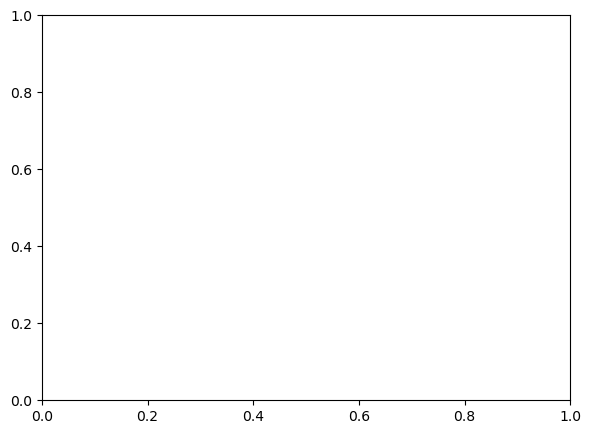

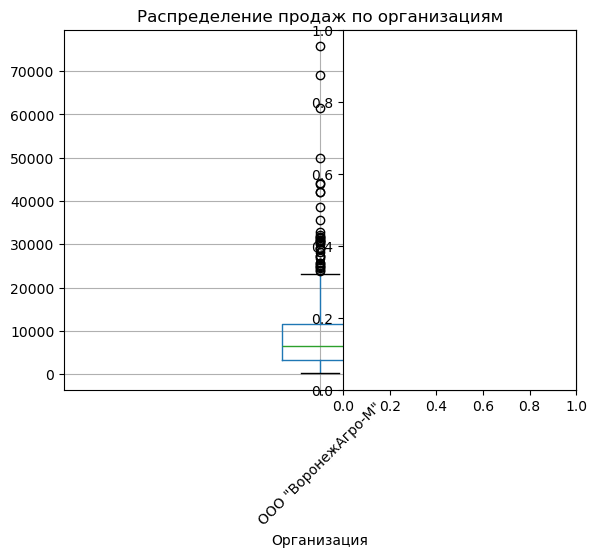

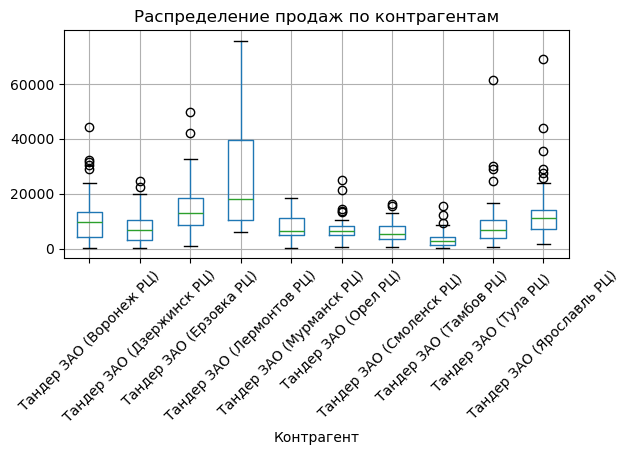


 Сохраняем в Minio: sales-analytics/Мас.82,5_.5кг.полиэт.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.5кг.полиэт./организации_контрагенты_распределение_20260313.pdf
    Всего сохранено: 1 объектов

 ИТОГОВАЯ СТАТИСТИКА ДЛЯ Мас.82,5%.5кг.полиэт.:
   Всего записей (часов): 736
   Всего признаков: 45
   Период: с 2025-03-13 09:00:00 по 2026-03-12 19:00:00
   Организаций: 1
   Контрагентов: 14

🔍 АНАЛИЗ ТОВАРА: Мас.КУ.82,5%.20кг.перг.


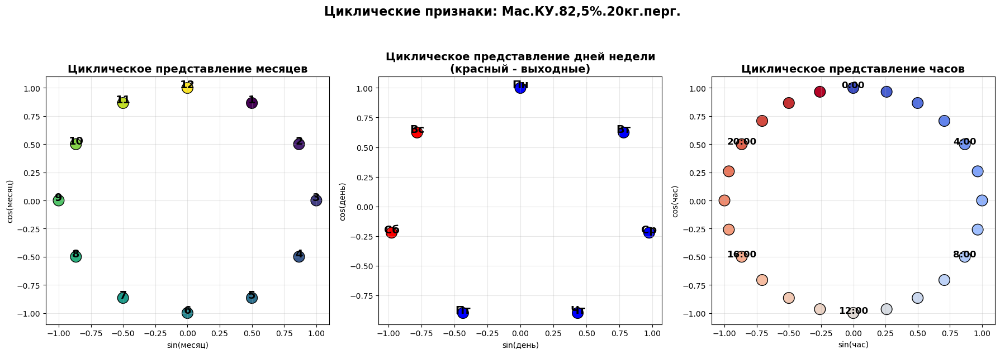


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.перг.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.перг./циклические_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Первые 10 строк лаговых признаков:
                 Дата  Количество  Количество_лаг_1час  Количество_лаг_3час  Количество_лаг_6час  Количество_лаг_12час  Количество_лаг_24час  Количество_лаг_168час  Количество_среднее_3ч  Количество_среднее_6ч  Количество_среднее_12ч  Количество_среднее_24ч
0 2025-03-13 09:00:00       816.0                  NaN                  NaN                  NaN                   NaN                   NaN                    NaN                    NaN                    NaN                     NaN                     NaN
1 2025-03-13 10:00:00      1632.0                816.0                  NaN                  NaN                   NaN                   NaN                    NaN                  816.0                  816.0              816.000000        

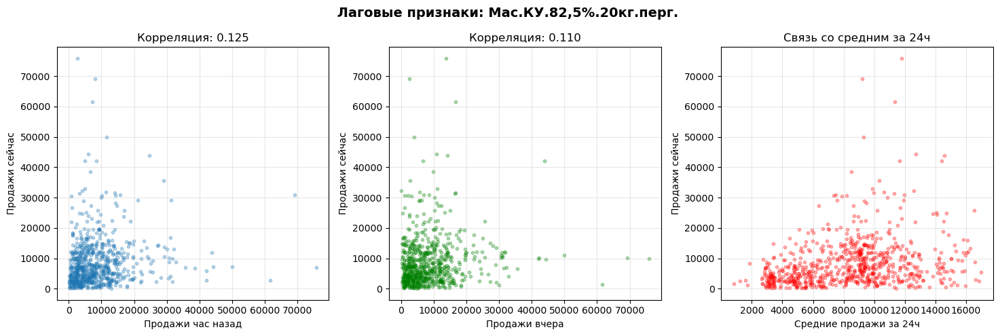


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.перг.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.перг./лаговые_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Пропуски в лаговых признаках (%):
   Количество_лаг_1час: 0.14% пропусков
   Количество_лаг_3час: 0.41% пропусков
   Количество_лаг_6час: 0.82% пропусков
   Количество_лаг_12час: 1.63% пропусков
   Количество_лаг_24час: 3.26% пропусков
   Количество_лаг_168час: 22.83% пропусков

 Статистика признаков по организациям:
       org_mean_sales  org_std_sales
count    7.360000e+02   7.360000e+02
mean     8.490652e+03   8.161032e+03
std      3.458430e-11   8.282030e-11
min      8.490652e+03   8.161032e+03
25%      8.490652e+03   8.161032e+03
50%      8.490652e+03   8.161032e+03
75%      8.490652e+03   8.161032e+03
max      8.490652e+03   8.161032e+03

 Статистика признаков по контрагентам:
       kontr_mean_sales  kontr_std_sales
count        736.000000       736.000000
mean        8490.65217

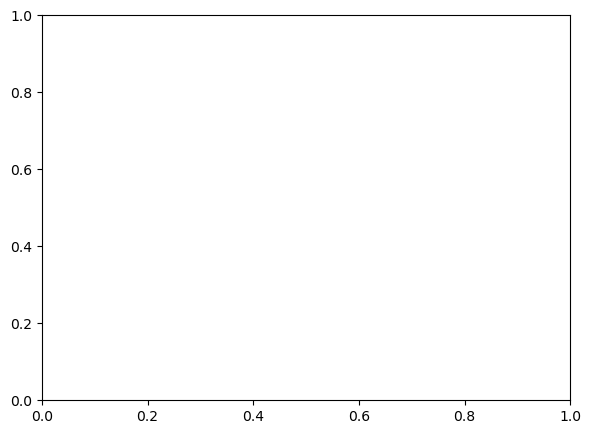

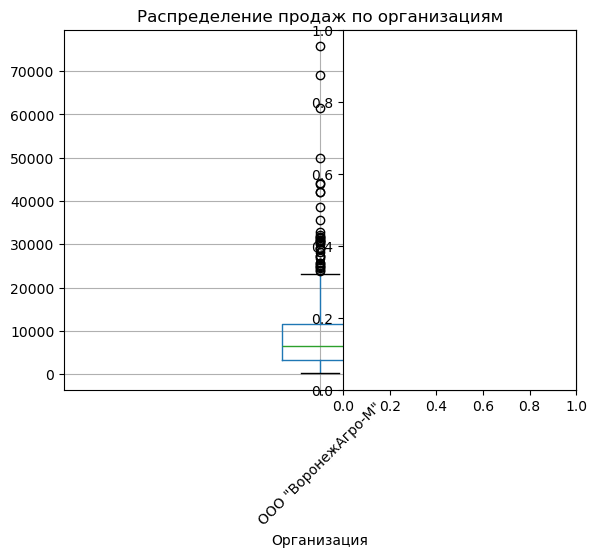

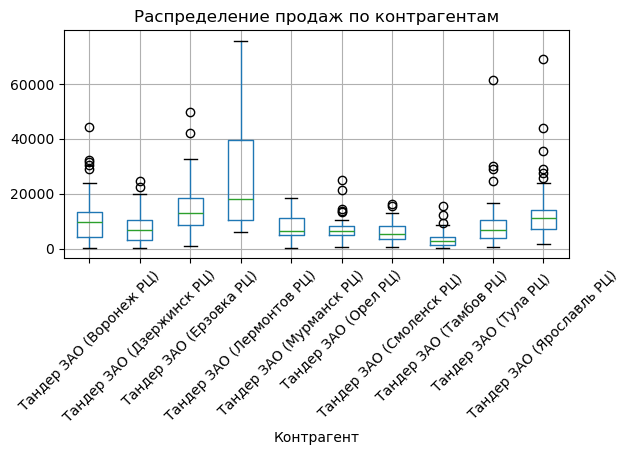


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.перг.
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.перг./организации_контрагенты_распределение_20260313.pdf
    Всего сохранено: 1 объектов

 ИТОГОВАЯ СТАТИСТИКА ДЛЯ Мас.КУ.82,5%.20кг.перг.:
   Всего записей (часов): 736
   Всего признаков: 45
   Период: с 2025-03-13 09:00:00 по 2026-03-12 19:00:00
   Организаций: 1
   Контрагентов: 14

🔍 АНАЛИЗ ТОВАРА: Мас.КУ.82,5%.20кг.полиэт.(61,5)


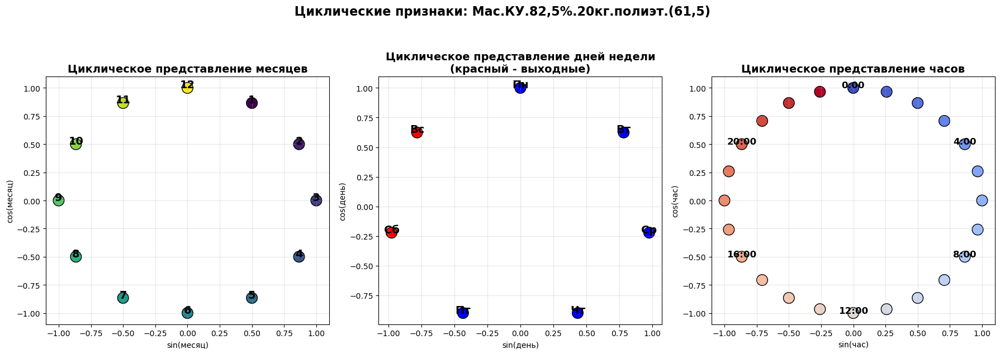


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.полиэт.(61,5)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт.(61,5)/циклические_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Первые 10 строк лаговых признаков:
                 Дата  Количество  Количество_лаг_1час  Количество_лаг_3час  Количество_лаг_6час  Количество_лаг_12час  Количество_лаг_24час  Количество_лаг_168час  Количество_среднее_3ч  Количество_среднее_6ч  Количество_среднее_12ч  Количество_среднее_24ч
0 2025-03-13 09:00:00       816.0                  NaN                  NaN                  NaN                   NaN                   NaN                    NaN                    NaN                    NaN                     NaN                     NaN
1 2025-03-13 10:00:00      1632.0                816.0                  NaN                  NaN                   NaN                   NaN                    NaN                  816.0                  816.0              81

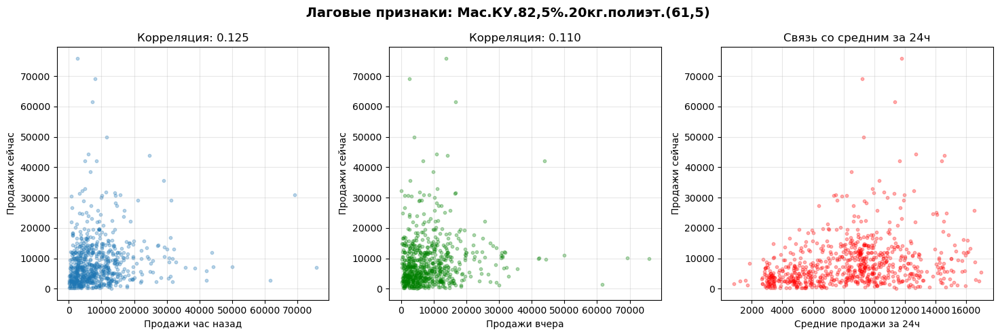


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.полиэт.(61,5)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт.(61,5)/лаговые_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Пропуски в лаговых признаках (%):
   Количество_лаг_1час: 0.14% пропусков
   Количество_лаг_3час: 0.41% пропусков
   Количество_лаг_6час: 0.82% пропусков
   Количество_лаг_12час: 1.63% пропусков
   Количество_лаг_24час: 3.26% пропусков
   Количество_лаг_168час: 22.83% пропусков

 Статистика признаков по организациям:
       org_mean_sales  org_std_sales
count    7.360000e+02   7.360000e+02
mean     8.490652e+03   8.161032e+03
std      3.458430e-11   8.282030e-11
min      8.490652e+03   8.161032e+03
25%      8.490652e+03   8.161032e+03
50%      8.490652e+03   8.161032e+03
75%      8.490652e+03   8.161032e+03
max      8.490652e+03   8.161032e+03

 Статистика признаков по контрагентам:
       kontr_mean_sales  kontr_std_sales
count        736.000000       736.000000
mean  

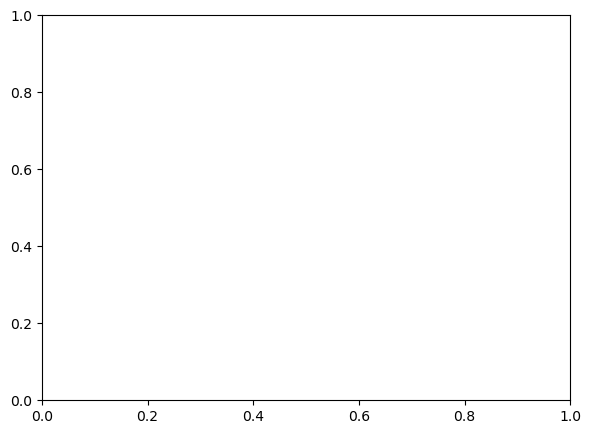

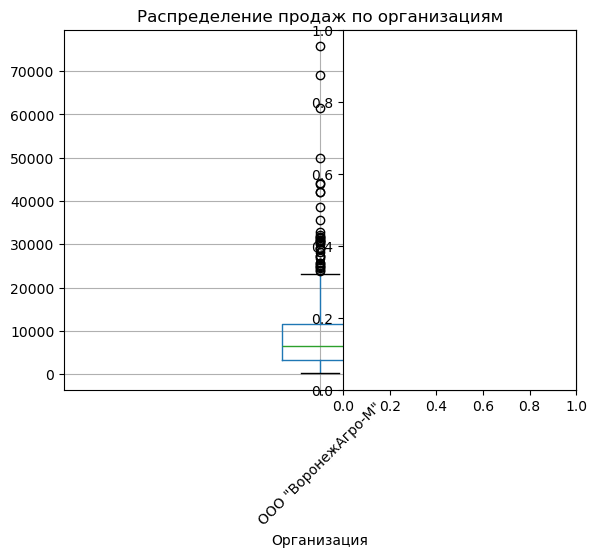

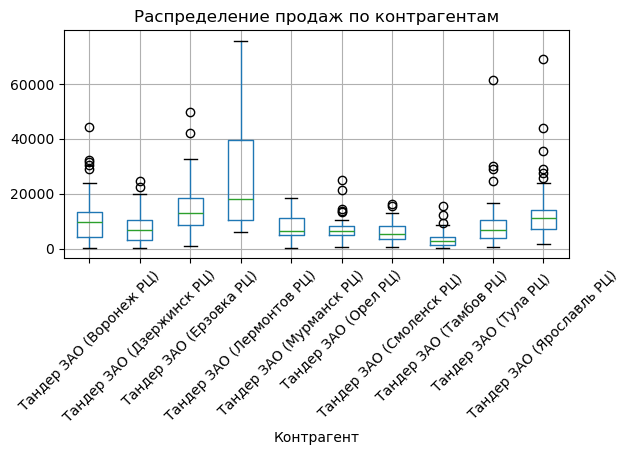


 Сохраняем в Minio: sales-analytics/Мас.КУ.82,5_.20кг.полиэт.(61,5)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.КУ.82,5_.20кг.полиэт.(61,5)/организации_контрагенты_распределение_20260313.pdf
    Всего сохранено: 1 объектов

 ИТОГОВАЯ СТАТИСТИКА ДЛЯ Мас.КУ.82,5%.20кг.полиэт.(61,5):
   Всего записей (часов): 736
   Всего признаков: 45
   Период: с 2025-03-13 09:00:00 по 2026-03-12 19:00:00
   Организаций: 1
   Контрагентов: 14

🔍 АНАЛИЗ ТОВАРА: Мас.72,5%.10кг.полиэт.$


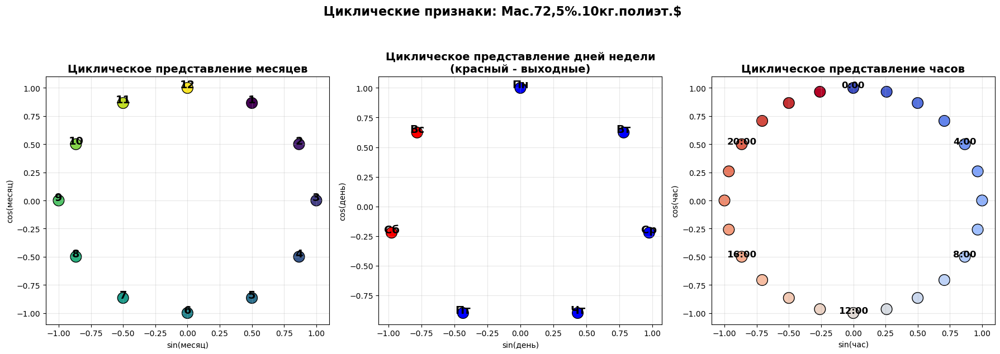


 Сохраняем в Minio: sales-analytics/Мас.72,5_.10кг.полиэт.$
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.72,5_.10кг.полиэт.$/циклические_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Первые 10 строк лаговых признаков:
                 Дата  Количество  Количество_лаг_1час  Количество_лаг_3час  Количество_лаг_6час  Количество_лаг_12час  Количество_лаг_24час  Количество_лаг_168час  Количество_среднее_3ч  Количество_среднее_6ч  Количество_среднее_12ч  Количество_среднее_24ч
0 2025-03-13 09:00:00       816.0                  NaN                  NaN                  NaN                   NaN                   NaN                    NaN                    NaN                    NaN                     NaN                     NaN
1 2025-03-13 10:00:00      1632.0                816.0                  NaN                  NaN                   NaN                   NaN                    NaN                  816.0                  816.0              816.000000        

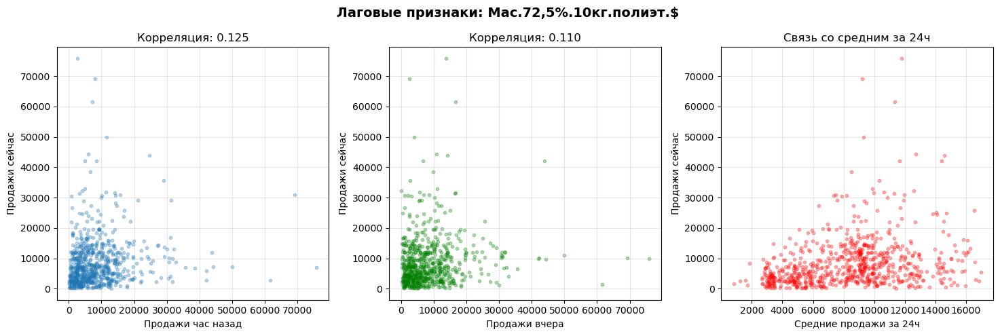


 Сохраняем в Minio: sales-analytics/Мас.72,5_.10кг.полиэт.$
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.72,5_.10кг.полиэт.$/лаговые_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Пропуски в лаговых признаках (%):
   Количество_лаг_1час: 0.14% пропусков
   Количество_лаг_3час: 0.41% пропусков
   Количество_лаг_6час: 0.82% пропусков
   Количество_лаг_12час: 1.63% пропусков
   Количество_лаг_24час: 3.26% пропусков
   Количество_лаг_168час: 22.83% пропусков

 Статистика признаков по организациям:
       org_mean_sales  org_std_sales
count    7.360000e+02   7.360000e+02
mean     8.490652e+03   8.161032e+03
std      3.458430e-11   8.282030e-11
min      8.490652e+03   8.161032e+03
25%      8.490652e+03   8.161032e+03
50%      8.490652e+03   8.161032e+03
75%      8.490652e+03   8.161032e+03
max      8.490652e+03   8.161032e+03

 Статистика признаков по контрагентам:
       kontr_mean_sales  kontr_std_sales
count        736.000000       736.000000
mean        8490.65217

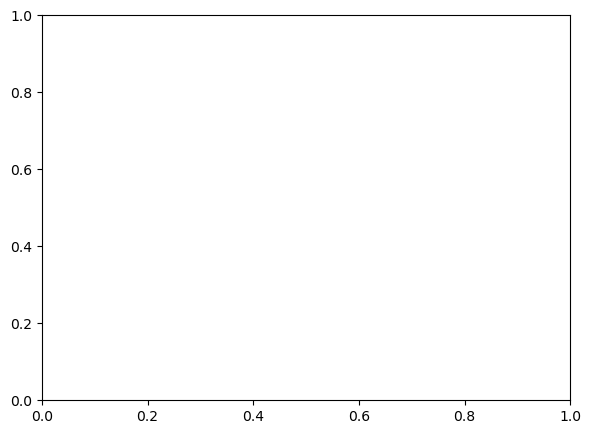

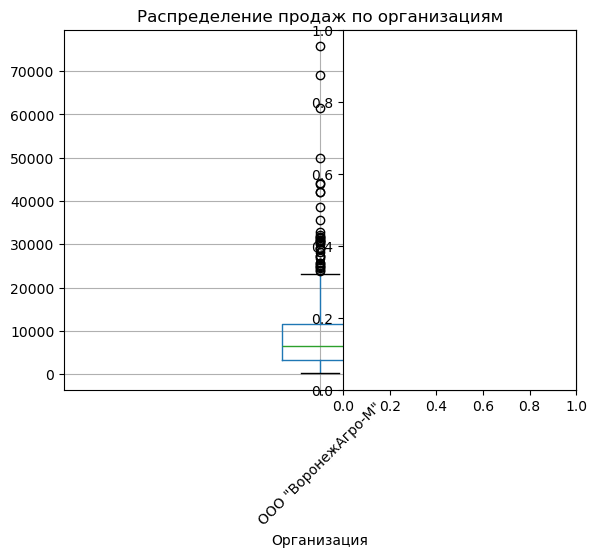

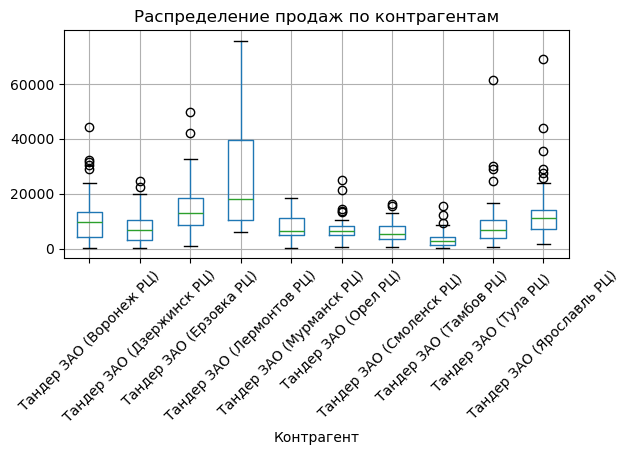


 Сохраняем в Minio: sales-analytics/Мас.72,5_.10кг.полиэт.$
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.72,5_.10кг.полиэт.$/организации_контрагенты_распределение_20260313.pdf
    Всего сохранено: 1 объектов

 ИТОГОВАЯ СТАТИСТИКА ДЛЯ Мас.72,5%.10кг.полиэт.$:
   Всего записей (часов): 736
   Всего признаков: 45
   Период: с 2025-03-13 09:00:00 по 2026-03-12 19:00:00
   Организаций: 1
   Контрагентов: 14

🔍 АНАЛИЗ ТОВАРА: Мас.82,5%.20 кг.полиэт(01030)


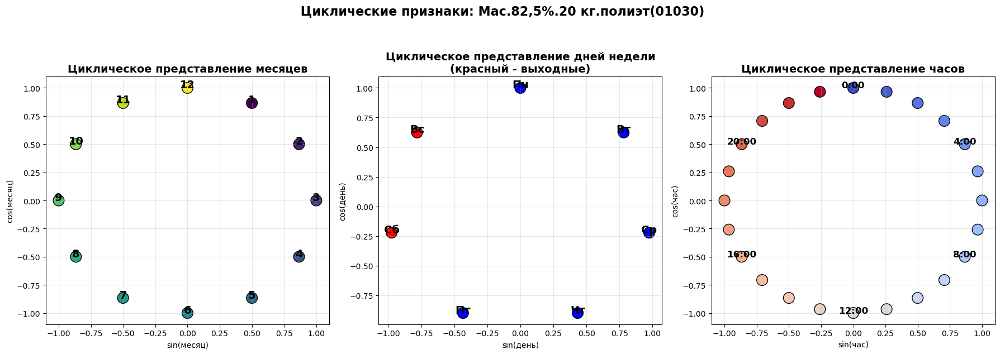


 Сохраняем в Minio: sales-analytics/Мас.82,5_.20 кг.полиэт(01030)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.20 кг.полиэт(01030)/циклические_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Первые 10 строк лаговых признаков:
                 Дата  Количество  Количество_лаг_1час  Количество_лаг_3час  Количество_лаг_6час  Количество_лаг_12час  Количество_лаг_24час  Количество_лаг_168час  Количество_среднее_3ч  Количество_среднее_6ч  Количество_среднее_12ч  Количество_среднее_24ч
0 2025-03-13 09:00:00       816.0                  NaN                  NaN                  NaN                   NaN                   NaN                    NaN                    NaN                    NaN                     NaN                     NaN
1 2025-03-13 10:00:00      1632.0                816.0                  NaN                  NaN                   NaN                   NaN                    NaN                  816.0                  816.0              816.00

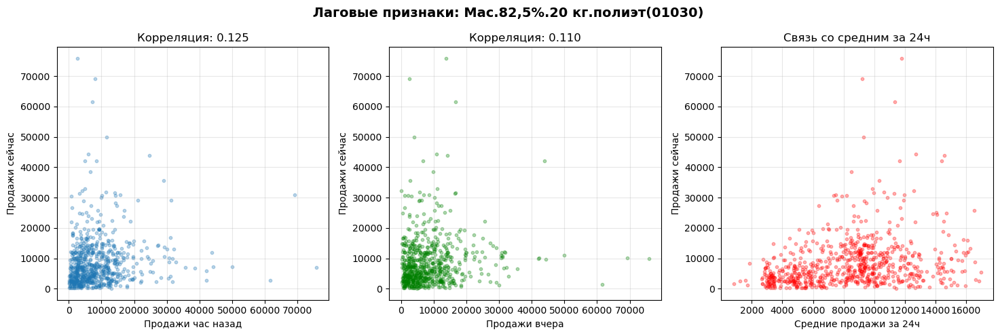


 Сохраняем в Minio: sales-analytics/Мас.82,5_.20 кг.полиэт(01030)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.20 кг.полиэт(01030)/лаговые_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Пропуски в лаговых признаках (%):
   Количество_лаг_1час: 0.14% пропусков
   Количество_лаг_3час: 0.41% пропусков
   Количество_лаг_6час: 0.82% пропусков
   Количество_лаг_12час: 1.63% пропусков
   Количество_лаг_24час: 3.26% пропусков
   Количество_лаг_168час: 22.83% пропусков

 Статистика признаков по организациям:
       org_mean_sales  org_std_sales
count    7.360000e+02   7.360000e+02
mean     8.490652e+03   8.161032e+03
std      3.458430e-11   8.282030e-11
min      8.490652e+03   8.161032e+03
25%      8.490652e+03   8.161032e+03
50%      8.490652e+03   8.161032e+03
75%      8.490652e+03   8.161032e+03
max      8.490652e+03   8.161032e+03

 Статистика признаков по контрагентам:
       kontr_mean_sales  kontr_std_sales
count        736.000000       736.000000
mean      

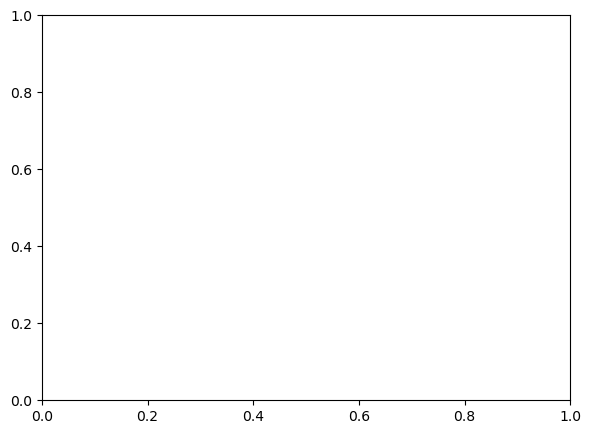

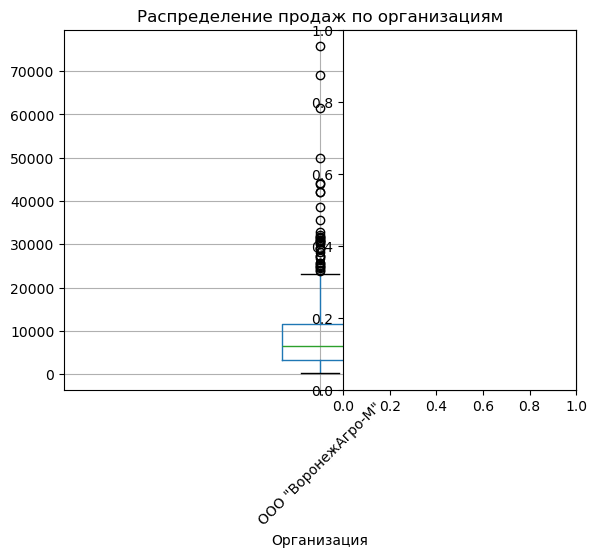

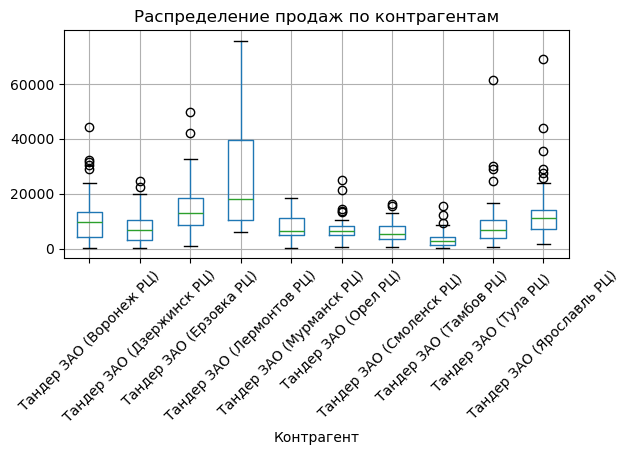


 Сохраняем в Minio: sales-analytics/Мас.82,5_.20 кг.полиэт(01030)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Мас.82,5_.20 кг.полиэт(01030)/организации_контрагенты_распределение_20260313.pdf
    Всего сохранено: 1 объектов

 ИТОГОВАЯ СТАТИСТИКА ДЛЯ Мас.82,5%.20 кг.полиэт(01030):
   Всего записей (часов): 736
   Всего признаков: 45
   Период: с 2025-03-13 09:00:00 по 2026-03-12 19:00:00
   Организаций: 1
   Контрагентов: 14

🔍 АНАЛИЗ ТОВАРА: Спр.72%.20кг.полиэт.(40%)(БЭ)


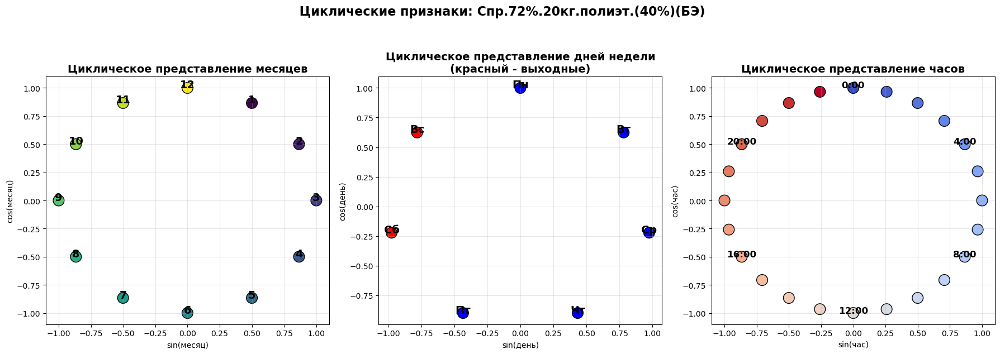


 Сохраняем в Minio: sales-analytics/Спр.72_.20кг.полиэт.(40_)(БЭ)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.полиэт.(40_)(БЭ)/циклические_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Первые 10 строк лаговых признаков:
                 Дата  Количество  Количество_лаг_1час  Количество_лаг_3час  Количество_лаг_6час  Количество_лаг_12час  Количество_лаг_24час  Количество_лаг_168час  Количество_среднее_3ч  Количество_среднее_6ч  Количество_среднее_12ч  Количество_среднее_24ч
0 2025-03-13 09:00:00       816.0                  NaN                  NaN                  NaN                   NaN                   NaN                    NaN                    NaN                    NaN                     NaN                     NaN
1 2025-03-13 10:00:00      1632.0                816.0                  NaN                  NaN                   NaN                   NaN                    NaN                  816.0                  816.0              816.00

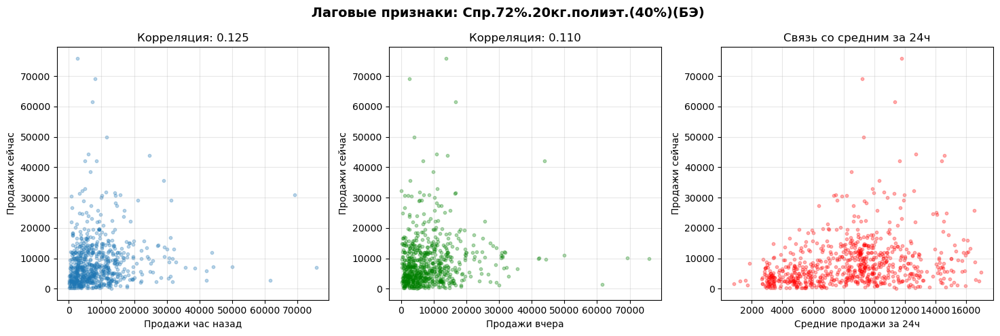


 Сохраняем в Minio: sales-analytics/Спр.72_.20кг.полиэт.(40_)(БЭ)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.полиэт.(40_)(БЭ)/лаговые_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Пропуски в лаговых признаках (%):
   Количество_лаг_1час: 0.14% пропусков
   Количество_лаг_3час: 0.41% пропусков
   Количество_лаг_6час: 0.82% пропусков
   Количество_лаг_12час: 1.63% пропусков
   Количество_лаг_24час: 3.26% пропусков
   Количество_лаг_168час: 22.83% пропусков

 Статистика признаков по организациям:
       org_mean_sales  org_std_sales
count    7.360000e+02   7.360000e+02
mean     8.490652e+03   8.161032e+03
std      3.458430e-11   8.282030e-11
min      8.490652e+03   8.161032e+03
25%      8.490652e+03   8.161032e+03
50%      8.490652e+03   8.161032e+03
75%      8.490652e+03   8.161032e+03
max      8.490652e+03   8.161032e+03

 Статистика признаков по контрагентам:
       kontr_mean_sales  kontr_std_sales
count        736.000000       736.000000
mean      

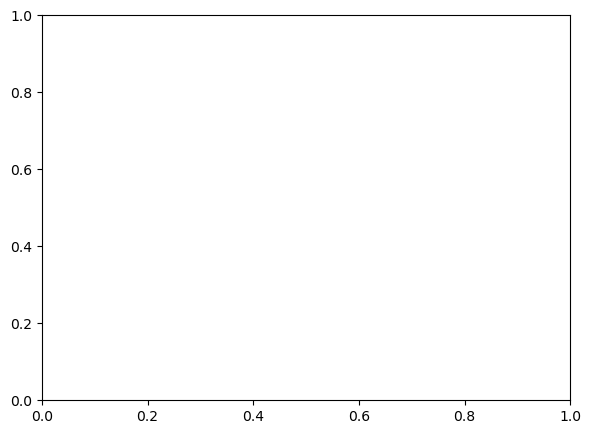

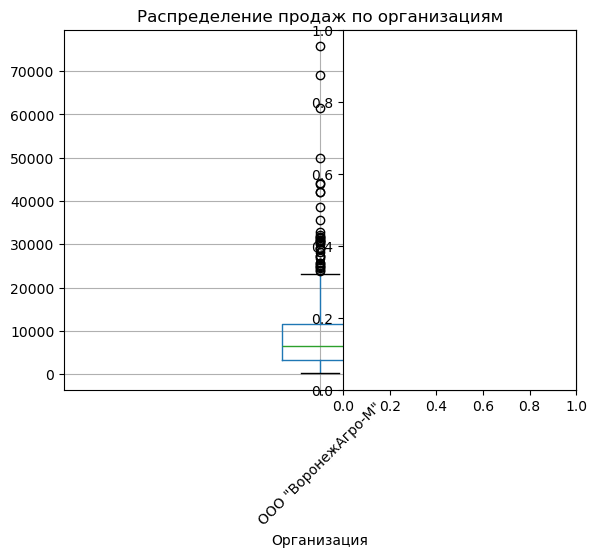

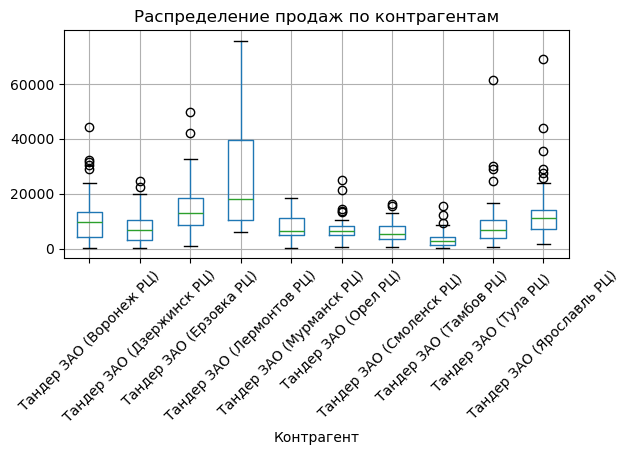


 Сохраняем в Minio: sales-analytics/Спр.72_.20кг.полиэт.(40_)(БЭ)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.полиэт.(40_)(БЭ)/организации_контрагенты_распределение_20260313.pdf
    Всего сохранено: 1 объектов

 ИТОГОВАЯ СТАТИСТИКА ДЛЯ Спр.72%.20кг.полиэт.(40%)(БЭ):
   Всего записей (часов): 736
   Всего признаков: 45
   Период: с 2025-03-13 09:00:00 по 2026-03-12 19:00:00
   Организаций: 1
   Контрагентов: 14

🔍 АНАЛИЗ ТОВАРА: Спр.72%.20кг.перг.(30%)(БЭ)


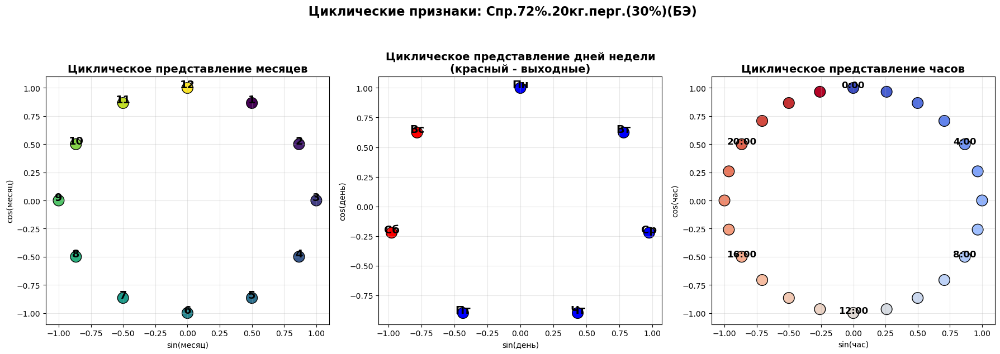


 Сохраняем в Minio: sales-analytics/Спр.72_.20кг.перг.(30_)(БЭ)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.перг.(30_)(БЭ)/циклические_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Первые 10 строк лаговых признаков:
                 Дата  Количество  Количество_лаг_1час  Количество_лаг_3час  Количество_лаг_6час  Количество_лаг_12час  Количество_лаг_24час  Количество_лаг_168час  Количество_среднее_3ч  Количество_среднее_6ч  Количество_среднее_12ч  Количество_среднее_24ч
0 2025-03-13 09:00:00       816.0                  NaN                  NaN                  NaN                   NaN                   NaN                    NaN                    NaN                    NaN                     NaN                     NaN
1 2025-03-13 10:00:00      1632.0                816.0                  NaN                  NaN                   NaN                   NaN                    NaN                  816.0                  816.0              816.000000

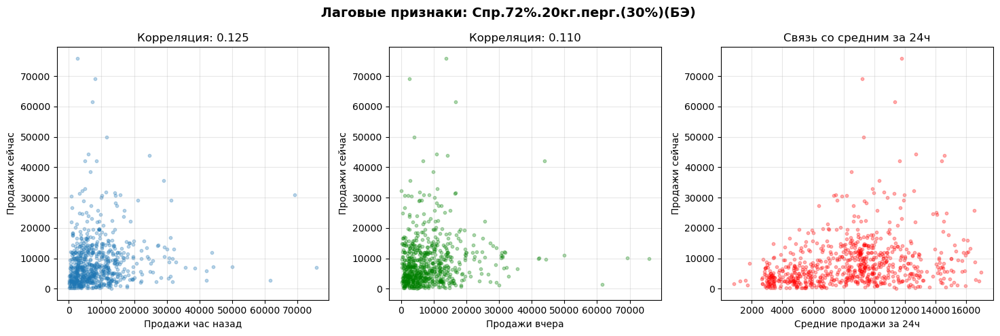


 Сохраняем в Minio: sales-analytics/Спр.72_.20кг.перг.(30_)(БЭ)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.перг.(30_)(БЭ)/лаговые_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Пропуски в лаговых признаках (%):
   Количество_лаг_1час: 0.14% пропусков
   Количество_лаг_3час: 0.41% пропусков
   Количество_лаг_6час: 0.82% пропусков
   Количество_лаг_12час: 1.63% пропусков
   Количество_лаг_24час: 3.26% пропусков
   Количество_лаг_168час: 22.83% пропусков

 Статистика признаков по организациям:
       org_mean_sales  org_std_sales
count    7.360000e+02   7.360000e+02
mean     8.490652e+03   8.161032e+03
std      3.458430e-11   8.282030e-11
min      8.490652e+03   8.161032e+03
25%      8.490652e+03   8.161032e+03
50%      8.490652e+03   8.161032e+03
75%      8.490652e+03   8.161032e+03
max      8.490652e+03   8.161032e+03

 Статистика признаков по контрагентам:
       kontr_mean_sales  kontr_std_sales
count        736.000000       736.000000
mean        84

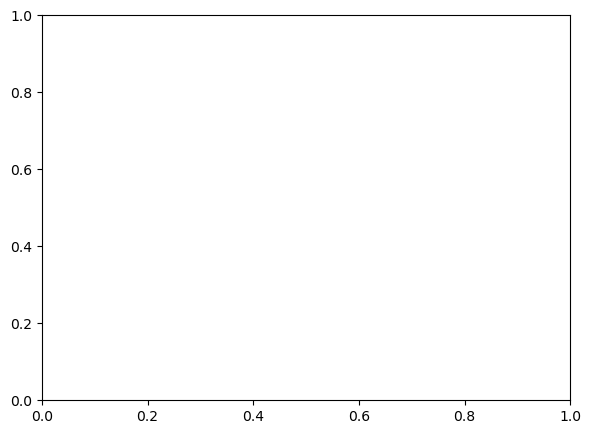

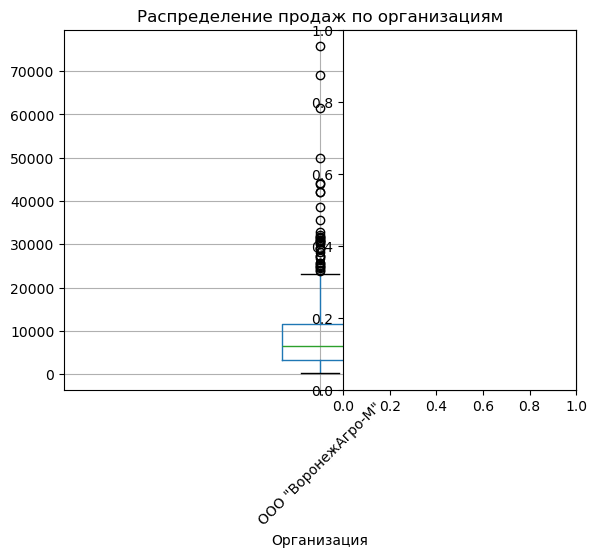

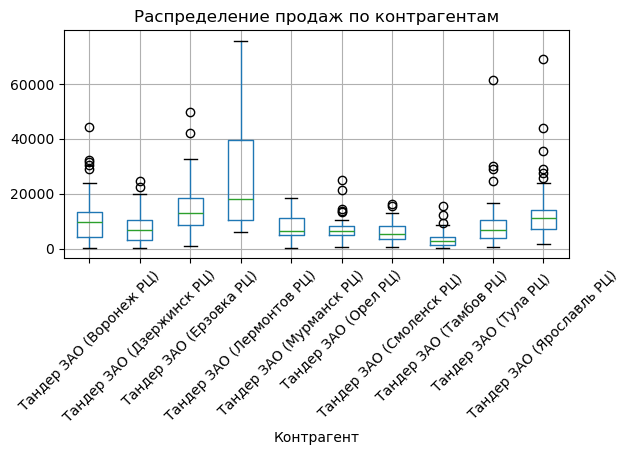


 Сохраняем в Minio: sales-analytics/Спр.72_.20кг.перг.(30_)(БЭ)
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.72_.20кг.перг.(30_)(БЭ)/организации_контрагенты_распределение_20260313.pdf
    Всего сохранено: 1 объектов

 ИТОГОВАЯ СТАТИСТИКА ДЛЯ Спр.72%.20кг.перг.(30%)(БЭ):
   Всего записей (часов): 736
   Всего признаков: 45
   Период: с 2025-03-13 09:00:00 по 2026-03-12 19:00:00
   Организаций: 1
   Контрагентов: 14

🔍 АНАЛИЗ ТОВАРА: Спр.БЛ.82%.1000г.фол.6шт


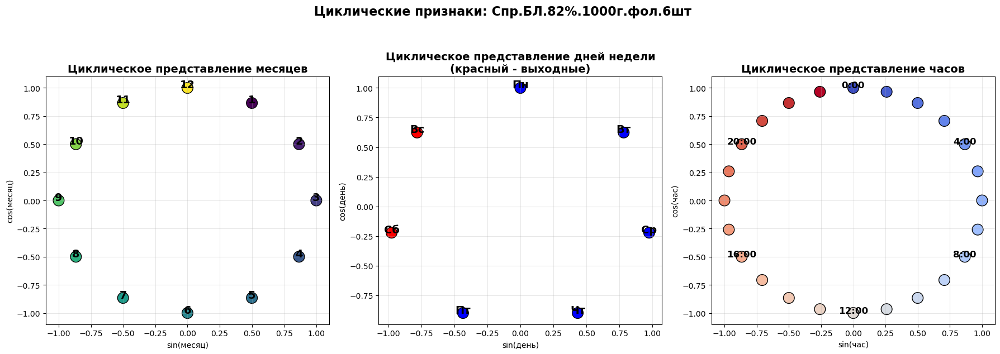


 Сохраняем в Minio: sales-analytics/Спр.БЛ.82_.1000г.фол.6шт
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.БЛ.82_.1000г.фол.6шт/циклические_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Первые 10 строк лаговых признаков:
                 Дата  Количество  Количество_лаг_1час  Количество_лаг_3час  Количество_лаг_6час  Количество_лаг_12час  Количество_лаг_24час  Количество_лаг_168час  Количество_среднее_3ч  Количество_среднее_6ч  Количество_среднее_12ч  Количество_среднее_24ч
0 2025-03-13 09:00:00       816.0                  NaN                  NaN                  NaN                   NaN                   NaN                    NaN                    NaN                    NaN                     NaN                     NaN
1 2025-03-13 10:00:00      1632.0                816.0                  NaN                  NaN                   NaN                   NaN                    NaN                  816.0                  816.0              816.000000      

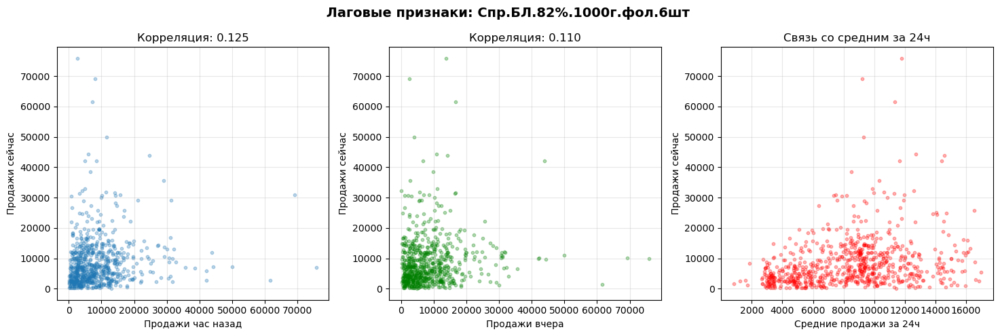


 Сохраняем в Minio: sales-analytics/Спр.БЛ.82_.1000г.фол.6шт
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.БЛ.82_.1000г.фол.6шт/лаговые_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Пропуски в лаговых признаках (%):
   Количество_лаг_1час: 0.14% пропусков
   Количество_лаг_3час: 0.41% пропусков
   Количество_лаг_6час: 0.82% пропусков
   Количество_лаг_12час: 1.63% пропусков
   Количество_лаг_24час: 3.26% пропусков
   Количество_лаг_168час: 22.83% пропусков

 Статистика признаков по организациям:
       org_mean_sales  org_std_sales
count    7.360000e+02   7.360000e+02
mean     8.490652e+03   8.161032e+03
std      3.458430e-11   8.282030e-11
min      8.490652e+03   8.161032e+03
25%      8.490652e+03   8.161032e+03
50%      8.490652e+03   8.161032e+03
75%      8.490652e+03   8.161032e+03
max      8.490652e+03   8.161032e+03

 Статистика признаков по контрагентам:
       kontr_mean_sales  kontr_std_sales
count        736.000000       736.000000
mean        8490.652

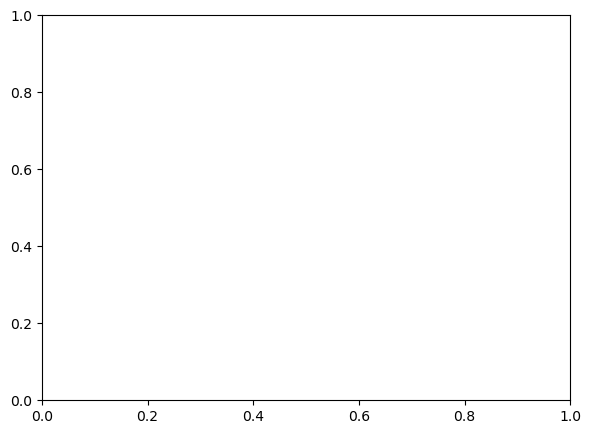

KeyboardInterrupt: 

In [52]:
def create_time_features(df_product):
    """
    Добавляет временные признаки для анализа и модели
    """
    df = df_product.copy()
    
    # Агрегация по часам (если нужна)
    df['Час_начало'] = df['Дата'].dt.floor('H')
    
    # Базовые временные признаки
    df['Год'] = df['Дата'].dt.year
    df['Месяц'] = df['Дата'].dt.month
    df['День_месяца'] = df['Дата'].dt.day
    df['День_недели'] = df['Дата'].dt.dayofweek
    df['Час'] = df['Дата'].dt.hour
    df['Неделя_года'] = df['Дата'].dt.isocalendar().week
    
    # Циклические признаки (для графиков)
    df['Месяц_sin'] = np.sin(2 * np.pi * df['Месяц'] / 12)
    df['Месяц_cos'] = np.cos(2 * np.pi * df['Месяц'] / 12)
    df['Час_sin'] = np.sin(2 * np.pi * df['Час'] / 24)
    df['Час_cos'] = np.cos(2 * np.pi * df['Час'] / 24)
    
    # Бинарные флаги
    df['Выходной'] = df['День_недели'].isin([5, 6]).astype(int)
    
    return df

# ПРИМЕНЯЕМ К КАЖДОМУ ТОВАРУ В ЦИКЛЕ
for product_name in products_list:
    print(f"\n{'='*70}")
    print(f"🔍 АНАЛИЗ ТОВАРА: {product_name[:70]}")
    print('='*70)
    
    # Получаем данные для товара
    df_product = full_df_enriched[full_df_enriched['Номенклатура'] == product_name].copy()
    
    # 1. СОЗДАЕМ ВРЕМЕННЫЕ ПРИЗНАКИ
    df_product = create_time_features(df_product)  # ← функция из предыдущего сообщения
    
    # 2. ТЕПЕРЬ ВИЗУАЛИЗАЦИЯ (ВЕСЬ БЛОК КОТОРЫЙ Я ДАЛ)
    # ============================================
    # ============================================
    # ВИЗУАЛИЗАЦИЯ ДЛЯ ТЕКУЩЕГО ТОВАРА
    # ============================================
    
    # Очищаем имя для сохранения
    clean_name = re.sub(r'[<>:"/\\|?*%\'"]', '_', product_name)
    clean_name = clean_name[:50]
    
    # 1. ЦИКЛИЧЕСКИЕ ПРИЗНАКИ
    fig1 = plt.figure(figsize=(18, 6))
    
    # Месяцы на окружности
    plt.subplot(1, 3, 1)
    months = df_product.groupby('Месяц')[['Месяц_sin', 'Месяц_cos']].mean()
    plt.scatter(months['Месяц_sin'], months['Месяц_cos'], c=months.index, cmap='viridis', s=200, edgecolor='black')
    for i, (sin, cos) in months.iterrows():
        plt.annotate(f'{int(i)}', (sin, cos), fontsize=14, ha='center', fontweight='bold')
    plt.title('Циклическое представление месяцев', fontsize=14, fontweight='bold')
    plt.xlabel('sin(месяц)')
    plt.ylabel('cos(месяц)')
    plt.grid(True, alpha=0.3)
    
    # Дни недели
    plt.subplot(1, 3, 2)
    days = df_product.groupby('День_недели')[['День_недели_sin', 'День_недели_cos']].mean()
    days_names = ['Пн', 'Вт', 'Ср', 'Чт', 'Пт', 'Сб', 'Вс']
    colors = ['red' if i in [5,6] else 'blue' for i in days.index]
    plt.scatter(days['День_недели_sin'], days['День_недели_cos'], c=colors, s=200, edgecolor='black')
    for i, (sin, cos) in days.iterrows():
        plt.annotate(days_names[int(i)], (sin, cos), fontsize=14, ha='center', fontweight='bold')
    plt.title('Циклическое представление дней недели\n(красный - выходные)', fontsize=14, fontweight='bold')
    plt.xlabel('sin(день)')
    plt.ylabel('cos(день)')
    plt.grid(True, alpha=0.3)
    
    # Часы
    plt.subplot(1, 3, 3)
    hours = df_product.groupby('Час')[['Час_sin', 'Час_cos']].mean()
    plt.scatter(hours['Час_sin'], hours['Час_cos'], c=hours.index, cmap='coolwarm', s=200, edgecolor='black')
    for i, (sin, cos) in hours.iterrows():
        if i % 4 == 0:
            plt.annotate(f'{int(i)}:00', (sin, cos), fontsize=12, ha='center', fontweight='bold')
    plt.title('Циклическое представление часов', fontsize=14, fontweight='bold')
    plt.xlabel('sin(час)')
    plt.ylabel('cos(час)')
    plt.grid(True, alpha=0.3)
    
    plt.suptitle(f' Циклические признаки: {product_name[:50]}', fontsize=16, fontweight='bold', y=1.05)
    plt.tight_layout()
    plt.show()
    
    # Сохраняем
    save_to_minio(
        bucket_name="sales-analytics",
        block_name=clean_name,
        plot_name=f"циклические_признаки_{datetime.now().strftime('%Y%m%d')}",
        data=None,
        fig=fig1,
        formats=['pdf']
    )
    
    # 2. АНАЛИЗ ЛАГОВЫХ ПРИЗНАКОВ
    lag_features = ['Дата', 'Количество', 
                    'Количество_лаг_1час', 'Количество_лаг_3час', 'Количество_лаг_6час',
                    'Количество_лаг_12час', 'Количество_лаг_24час', 'Количество_лаг_168час',
                    'Количество_среднее_3ч', 'Количество_среднее_6ч', 'Количество_среднее_12ч', 
                    'Количество_среднее_24ч']
    
    print("\n Первые 10 строк лаговых признаков:")
    print(df_product[lag_features].head(10).to_string())
    
    # Корреляция с лагами
    print("\n Корреляция текущих продаж с лаговыми признаками:")
    lag_corr = df_product[['Количество', 
                            'Количество_лаг_1час', 'Количество_лаг_3час', 
                            'Количество_лаг_6час', 'Количество_лаг_12час',
                            'Количество_лаг_24час', 'Количество_лаг_168час']].corr()['Количество'].sort_values(ascending=False)
    print(lag_corr)
    
    # Визуализация связи с лагами
    fig2 = plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.scatter(df_product['Количество_лаг_1час'], df_product['Количество'], alpha=0.3, s=10)
    plt.title(f'Корреляция: {lag_corr["Количество_лаг_1час"]:.3f}')
    plt.xlabel('Продажи час назад')
    plt.ylabel('Продажи сейчас')
    plt.grid(True, alpha=0.3)
    
    plt.subplot(1, 3, 2)
    plt.scatter(df_product['Количество_лаг_24час'], df_product['Количество'], alpha=0.3, s=10, color='green')
    plt.title(f'Корреляция: {lag_corr["Количество_лаг_24час"]:.3f}')
    plt.xlabel('Продажи вчера')
    plt.ylabel('Продажи сейчас')
    plt.grid(True, alpha=0.3)
    
    plt.subplot(1, 3, 3)
    plt.scatter(df_product['Количество_среднее_24ч'], df_product['Количество'], alpha=0.3, s=10, color='red')
    plt.title('Связь со средним за 24ч')
    plt.xlabel('Средние продажи за 24ч')
    plt.ylabel('Продажи сейчас')
    plt.grid(True, alpha=0.3)
    
    plt.suptitle(f' Лаговые признаки: {product_name[:50]}', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    save_to_minio(
        bucket_name="sales-analytics",
        block_name=clean_name,
        plot_name=f"лаговые_признаки_{datetime.now().strftime('%Y%m%d')}",
        data=None,
        fig=fig2,
        formats=['pdf']
    )
    
    # 3. ПРОПУСКИ В ЛАГАХ
    print("\n Пропуски в лаговых признаках (%):")
    lag_missing = df_product[['Количество_лаг_1час', 'Количество_лаг_3час', 
                               'Количество_лаг_6час', 'Количество_лаг_12час',
                               'Количество_лаг_24час', 'Количество_лаг_168час']].isnull().sum()
    lag_missing_pct = (lag_missing / len(df_product) * 100).round(2)
    for feat, pct in lag_missing_pct.items():
        print(f"   {feat}: {pct}% пропусков")
    
    # 4. ПРИЗНАКИ ПО ОРГАНИЗАЦИЯМ И КОНТРАГЕНТАМ
    if 'org_mean_sales' in df_product.columns:
        org_features = ['org_mean_sales', 'org_std_sales']
        kontr_features = ['kontr_mean_sales', 'kontr_std_sales']
        
        print("\n Статистика признаков по организациям:")
        print(df_product[org_features].describe())
        
        print("\n Статистика признаков по контрагентам:")
        print(df_product[kontr_features].describe())
        
        # Boxplot
        fig3 = plt.figure(figsize=(15, 5))
        
        plt.subplot(1, 2, 1)
        if df_product['Организация'].nunique() <= 10:
            df_product.boxplot(column='Количество', by='Организация')
        else:
            top_orgs = df_product.groupby('Организация')['Количество'].sum().nlargest(10).index
            df_product[df_product['Организация'].isin(top_orgs)].boxplot(column='Количество', by='Организация')
        plt.title('Распределение продаж по организациям')
        plt.suptitle('')
        plt.xticks(rotation=45)
        
        plt.subplot(1, 2, 2)
        if df_product['Контрагент'].nunique() <= 10:
            df_product.boxplot(column='Количество', by='Контрагент')
        else:
            top_kontr = df_product.groupby('Контрагент')['Количество'].sum().nlargest(10).index
            df_product[df_product['Контрагент'].isin(top_kontr)].boxplot(column='Количество', by='Контрагент')
        plt.title('Распределение продаж по контрагентам')
        plt.suptitle('')
        plt.xticks(rotation=45)
        
        plt.tight_layout()
        plt.show()
        
        save_to_minio(
            bucket_name="sales-analytics",
            block_name=clean_name,
            plot_name=f"организации_контрагенты_распределение_{datetime.now().strftime('%Y%m%d')}",
            data=None,
            fig=fig3,
            formats=['pdf']
        )
    
    # 5. ИТОГОВАЯ СТАТИСТИКА
    print(f"\n ИТОГОВАЯ СТАТИСТИКА ДЛЯ {product_name[:50]}:")
    print(f"   Всего записей (часов): {len(df_product)}")
    print(f"   Всего признаков: {len(df_product.columns)}")
    print(f"   Период: с {df_product['Дата'].min()} по {df_product['Дата'].max()}")
    print(f"   Организаций: {df_product['Организация'].nunique()}")
    print(f"   Контрагентов: {df_product['Контрагент'].nunique()}")


    #  Временной ряд - почасовые продажи
    plt.figure(figsize=(15, 6))
    
    # Сумма продаж по часам
    plt.plot(df_product['Дата'], df_product['Количество'], 
             linewidth=1, color='blue', alpha=0.5, label='Почасовые продажи')
    
    # Добавляем скользящее среднее (24 часа)
    df_product['Количество_среднее_24ч_виз'] = df_product['Количество'].rolling(window=24).mean()
    plt.plot(df_product['Дата'], df_product['Количество_среднее_24ч_виз'], 
             linewidth=2, color='red', label='Среднее за 24 часа')
    
    plt.title('Почасовые продажи во времени', fontsize=14, fontweight='bold')
    plt.xlabel('Дата')
    plt.ylabel('Количество продаж')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    
    #  Продажи по часам (среднее и сумма)
    plt.figure(figsize=(14, 5))
    
    # Группируем по часу
    hourly_stats = df_product.groupby('Час')['Количество'].agg(['mean', 'sum', 'count', 'std']).round(2)
    
    # Средние продажи по часам
    plt.subplot(1, 2, 1)
    hourly_stats['mean'].plot(kind='bar', color='skyblue', edgecolor='black')
    plt.title('Средние продажи по часам', fontsize=12, fontweight='bold')
    plt.xlabel('Час')
    plt.ylabel('Среднее количество')
    plt.xticks(rotation=0)
    plt.grid(True, alpha=0.3, axis='y')
    
    # Добавляем стандартное отклонение
    plt.errorbar(x=range(24), y=hourly_stats['mean'], 
                 yerr=hourly_stats['std'], fmt='none', color='red', capsize=3)
    
    # Суммарные продажи по часам
    plt.subplot(1, 2, 2)
    hourly_stats['sum'].plot(kind='bar', color='salmon', edgecolor='black')
    plt.title('Суммарные продажи по часам', fontsize=12, fontweight='bold')
    plt.xlabel('Час')
    plt.ylabel('Суммарное количество')
    plt.xticks(rotation=0)
    plt.grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    
    save_to_minio(
        bucket_name="sales-analytics",
        block_name="Пр.из творога 365 дней 24проц 500г пакет 8шт",
        plot_name=f"Суммарные продажи по часам_{datetime.now().strftime('%Y%m%d')}",  
        data=None,  
        fig=plt.gcf(),
        formats=['pdf']
    )
    plt.show()
    
    #  Продажи по дням недели
    plt.figure(figsize=(14, 5))
    
    days = ['Пн', 'Вт', 'Ср', 'Чт', 'Пт', 'Сб', 'Вс']
    weekday_stats = df_product.groupby('День_недели')['Количество'].agg(['mean', 'sum', 'std'])
    
    # Средние продажи по дням недели
    plt.subplot(1, 2, 1)
    colors = ['red' if i in [5,6] else 'lightgreen' for i in range(7)]
    weekday_stats['mean'].plot(kind='bar', color=colors, edgecolor='black')
    plt.title('Средние продажи по дням недели\n(красный - выходные)', fontsize=12, fontweight='bold')
    plt.xlabel('День недели')
    plt.ylabel('Среднее количество')
    plt.xticks(ticks=range(7), labels=days, rotation=0)
    plt.grid(True, alpha=0.3, axis='y')
    
    # Суммарные продажи по дням недели
    plt.subplot(1, 2, 2)
    weekday_stats['sum'].plot(kind='bar', color=colors, edgecolor='black')
    plt.title('Суммарные продажи по дням недели', fontsize=12, fontweight='bold')
    plt.xlabel('День недели')
    plt.ylabel('Суммарное количество')
    plt.xticks(ticks=range(7), labels=days, rotation=0)
    plt.grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    plt.show()
    
    #  Анализ по месяцам
    plt.figure(figsize=(14, 5))
    
    monthly_stats = df_product.groupby('Месяц')['Количество'].agg(['mean', 'sum', 'std'])
    months = ['Янв', 'Фев', 'Мар', 'Апр', 'Май', 'Июн', 
              'Июл', 'Авг', 'Сен', 'Окт', 'Ноя', 'Дек']
    
    plt.subplot(1, 2, 1)
    monthly_stats['mean'].plot(kind='bar', color='purple', edgecolor='black')
    plt.title('Средние продажи по месяцам', fontsize=12, fontweight='bold')
    plt.xlabel('Месяц')
    plt.ylabel('Среднее количество')
    plt.xticks(ticks=range(12), labels=months, rotation=45)
    plt.grid(True, alpha=0.3, axis='y')
    
    plt.subplot(1, 2, 2)
    monthly_stats['sum'].plot(kind='bar', color='teal', edgecolor='black')
    plt.title('Суммарные продажи по месяцам', fontsize=12, fontweight='bold')
    plt.xlabel('Месяц')
    plt.ylabel('Суммарное количество')
    plt.xticks(ticks=range(12), labels=months, rotation=45)
    plt.grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    
    save_to_minio(
        bucket_name="sales-analytics",
        block_name="Пр.из творога 365 дней 24проц 500г пакет 8шт",
        plot_name=f"Суммарные продажи по месяцам_{datetime.now().strftime('%Y%m%d')}",  
        data=None,  
        fig=plt.gcf(),
        formats=['pdf']
    )
    plt.show()
    
    #  Корреляционная матрица (расширенная)
    plt.figure(figsize=(14, 12))
    
    # Выбираем основные числовые признаки
    numeric_cols = ['Количество', 'Цена', 'Сумма', 'НДС',
                    'Год', 'Месяц', 'День_месяца', 'День_недели', 'Час',
                    'Месяц_sin', 'Месяц_cos', 'День_недели_sin', 'День_недели_cos',
                    'org_mean_sales', 'kontr_mean_sales',
                    'Количество_лаг_1час', 'Количество_лаг_24час', 'Количество_среднее_24ч']
    
    # Берем только существующие колонки
    existing_cols = [col for col in numeric_cols if col in df_product.columns]
    correlation_matrix = df_product[existing_cols].corr()
    
    # Тепловая карта
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, 
                fmt='.2f', square=True, linewidths=0.5, annot_kws={'size': 8})
    plt.title('Корреляция между признаками', fontsize=14, fontweight='bold')
    plt.tight_layout()
    
    save_to_minio(
        bucket_name="sales-analytics",
        block_name="Пр.из творога 365 дней 24проц 500г пакет 8шт",
        plot_name=f"Корреляция между признаками_{datetime.now().strftime('%Y%m%d')}",  
        data=None,  
        fig=plt.gcf(),
        formats=['pdf']
    )
    plt.show()
    
    #  Распределение ключевых показателей
    plt.figure(figsize=(18, 5))
    
    plt.subplot(1, 4, 1)
    df_product['Количество'].hist(bins=50, color='skyblue', edgecolor='black', alpha=0.7)
    plt.title('Распределение количества продаж', fontsize=12)
    plt.xlabel('Количество')
    plt.ylabel('Частота')
    
    plt.subplot(1, 4, 2)
    df_product['Цена'].hist(bins=50, color='lightgreen', edgecolor='black', alpha=0.7)
    plt.title('Распределение цен', fontsize=12)
    plt.xlabel('Цена')
    plt.ylabel('Частота')
    
    plt.subplot(1, 4, 3)
    df_product['Сумма'].hist(bins=50, color='salmon', edgecolor='black', alpha=0.7)
    plt.title('Распределение сумм', fontsize=12)
    plt.xlabel('Сумма')
    plt.ylabel('Частота')
    
    plt.subplot(1, 4, 4)
    df_product['org_mean_sales'].hist(bins=50, color='purple', edgecolor='black', alpha=0.7)
    plt.title('Средние продажи по организациям', fontsize=12)
    plt.xlabel('org_mean_sales')
    plt.ylabel('Частота')
    
    plt.tight_layout()
    
    save_to_minio(
        bucket_name="sales-analytics",
        block_name="Пр.из творога 365 дней 24проц 500г пакет 8шт",
        plot_name=f"Средние продажи по организациям_{datetime.now().strftime('%Y%m%d')}",  
        data=None,  
        fig=plt.gcf(),
        formats=['pdf']
    )
    plt.show()
    
    
    
    #  Box plot по часам (для выявления выбросов)
    plt.figure(figsize=(15, 6))
    
    # Ограничим данные для лучшей визуализации (удалим экстремальные выбросы)
    q99 = df_product['Количество'].quantile(0.99)
    df_clean = df_product[df_product['Количество'] <= q99]
    
    df_clean.boxplot(column='Количество', by='Час', figsize=(15, 6))
    plt.title('Распределение продаж по часам (box plot, без 1% выбросов)')
    plt.suptitle('')
    plt.xlabel('Час')
    plt.ylabel('Количество')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    
    save_to_minio(
        bucket_name="sales-analytics",
        block_name="Пр.из творога 365 дней 24проц 500г пакет 8шт",
        plot_name=f"Распределение продаж по часам (box plot, без 1% выбросов)_{datetime.now().strftime('%Y%m%d')}",  
        data=None,  
        fig=plt.gcf(),
        formats=['pdf']
    )
    plt.show()
    
    #  Scatter plot матрица основных показателей
    plt.figure(figsize=(14, 12))
    selected_cols = ['Количество', 'Цена', 'Сумма', 'org_mean_sales', 'kontr_mean_sales']
    existing_selected = [col for col in selected_cols if col in df_product.columns]
    
    if len(existing_selected) > 1:
        pd.plotting.scatter_matrix(df_product[existing_selected].sample(min(1000, len(df_product))), 
                                   alpha=0.5, figsize=(14, 12), diagonal='hist')
        plt.suptitle('Scatter matrix основных показателей', y=1.02, fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.show()
    
    #  Анализ по организациям (топ-5)
    plt.figure(figsize=(15, 5))
    
    top_orgs = df_product.groupby('Организация')['Количество'].sum().nlargest(5).index
    df_top_orgs = df_product[df_product['Организация'].isin(top_orgs)]
    
    plt.subplot(1, 2, 1)
    for org in top_orgs:
        org_data = df_top_orgs[df_top_orgs['Организация'] == org]
        plt.plot(org_data['Дата'], org_data['Количество'], label=str(org)[:20], alpha=0.7)
    plt.title('Динамика продаж по топ-5 организациям')
    plt.xlabel('Дата')
    plt.ylabel('Количество')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.xticks(rotation=45)
    
    plt.subplot(1, 2, 2)
    org_means = df_product.groupby('Организация')['Количество'].mean().sort_values(ascending=False).head(10)
    org_means.plot(kind='bar', color='coral', edgecolor='black')
    plt.title('Средние продажи по организациям (топ-10)')
    plt.xlabel('Организация')
    plt.ylabel('Среднее количество')
    plt.xticks(rotation=45)
    
    plt.tight_layout()
    
    save_to_minio(
        bucket_name="sales-analytics",
        block_name="Пр.из творога 365 дней 24проц 500г пакет 8шт",
        plot_name=f"Средние продажи по организациям (топ-10)_{datetime.now().strftime('%Y%m%d')}",  
        data=None,  
        fig=plt.gcf(),
        formats=['pdf']
    )
    plt.show()
    
    #  Сезонная декомпозиция (простая)
    plt.figure(figsize=(15, 8))
    
    # Средние продажи по часам для будних и выходных
    df_product['Тип_дня'] = df_product['День_недели'].apply(lambda x: 'Выходной' if x in [5,6] else 'Будний')
    
    hourly_by_daytype = df_product.groupby(['Тип_дня', 'Час'])['Количество'].mean().unstack(0)
    
    plt.subplot(2, 1, 1)
    hourly_by_daytype.plot(marker='o', ax=plt.gca())
    plt.title('Средние продажи по часам: будни vs выходные')
    plt.xlabel('Час')
    plt.ylabel('Среднее количество')
    plt.grid(True, alpha=0.3)
    plt.legend()
    
    
    # Средние продажи по дням недели для разных месяцев
    plt.subplot(2, 1, 2)
    pivot_table = df_product.pivot_table(values='Количество', index='День_недели', columns='Месяц', aggfunc='mean')
    sns.heatmap(pivot_table, annot=True, fmt='.0f', cmap='YlOrRd')
    plt.title('Тепловая карта: продажи по дням недели × месяцам')
    plt.xlabel('Месяц')
    plt.ylabel('День недели')
    plt.yticks(ticks=range(7), labels=days, rotation=0)
    
    plt.tight_layout()
    
    save_to_minio(
        bucket_name="sales-analytics",
        block_name="Пр.из творога 365 дней 24проц 500г пакет 8шт",
        plot_name=f"Тепловая карта: продажи по дням недели × месяцам_{datetime.now().strftime('%Y%m%d')}",  
        data=None,  
        fig=plt.gcf(),
        formats=['pdf']
    )
    plt.show()
    
    
    
    print("\nВизуализация завершена!")
    # Сохраняем датасет с признаками в Minio
    if 'weekly_forecast' in locals() or 'weekly_forecast' in globals():
        save_datasets_to_minio(  # <-- ИСПРАВЛЕНО: save_datasets_to_minio
            train_df=weekly_forecast,  # обратите внимание: train_df, а не df
            test_df=None,  # нужно передать test_df, даже если None
            product_name="прогноз_еженедельный",  #  product_name вместо filename
            bucket_name="ml-datasets",
            split_info={
                'description': 'Еженедельный прогноз',
                'rows': len(weekly_forecast)
            }
        )
    
    if 'df_product' in locals() or 'df_product' in globals():
        save_datasets_to_minio(
            train_df=df_product,
            test_df=df_product,  # <-- ВАЖНО: передаем тот же датасет вместо None
            product_name="данные_с_признаками",
            bucket_name="ml-datasets",
            split_info={
                'description': 'Полный датасет с признаками',
                'feature_count': len(df_product.columns),
                'row_count': len(df_product)
            }
        )
   

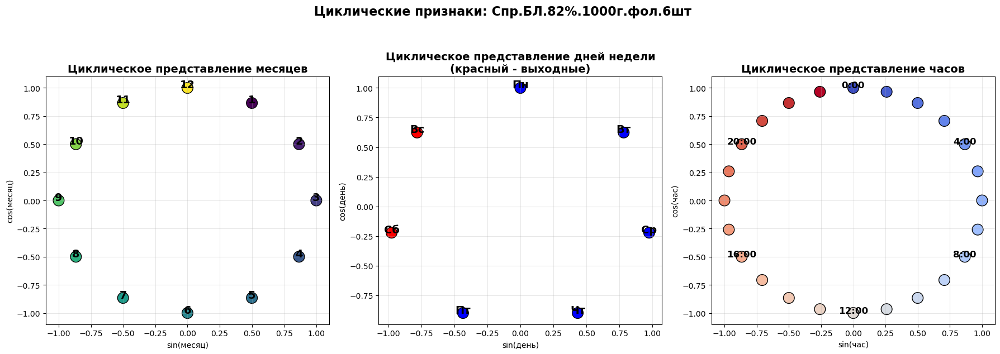


 Сохраняем в Minio: sales-analytics/Спр.БЛ.82_.1000г.фол.6шт
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.БЛ.82_.1000г.фол.6шт/циклические_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Первые 10 строк лаговых признаков:
                 Дата  Количество  Количество_лаг_1час  Количество_лаг_3час  Количество_лаг_6час  Количество_лаг_12час  Количество_лаг_24час  Количество_лаг_168час  Количество_среднее_3ч  Количество_среднее_6ч  Количество_среднее_12ч  Количество_среднее_24ч
0 2025-03-13 09:00:00       816.0                  NaN                  NaN                  NaN                   NaN                   NaN                    NaN                    NaN                    NaN                     NaN                     NaN
1 2025-03-13 10:00:00      1632.0                816.0                  NaN                  NaN                   NaN                   NaN                    NaN                  816.0                  816.0              816.000000      

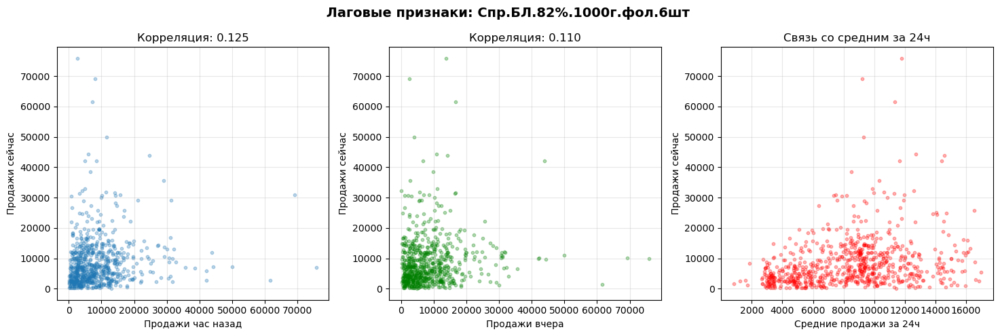


 Сохраняем в Minio: sales-analytics/Спр.БЛ.82_.1000г.фол.6шт
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.БЛ.82_.1000г.фол.6шт/лаговые_признаки_20260313.pdf
    Всего сохранено: 1 объектов

 Пропуски в лаговых признаках (%):
   Количество_лаг_1час: 0.14% пропусков
   Количество_лаг_3час: 0.41% пропусков
   Количество_лаг_6час: 0.82% пропусков
   Количество_лаг_12час: 1.63% пропусков
   Количество_лаг_24час: 3.26% пропусков
   Количество_лаг_168час: 22.83% пропусков

 Статистика признаков по организациям:
       org_mean_sales  org_std_sales
count    7.360000e+02   7.360000e+02
mean     8.490652e+03   8.161032e+03
std      3.458430e-11   8.282030e-11
min      8.490652e+03   8.161032e+03
25%      8.490652e+03   8.161032e+03
50%      8.490652e+03   8.161032e+03
75%      8.490652e+03   8.161032e+03
max      8.490652e+03   8.161032e+03

 Статистика признаков по контрагентам:
       kontr_mean_sales  kontr_std_sales
count        736.000000       736.000000
mean        8490.652

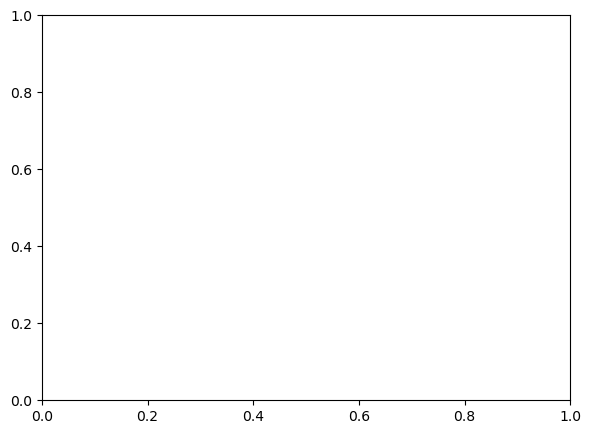

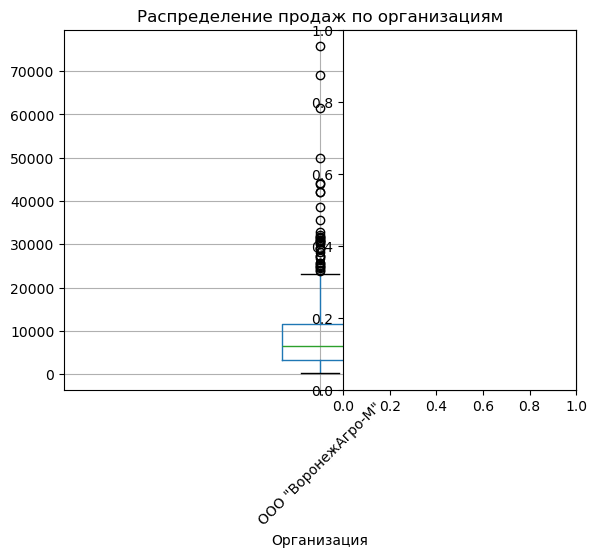

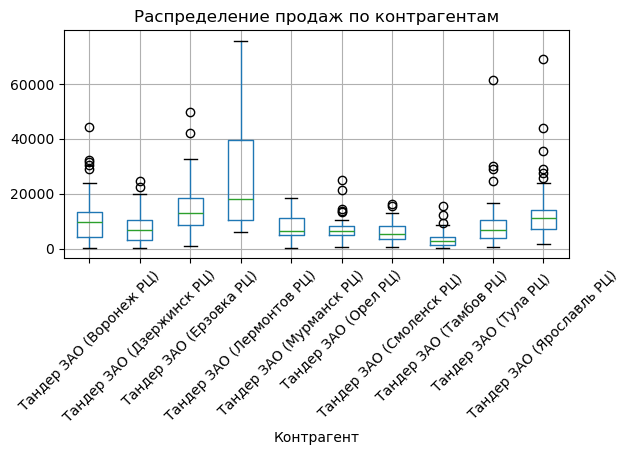


 Сохраняем в Minio: sales-analytics/Спр.БЛ.82_.1000г.фол.6шт
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Спр.БЛ.82_.1000г.фол.6шт/организации_контрагенты_распределение_20260313.pdf
    Всего сохранено: 1 объектов

 ИТОГОВАЯ СТАТИСТИКА ДЛЯ Спр.БЛ.82%.1000г.фол.6шт:
   Всего записей (часов): 736
   Всего признаков: 45
   Период: с 2025-03-13 09:00:00 по 2026-03-12 19:00:00
   Организаций: 1
   Контрагентов: 14


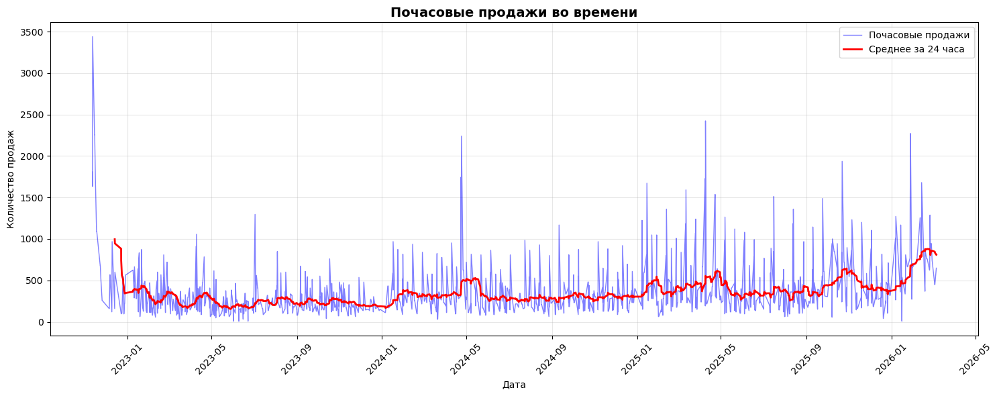


 Сохраняем в Minio: sales-analytics/Пр.из творога 365 дней 24проц 500г пакет 8шт
 PDF: http://localhost:9003/sales-analytics/2026-03-10/Пр.из творога 365 дней 24проц 500г пакет 8шт/Суммарные продажи по часам_20260310.pdf
    Всего сохранено: 1 объектов


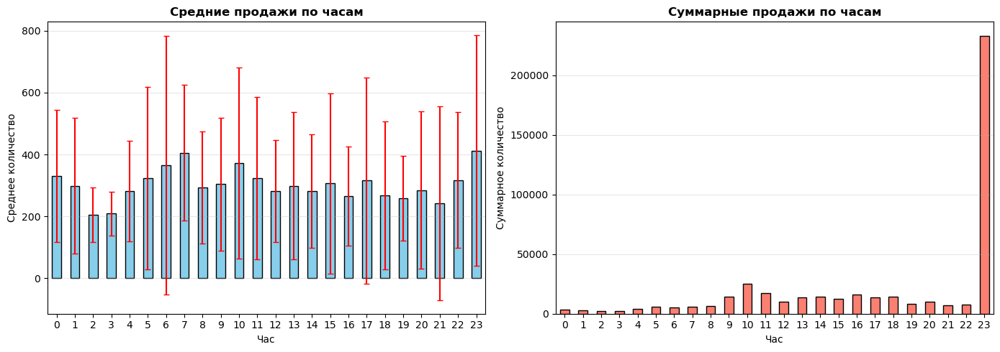

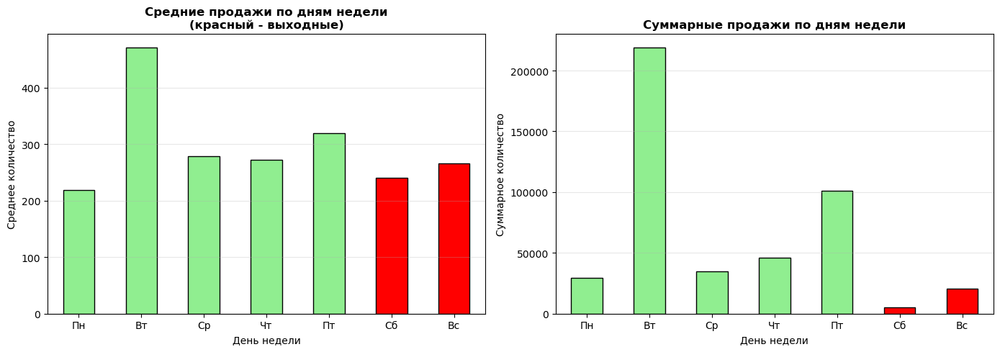


 Сохраняем в Minio: sales-analytics/Пр.из творога 365 дней 24проц 500г пакет 8шт
 PDF: http://localhost:9003/sales-analytics/2026-03-10/Пр.из творога 365 дней 24проц 500г пакет 8шт/Суммарные продажи по месяцам_20260310.pdf
    Всего сохранено: 1 объектов


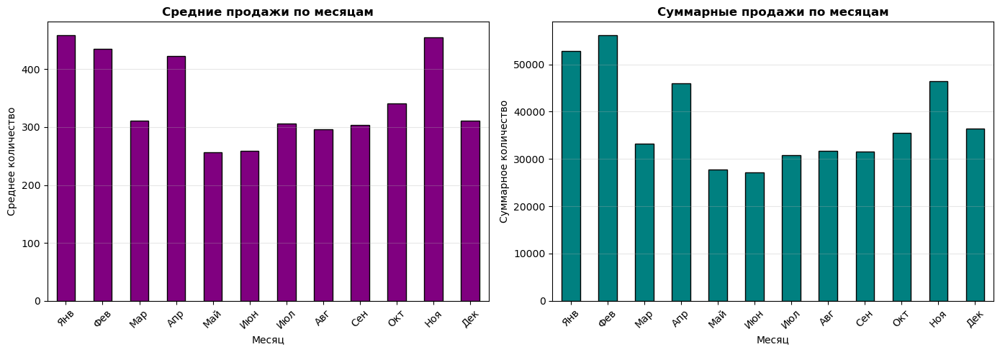


 Сохраняем в Minio: sales-analytics/Пр.из творога 365 дней 24проц 500г пакет 8шт
 PDF: http://localhost:9003/sales-analytics/2026-03-10/Пр.из творога 365 дней 24проц 500г пакет 8шт/Корреляция между признаками_20260310.pdf
    Всего сохранено: 1 объектов


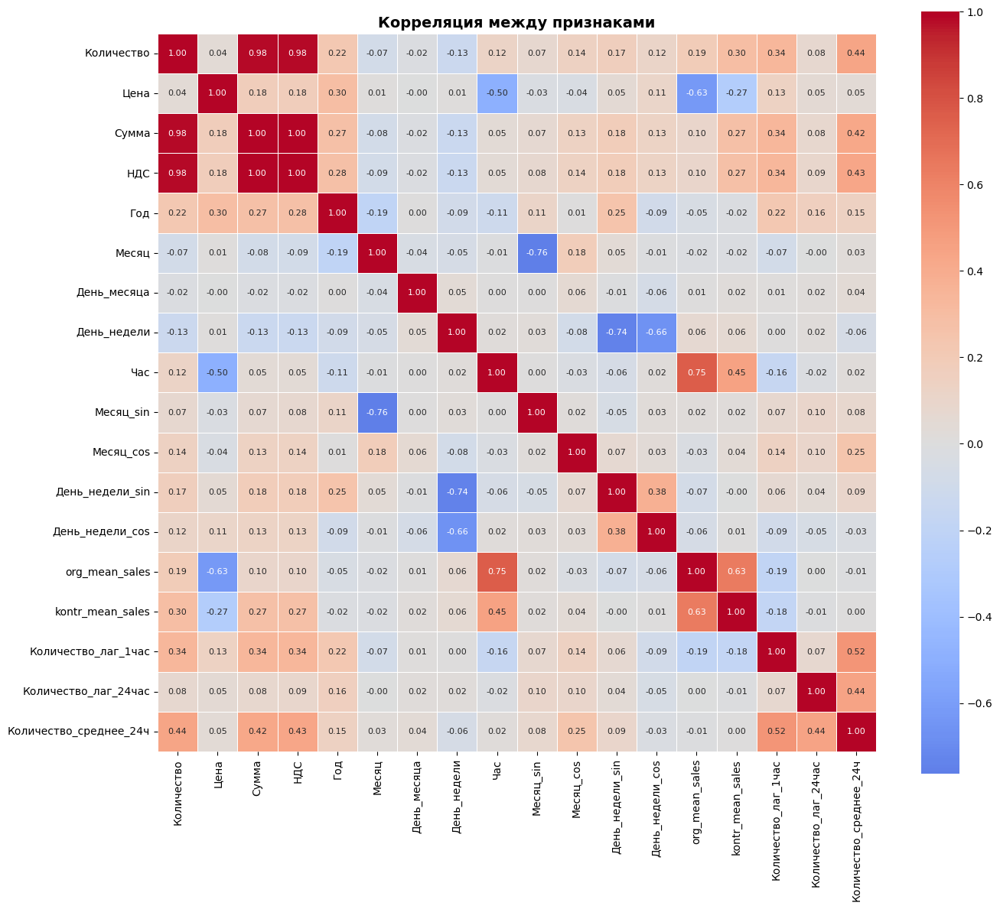


 Сохраняем в Minio: sales-analytics/Пр.из творога 365 дней 24проц 500г пакет 8шт
 PDF: http://localhost:9003/sales-analytics/2026-03-10/Пр.из творога 365 дней 24проц 500г пакет 8шт/Средние продажи по организациям_20260310.pdf
    Всего сохранено: 1 объектов


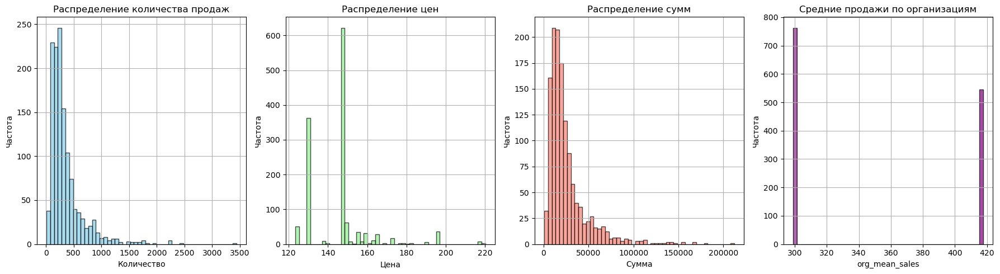


 Сохраняем в Minio: sales-analytics/Пр.из творога 365 дней 24проц 500г пакет 8шт
 PDF: http://localhost:9003/sales-analytics/2026-03-10/Пр.из творога 365 дней 24проц 500г пакет 8шт/Распределение продаж по часам (box plot, без 1_ выбросов)_20260310.pdf
    Всего сохранено: 1 объектов


<Figure size 1500x600 with 0 Axes>

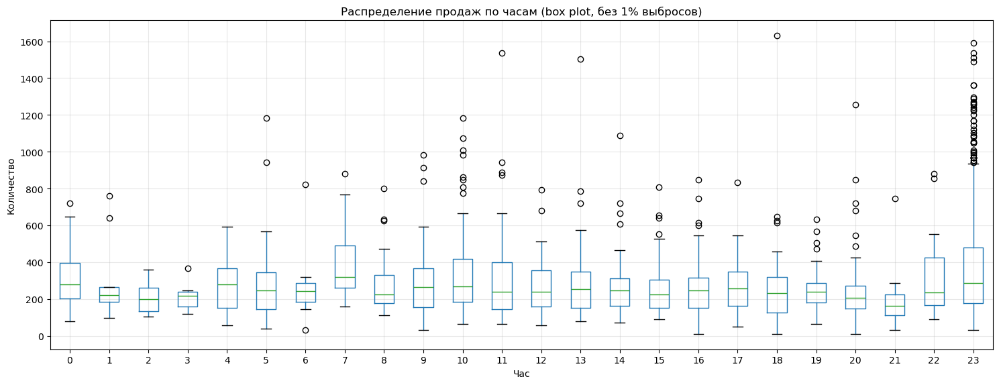

<Figure size 1400x1200 with 0 Axes>

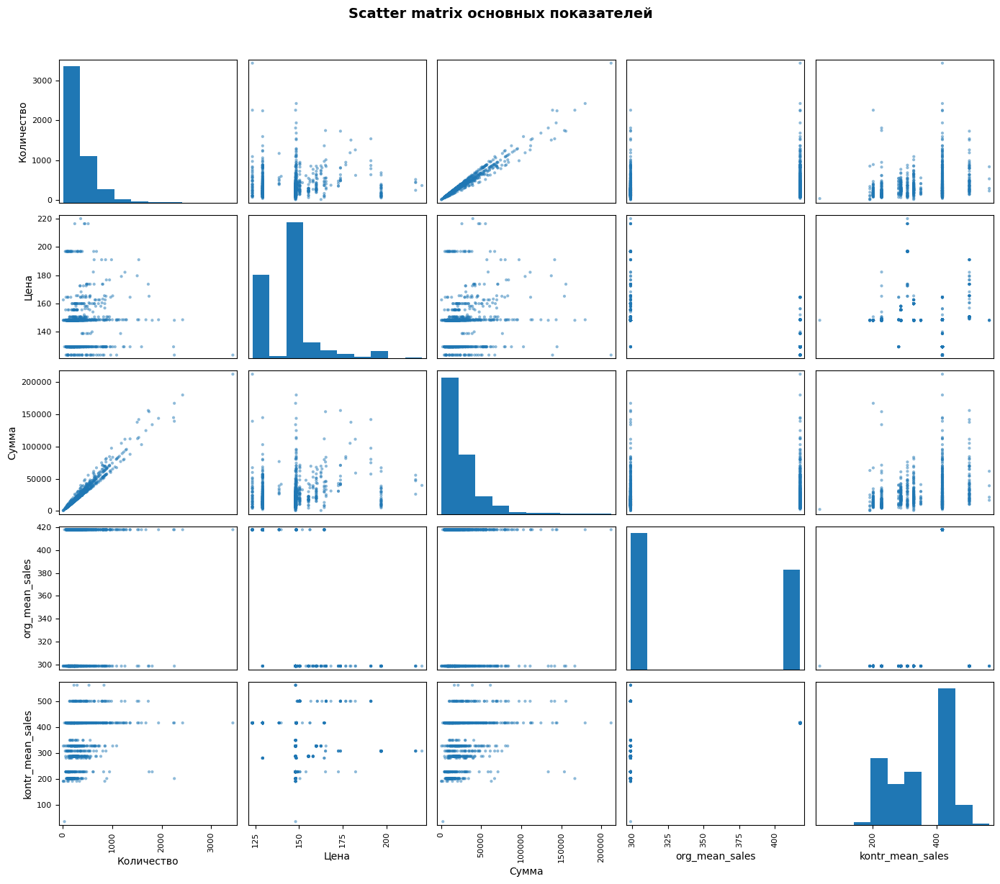


 Сохраняем в Minio: sales-analytics/Пр.из творога 365 дней 24проц 500г пакет 8шт
 PDF: http://localhost:9003/sales-analytics/2026-03-10/Пр.из творога 365 дней 24проц 500г пакет 8шт/Средние продажи по организациям (топ-10)_20260310.pdf
    Всего сохранено: 1 объектов


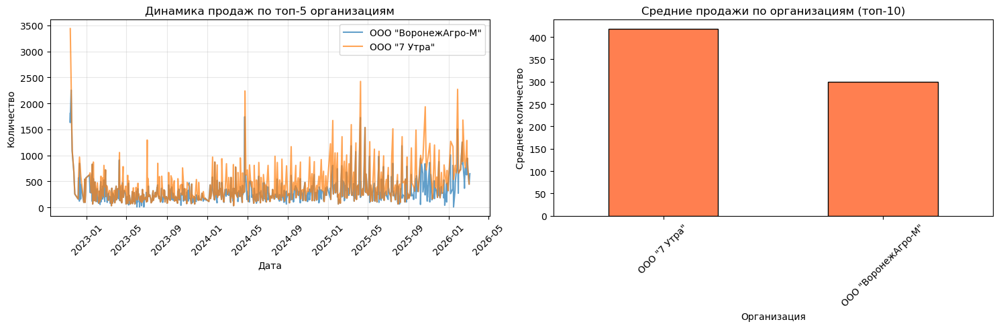


 Сохраняем в Minio: sales-analytics/Пр.из творога 365 дней 24проц 500г пакет 8шт
 PDF: http://localhost:9003/sales-analytics/2026-03-10/Пр.из творога 365 дней 24проц 500г пакет 8шт/Тепловая карта_ продажи по дням недели × месяцам_20260310.pdf
    Всего сохранено: 1 объектов


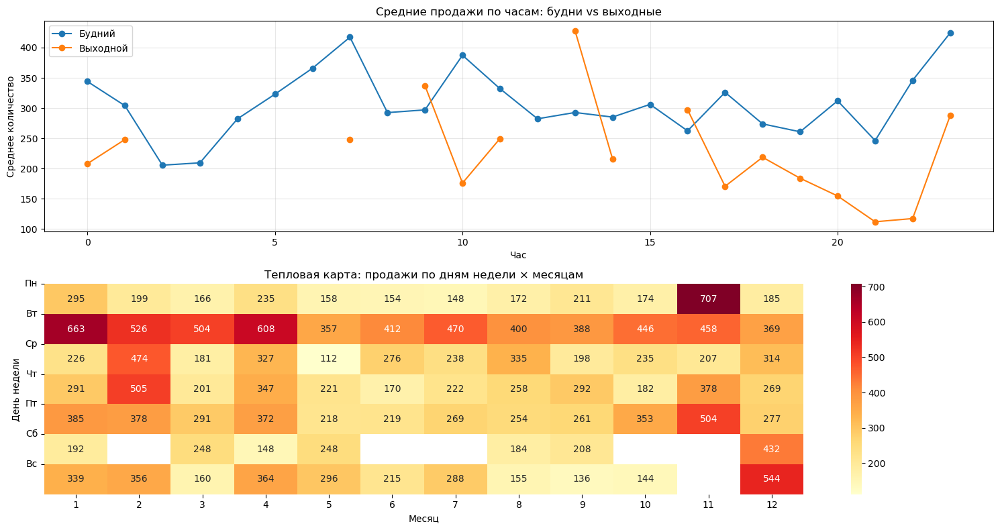


Визуализация завершена!
 Train сохранен: datasets/данные_с_признаками/train_test_split/train_20260310_134233.parquet
 Test сохранен: datasets/данные_с_признаками/train_test_split/test_20260310_134233.parquet
 Метаданные сохранены: datasets/данные_с_признаками/train_test_split/split_info_20260310_134233.json


In [55]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Агрегируем по дням
daily_sales = df_product.groupby(df_product['Дата'].dt.date)['Количество'].sum()
daily_sales.index = pd.to_datetime(daily_sales.index)

print(f" Ежедневные продажи: {len(daily_sales)} дней")

if len(daily_sales) >= 14:  # минимум 2 недели
    # Декомпозиция только на 7 дней
    decomposition = seasonal_decompose(daily_sales, model='additive', period=7)
    
    # Визуализация
    fig = decomposition.plot()
    fig.set_size_inches(15, 10)
    plt.suptitle(f'Сезонность (недельная) для {product_name[:50]}', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    # Анализ
    print(f"\n Анализ сезонности:")
    print(f"   Тренд: {decomposition.trend.min():.0f} - {decomposition.trend.max():.0f}")
    print(f"   Сезонность: {decomposition.seasonal.min():.0f} - {decomposition.seasonal.max():.0f}")
    
    # Сохраняем
    save_to_minio(
        bucket_name="sales-analytics",
        block_name=clean_name,
        plot_name=f"сезонность_{datetime.now().strftime('%Y%m%d')}",
        data=None,
        fig=plt.gcf(),
        formats=['pdf']
    )
else:
    print(" Недостаточно данных для декомпозиции (нужно минимум 14 дней)")

 Ежедневные продажи: 10 дней
 Недостаточно данных для декомпозиции (нужно минимум 14 дней)


In [56]:
# ============================================
# ПРОВЕРКА И ДОБАВЛЕНИЕ ПРИЗНАКОВ (ЕСЛИ НУЖНО)
# ============================================

print(f" Анализ признаков для {product_name[:50]}")
print(f"   Всего колонок: {len(df_product.columns)}")

# 1. Удаляем дубликаты колонок (на всякий случай)
df_product = df_product.loc[:, ~df_product.columns.duplicated()]
print(f"   После удаления дубликатов: {len(df_product.columns)}")

# 2. Проверяем, какие признаки уже есть
existing_features = {
    'org_mean_sales': 'org_mean_sales' in df_product.columns,
    'org_std_sales': 'org_std_sales' in df_product.columns,
    'kontr_mean_sales': 'kontr_mean_sales' in df_product.columns,
    'kontr_std_sales': 'kontr_std_sales' in df_product.columns,
    'тип_опт': 'тип_опт' in df_product.columns,
    'тип_розница': 'тип_розница' in df_product.columns,
    'тип_мелкая_розница': 'тип_мелкая_розница' in df_product.columns
}

print("\n Проверка наличия признаков:")
for feat, exists in existing_features.items():
    print(f"   {feat}: {' есть' if exists else ' нет'}")

# 3. Добавляем недостающие признаки по организациям
if not existing_features['org_mean_sales'] and 'Организация' in df_product.columns:
    print("\n Добавляем признаки по организациям...")
    org_stats = df_product.groupby('Организация')['Количество'].agg(['mean', 'std']).fillna(0)
    org_stats_dict = org_stats.to_dict('index')
    
    df_product['org_mean_sales'] = df_product['Организация'].map(lambda x: org_stats_dict.get(x, {}).get('mean', 0))
    df_product['org_std_sales'] = df_product['Организация'].map(lambda x: org_stats_dict.get(x, {}).get('std', 0))
    print("    Добавлены org_mean_sales, org_std_sales")

# 4. Добавляем недостающие признаки по контрагентам
if not existing_features['kontr_mean_sales'] and 'Контрагент' in df_product.columns:
    print("\n Добавляем признаки по контрагентам...")
    kontr_stats = df_product.groupby('Контрагент')['Количество'].agg(['mean', 'std']).fillna(0)
    kontr_stats_dict = kontr_stats.to_dict('index')
    
    df_product['kontr_mean_sales'] = df_product['Контрагент'].map(lambda x: kontr_stats_dict.get(x, {}).get('mean', 0))
    df_product['kontr_std_sales'] = df_product['Контрагент'].map(lambda x: kontr_stats_dict.get(x, {}).get('std', 0))
    print("    Добавлены kontr_mean_sales, kontr_std_sales")

# 5. Добавляем типы продаж (если нет)
if not any([existing_features['тип_опт'], existing_features['тип_розница'], existing_features['тип_мелкая_розница']]):
    print("\n Добавляем типы продаж...")
    
    # Используем квантили для определения границ
    q33 = df_product['Количество'].quantile(0.33)
    q67 = df_product['Количество'].quantile(0.67)
    
    df_product['тип_продажи'] = df_product['Количество'].apply(
        lambda x: 'крупные' if x > q67 else ('средние' if x > q33 else 'мелкие')
    )
    
    df_product = pd.get_dummies(df_product, columns=['тип_продажи'], prefix='тип')
    print(f"    Добавлены типы продаж на основе квантилей")

# 6. ИТОГ
print(f"\n ГОТОВО! Всего признаков: {len(df_product.columns)}")
print(f"   Размер: {df_product.shape}")

# 7. Проверка важных признаков
important_features = [
    'org_mean_sales', 'org_std_sales',
    'kontr_mean_sales', 'kontr_std_sales',
    'Количество_лаг_1час', 'Количество_лаг_24час', 'Количество_среднее_24ч',
    'Месяц_sin', 'Месяц_cos', 'Час_sin', 'Час_cos'
]

print("\n Проверка важных признаков:")
for feat in important_features:
    if feat in df_product.columns:
        non_null = df_product[feat].notna().sum()
        print(f"   {feat:25} : {non_null:5}/{len(df_product)} ({non_null/len(df_product)*100:5.1f}%)")

 Анализ признаков для Спр.БЛ.82%.1000г.фол.6шт
   Всего колонок: 41
   После удаления дубликатов: 41

 Проверка наличия признаков:
   org_mean_sales:  нет
   org_std_sales:  нет
   kontr_mean_sales:  нет
   kontr_std_sales:  нет
   тип_опт:  нет
   тип_розница:  нет
   тип_мелкая_розница:  нет

 Добавляем признаки по организациям...
    Добавлены org_mean_sales, org_std_sales

 Добавляем признаки по контрагентам...
    Добавлены kontr_mean_sales, kontr_std_sales

 Добавляем типы продаж...
    Добавлены типы продаж на основе квантилей

 ГОТОВО! Всего признаков: 47
   Размер: (10, 47)

 Проверка важных признаков:
   org_mean_sales            :    10/10 (100.0%)
   org_std_sales             :    10/10 (100.0%)
   kontr_mean_sales          :    10/10 (100.0%)
   kontr_std_sales           :    10/10 (100.0%)
   Месяц_sin                 :    10/10 (100.0%)
   Месяц_cos                 :    10/10 (100.0%)
   Час_sin                   :    10/10 (100.0%)
   Час_cos                   :    10/1

In [62]:
#функция версионирвоаиня, добавим после наполнениявсех признаков
import json
import pickle
from datetime import datetime, timedelta
import pandas as pd
import numpy as np
from minio import Minio
from io import BytesIO
import re

def save_datasets_to_minio(
    train_df, 
    test_df=None, 
    product_name=None,
    bucket_name="ml-datasets",
    version=None,
    split_info=None
):
    """
    Сохраняет train/test датасеты в Minio
    """
    # Проверяем тип данных
    if not isinstance(train_df, pd.DataFrame):
        print(f" Ошибка: train_df должен быть DataFrame, а это {type(train_df)}")
        return
    
    print(f"\n Сохраняем датасет для {product_name}")
    print(f"   train: {train_df.shape}, test: {test_df.shape if test_df is not None else 'None'}")
    
    # Подключение к Minio
    client = Minio(
        endpoint="host.docker.internal:9002",
        access_key="minioadmin",
        secret_key="minioadmin",
        secure=False
    )
    
    # Создаем бакет если нет
    if not client.bucket_exists(bucket_name):
        client.make_bucket(bucket_name)
        print(f" Создан бакет: {bucket_name}")
    
    # Очищаем имя продукта для пути
    clean_name = re.sub(r'[<>:"/\\|?*%\'"]', '_', product_name)
    clean_name = clean_name[:50]
    
    # Формируем версию
    if version is None:
        version = datetime.now().strftime('%Y%m%d_%H%M%S')
    
    # Базовый путь
    base_path = f"datasets/{clean_name}/train_test_split"
    
    saved_files = []
    
    # 1. Сохраняем train
    try:
        train_buffer = BytesIO()
        train_df.to_parquet(train_buffer, index=False)
        train_buffer.seek(0)
        
        train_path = f"{base_path}/train_{version}.parquet"
        client.put_object(
            bucket_name,
            train_path,
            data=train_buffer,
            length=train_buffer.getbuffer().nbytes,
            content_type='application/parquet'
        )
        saved_files.append(f"{bucket_name}/{train_path}")
        print(f" Train сохранен: {train_path}")
    except Exception as e:
        print(f" Ошибка при сохранении train: {e}")
        # Пробуем сохранить как csv
        train_buffer = BytesIO()
        train_df.to_csv(train_buffer, index=False)
        train_buffer.seek(0)
        train_path = f"{base_path}/train_{version}.csv"
        client.put_object(
            bucket_name,
            train_path,
            data=train_buffer,
            length=train_buffer.getbuffer().nbytes,
            content_type='text/csv'
        )
        print(f" Train сохранен как CSV: {train_path}")
    
    # 2. Сохраняем test (аналогично)
    if test_df is not None:
        try:
            test_buffer = BytesIO()
            test_df.to_parquet(test_buffer, index=False)
            test_buffer.seek(0)
            
            test_path = f"{base_path}/test_{version}.parquet"
            client.put_object(
                bucket_name,
                test_path,
                data=test_buffer,
                length=test_buffer.getbuffer().nbytes,
                content_type='application/parquet'
            )
            saved_files.append(f"{bucket_name}/{test_path}")
            print(f" Test сохранен: {test_path}")
        except Exception as e:
            print(f" Ошибка при сохранении test: {e}")
            test_buffer = BytesIO()
            test_df.to_csv(test_buffer, index=False)
            test_buffer.seek(0)
            test_path = f"{base_path}/test_{version}.csv"
            client.put_object(
                bucket_name,
                test_path,
                data=test_buffer,
                length=test_buffer.getbuffer().nbytes,
                content_type='text/csv'
            )
            print(f" Test сохранен как CSV: {test_path}")
    
    # 3. Сохраняем метаданные
    if split_info is None:
        split_info = {
            'product': product_name,
            'version': version,
            'train_size': len(train_df),
            'test_size': len(test_df) if test_df is not None else 0,
            'train_period': {
                'start': str(train_df['Дата'].min()) if 'Дата' in train_df.columns else 'unknown',
                'end': str(train_df['Дата'].max()) if 'Дата' in train_df.columns else 'unknown'
            },
            'test_period': {
                'start': str(test_df['Дата'].min()) if test_df is not None and 'Дата' in test_df.columns else 'unknown',
                'end': str(test_df['Дата'].max()) if test_df is not None and 'Дата' in test_df.columns else 'unknown'
            },
            'features': list(train_df.columns),
            'created_at': datetime.now().isoformat()
        }
    
    meta_buffer = BytesIO()
    meta_buffer.write(json.dumps(split_info, indent=2, ensure_ascii=False).encode())
    meta_buffer.seek(0)
    
    meta_path = f"{base_path}/split_info_{version}.json"
    client.put_object(
        bucket_name,
        meta_path,
        data=meta_buffer,
        length=meta_buffer.getbuffer().nbytes,
        content_type='application/json'
    )
    print(f" Метаданные сохранены: {meta_path}")
    
    return {
        'train_path': train_path,
        'test_path': test_path if test_df is not None else None,
        'meta_path': meta_path,
        'version': version,
        'bucket': bucket_name,
        'files': saved_files
    }


def load_datasets_from_minio(
    bucket_name="ml-datasets",
    product_name=None,
    version=None,
    latest=True
):
    """
    Загружает датасеты из Minio
    
    Если latest=True, берет последнюю версию
    Иначе нужно указать version
    """
    
    client = Minio(
        endpoint="host.docker.internal:9002",
        access_key="minioadmin",
        secret_key="minioadmin",
        secure=False
    )
    
    clean_name = re.sub(r'[<>:"/\\|?*%\'"]', '_', product_name)
    clean_name = clean_name[:50]
    
    base_path = f"datasets/{clean_name}/train_test_split"
    
    if latest:
        # Находим последнюю версию
        objects = list(client.list_objects(bucket_name, prefix=base_path, recursive=True))
        versions = set()
        for obj in objects:
            if 'train_' in obj.object_name:
                ver = obj.object_name.split('train_')[-1].split('.parquet')[0]
                versions.add(ver)
        
        if not versions:
            raise ValueError(f"Нет датасетов для продукта {product_name}")
        
        version = sorted(versions)[-1]
        print(f"Загружаем последнюю версию: {version}")
    
    # Загружаем train
    train_path = f"{base_path}/train_{version}.parquet"
    train_response = client.get_object(bucket_name, train_path)
    train_df = pd.read_parquet(BytesIO(train_response.read()))
    
    # Загружаем test
    test_path = f"{base_path}/test_{version}.parquet"
    test_response = client.get_object(bucket_name, test_path)
    test_df = pd.read_parquet(BytesIO(test_response.read()))
    
    # Загружаем метаданные
    meta_path = f"{base_path}/split_info_{version}.json"
    try:
        meta_response = client.get_object(bucket_name, meta_path)
        meta_info = json.loads(meta_response.read().decode())
    except:
        meta_info = None
    
    print(f" Загружено: train={len(train_df)}, test={len(test_df)}")
    return train_df, test_df, meta_info


def save_features_to_minio(
    X_train, X_test, y_train, y_test,
    feature_names,
    product_name,
    version=None
):
    """
    Сохраняет признаки и целевые переменные для модели
    """
    
    client = Minio(
        endpoint="host.docker.internal:9002",
        access_key="minioadmin",
        secret_key="minioadmin",
        secure=False
    )
    
    bucket_name = "ml-datasets"
    clean_name = re.sub(r'[<>:"/\\|?*%\'"]', '_', product_name)
    clean_name = clean_name[:50]
    
    if version is None:
        version = datetime.now().strftime('%Y%m%d_%H%M%S')
    
    base_path = f"features/{clean_name}/{version}"
    
    # Сохраняем признаки
    features_dict = {
        'X_train': X_train,
        'X_test': X_test,
        'y_train': y_train,
        'y_test': y_test,
        'feature_names': feature_names
    }
    
    for name, data in features_dict.items():
        buffer = BytesIO()
        
        # Обрабатываем разные типы данных
        if isinstance(data, pd.DataFrame):
            data.to_parquet(buffer, index=False)
        elif isinstance(data, pd.Series):
            # Преобразуем Series в DataFrame
            pd.DataFrame({name: data}).to_parquet(buffer, index=False)
        elif isinstance(data, np.ndarray):
            # Преобразуем numpy array в DataFrame
            if data.ndim == 1:
                pd.DataFrame({name: data}).to_parquet(buffer, index=False)
            else:
                pd.DataFrame(data).to_parquet(buffer, index=False)
        else:
            # для списков и простых типов
            buffer.write(json.dumps(data, ensure_ascii=False).encode())
            buffer.seek(0)
            client.put_object(
                bucket_name,
                f"{base_path}/{name}.json",
                data=buffer,
                length=buffer.getbuffer().nbytes,
                content_type='application/json'
            )
            continue
        
        buffer.seek(0)
        client.put_object(
            bucket_name,
            f"{base_path}/{name}.parquet",
            data=buffer,
            length=buffer.getbuffer().nbytes,
            content_type='application/parquet'
        )
        print(f" {name}.parquet сохранен")
    
    print(f" Все признаки сохранены: {base_path}")
    return base_path

In [63]:
 for product_name in products_list:
    print(f"\n{'='*70}")
    print(f"🔍 ОБРАБОТКА: {product_name[:70]}")
    print('='*70)
    
    # 1. Получаем данные для товара
    df_product = full_df_enriched[full_df_enriched['Номенклатура'] == product_name].copy()
    
    # 2. Добавляем временные признаки (лаги, скользящие средние)
    df_product = create_time_features(df_product)  # или ваша функция
    
    # 3. Добавляем признаки по организациям/контрагентам (если нужно)
    # ... ваш код добавления признаков ...
    
    # 4. Визуализация (опционально)
    # ... ваши графики ...
    
    # 5. ПОДГОТОВКА ДЛЯ МОДЕЛИ
    # Сохраняем даты для разделения
    dates_for_split = df_product['Дата'].copy()
    
    # Удаляем нечисловые колонки
    non_numeric_cols = ['Час_начало', 'Тип_дня', 'Организация', 'Контрагент']
    existing_non_numeric = [col for col in non_numeric_cols if col in df_product.columns]
    df_product_clean = df_product.drop(columns=existing_non_numeric)
    
    # Разделяем по дате
    cutoff_date = datetime.now().date() - timedelta(days=30)
    train_mask = dates_for_split.dt.date < cutoff_date
    test_mask = dates_for_split.dt.date >= cutoff_date
    
    # Удаляем дату из признаков
    df_product_clean = df_product_clean.drop('Дата', axis=1)
    
    # Создаем признаки
    target = 'Количество'
    feature_columns = [col for col in df_product_clean.columns if col != target]
    
    # Разделяем данные
    train_data = df_product_clean[train_mask].copy()
    test_data = df_product_clean[test_mask].copy()
    
    X_train = train_data[feature_columns]
    y_train = train_data[target]
    X_test = test_data[feature_columns]
    y_test = test_data[target]
    
    print(f"\n Данные для модели:")
    print(f"   X_train: {X_train.shape}, y_train: {y_train.shape}")
    print(f"   X_test: {X_test.shape}, y_test: {y_test.shape}")
    
    # 6. СОХРАНЯЕМ В MINIO (ВЕРСИОНИРОВАНИЕ)
    save_datasets_to_minio(
        train_df=train_data,
        test_df=test_data,
        product_name=clean_name,
        split_info={
            'description': f'Датасет с признаками для {product_name[:50]}',
            'cutoff_date': str(cutoff_date),
            'feature_count': len(feature_columns),
            'target': target,
            'train_size': len(train_data),
            'test_size': len(test_data)
        }
    )
    
    # 7. (Опционально) Сохраняем X/y отдельно
    save_features_to_minio(
        X_train=X_train,
        X_test=X_test,
        y_train=y_train,
        y_test=y_test,
        feature_names=feature_columns,
        product_name=clean_name
    )
    
    print(f"\nТовар обработан и сохранен в Minio")
    print('='*70)


🔍 ОБРАБОТКА: Мас.Тандер.72,5%.180г.фол.12шт

 Данные для модели:
   X_train: (833, 36), y_train: (833,)
   X_test: (94, 36), y_test: (94,)

 Сохраняем датасет для Спр.БЛ.82_.1000г.фол.6шт
   train: (833, 37), test: (94, 37)
 Train сохранен: datasets/Спр.БЛ.82_.1000г.фол.6шт/train_test_split/train_20260313_102758.parquet
 Test сохранен: datasets/Спр.БЛ.82_.1000г.фол.6шт/train_test_split/test_20260313_102758.parquet
 Метаданные сохранены: datasets/Спр.БЛ.82_.1000г.фол.6шт/train_test_split/split_info_20260313_102758.json
 X_train.parquet сохранен
 X_test.parquet сохранен
 y_train.parquet сохранен
 y_test.parquet сохранен
 Все признаки сохранены: features/Спр.БЛ.82_.1000г.фол.6шт/20260313_102759

Товар обработан и сохранен в Minio

🔍 ОБРАБОТКА: Мас.КУ.82,5%.20кг.полиэт.

 Данные для модели:
   X_train: (11, 36), y_train: (11,)
   X_test: (0, 36), y_test: (0,)

 Сохраняем датасет для Спр.БЛ.82_.1000г.фол.6шт
   train: (11, 37), test: (0, 37)
 Train сохранен: datasets/Спр.БЛ.82_.1000г.фол.6

In [68]:
import numpy as np
import pandas as pd

def create_time_features(df):
    """Добавляет циклические временные признаки"""
    df = df.copy()
    
    # Базовые временные признаки
    df['Год'] = df['Дата'].dt.year
    df['Месяц'] = df['Дата'].dt.month
    df['День_месяца'] = df['Дата'].dt.day
    df['День_недели'] = df['Дата'].dt.dayofweek
    df['Час'] = df['Дата'].dt.hour
    df['Неделя_года'] = df['Дата'].dt.isocalendar().week
    
    # Циклические признаки
    df['Месяц_sin'] = np.sin(2 * np.pi * df['Месяц'] / 12)
    df['Месяц_cos'] = np.cos(2 * np.pi * df['Месяц'] / 12)
    df['День_недели_sin'] = np.sin(2 * np.pi * df['День_недели'] / 7)
    df['День_недели_cos'] = np.cos(2 * np.pi * df['День_недели'] / 7)
    df['Час_sin'] = np.sin(2 * np.pi * df['Час'] / 24)
    df['Час_cos'] = np.cos(2 * np.pi * df['Час'] / 24)
    
    # Бинарные флаги
    df['Выходной'] = df['День_недели'].isin([5, 6]).astype(int)
    
    return df

def create_lag_features(df):
    """Добавляет лаговые признаки и скользящие средние"""
    df = df.copy()
    df = df.sort_values('Дата')
    
    # Лаги по часам
    df['Количество_лаг_1час'] = df['Количество'].shift(1)
    df['Количество_лаг_3час'] = df['Количество'].shift(3)
    df['Количество_лаг_6час'] = df['Количество'].shift(6)
    df['Количество_лаг_12час'] = df['Количество'].shift(12)
    df['Количество_лаг_24час'] = df['Количество'].shift(24)
    df['Количество_лаг_168час'] = df['Количество'].shift(168)
    
    # Скользящие средние
    df['Количество_среднее_3ч'] = df['Количество'].rolling(window=3, min_periods=1).mean().shift(1)
    df['Количество_среднее_6ч'] = df['Количество'].rolling(window=6, min_periods=1).mean().shift(1)
    df['Количество_среднее_12ч'] = df['Количество'].rolling(window=12, min_periods=1).mean().shift(1)
    df['Количество_среднее_24ч'] = df['Количество'].rolling(window=24, min_periods=1).mean().shift(1)
    
    return df

def create_org_features(df):
    """Добавляет признаки по организациям и контрагентам"""
    df = df.copy()
    
    # Признаки по организациям
    if 'Организация' in df.columns:
        org_stats = df.groupby('Организация')['Количество'].agg(['mean', 'std']).fillna(0)
        org_stats_dict = org_stats.to_dict('index')
        
        df['org_mean_sales'] = df['Организация'].map(lambda x: org_stats_dict.get(x, {}).get('mean', 0))
        df['org_std_sales'] = df['Организация'].map(lambda x: org_stats_dict.get(x, {}).get('std', 0))
    
    # Признаки по контрагентам
    if 'Контрагент' in df.columns:
        kontr_stats = df.groupby('Контрагент')['Количество'].agg(['mean', 'std']).fillna(0)
        kontr_stats_dict = kontr_stats.to_dict('index')
        
        df['kontr_mean_sales'] = df['Контрагент'].map(lambda x: kontr_stats_dict.get(x, {}).get('mean', 0))
        df['kontr_std_sales'] = df['Контрагент'].map(lambda x: kontr_stats_dict.get(x, {}).get('std', 0))
    
    return df

def create_type_features(df):
    """Добавляет признаки типов продаж"""
    df = df.copy()
    
    # Используем квантили для определения границ
    q33 = df['Количество'].quantile(0.33)
    q67 = df['Количество'].quantile(0.67)
    
    df['тип_продажи'] = df['Количество'].apply(
        lambda x: 'крупные' if x > q67 else ('средние' if x > q33 else 'мелкие')
    )
    
    # Создаем dummy-переменные
    dummies = pd.get_dummies(df['тип_продажи'], prefix='тип')
    df = pd.concat([df, dummies], axis=1)
    df = df.drop('тип_продажи', axis=1)
    
    return df

In [82]:
import xgboost as xgb
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
import joblib
from io import BytesIO
from datetime import datetime, timedelta
import numpy as np
import pandas as pd

# ============================================
# ФУНКЦИЯ ДЛЯ СОЗДАНИЯ ТИПОВ ПРОДАЖ (ОПРЕДЕЛЯЕМ ДО ЦИКЛА!)
# ============================================
def create_type_features(df):
    """
    Создает признаки типов продаж на основе квантилей
    """
    df = df.copy()
    
    # Используем квантили для определения границ
    q33 = df['Количество'].quantile(0.33)
    q67 = df['Количество'].quantile(0.67)
    
    # Создаем категории
    df['тип_продажи'] = df['Количество'].apply(
        lambda x: 'крупные' if x > q67 else ('средние' if x > q33 else 'мелкие')
    )
    
    # Создаем dummy-переменные
    dummies = pd.get_dummies(df['тип_продажи'], prefix='тип')
    
    # Переименовываем для совместимости
    rename_map = {}
    if 'тип_крупные' in dummies.columns:
        rename_map['тип_крупные'] = 'тип_опт'
    if 'тип_средние' in dummies.columns:
        rename_map['тип_средние'] = 'тип_розница'
    if 'тип_мелкие' in dummies.columns:
        rename_map['тип_мелкие'] = 'тип_мелкая_розница'
    
    if rename_map:
        dummies = dummies.rename(columns=rename_map)
    
    # Добавляем к исходному датасету
    df = pd.concat([df, dummies], axis=1)
    df = df.drop('тип_продажи', axis=1)
    
    print(f"   Добавлены типы продаж: {', '.join(dummies.columns)}")
    return df

# ============================================
# ОСНОВНОЙ ЦИКЛ ОБУЧЕНИЯ ПО ВСЕМ ТОВАРАМ
# ============================================
for product_name in products_list:
    print(f"\n{'='*70}")
    print(f" ОБУЧЕНИЕ МОДЕЛИ ДЛЯ: {product_name[:70]}")
    print('='*70)
    
    # 1. Получаем данные для товара
    df_product = full_df_enriched[full_df_enriched['Номенклатура'] == product_name].copy()
    
    if df_product.empty:
        print(f" Нет данных для {product_name[:50]}")
        continue
    
    # 2. Добавляем ВСЕ признаки (ВКЛЮЧАЯ ТИПЫ ПРОДАЖ!)
    df_product = create_time_features(df_product)
    df_product = create_lag_features(df_product)
    df_product = create_org_features(df_product)
    df_product = create_type_features(df_product)  # ← ВОТ ЭТА СТРОКА!
    
    print(f" Исходных записей: {len(df_product)}")
    print(f"   Всего колонок: {len(df_product.columns)}")
    
    # 3. Подготовка данных
    df_product['Дата'] = pd.to_datetime(df_product['Дата'])
    
    # 4. РАЗДЕЛЕНИЕ ПО ВРЕМЕНИ
    cutoff_date = datetime.now().date() - timedelta(days=30)
    
    train_df = df_product[df_product['Дата'].dt.date < cutoff_date].copy()
    test_df = df_product[df_product['Дата'].dt.date >= cutoff_date].copy()
    
    print(f"\n Разделение по времени:")
    print(f"   Дата отсечки: {cutoff_date}")
    print(f"   Train записей: {len(train_df)}")
    print(f"   Test записей: {len(test_df)}")
    
    if len(test_df) < 5:
        print(f" Слишком мало тестовых данных ({len(test_df)}), пропускаем")
        continue
    
    # 5. ОПРЕДЕЛЯЕМ ПРИЗНАКИ
    exclude_cols = ['Номенклатура', 'Дата', 'Час_начало', 'Организация', 'Контрагент', 'город']
    numeric_cols = df_product.select_dtypes(include=['int64', 'float64']).columns.tolist()
    feature_cols = [col for col in numeric_cols if col not in exclude_cols and col != 'Количество']
    
    print(f"\n Признаков: {len(feature_cols)}")
    
    # 6. ПОДГОТОВКА X и y
    X_train = train_df[feature_cols].fillna(train_df[feature_cols].mean())
    y_train = train_df['Количество']
    X_test = test_df[feature_cols].fillna(train_df[feature_cols].mean())
    y_test = test_df['Количество']
    
    print(f"   X_train: {X_train.shape}")
    print(f"   X_test: {X_test.shape}")
    
    # 7. ОСНОВНАЯ МОДЕЛЬ
    print("\n" + "="*60)
    print(" ОБУЧЕНИЕ ОСНОВНОЙ МОДЕЛИ")
    print("="*60)
    
    model_tuned = xgb.XGBRegressor(
        n_estimators=500,
        learning_rate=0.05,
        max_depth=5,
        min_child_weight=3,
        subsample=0.8,
        colsample_bytree=0.8,
        reg_alpha=0.1,
        reg_lambda=0.1,
        random_state=42,
        early_stopping_rounds=50,
        eval_metric='rmse'
    )
    
    model_tuned.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], verbose=False)
    
    y_pred = model_tuned.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred) * 100
    
    print(f"\n Результаты:")
    print(f"   MAE: {mae:.2f}")
    print(f"   MAPE: {mape:.1f}%")
    
    # 8. РАЗДЕЛЬНЫЕ МОДЕЛИ
    if all(col in train_df.columns for col in ['тип_опт', 'тип_розница']):
        print("\n" + "="*60)
        print(" РАЗДЕЛЬНЫЕ МОДЕЛИ")
        print("="*60)
        
        # Опт
        opt_mask = train_df['тип_опт'] == 1
        if opt_mask.sum() > 50 and (test_df['тип_опт'] == 1).sum() > 5:
            X_opt_train = X_train[opt_mask]
            y_opt_train = y_train[opt_mask]
            X_opt_test = X_test[test_df['тип_опт'] == 1]
            y_opt_test = y_test[test_df['тип_опт'] == 1]
            
            model_opt = xgb.XGBRegressor(n_estimators=300, max_depth=4, random_state=42)
            model_opt.fit(X_opt_train, y_opt_train)
            
            y_opt_pred = model_opt.predict(X_opt_test)
            mape_opt = mean_absolute_percentage_error(y_opt_test, y_opt_pred) * 100
            print(f"    Опт: {opt_mask.sum()} записей, MAPE={mape_opt:.1f}%")
        
        # Розница
        roznica_mask = train_df['тип_розница'] == 1
        if roznica_mask.sum() > 50 and (test_df['тип_розница'] == 1).sum() > 5:
            X_roz_train = X_train[roznica_mask]
            y_roz_train = y_train[roznica_mask]
            X_roz_test = X_test[test_df['тип_розница'] == 1]
            y_roz_test = y_test[test_df['тип_розница'] == 1]
            
            model_roz = xgb.XGBRegressor(n_estimators=300, max_depth=4, random_state=42)
            model_roz.fit(X_roz_train, y_roz_train)
            
            y_roz_pred = model_roz.predict(X_roz_test)
            mape_roz = mean_absolute_percentage_error(y_roz_test, y_roz_pred) * 100
            print(f"    Розница: {roznica_mask.sum()} записей, MAPE={mape_roz:.1f}%")
    
    # 9. СОХРАНЕНИЕ
    print("\n" + "="*60)
    print(" СОХРАНЕНИЕ В MINIO")
    print("="*60)
    
    clean_name = re.sub(r'[<>:"/\\|?*%\'"]', '_', product_name)
    clean_name = clean_name[:50]
    
    # Сохраняем модель
    model_buffer = BytesIO()
    joblib.dump(model_tuned, model_buffer)
    model_buffer.seek(0)
    
    client = Minio(
        endpoint="host.docker.internal:9002",
        access_key="minioadmin",
        secret_key="minioadmin",
        secure=False
    )
    
    if not client.bucket_exists("ml-models"):
        client.make_bucket("ml-models")
    
    model_name = f"{clean_name}_{datetime.now().strftime('%Y%m%d_%H%M%S')}.pkl"
    client.put_object("ml-models", model_name, data=model_buffer, 
                      length=model_buffer.getbuffer().nbytes, content_type='application/octet-stream')
    
    # Метаданные
    metadata = {
        'product': product_name,
        'metrics': {'mae': float(mae), 'mape': float(mape)},
        'train_size': len(train_df),
        'test_size': len(test_df),
        'features_count': len(feature_cols)
    }
    
    meta_buffer = BytesIO()
    meta_buffer.write(json.dumps(metadata, indent=2, ensure_ascii=False).encode())
    meta_buffer.seek(0)
    
    meta_name = f"{clean_name}_{datetime.now().strftime('%Y%m%d_%H%M%S')}_meta.json"
    client.put_object("ml-models", meta_name, data=meta_buffer,
                      length=meta_buffer.getbuffer().nbytes, content_type='application/json')
    
    print(f" Модель сохранена: {model_name}")
    print('='*70)


 ОБУЧЕНИЕ МОДЕЛИ ДЛЯ: Мас.Тандер.72,5%.180г.фол.12шт
   Добавлены типы продаж: тип_опт, тип_мелкая_розница, тип_розница
 Исходных записей: 927
   Всего колонок: 59

 Разделение по времени:
   Дата отсечки: 2026-02-11
   Train записей: 833
   Test записей: 94

 Признаков: 40
   X_train: (833, 40)
   X_test: (94, 40)

 ОБУЧЕНИЕ ОСНОВНОЙ МОДЕЛИ

 Результаты:
   MAE: 374.16
   MAPE: 3.0%

 РАЗДЕЛЬНЫЕ МОДЕЛИ
    Опт: 253 записей, MAPE=2.3%
    Розница: 292 записей, MAPE=2.2%

 СОХРАНЕНИЕ В MINIO
 Модель сохранена: Мас.Тандер.72,5_.180г.фол.12шт_20260313_113945.pkl

 ОБУЧЕНИЕ МОДЕЛИ ДЛЯ: Мас.КУ.82,5%.20кг.полиэт.
   Добавлены типы продаж: тип_опт, тип_мелкая_розница, тип_розница
 Исходных записей: 11
   Всего колонок: 59

 Разделение по времени:
   Дата отсечки: 2026-02-11
   Train записей: 11
   Test записей: 0
 Слишком мало тестовых данных (0), пропускаем

 ОБУЧЕНИЕ МОДЕЛИ ДЛЯ: Мас.82,5%.5кг.полиэт.
   Добавлены типы продаж: тип_опт, тип_мелкая_розница, тип_розница
 Исходных записей: 22
 


 ОБУЧЕНИЕ РАЗДЕЛЬНЫХ МОДЕЛЕЙ
Используем 33 числовых признаков

Обучаем модель для ОПТА (233 записей)
   MAPE для опта: 11.0%

Обучаем модель для РОЗНИЦЫ (1063 записей)
   MAPE для розницы: 13.5%


In [70]:
# Проверим, какие признаки реально есть в df_product
print(" Все доступные колонки:")
for col in sorted(df_product.columns):
    if col not in feature_cols and col != 'Количество':
        non_null = df_product[col].notna().sum()
        print(f"   {col:30} : {non_null}/{len(df_product)}")

# Убедимся, что важные признаки включены
important_features = [
    'org_mean_sales', 'org_std_sales',
    'kontr_mean_sales', 'kontr_std_sales',
    'Количество_лаг_1час', 'Количество_лаг_24час',
    'Месяц_sin', 'Месяц_cos', 'Час_sin', 'Час_cos'
]

print("\n Проверка важных признаков:")
for feat in important_features:
    if feat in df_product.columns:
        print(f" {feat} - есть")
    else:
        print(f" {feat} - отсутствует")

 Все доступные колонки:
   month                          : 10/10
   region                         : 0/10
   region_name                    : 0/10
   year                           : 10/10
   Год                            : 10/10
   Дата                           : 10/10
   День_месяца                    : 10/10
   День_недели                    : 10/10
   Контрагент                     : 10/10
   Месяц                          : 10/10
   Неделя_года                    : 10/10
   Номенклатура                   : 10/10
   Организация                    : 10/10
   Час                            : 10/10
   город                          : 10/10

 Проверка важных признаков:
 org_mean_sales - есть
 org_std_sales - есть
 kontr_mean_sales - есть
 kontr_std_sales - есть
 Количество_лаг_1час - есть
 Количество_лаг_24час - есть
 Месяц_sin - есть
 Месяц_cos - есть
 Час_sin - есть
 Час_cos - есть


In [75]:
# 1. Создаем словарь группировки
product_groups = {
    'Масло_сливочное': [
        'Мас.Тандер.72,5%.180г.фол.12шт',
        'Мас.КУ.82,5%.20кг.полиэт.(заморозка)',
        'Мас.КУ.82,5%.20кг.полиэт.',
        'Мас.82,5%.5кг.полиэт.',
        'Мас.КУ.82,5%.20кг.перг.',
        'Мас.КУ.82,5%.20кг.полиэт.(61,5)',
        'Мас.72,5%.10кг.полиэт.$',
        'Мас.82,5%.20 кг.полиэт(01030)'
    ],
    'Спред': [
        'Спр.72%.20кг.полиэт.(40%)(БЭ)',
        'Спр.72%.20кг.перг.(30%)(БЭ)',
        'Спр.БЛ.82%.1000г.фол.6шт'
    ]
}

# 2. Создаем агрегированный датасет
grouped_data = {}
for group_name, products in product_groups.items():
    print(f"\n Группа: {group_name}")
    
    # Собираем все товары группы
    group_df = pd.concat([
        full_df_enriched[full_df_enriched['Номенклатура'] == prod] 
        for prod in products 
        if not full_df_enriched[full_df_enriched['Номенклатура'] == prod].empty
    ])
    
    print(f"   Всего записей: {len(group_df)}")
    grouped_data[group_name] = group_df

# 3. Обучаем модель на группе
for group_name, df_group in grouped_data.items():
    print(f"\n{'='*70}")
    print(f" ОБУЧЕНИЕ ДЛЯ ГРУППЫ: {group_name}")
    print('='*70)
    
    if len(df_group) < 100:
        print(f" Недостаточно данных ({len(df_group)}), пропускаем")
        continue
    
    # Подготовка данных (как в вашем коде, но с df_group вместо df_product)
    df_group = create_time_features(df_group)
    df_group = create_lag_features(df_group)
    df_group = create_org_features(df_group)
    df_group = create_type_features(df_group)
    
    # Разделение по времени
    cutoff_date = datetime.now().date() - timedelta(days=30)
    train_df = df_group[df_group['Дата'].dt.date < cutoff_date].copy()
    test_df = df_group[df_group['Дата'].dt.date >= cutoff_date].copy()
    
    if len(test_df) < 5:
        print(f"⚠ Мало тестовых данных ({len(test_df)}), пропускаем")
        continue
    
    # Определение признаков
    exclude_cols = ['Номенклатура', 'Дата', 'Час_начало', 'Организация', 'Контрагент', 'город']
    numeric_cols = df_group.select_dtypes(include=['int64', 'float64']).columns.tolist()
    feature_cols = [col for col in numeric_cols if col not in exclude_cols and col != 'Количество']
    
    X_train = train_df[feature_cols].fillna(train_df[feature_cols].mean())
    y_train = train_df['Количество']
    X_test = test_df[feature_cols].fillna(train_df[feature_cols].mean())
    y_test = test_df['Количество']
    
    print(f"\n Результаты для группы {group_name}:")
    print(f"   MAE: {mae:.2f}")
    print(f"   MAPE: {mape:.1f}%")
    

    
    # 8. СОХРАНЕНИЕ МОДЕЛИ В MINIO
    print("\n" + "="*60)
    print(" СОХРАНЕНИЕ МОДЕЛИ В MINIO")
    print("="*60)
    

    # При сохранении используем group_name
    clean_name = re.sub(r'[<>:"/\\|?*%\'"]', '_', group_name)   
    clean_name = clean_name[:50]
    
    # Сохраняем модель
    model_buffer = BytesIO()
    joblib.dump(model_tuned, model_buffer)
    model_buffer.seek(0)
    
    client = Minio(
        endpoint="host.docker.internal:9002",
        access_key="minioadmin",
        secret_key="minioadmin",
        secure=False
    )
    
    # Создаем бакет если нет
    if not client.bucket_exists("ml-models"):
        client.make_bucket("ml-models")
    
    # Сохраняем с информативным именем
    model_name = f"{clean_name}_{datetime.now().strftime('%Y%m%d_%H%M%S')}.pkl"
    client.put_object(
        "ml-models",
        model_name,
        data=model_buffer,
        length=model_buffer.getbuffer().nbytes,
        content_type='application/octet-stream'
    )
    
    # Сохраняем метаданные модели
    metadata = {
        'product': product_name,
        'model_type': 'XGBoost',
        'params': {
            'n_estimators': 500,
            'max_depth': 5,
            'learning_rate': 0.05
        },
        'metrics': {
            'mae': float(mae),
            'mape': float(mape)
        },
        'features': feature_cols,
        'train_size': len(train_df),
        'test_size': len(test_df),
        'cutoff_date': str(cutoff_date)
    }
    
    meta_buffer = BytesIO()
    meta_buffer.write(json.dumps(metadata, indent=2, ensure_ascii=False).encode())
    meta_buffer.seek(0)
    
    meta_name = f"{clean_name}_{datetime.now().strftime('%Y%m%d_%H%M%S')}_meta.json"
    client.put_object(
        "ml-models",
        meta_name,
        data=meta_buffer,
        length=meta_buffer.getbuffer().nbytes,
        content_type='application/json'
    )
    
    print(f" Модель сохранена: http://localhost:9003/ml-models/{model_name}")
    print(f" Метаданные: http://localhost:9003/ml-models/{meta_name}")
    
    print(f"\n{'='*70}")
    print(f" ОБУЧЕНИЕ ДЛЯ {product_name[:50]} ЗАВЕРШЕНО")
    print('='*70)


 Группа: Масло_сливочное
   Всего записей: 990

 Группа: Спред
   Всего записей: 16

 ОБУЧЕНИЕ ДЛЯ ГРУППЫ: Масло_сливочное

 Результаты для группы Масло_сливочное:
   MAE: 374.16
   MAPE: 3.0%

 СОХРАНЕНИЕ МОДЕЛИ В MINIO
 Модель сохранена: http://localhost:9003/ml-models/Масло_сливочное_20260313_105424.pkl
 Метаданные: http://localhost:9003/ml-models/Масло_сливочное_20260313_105424_meta.json

 ОБУЧЕНИЕ ДЛЯ Спр.БЛ.82%.1000г.фол.6шт ЗАВЕРШЕНО

 ОБУЧЕНИЕ ДЛЯ ГРУППЫ: Спред
 Недостаточно данных (16), пропускаем


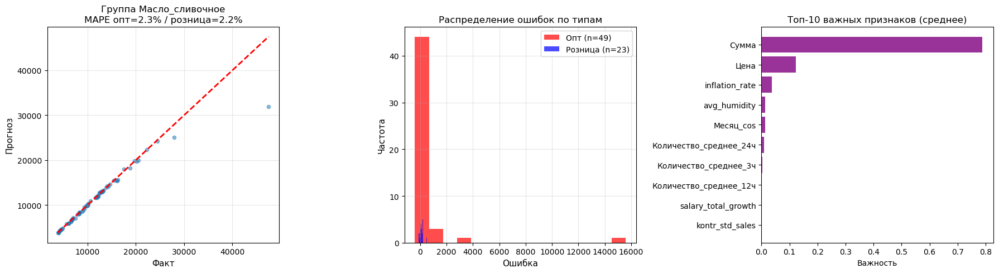


 Сохраняем в Minio: sales-analytics/Масло_сливочное
 PDF: http://localhost:9003/sales-analytics/2026-03-13/Масло_сливочное/сравнение_моделей_20260313.pdf
    Всего сохранено: 1 объектов


<Figure size 640x480 with 0 Axes>

In [83]:
# ============================================
# ВИЗУАЛИЗАЦИЯ ДЛЯ ГРУППЫ Масло_сливочное
# ============================================

if 'model_opt' in locals() and 'model_roz' in locals():
    plt.figure(figsize=(18, 5))
    
    # 1. Сравнение моделей
    plt.subplot(1, 3, 1)
    
    # Собираем предсказания
    y_pred_combined = np.concatenate([y_opt_pred, y_roz_pred])
    y_test_combined = np.concatenate([y_opt_test, y_roz_test])
    
    plt.scatter(y_test_combined, y_pred_combined, alpha=0.5, s=20)
    plt.plot([y_test_combined.min(), y_test_combined.max()], 
             [y_test_combined.min(), y_test_combined.max()], 'r--', linewidth=2)
    plt.xlabel('Факт', fontsize=11)
    plt.ylabel('Прогноз', fontsize=11)
    plt.title(f'Группа Масло_сливочное\nMAPE опт={mape_opt:.1f}% / розница={mape_roz:.1f}%', fontsize=12)
    plt.grid(True, alpha=0.3)
    
    # 2. Ошибки по типам
    plt.subplot(1, 3, 2)
    
    # Опт
    if len(y_opt_pred) > 0:
        errors_opt = y_opt_test - y_opt_pred
        plt.hist(errors_opt, alpha=0.7, label=f'Опт (n={len(y_opt_pred)})', bins=15, color='red')
    
    # Розница
    if len(y_roz_pred) > 0:
        errors_roz = y_roz_test - y_roz_pred
        plt.hist(errors_roz, alpha=0.7, label=f'Розница (n={len(y_roz_pred)})', bins=15, color='blue')
    
    plt.xlabel('Ошибка', fontsize=11)
    plt.ylabel('Частота', fontsize=11)
    plt.legend()
    plt.title('Распределение ошибок по типам', fontsize=12)
    plt.grid(True, alpha=0.3)
    
    # 3. Важность признаков (объединенная)
    plt.subplot(1, 3, 3)
    
    if 'model_opt' in locals() and hasattr(model_opt, 'feature_importances_'):
        importance_df = pd.DataFrame({
            'feature': feature_cols,
            'importance_opt': model_opt.feature_importances_,
            'importance_roz': model_roz.feature_importances_ if 'model_roz' in locals() else 0
        })
        importance_df['importance_avg'] = (importance_df['importance_opt'] + importance_df['importance_roz']) / 2
        importance_df = importance_df.sort_values('importance_avg', ascending=True).tail(10)
        
        plt.barh(importance_df['feature'], importance_df['importance_avg'], color='purple', alpha=0.8)
        plt.title('Топ-10 важных признаков (среднее)', fontsize=12)
        plt.xlabel('Важность')
    
    plt.tight_layout()
    plt.show()
    
    # Сохраняем график
    save_to_minio(
        bucket_name="sales-analytics",
        block_name="Масло_сливочное",
        plot_name=f"сравнение_моделей_{datetime.now().strftime('%Y%m%d')}",
        data=None,
        fig=plt.gcf(),
        formats=['pdf']
    )

else:
    print(" Модели опта и розницы не были обучены")

In [84]:
df_product.head()

,Номенклатура,Дата,Количество,Цена,Сумма,НДС,Контрагент,Организация,город,year,...,Количество_среднее_3ч,Количество_среднее_6ч,Количество_среднее_12ч,Количество_среднее_24ч,org_mean_sales,org_std_sales,kontr_mean_sales,kontr_std_sales,тип_мелкая_розница,тип_розница
1005,Спр.БЛ.82%.1000г.фол.6шт,2025-03-28 18:49:24,18720.0,211.0,3949920.0,0.0,ARAZ SUPERMARKET ООО (Азербайджан),"ООО ""7 Утра""",Баку,2025,...,NaN,NaN,NaN,NaN,13730.4,7985.196403,18689.142857,79.026216,False,True
1004,Спр.БЛ.82%.1000г.фол.6шт,2025-05-12 15:30:19,18720.0,185.0,3463200.0,0.0,ARAZ SUPERMARKET ООО (Азербайджан),"ООО ""7 Утра""",Баку,2025,...,18720.0,18720.0,18720.0,18720.0,13730.4,7985.196403,18689.142857,79.026216,False,True
1003,Спр.БЛ.82%.1000г.фол.6шт,2025-07-22 00:00:00,2040.0,163.0,332520.0,0.0,Бяшимов Д. ЧП (Туркменистан),"ООО ""7 Утра""",Ашхабад,2025,...,18720.0,18720.0,18720.0,18720.0,13730.4,7985.196403,2160.000000,207.846097,True,False
1002,Спр.БЛ.82%.1000г.фол.6шт,2025-09-04 18:31:17,18720.0,150.0,2808000.0,0.0,ARAZ SUPERMARKET ООО (Азербайджан),"ООО ""7 Утра""",Баку,2025,...,13160.0,13160.0,13160.0,13160.0,13730.4,7985.196403,18689.142857,79.026216,False,True
1001,Спр.БЛ.82%.1000г.фол.6шт,2025-10-16 23:00:00,2400.0,155.0,372000.0,0.0,Бяшимов Д. ЧП (Туркменистан),"ООО ""7 Утра""",Ашхабад,2025,...,13160.0,14550.0,14550.0,14550.0,13730.4,7985.196403,2160.000000,207.846097,True,False


In [87]:
class SalesForecaster:
    def __init__(self, model_opt, model_roz, feature_cols, product_name):
        """
        Класс для прогнозирования продаж
        
        Parameters:
        model_opt: обученная модель для опта
        model_roz: обученная модель для розницы
        feature_cols: список признаков
        product_name: название товара
        """
        self.model_opt = model_opt
        self.model_roz = model_roz
        self.feature_cols = feature_cols
        self.product_name = product_name
        self.last_known = None
        
    def update_last_known(self, df):
        """Обновляет последние известные данные"""
        self.last_known = df.sort_values('Дата').tail(168).copy()  # последняя неделя
        print(f" Загружено {len(self.last_known)} последних записей")
        
        # Проверяем наличие колонок с типами продаж
        if 'тип_опт' not in self.last_known.columns:
            print(" Колонка 'тип_опт' не найдена, создаем на основе квантилей")
            # Создаем типы продаж на основе квантилей
            q67 = self.last_known['Количество'].quantile(0.67)
            self.last_known['тип_опт'] = (self.last_known['Количество'] > q67).astype(int)
            self.last_known['тип_розница'] = (self.last_known['Количество'] <= q67).astype(int)
        
    def _prepare_features(self, record):
        """Подготавливает признаки для одной записи"""
        # Копируем все существующие признаки из шаблона
        for col in self.feature_cols:
            if col not in record:
                # Если признак отсутствует, берем среднее из последних данных
                if col in self.last_known.columns:
                    record[col] = self.last_known[col].mean()
                else:
                    record[col] = 0
        return record
        
    def _predict_row(self, row):
        """Предсказание для одной строки"""
        try:
            # Проверяем наличие всех признаков
            X_dict = {}
            for col in self.feature_cols:
                if col in row:
                    X_dict[col] = row[col]
                else:
                    X_dict[col] = self.last_known[col].mean() if col in self.last_known.columns else 0
            
            X_row = pd.DataFrame([X_dict])[self.feature_cols]
            X_row = X_row.fillna(X_row.mean())
            
            # Определяем тип продажи
            is_opt = row.get('тип_опт', 0)
            if is_opt == 1:
                return self.model_opt.predict(X_row)[0]
            else:
                return self.model_roz.predict(X_row)[0]
                
        except Exception as e:
            print(f" Ошибка предсказания: {e}")
            return 0
    
    def forecast(self, start_date, days=7):
        """Прогноз на указанный период"""
        
        if self.last_known is None:
            raise ValueError(" Сначала вызовите update_last_known()")
        
        print(f"\n Создаем прогноз на {days} дней с {start_date.date()}...")
        
        # Создаем данные для прогноза
        forecast_data = []
        
        # Берем шаблон из последней известной записи
        template = self.last_known.iloc[-1:].copy()
        
        # Получаем уникальные организации
        organizations = self.last_known['Организация'].unique()
        
        for day in range(days):
            current_date = start_date + timedelta(days=day)
            
            # Для каждой организации
            for org in organizations:
                # Для каждого часа работы
                for hour in range(8, 21, 3):  # 8, 11, 14, 17, 20
                    # Создаем запись на основе шаблона
                    record = template.iloc[0].to_dict()
                    record['Дата'] = current_date + timedelta(hours=hour)
                    record['Организация'] = org
                    
                    # Определяем тип продажи на основе исторических данных
                    org_data = self.last_known[self.last_known['Организация'] == org]
                    if len(org_data) > 0:
                        record['тип_опт'] = org_data['тип_опт'].mode()[0] if 'тип_опт' in org_data.columns else 0
                        record['тип_розница'] = org_data['тип_розница'].mode()[0] if 'тип_розница' in org_data.columns else 0
                    else:
                        record['тип_опт'] = 0
                        record['тип_розница'] = 1
                    
                    # Временные признаки
                    record['Год'] = current_date.year
                    record['Месяц'] = current_date.month
                    record['День_месяца'] = current_date.day
                    record['День_недели'] = current_date.weekday()
                    record['Час'] = hour
                    
                    # Циклические признаки
                    record['Месяц_sin'] = np.sin(2 * np.pi * current_date.month / 12)
                    record['Месяц_cos'] = np.cos(2 * np.pi * current_date.month / 12)
                    record['Час_sin'] = np.sin(2 * np.pi * hour / 24)
                    record['Час_cos'] = np.cos(2 * np.pi * hour / 24)
                    
                    # Дополнительные признаки
                    record['Выходной'] = 1 if current_date.weekday() >= 5 else 0
                    
                    # Добавляем недостающие признаки
                    record = self._prepare_features(record)
                    
                    forecast_data.append(record)
        
        # Создаем DataFrame
        forecast_df = pd.DataFrame(forecast_data)
        print(f"   Создано {len(forecast_df)} записей для прогноза")
        
        # Делаем прогноз
        print(f"   Вычисляем прогноз...")
        predictions = []
        for i, (_, row) in enumerate(forecast_df.iterrows()):
            if i % 100 == 0:
                print(f"      Обработано {i}/{len(forecast_df)}")
            pred = self._predict_row(row)
            predictions.append(pred)
        
        forecast_df['Прогноз'] = predictions
        
        return forecast_df

In [88]:
# Создаем экземпляр прогнозировщика
forecaster = SalesForecaster(
    model_opt=model_opt, 
    model_roz=model_roz, 
    feature_cols=feature_cols,
    product_name="Масло_сливочное"
)

# Обновляем последние данные
forecaster.update_last_known(df_product)  # используем df_product, который уже есть

# Прогноз на неделю
next_week = datetime.now() + timedelta(days=1)
weekly_forecast = forecaster.forecast(next_week, days=7)

print(f"\n Прогноз создан, записей: {len(weekly_forecast)}")

 Загружено 10 последних записей
 Колонка 'тип_опт' не найдена, создаем на основе квантилей

 Создаем прогноз на 7 дней с 2026-03-14...
   Создано 35 записей для прогноза
   Вычисляем прогноз...
      Обработано 0/35

 Прогноз создан, записей: 35


In [89]:
# Создаем daily_forecast из weekly_forecast
daily_forecast = weekly_forecast.groupby(weekly_forecast['Дата'].dt.date)['Прогноз'].sum().reset_index()
daily_forecast.columns = ['Дата', 'Прогноз_количество']
daily_forecast['Дата'] = pd.to_datetime(daily_forecast['Дата']).dt.strftime('%Y-%m-%d')

print(" ЕЖЕДНЕВНЫЙ ПРОГНОЗ:")
print(daily_forecast)

# Создаем полный отчет
final_report = pd.DataFrame({
    'Дата': daily_forecast['Дата'],
    'Прогноз_продаж': daily_forecast['Прогноз_количество'].round(0).astype(int),
    'Тип': 'ежедневный'
})

# Добавляем итог
total_row = pd.DataFrame({
    'Дата': ['ИТОГО ЗА НЕДЕЛЮ'],
    'Прогноз_продаж': [int(daily_forecast['Прогноз_количество'].sum())],
    'Тип': ['итог']
})
final_report = pd.concat([final_report, total_row], ignore_index=True)

print("\n ИТОГОВЫЙ ОТЧЕТ:")
print(final_report)

# Сохраняем отчет в Minio
save_to_minio(
    bucket_name="sales-analytics",
    block_name="Масло_сливочное_отчеты",
    data=final_report,
    plot_name=f"еженедельный_отчет_{datetime.now().strftime('%Y%m%d')}",
    formats=['csv'],
    excel_data=None
)

# Сохраняем прогноз
save_to_minio(
    bucket_name="sales-analytics", 
    block_name="Масло_сливочное_прогнозы",
    data=weekly_forecast,
    plot_name=f"прогноз_почасовой_{datetime.now().strftime('%Y%m%d')}",
    formats=['csv'],
    excel_data=None
)

print(f"\n Отчеты сохранены в Minio (sales-analytics)")

 ЕЖЕДНЕВНЫЙ ПРОГНОЗ:
         Дата  Прогноз_количество
0  2026-03-14         7865.936523
1  2026-03-15        19730.904297
2  2026-03-16        19730.904297
3  2026-03-17        19730.904297
4  2026-03-18        19730.904297
5  2026-03-19        19730.904297
6  2026-03-20        19730.904297
7  2026-03-21        11864.967773

 ИТОГОВЫЙ ОТЧЕТ:
              Дата  Прогноз_продаж         Тип
0       2026-03-14            7866  ежедневный
1       2026-03-15           19731  ежедневный
2       2026-03-16           19731  ежедневный
3       2026-03-17           19731  ежедневный
4       2026-03-18           19731  ежедневный
5       2026-03-19           19731  ежедневный
6       2026-03-20           19731  ежедневный
7       2026-03-21           11865  ежедневный
8  ИТОГО ЗА НЕДЕЛЮ          138116        итог

 Сохраняем в Minio: sales-analytics/Масло_сливочное_отчеты
 CSV: http://localhost:9003/sales-analytics/2026-03-13/Масло_сливочное_отчеты/еженедельный_отчет_20260313.csv
    Всего сохра

In [94]:
from minio import Minio
from io import BytesIO
from datetime import datetime
import re
import pandas as pd

def save_product_data_to_minio(df, product_name, include_metadata=True):
    """
    Сохраняет данные по товару в Minio в формате CSV для обычных пользователей
    
    Parameters:
    df: DataFrame
    product_name: название товара
    include_metadata: добавить ли файл с описанием
    """
    
    client = Minio(
        endpoint="host.docker.internal:9002",
        access_key="minioadmin",
        secret_key="minioadmin",
        secure=False
    )
    
    # Очищаем имя для пути
    clean_name = re.sub(r'[<>:"/\\|?*%\'"]', '_', product_name)
    clean_name = clean_name[:50]
    
    # Создаем бакет если нет
    if not client.bucket_exists("sales-reports"):
        client.make_bucket("sales-reports")
        print(" Создан бакет sales-reports для отчетов")
    
    date_str = datetime.now().strftime('%Y%m%d')
    
    # 1. СОХРАНЯЕМ ОСНОВНЫЕ ДАННЫЕ В CSV
    csv_buffer = BytesIO()
    df.to_csv(csv_buffer, index=False, encoding='utf-8-sig', sep=';')
    csv_buffer.seek(0)
    
    # Упрощаем имя файла для пользователей
    simple_name = clean_name.replace('_', ' ').replace('.', ' ').strip()
    csv_path = f"csv/{clean_name}/sales_data_{date_str}.csv"
    
    client.put_object(
        "sales-reports",
        csv_path,
        data=csv_buffer,
        length=csv_buffer.getbuffer().nbytes,
        content_type='text/csv; charset=utf-8'
    )
    print(f" CSV сохранен: http://localhost:9003/sales-reports/{csv_path}")
    
    # 2. СОЗДАЕМ ПРОСТУЮ СВОДКУ (для пользователей)
    if include_metadata:
        # Основные метрики
        summary = pd.DataFrame({
            'Показатель': [
                'Название товара',
                'Период с',
                'Период по',
                'Всего записей',
                'Средние продажи',
                'Медианные продажи',
                'Минимальные продажи',
                'Максимальные продажи',
                'Суммарные продажи',
                'Количество уникальных организаций',
                'Количество уникальных контрагентов'
            ],
            'Значение': [
                product_name,
                df['Дата'].min() if 'Дата' in df.columns else 'нет данных',
                df['Дата'].max() if 'Дата' in df.columns else 'нет данных',
                str(len(df)),
                f"{df['Количество'].mean():.2f}" if 'Количество' in df.columns else 'нет данных',
                f"{df['Количество'].median():.2f}" if 'Количество' in df.columns else 'нет данных',
                str(df['Количество'].min()) if 'Количество' in df.columns else 'нет данных',
                str(df['Количество'].max()) if 'Количество' in df.columns else 'нет данных',
                f"{df['Количество'].sum():.2f}" if 'Количество' in df.columns else 'нет данных',
                str(df['Организация'].nunique()) if 'Организация' in df.columns else 'нет данных',
                str(df['Контрагент'].nunique()) if 'Контрагент' in df.columns else 'нет данных'
            ]
        })
        
        summary_buffer = BytesIO()
        summary.to_csv(summary_buffer, index=False, encoding='utf-8-sig', sep=';')
        summary_buffer.seek(0)
        
        summary_path = f"csv/{clean_name}/summary_{date_str}.csv"
        client.put_object(
            "sales-reports",
            summary_path,
            data=summary_buffer,
            length=summary_buffer.getbuffer().nbytes,
            content_type='text/csv; charset=utf-8'
        )
        print(f" Сводка сохранена: http://localhost:9003/sales-reports/{summary_path}")
    
    # 3. ВОЗВРАЩАЕМ ССЫЛКУ ДЛЯ ПОЛЬЗОВАТЕЛЕЙ
    user_link = f"http://localhost:9003/sales-reports/{csv_path}"
    return user_link

# ИСПОЛЬЗОВАНИЕ:
for product, df in all_data.items():
    link = save_product_data_to_minio(df, product)
    print(f" Ссылка для отдела продаж: {link}")

 Создан бакет sales-reports для отчетов
 CSV сохранен: http://localhost:9003/sales-reports/csv/Мас.Тандер.72,5_.180г.фол.12шт/sales_data_20260313.csv
 Сводка сохранена: http://localhost:9003/sales-reports/csv/Мас.Тандер.72,5_.180г.фол.12шт/summary_20260313.csv
 Ссылка для отдела продаж: http://localhost:9003/sales-reports/csv/Мас.Тандер.72,5_.180г.фол.12шт/sales_data_20260313.csv
 CSV сохранен: http://localhost:9003/sales-reports/csv/Мас.КУ.82,5_.20кг.полиэт./sales_data_20260313.csv
 Сводка сохранена: http://localhost:9003/sales-reports/csv/Мас.КУ.82,5_.20кг.полиэт./summary_20260313.csv
 Ссылка для отдела продаж: http://localhost:9003/sales-reports/csv/Мас.КУ.82,5_.20кг.полиэт./sales_data_20260313.csv
 CSV сохранен: http://localhost:9003/sales-reports/csv/Мас.82,5_.5кг.полиэт./sales_data_20260313.csv
 Сводка сохранена: http://localhost:9003/sales-reports/csv/Мас.82,5_.5кг.полиэт./summary_20260313.csv
 Ссылка для отдела продаж: http://localhost:9003/sales-reports/csv/Мас.82,5_.5кг.полиэ